# XGBoost (Extreme Gradient Boosting)

In [3]:
import numpy as np
import pandas as pd
from IPython.display import display, HTML
import importlib

import plotly.express as px
import matplotlib.pyplot as plt
import statsmodels.api as sm

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import xgboost as xgb 


import warnings
import os
import pickle

warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:,.2f}'.format

In [4]:
df_main = pd.read_excel("https://raw.githubusercontent.com/carrenogf/MCD-Series-Temporales/main/dataset/series_diarias.xlsx")
df_main = df_main.sort_values("FECHA",ascending=True)
df_main.set_index("FECHA", inplace=True)
df_copa = df_main["CHU_COPA_AJUST"].dropna()
df_recprop = df_main["CHU_REC_PROPIOS_AJUST"].dropna()
df_regal = df_main["CHU_REGALIAS_AJUST"].dropna()
dataframes = [df_copa, df_recprop, df_regal]
titulos = ["CHU_COPA_AJUST", "CHU_REC_PROPIOS_AJUST", "CHU_REGALIAS_AJUST"]

In [5]:
def extract_time_features(index):
    return pd.Series({
        'dayofweek': index.dayofweek,
        'quarter': index.quarter,
        'month': index.month,
        'year': index.year,
        'dayofyear': index.dayofyear,
        'dayofmonth': index.day,
        'weekofyear': index.isocalendar().week
    })


def add_lags(df, titulo):
    target_map = df[titulo].to_dict()
    df['lag1'] = (df.index - pd.Timedelta('364 days')).map(target_map) # df_1['PJME_MW'].shift(1)
    df['lag2'] = (df.index - pd.Timedelta('728 days')).map(target_map) # df_1['PJME_MW'].shift(2)
    df['lag3'] = (df.index - pd.Timedelta('1092 days')).map(target_map) # df_1['PJME_MW'].shift(3)
    return df

In [6]:
time_features = dataframes[0].index.to_series().apply(extract_time_features)
dataframes[0] = pd.concat([dataframes[0], time_features], axis=1)
dataframes[0] = add_lags(dataframes[0], titulos[0])

time_features = dataframes[1].index.to_series().apply(extract_time_features)
dataframes[1] = pd.concat([dataframes[1], time_features], axis=1)
dataframes[1] = add_lags(dataframes[1], titulos[1])

time_features = dataframes[2].index.to_series().apply(extract_time_features)
dataframes[2] = pd.concat([dataframes[2], time_features], axis=1)
dataframes[2] = add_lags(dataframes[2], titulos[2])


In [5]:
dataframes[2].head()

,CHU_REGALIAS_AJUST,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
FECHA,,,,,,,,,,,
2016-04-08,"212,159.00",4,2,4,2016,99,8,14,NaN,NaN,NaN
2016-04-14,"26,246.00",3,2,4,2016,105,14,15,NaN,NaN,NaN
2016-04-15,"16,002,725.00",4,2,4,2016,106,15,15,NaN,NaN,NaN
2016-04-20,"5,582.00",2,2,4,2016,111,20,16,NaN,NaN,NaN
2016-04-29,"11,066,374.00",4,2,4,2016,120,29,17,NaN,NaN,NaN


In [7]:
# TRAIN TEST
dataframes_train = []
dataframes_test = []

# for i in range(3):
#     train = dataframes[i].iloc[:round(len(dataframes[0])*.8)]
#     test = dataframes[i].iloc[round(len(dataframes[0])*.8):]
#     dataframes_train.append(train)
#     dataframes_test.append(test)
    
train_copa = dataframes[0].iloc[:round(len(dataframes[0])*.8)]
test_copa = dataframes[0].iloc[round(len(dataframes[0])*.8):]
print(f"Coparticipacion: train({train_copa.shape}), test({test_copa.shape})")

train_recursos = dataframes[1].iloc[:round(len(dataframes[1])*.8)]
test_recursos = dataframes[1].iloc[round(len(dataframes[1])*.8):]
print(f"Recursos: train({train_recursos.shape}), test({test_recursos.shape})")

train_regalias = dataframes[2].iloc[:round(len(dataframes[2])*.8)]
test_regalias = dataframes[2].iloc[round(len(dataframes[2])*.8):]
print(f"Regalias: train({train_regalias.shape}), test({test_regalias.shape})")

dataframes_train = [ train_copa, train_recursos, train_regalias ]
dataframes_test = [ test_copa, test_recursos, test_regalias ]

Coparticipacion: train((1275, 11)), test((319, 11))
Recursos: train((1626, 11)), test((406, 11))
Regalias: train((460, 11)), test((115, 11))


In [8]:
train_recursos.head()

,CHU_REC_PROPIOS_AJUST,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
FECHA,,,,,,,,,,,
2016-04-01,679233,4,2,4,2016,92,1,13,NaN,NaN,NaN
2016-04-04,339379,0,2,4,2016,95,4,14,NaN,NaN,NaN
2016-04-05,903634,1,2,4,2016,96,5,14,NaN,NaN,NaN
2016-04-06,858197,2,2,4,2016,97,6,14,NaN,NaN,NaN
2016-04-07,1774956,3,2,4,2016,98,7,14,NaN,NaN,NaN


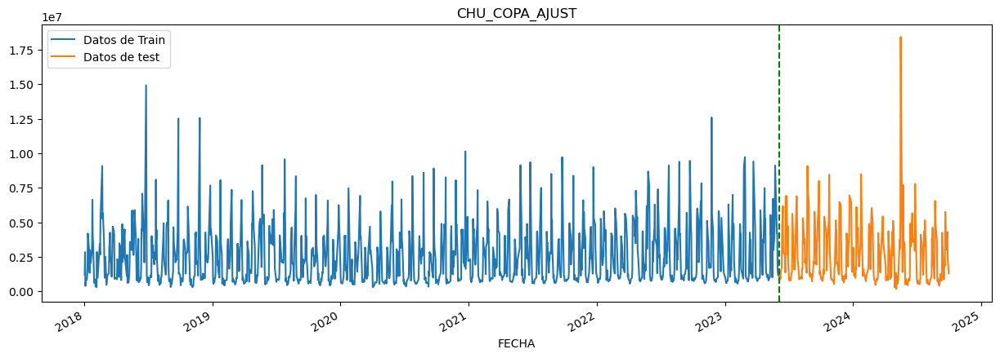

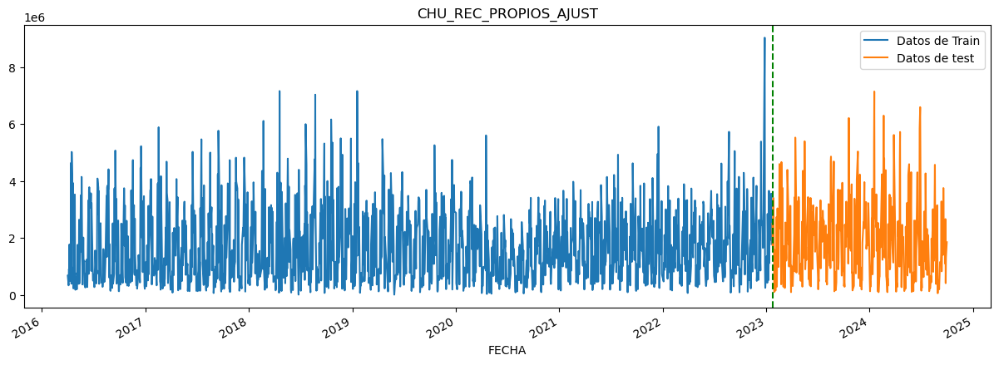

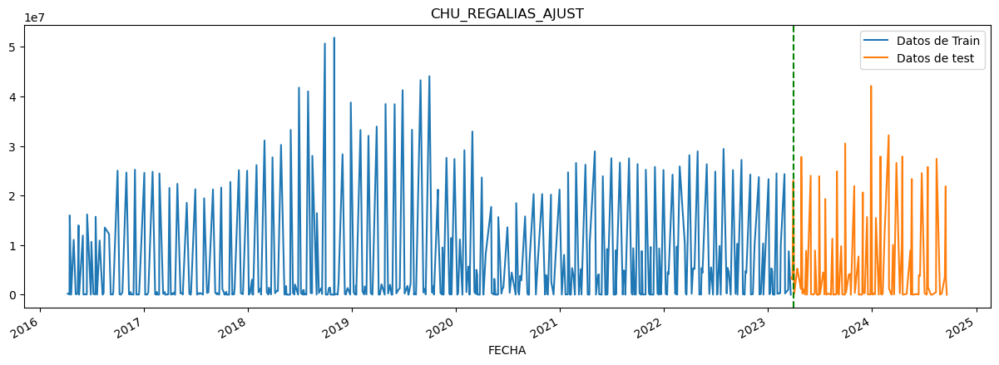

In [8]:
for i in range(len(dataframes)):
    # Separamos los datos en train y test
    fig, ax = plt.subplots(figsize=(15, 5))
    
    dataframes_train[i][titulos[i]].plot(ax=ax, label='Datos de Train', title=f'{titulos[i]}')
    dataframes_test[i][titulos[i]].plot(ax=ax, label='Datos de test')
    ax.axvline(f'{dataframes_test[i].index[i]}', color='green', ls='--')
    ax.legend(['Datos de Train', 'Datos de test'])
    plt.show()

In [9]:
FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
TARGET = 'CHU_COPA_AJUST'

In [10]:
X_train = dataframes_train[0][FEATURES]
y_train = dataframes_train[0][TARGET]

X_test = dataframes_test[0][FEATURES]
y_test = dataframes_test[0][TARGET]

In [9]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error



def objective(trial, df):
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),  # Reducido de 100 a 500
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),  # Reducido de 0.01 a 0.1
        "max_depth": trial.suggest_int("max_depth", 3, 7),  # Reducido de 3 a 7
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 5),  # Reducido de 1 a 5
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "gamma": trial.suggest_float("gamma", 0, 0.5),  # Reducido de 0 a 0.5
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 0.5),  # Regularización L1 más acotada
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 1.5),  # Regularización L2 más acotada
        "random_state": 42,
        "objective": "reg:squarederror",
        "early_stopping_rounds": 50,
    }

    test_size = 100
    tss = TimeSeriesSplit(n_splits=5, test_size=252, gap=1) # 252 son los dias habiles del año, gap=1 quiere decir que vamos salteando de a un dia.
    scores = []
    df = df.sort_index()
    
    for train_idx, val_idx in tss.split(df):
        train = df.iloc[train_idx]
        test = df.iloc[val_idx]

        FEATURES = ['dayofyear', 'dayofweek', 'quarter', 'month', 'year',
                    'lag1', 'lag2', 'lag3']
        TARGET = df.columns[0]

        # Verificar características y dropna
        # assert all(feature in train.columns for feature in FEATURES), "Faltan columnas en train"
        # assert all(feature in test.columns for feature in FEATURES), "Faltan columnas en test"

        X_train = train[FEATURES]
        y_train = train[TARGET]

        X_test = test[FEATURES]
        y_test = test[TARGET]

        # if X_train.empty or X_test.empty:
        #     raise ValueError("X_train o X_test está vacío después de dropna")

        model = xgb.XGBRegressor(**param)
        model.fit(
            X_train, y_train,
            eval_set=[(X_test, y_test)]
        )

        y_pred = model.predict(X_test)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        scores.append(rmse)

    return np.mean(scores)


In [10]:
# Ejecutar la optimización con Optuna
# df = dataframes_train[0].copy() ### ACACAACACACACACACACA
df = dataframes[0].copy() # ACA TORTUGA NINJA
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, df), n_trials=100)


copa_best_params = study.best_params
copa_rmse = study.best_value
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros para COPA:", study.best_params)
print("Mejor RMSE promedio para COPA:", study.best_value)

[I 2024-11-22 18:56:19,552] A new study created in memory with name: no-name-5bf6ca88-c13b-45c1-8621-75b1be05c542


[0]	validation_0-rmse:1723650.94101
[1]	validation_0-rmse:1688678.53632
[2]	validation_0-rmse:1652577.29057
[3]	validation_0-rmse:1620139.08260
[4]	validation_0-rmse:1598730.69444
[5]	validation_0-rmse:1577771.22277
[6]	validation_0-rmse:1553002.35170
[7]	validation_0-rmse:1540174.47766
[8]	validation_0-rmse:1523761.74495
[9]	validation_0-rmse:1516567.25877
[10]	validation_0-rmse:1503642.96477
[11]	validation_0-rmse:1493293.40917
[12]	validation_0-rmse:1486817.77104
[13]	validation_0-rmse:1478799.54250
[14]	validation_0-rmse:1474789.06203
[15]	validation_0-rmse:1471598.66047
[16]	validation_0-rmse:1464349.21760
[17]	validation_0-rmse:1463291.98478
[18]	validation_0-rmse:1457928.83455
[19]	validation_0-rmse:1453067.51588
[20]	validation_0-rmse:1448100.21165
[21]	validation_0-rmse:1446568.60425
[22]	validation_0-rmse:1445143.84156
[23]	validation_0-rmse:1441348.46591
[24]	validation_0-rmse:1438984.61683
[25]	validation_0-rmse:1435965.43390
[26]	validation_0-rmse:1431519.96895
[27]	valida

[I 2024-11-22 18:56:26,455] Trial 0 finished with value: 1580301.6251852883 and parameters: {'n_estimators': 439, 'learning_rate': 0.058493239237044595, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.9684293014215074, 'colsample_bytree': 0.9068655295711017, 'gamma': 0.24701879334095367, 'reg_alpha': 0.4587613752674632, 'reg_lambda': 0.7035139703285384}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1733785.28748
[1]	validation_0-rmse:1666054.10973
[2]	validation_0-rmse:1611603.32906
[3]	validation_0-rmse:1569480.78945
[4]	validation_0-rmse:1534358.14655
[5]	validation_0-rmse:1505710.87628
[6]	validation_0-rmse:1480971.58540
[7]	validation_0-rmse:1465335.12692
[8]	validation_0-rmse:1462905.91815
[9]	validation_0-rmse:1458033.63195
[10]	validation_0-rmse:1440744.54178
[11]	validation_0-rmse:1435646.34053
[12]	validation_0-rmse:1434823.74525
[13]	validation_0-rmse:1429217.45181
[14]	validation_0-rmse:1412438.32285
[15]	validation_0-rmse:1396397.04480
[16]	validation_0-rmse:1393673.32141
[17]	validation_0-rmse:1376864.04672
[18]	validation_0-rmse:1356816.26168
[19]	validation_0-rmse:1362309.57148
[20]	validation_0-rmse:1361355.17011
[21]	validation_0-rmse:1353023.60406
[22]	validation_0-rmse:1357632.06919
[23]	validation_0-rmse:1358460.05009
[24]	validation_0-rmse:1345134.94130
[25]	validation_0-rmse:1351548.87593
[26]	validation_0-rmse:1350910.18104
[27]	valida

[I 2024-11-22 18:56:30,184] Trial 1 finished with value: 1595597.21993102 and parameters: {'n_estimators': 127, 'learning_rate': 0.09441897231254842, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.6220481012560716, 'colsample_bytree': 0.8999821530764778, 'gamma': 0.3125360720386061, 'reg_alpha': 0.4357780973453112, 'reg_lambda': 1.4372674256142575}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1747454.11790
[1]	validation_0-rmse:1714617.02687
[2]	validation_0-rmse:1689446.05899
[3]	validation_0-rmse:1685720.12570
[4]	validation_0-rmse:1660671.40879
[5]	validation_0-rmse:1639980.23462
[6]	validation_0-rmse:1620711.66120
[7]	validation_0-rmse:1619794.97957
[8]	validation_0-rmse:1601040.21993
[9]	validation_0-rmse:1598656.50057
[10]	validation_0-rmse:1595167.90847
[11]	validation_0-rmse:1585475.45139
[12]	validation_0-rmse:1582297.88931
[13]	validation_0-rmse:1564619.93250
[14]	validation_0-rmse:1556274.51856
[15]	validation_0-rmse:1553192.93740
[16]	validation_0-rmse:1539123.34998
[17]	validation_0-rmse:1529858.04273
[18]	validation_0-rmse:1521283.54920
[19]	validation_0-rmse:1510741.75544
[20]	validation_0-rmse:1509340.77568
[21]	validation_0-rmse:1501035.85837
[22]	validation_0-rmse:1492710.30671
[23]	validation_0-rmse:1485648.68272
[24]	validation_0-rmse:1479096.48671
[25]	validation_0-rmse:1472037.03617
[26]	validation_0-rmse:1468828.52556
[27]	valida

[I 2024-11-22 18:56:36,366] Trial 2 finished with value: 1600147.197970638 and parameters: {'n_estimators': 311, 'learning_rate': 0.037514749383160705, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.693839954152744, 'colsample_bytree': 0.6356917916518866, 'gamma': 0.18445161501976892, 'reg_alpha': 0.1485683476104564, 'reg_lambda': 0.585497282252374}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1739270.07084
[1]	validation_0-rmse:1703364.51364
[2]	validation_0-rmse:1667807.27195
[3]	validation_0-rmse:1664304.26993
[4]	validation_0-rmse:1634266.60905
[5]	validation_0-rmse:1611272.26937
[6]	validation_0-rmse:1587719.59009
[7]	validation_0-rmse:1587773.11316
[8]	validation_0-rmse:1569007.53709
[9]	validation_0-rmse:1564111.52934
[10]	validation_0-rmse:1554084.49686
[11]	validation_0-rmse:1542859.06224
[12]	validation_0-rmse:1532383.72334
[13]	validation_0-rmse:1515799.65051
[14]	validation_0-rmse:1502599.14227
[15]	validation_0-rmse:1489799.19344
[16]	validation_0-rmse:1477195.26630
[17]	validation_0-rmse:1470113.27564
[18]	validation_0-rmse:1463912.32328
[19]	validation_0-rmse:1457411.19266
[20]	validation_0-rmse:1451357.02771
[21]	validation_0-rmse:1446349.19612
[22]	validation_0-rmse:1438705.38490
[23]	validation_0-rmse:1434259.76453
[24]	validation_0-rmse:1430252.43588
[25]	validation_0-rmse:1426788.26718
[26]	validation_0-rmse:1424425.56074
[27]	valida

[I 2024-11-22 18:56:39,446] Trial 3 finished with value: 1584752.4382873182 and parameters: {'n_estimators': 136, 'learning_rate': 0.04807705759134685, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.6196246609227645, 'colsample_bytree': 0.7301400813480854, 'gamma': 0.08349016203103582, 'reg_alpha': 0.1168340091110095, 'reg_lambda': 1.0658313149550267}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1758740.21008
[1]	validation_0-rmse:1747881.79396
[2]	validation_0-rmse:1738409.97598
[3]	validation_0-rmse:1729016.48597
[4]	validation_0-rmse:1720442.97391
[5]	validation_0-rmse:1711724.81293
[6]	validation_0-rmse:1704425.16517
[7]	validation_0-rmse:1697461.76543
[8]	validation_0-rmse:1690668.19535
[9]	validation_0-rmse:1688467.83213
[10]	validation_0-rmse:1680947.54936
[11]	validation_0-rmse:1673962.30294
[12]	validation_0-rmse:1668293.39389
[13]	validation_0-rmse:1660419.50902
[14]	validation_0-rmse:1652691.35990
[15]	validation_0-rmse:1646397.33603
[16]	validation_0-rmse:1640778.93857
[17]	validation_0-rmse:1633782.13246
[18]	validation_0-rmse:1629071.16814
[19]	validation_0-rmse:1624481.89561
[20]	validation_0-rmse:1622601.28064
[21]	validation_0-rmse:1618093.93368
[22]	validation_0-rmse:1613488.14884
[23]	validation_0-rmse:1609594.98100
[24]	validation_0-rmse:1604044.90077
[25]	validation_0-rmse:1597083.40875
[26]	validation_0-rmse:1593094.70568
[27]	valida

[I 2024-11-22 18:56:43,213] Trial 4 finished with value: 1680355.6589637534 and parameters: {'n_estimators': 132, 'learning_rate': 0.013414090302835345, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.9646505012745373, 'colsample_bytree': 0.9033936342032253, 'gamma': 0.04022197408975531, 'reg_alpha': 0.12336485837879047, 'reg_lambda': 0.9465541116679542}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1762986.81879
[1]	validation_0-rmse:1757216.77975
[2]	validation_0-rmse:1751788.15715
[3]	validation_0-rmse:1746491.19882
[4]	validation_0-rmse:1737562.84620
[5]	validation_0-rmse:1732832.76406
[6]	validation_0-rmse:1727923.32989
[7]	validation_0-rmse:1727201.70064
[8]	validation_0-rmse:1723058.27376
[9]	validation_0-rmse:1721499.22562
[10]	validation_0-rmse:1717758.74921
[11]	validation_0-rmse:1714426.85739
[12]	validation_0-rmse:1713058.11430
[13]	validation_0-rmse:1705024.45278
[14]	validation_0-rmse:1701323.94582
[15]	validation_0-rmse:1693596.66270
[16]	validation_0-rmse:1688588.38279
[17]	validation_0-rmse:1681432.74268
[18]	validation_0-rmse:1674052.90038
[19]	validation_0-rmse:1670416.91796
[20]	validation_0-rmse:1668945.73708
[21]	validation_0-rmse:1661855.97009
[22]	validation_0-rmse:1659111.65235
[23]	validation_0-rmse:1657069.40649
[24]	validation_0-rmse:1649669.08747
[25]	validation_0-rmse:1643400.40257
[26]	validation_0-rmse:1640950.32292
[27]	valida

[I 2024-11-22 18:56:52,998] Trial 5 finished with value: 1662499.9962172066 and parameters: {'n_estimators': 194, 'learning_rate': 0.013557799300957627, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.8205224505270446, 'colsample_bytree': 0.7962877161443997, 'gamma': 0.489590834277121, 'reg_alpha': 0.4791710041144495, 'reg_lambda': 1.2438314802718353}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1754294.69257
[1]	validation_0-rmse:1730588.87832
[2]	validation_0-rmse:1705921.04698
[3]	validation_0-rmse:1684930.36708
[4]	validation_0-rmse:1664925.51515
[5]	validation_0-rmse:1652855.03892
[6]	validation_0-rmse:1640234.51369
[7]	validation_0-rmse:1629990.96069
[8]	validation_0-rmse:1618137.96815
[9]	validation_0-rmse:1612479.19325
[10]	validation_0-rmse:1601910.33314
[11]	validation_0-rmse:1591773.62662
[12]	validation_0-rmse:1580627.11067
[13]	validation_0-rmse:1571173.68631
[14]	validation_0-rmse:1558213.54609
[15]	validation_0-rmse:1549434.87229
[16]	validation_0-rmse:1540803.02796
[17]	validation_0-rmse:1530259.94743
[18]	validation_0-rmse:1527409.37335
[19]	validation_0-rmse:1522762.22575
[20]	validation_0-rmse:1518355.37135
[21]	validation_0-rmse:1515559.85600
[22]	validation_0-rmse:1510870.75121
[23]	validation_0-rmse:1507751.61297
[24]	validation_0-rmse:1499100.65959
[25]	validation_0-rmse:1493249.14522
[26]	validation_0-rmse:1485090.13691
[27]	valida

[I 2024-11-22 18:57:01,002] Trial 6 finished with value: 1599742.6540385475 and parameters: {'n_estimators': 186, 'learning_rate': 0.03299412515407096, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.8934084500818547, 'colsample_bytree': 0.9641143473260614, 'gamma': 0.4058745808262767, 'reg_alpha': 0.3624987430349749, 'reg_lambda': 1.0553634179774725}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1761351.17204
[1]	validation_0-rmse:1754962.11988
[2]	validation_0-rmse:1748403.06405
[3]	validation_0-rmse:1742737.65544
[4]	validation_0-rmse:1733106.97904
[5]	validation_0-rmse:1727922.84282
[6]	validation_0-rmse:1723085.14548
[7]	validation_0-rmse:1722135.30278
[8]	validation_0-rmse:1716523.97255
[9]	validation_0-rmse:1713653.91416
[10]	validation_0-rmse:1708250.95861
[11]	validation_0-rmse:1704004.05097
[12]	validation_0-rmse:1702123.51191
[13]	validation_0-rmse:1697378.51438
[14]	validation_0-rmse:1693016.52972
[15]	validation_0-rmse:1685346.46842
[16]	validation_0-rmse:1681129.39998
[17]	validation_0-rmse:1673535.94669
[18]	validation_0-rmse:1670081.41058
[19]	validation_0-rmse:1667160.48707
[20]	validation_0-rmse:1659598.16413
[21]	validation_0-rmse:1656723.91718
[22]	validation_0-rmse:1654061.99541
[23]	validation_0-rmse:1651260.89308
[24]	validation_0-rmse:1642738.59979
[25]	validation_0-rmse:1636810.91379
[26]	validation_0-rmse:1635158.13776
[27]	valida

[I 2024-11-22 18:57:16,847] Trial 7 finished with value: 1651280.2243731003 and parameters: {'n_estimators': 241, 'learning_rate': 0.014524397492742378, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9302438398529763, 'colsample_bytree': 0.822423399722994, 'gamma': 0.017120224207037016, 'reg_alpha': 0.13656044369866271, 'reg_lambda': 1.1975630560330468}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1715802.76592
[1]	validation_0-rmse:1662036.12891
[2]	validation_0-rmse:1612489.94635
[3]	validation_0-rmse:1581442.82150
[4]	validation_0-rmse:1546830.29901
[5]	validation_0-rmse:1526379.67630
[6]	validation_0-rmse:1515556.39537
[7]	validation_0-rmse:1512211.70648
[8]	validation_0-rmse:1490820.91125
[9]	validation_0-rmse:1480110.62144
[10]	validation_0-rmse:1474000.74701
[11]	validation_0-rmse:1466013.38685
[12]	validation_0-rmse:1459083.54664
[13]	validation_0-rmse:1449404.11129
[14]	validation_0-rmse:1447289.17606
[15]	validation_0-rmse:1430389.52562
[16]	validation_0-rmse:1422042.27920
[17]	validation_0-rmse:1413787.05965
[18]	validation_0-rmse:1409910.36443
[19]	validation_0-rmse:1406253.61225
[20]	validation_0-rmse:1404214.60115
[21]	validation_0-rmse:1398608.96882
[22]	validation_0-rmse:1401365.48414
[23]	validation_0-rmse:1403007.15816
[24]	validation_0-rmse:1397377.02376
[25]	validation_0-rmse:1403318.87720
[26]	validation_0-rmse:1395289.46557
[27]	valida

[I 2024-11-22 18:57:23,326] Trial 8 finished with value: 1591212.9910173444 and parameters: {'n_estimators': 455, 'learning_rate': 0.09340043964336854, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.9582060414751048, 'colsample_bytree': 0.8658896930262417, 'gamma': 0.09226168147348501, 'reg_alpha': 0.24855405034220107, 'reg_lambda': 0.728648608943413}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1715897.84278
[1]	validation_0-rmse:1644415.24881
[2]	validation_0-rmse:1594812.52132
[3]	validation_0-rmse:1555069.45772
[4]	validation_0-rmse:1523707.17812
[5]	validation_0-rmse:1499629.51454
[6]	validation_0-rmse:1480960.11975
[7]	validation_0-rmse:1474585.58328
[8]	validation_0-rmse:1463259.07910
[9]	validation_0-rmse:1458000.93319
[10]	validation_0-rmse:1450560.71859
[11]	validation_0-rmse:1449215.64005
[12]	validation_0-rmse:1441178.04006
[13]	validation_0-rmse:1434180.78353
[14]	validation_0-rmse:1427979.81964
[15]	validation_0-rmse:1427899.94005
[16]	validation_0-rmse:1427121.88436
[17]	validation_0-rmse:1424032.92838
[18]	validation_0-rmse:1418759.39663
[19]	validation_0-rmse:1431682.49399
[20]	validation_0-rmse:1427993.79554
[21]	validation_0-rmse:1429266.79574
[22]	validation_0-rmse:1427323.54456
[23]	validation_0-rmse:1424391.64253
[24]	validation_0-rmse:1425841.84063
[25]	validation_0-rmse:1422351.74649
[26]	validation_0-rmse:1418956.17137
[27]	valida

[I 2024-11-22 18:57:25,795] Trial 9 finished with value: 1600231.0712677103 and parameters: {'n_estimators': 114, 'learning_rate': 0.08587818241376834, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.6271533992608201, 'colsample_bytree': 0.9425823075641022, 'gamma': 0.09931288531499116, 'reg_alpha': 0.07046985841828923, 'reg_lambda': 0.7150055817207434}. Best is trial 0 with value: 1580301.6251852883.


[0]	validation_0-rmse:1725688.80022
[1]	validation_0-rmse:1680056.35540
[2]	validation_0-rmse:1646228.84096
[3]	validation_0-rmse:1614550.55815
[4]	validation_0-rmse:1588393.49639
[5]	validation_0-rmse:1565317.17374
[6]	validation_0-rmse:1541197.86622
[7]	validation_0-rmse:1529945.28374
[8]	validation_0-rmse:1517404.18844
[9]	validation_0-rmse:1511729.02904
[10]	validation_0-rmse:1498960.53148
[11]	validation_0-rmse:1494297.08995
[12]	validation_0-rmse:1483689.06073
[13]	validation_0-rmse:1480021.66382
[14]	validation_0-rmse:1473884.68014
[15]	validation_0-rmse:1469260.01843
[16]	validation_0-rmse:1466272.62409
[17]	validation_0-rmse:1468306.44624
[18]	validation_0-rmse:1458588.50353
[19]	validation_0-rmse:1461190.94976
[20]	validation_0-rmse:1458172.70056
[21]	validation_0-rmse:1456931.43087
[22]	validation_0-rmse:1455305.15410
[23]	validation_0-rmse:1451108.32124
[24]	validation_0-rmse:1448216.00107
[25]	validation_0-rmse:1449493.20409
[26]	validation_0-rmse:1446482.16416
[27]	valida

[I 2024-11-22 18:57:32,387] Trial 10 finished with value: 1567751.9318491905 and parameters: {'n_estimators': 492, 'learning_rate': 0.0615801858655341, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.8342499732490867, 'colsample_bytree': 0.9913883641083353, 'gamma': 0.2579951408935763, 'reg_alpha': 0.324095861727739, 'reg_lambda': 0.5394293847248501}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1728501.25740
[1]	validation_0-rmse:1685529.29218
[2]	validation_0-rmse:1655349.07736
[3]	validation_0-rmse:1626316.79793
[4]	validation_0-rmse:1600567.14947
[5]	validation_0-rmse:1577655.58559
[6]	validation_0-rmse:1553785.79749
[7]	validation_0-rmse:1541933.38415
[8]	validation_0-rmse:1528744.61139
[9]	validation_0-rmse:1523388.73898
[10]	validation_0-rmse:1509876.14058
[11]	validation_0-rmse:1504287.94352
[12]	validation_0-rmse:1493041.66425
[13]	validation_0-rmse:1488663.32909
[14]	validation_0-rmse:1476656.12728
[15]	validation_0-rmse:1472179.27011
[16]	validation_0-rmse:1468821.56565
[17]	validation_0-rmse:1470065.83509
[18]	validation_0-rmse:1460476.28046
[19]	validation_0-rmse:1462430.39053
[20]	validation_0-rmse:1459491.78751
[21]	validation_0-rmse:1455569.09900
[22]	validation_0-rmse:1453055.37040
[23]	validation_0-rmse:1448753.23177
[24]	validation_0-rmse:1445872.97974
[25]	validation_0-rmse:1446262.12129
[26]	validation_0-rmse:1442813.11648
[27]	valida

[I 2024-11-22 18:57:41,664] Trial 11 finished with value: 1575362.7286968487 and parameters: {'n_estimators': 483, 'learning_rate': 0.05727865882474817, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.832570030299985, 'colsample_bytree': 0.9946400104800387, 'gamma': 0.2521493279008189, 'reg_alpha': 0.3448280554235057, 'reg_lambda': 0.5083772995601321}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1751538.15478
[1]	validation_0-rmse:1733820.08570
[2]	validation_0-rmse:1718579.47096
[3]	validation_0-rmse:1703514.96789
[4]	validation_0-rmse:1689584.97907
[5]	validation_0-rmse:1678457.33083
[6]	validation_0-rmse:1664188.22625
[7]	validation_0-rmse:1653471.38119
[8]	validation_0-rmse:1642538.94965
[9]	validation_0-rmse:1640606.64365
[10]	validation_0-rmse:1629091.40788
[11]	validation_0-rmse:1620879.02564
[12]	validation_0-rmse:1611734.14866
[13]	validation_0-rmse:1603497.74370
[14]	validation_0-rmse:1595222.77230
[15]	validation_0-rmse:1589306.69849
[16]	validation_0-rmse:1580752.46788
[17]	validation_0-rmse:1571324.57701
[18]	validation_0-rmse:1564506.76155
[19]	validation_0-rmse:1560293.88307
[20]	validation_0-rmse:1558945.14768
[21]	validation_0-rmse:1552251.65647
[22]	validation_0-rmse:1545105.34781
[23]	validation_0-rmse:1537833.37802
[24]	validation_0-rmse:1531214.61895
[25]	validation_0-rmse:1524283.34928
[26]	validation_0-rmse:1517118.35936
[27]	valida

[I 2024-11-22 18:58:00,161] Trial 12 finished with value: 1593078.670360554 and parameters: {'n_estimators': 496, 'learning_rate': 0.021917041391086762, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.8051622664292015, 'colsample_bytree': 0.9947685572216183, 'gamma': 0.3192622272286132, 'reg_alpha': 0.3165896927136704, 'reg_lambda': 0.5278958649077957}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1731669.48447
[1]	validation_0-rmse:1694498.49520
[2]	validation_0-rmse:1664682.65098
[3]	validation_0-rmse:1629981.12369
[4]	validation_0-rmse:1605369.06241
[5]	validation_0-rmse:1582566.02061
[6]	validation_0-rmse:1559980.67384
[7]	validation_0-rmse:1547997.65551
[8]	validation_0-rmse:1533847.76092
[9]	validation_0-rmse:1528820.45930
[10]	validation_0-rmse:1516258.53382
[11]	validation_0-rmse:1505672.13351
[12]	validation_0-rmse:1494976.55619
[13]	validation_0-rmse:1487287.64017
[14]	validation_0-rmse:1481779.51109
[15]	validation_0-rmse:1477267.94664
[16]	validation_0-rmse:1473527.37774
[17]	validation_0-rmse:1471371.73969
[18]	validation_0-rmse:1463841.20610
[19]	validation_0-rmse:1463020.30370
[20]	validation_0-rmse:1460203.02177
[21]	validation_0-rmse:1458838.95584
[22]	validation_0-rmse:1456269.04319
[23]	validation_0-rmse:1456550.30883
[24]	validation_0-rmse:1454113.20940
[25]	validation_0-rmse:1450415.67913
[26]	validation_0-rmse:1451110.53225
[27]	valida

[I 2024-11-22 18:58:09,130] Trial 13 finished with value: 1579481.286589464 and parameters: {'n_estimators': 372, 'learning_rate': 0.05527045740387372, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.865054660297153, 'colsample_bytree': 0.9836325651336226, 'gamma': 0.19421718791346917, 'reg_alpha': 0.25488366379959904, 'reg_lambda': 0.8588541528506516}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1722318.69173
[1]	validation_0-rmse:1673619.54789
[2]	validation_0-rmse:1643405.26097
[3]	validation_0-rmse:1638951.05367
[4]	validation_0-rmse:1606537.16171
[5]	validation_0-rmse:1580598.50863
[6]	validation_0-rmse:1555810.37297
[7]	validation_0-rmse:1555860.39755
[8]	validation_0-rmse:1531355.29140
[9]	validation_0-rmse:1524929.98303
[10]	validation_0-rmse:1513921.27957
[11]	validation_0-rmse:1503210.15469
[12]	validation_0-rmse:1488313.00943
[13]	validation_0-rmse:1472340.30821
[14]	validation_0-rmse:1462461.81860
[15]	validation_0-rmse:1455475.01097
[16]	validation_0-rmse:1447888.01889
[17]	validation_0-rmse:1439407.01429
[18]	validation_0-rmse:1437505.15334
[19]	validation_0-rmse:1431988.56983
[20]	validation_0-rmse:1427063.81677
[21]	validation_0-rmse:1421999.74036
[22]	validation_0-rmse:1418409.42929
[23]	validation_0-rmse:1413375.57955
[24]	validation_0-rmse:1402596.69872
[25]	validation_0-rmse:1401632.13934
[26]	validation_0-rmse:1393742.69499
[27]	valida

[I 2024-11-22 18:58:17,553] Trial 14 finished with value: 1570411.0502945615 and parameters: {'n_estimators': 389, 'learning_rate': 0.06395636066926921, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7574643726183045, 'colsample_bytree': 0.7280212493806597, 'gamma': 0.33532508791573584, 'reg_alpha': 0.3670039087664355, 'reg_lambda': 0.5077554575760487}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1718846.28656
[1]	validation_0-rmse:1667031.53121
[2]	validation_0-rmse:1632658.40670
[3]	validation_0-rmse:1626346.07935
[4]	validation_0-rmse:1589226.99678
[5]	validation_0-rmse:1563918.89032
[6]	validation_0-rmse:1542468.91565
[7]	validation_0-rmse:1541726.04850
[8]	validation_0-rmse:1518822.58860
[9]	validation_0-rmse:1512240.50430
[10]	validation_0-rmse:1505388.39090
[11]	validation_0-rmse:1495706.16001
[12]	validation_0-rmse:1474166.24820
[13]	validation_0-rmse:1459890.26555
[14]	validation_0-rmse:1451902.31753
[15]	validation_0-rmse:1445302.23105
[16]	validation_0-rmse:1436160.50739
[17]	validation_0-rmse:1428638.57436
[18]	validation_0-rmse:1427179.36373
[19]	validation_0-rmse:1430898.75274
[20]	validation_0-rmse:1425584.32235
[21]	validation_0-rmse:1420991.45912
[22]	validation_0-rmse:1418398.20555
[23]	validation_0-rmse:1411592.85334
[24]	validation_0-rmse:1409988.37657
[25]	validation_0-rmse:1410980.15780
[26]	validation_0-rmse:1403728.31953
[27]	valida

[I 2024-11-22 18:58:26,269] Trial 15 finished with value: 1585726.455677994 and parameters: {'n_estimators': 389, 'learning_rate': 0.07199075375845945, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7253976948419744, 'colsample_bytree': 0.7177339678379046, 'gamma': 0.37096017012045396, 'reg_alpha': 0.3930366541817897, 'reg_lambda': 0.8274054912472846}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1757800.26912
[1]	validation_0-rmse:1739407.76624
[2]	validation_0-rmse:1723248.84959
[3]	validation_0-rmse:1720722.47757
[4]	validation_0-rmse:1717103.73687
[5]	validation_0-rmse:1716892.62334
[6]	validation_0-rmse:1713834.58647
[7]	validation_0-rmse:1713380.65725
[8]	validation_0-rmse:1696724.89904
[9]	validation_0-rmse:1695703.48744
[10]	validation_0-rmse:1692754.80397
[11]	validation_0-rmse:1683564.00030
[12]	validation_0-rmse:1680428.07707
[13]	validation_0-rmse:1663661.66263
[14]	validation_0-rmse:1649470.71940
[15]	validation_0-rmse:1642377.37474
[16]	validation_0-rmse:1631253.86846
[17]	validation_0-rmse:1618058.46839
[18]	validation_0-rmse:1608327.37328
[19]	validation_0-rmse:1596150.42534
[20]	validation_0-rmse:1593568.18583
[21]	validation_0-rmse:1590681.93471
[22]	validation_0-rmse:1580005.90638
[23]	validation_0-rmse:1570357.52153
[24]	validation_0-rmse:1564875.83793
[25]	validation_0-rmse:1564263.48355
[26]	validation_0-rmse:1561725.51880
[27]	valida

[I 2024-11-22 18:58:41,934] Trial 16 finished with value: 1593129.7122919166 and parameters: {'n_estimators': 381, 'learning_rate': 0.02416484307241762, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7400662451759945, 'colsample_bytree': 0.6021972698566394, 'gamma': 0.44531316229306495, 'reg_alpha': 0.2538417272672129, 'reg_lambda': 0.6450063650564324}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1738772.60138
[1]	validation_0-rmse:1708063.14010
[2]	validation_0-rmse:1682705.80296
[3]	validation_0-rmse:1679256.95994
[4]	validation_0-rmse:1653659.01927
[5]	validation_0-rmse:1633373.21390
[6]	validation_0-rmse:1613204.24331
[7]	validation_0-rmse:1613186.92710
[8]	validation_0-rmse:1592302.69273
[9]	validation_0-rmse:1587764.21842
[10]	validation_0-rmse:1583762.51106
[11]	validation_0-rmse:1572163.19741
[12]	validation_0-rmse:1567940.44192
[13]	validation_0-rmse:1549826.44092
[14]	validation_0-rmse:1537904.60975
[15]	validation_0-rmse:1531926.19620
[16]	validation_0-rmse:1520731.08915
[17]	validation_0-rmse:1511371.79292
[18]	validation_0-rmse:1504147.10004
[19]	validation_0-rmse:1491647.72758
[20]	validation_0-rmse:1487205.24304
[21]	validation_0-rmse:1479088.48355
[22]	validation_0-rmse:1469089.44251
[23]	validation_0-rmse:1461444.14314
[24]	validation_0-rmse:1454811.84247
[25]	validation_0-rmse:1450264.23820
[26]	validation_0-rmse:1447148.60810
[27]	valida

[I 2024-11-22 18:58:54,859] Trial 17 finished with value: 1591604.0495786618 and parameters: {'n_estimators': 320, 'learning_rate': 0.04150215547071731, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7613315718786372, 'colsample_bytree': 0.7081718888161785, 'gamma': 0.32286604887255976, 'reg_alpha': 0.2814414133676186, 'reg_lambda': 0.8033267241752702}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1728260.91848
[1]	validation_0-rmse:1668711.31389
[2]	validation_0-rmse:1627711.39434
[3]	validation_0-rmse:1596348.38454
[4]	validation_0-rmse:1561740.99344
[5]	validation_0-rmse:1543084.68322
[6]	validation_0-rmse:1520987.86894
[7]	validation_0-rmse:1517750.40305
[8]	validation_0-rmse:1501612.36840
[9]	validation_0-rmse:1489329.63035
[10]	validation_0-rmse:1480277.22854
[11]	validation_0-rmse:1479072.39518
[12]	validation_0-rmse:1447925.11874
[13]	validation_0-rmse:1437681.88764
[14]	validation_0-rmse:1427322.86444
[15]	validation_0-rmse:1423798.87450
[16]	validation_0-rmse:1425281.03723
[17]	validation_0-rmse:1424943.95334
[18]	validation_0-rmse:1423446.57418
[19]	validation_0-rmse:1433061.50207
[20]	validation_0-rmse:1427812.08602
[21]	validation_0-rmse:1425380.08139
[22]	validation_0-rmse:1422817.56395
[23]	validation_0-rmse:1421056.09756
[24]	validation_0-rmse:1417382.29079
[25]	validation_0-rmse:1421748.29738
[26]	validation_0-rmse:1416620.94248
[27]	valida

[I 2024-11-22 18:59:01,418] Trial 18 finished with value: 1589914.8975310123 and parameters: {'n_estimators': 427, 'learning_rate': 0.07227988338914444, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.6807570254866946, 'colsample_bytree': 0.7581426700496092, 'gamma': 0.24333155680385804, 'reg_alpha': 0.19571459179813283, 'reg_lambda': 0.5821205017322648}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1751430.85530
[1]	validation_0-rmse:1732851.77256
[2]	validation_0-rmse:1715038.40652
[3]	validation_0-rmse:1714159.59964
[4]	validation_0-rmse:1698215.32971
[5]	validation_0-rmse:1684212.12348
[6]	validation_0-rmse:1668786.39356
[7]	validation_0-rmse:1668672.29536
[8]	validation_0-rmse:1653868.48539
[9]	validation_0-rmse:1651620.47361
[10]	validation_0-rmse:1649906.32126
[11]	validation_0-rmse:1639337.37330
[12]	validation_0-rmse:1636954.45923
[13]	validation_0-rmse:1624943.54152
[14]	validation_0-rmse:1613019.07400
[15]	validation_0-rmse:1609821.00580
[16]	validation_0-rmse:1598540.93396
[17]	validation_0-rmse:1587174.30501
[18]	validation_0-rmse:1578804.52660
[19]	validation_0-rmse:1568993.91658
[20]	validation_0-rmse:1567487.42705
[21]	validation_0-rmse:1559305.68781
[22]	validation_0-rmse:1550042.15148
[23]	validation_0-rmse:1541759.64767
[24]	validation_0-rmse:1532932.32521
[25]	validation_0-rmse:1524870.92480
[26]	validation_0-rmse:1522969.07916
[27]	valida

[I 2024-11-22 18:59:14,048] Trial 19 finished with value: 1608543.567066806 and parameters: {'n_estimators': 352, 'learning_rate': 0.026028759859865597, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.7757589779783834, 'colsample_bytree': 0.6685604738103382, 'gamma': 0.17388281648808945, 'reg_alpha': 0.008145252567093642, 'reg_lambda': 1.4838255796083786}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1739499.16982
[1]	validation_0-rmse:1695940.63592
[2]	validation_0-rmse:1653208.17843
[3]	validation_0-rmse:1621540.22912
[4]	validation_0-rmse:1594843.42983
[5]	validation_0-rmse:1570135.41109
[6]	validation_0-rmse:1548790.50690
[7]	validation_0-rmse:1547569.95261
[8]	validation_0-rmse:1529211.12905
[9]	validation_0-rmse:1521343.92458
[10]	validation_0-rmse:1508755.72700
[11]	validation_0-rmse:1498427.60238
[12]	validation_0-rmse:1492025.50049
[13]	validation_0-rmse:1482047.07751
[14]	validation_0-rmse:1476035.35596
[15]	validation_0-rmse:1467849.18017
[16]	validation_0-rmse:1457312.55184
[17]	validation_0-rmse:1448007.27350
[18]	validation_0-rmse:1444727.77773
[19]	validation_0-rmse:1442964.10208
[20]	validation_0-rmse:1436914.86568
[21]	validation_0-rmse:1436901.98280
[22]	validation_0-rmse:1435890.94557
[23]	validation_0-rmse:1433936.52363
[24]	validation_0-rmse:1429941.25057
[25]	validation_0-rmse:1428170.58630
[26]	validation_0-rmse:1420015.79468
[27]	valida

[I 2024-11-22 18:59:23,080] Trial 20 finished with value: 1571811.173847035 and parameters: {'n_estimators': 272, 'learning_rate': 0.0686116530492456, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8753121414305667, 'colsample_bytree': 0.8287411684968387, 'gamma': 0.3878685023280276, 'reg_alpha': 0.4096639350750313, 'reg_lambda': 0.9578491735507668}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1738380.96007
[1]	validation_0-rmse:1707730.61709
[2]	validation_0-rmse:1662447.92851
[3]	validation_0-rmse:1629448.46606
[4]	validation_0-rmse:1601192.32506
[5]	validation_0-rmse:1572456.29953
[6]	validation_0-rmse:1550357.56524
[7]	validation_0-rmse:1548633.69273
[8]	validation_0-rmse:1529866.31737
[9]	validation_0-rmse:1521917.26538
[10]	validation_0-rmse:1505285.68806
[11]	validation_0-rmse:1497808.80268
[12]	validation_0-rmse:1491723.59556
[13]	validation_0-rmse:1482393.39024
[14]	validation_0-rmse:1473530.91904
[15]	validation_0-rmse:1465009.35775
[16]	validation_0-rmse:1454502.44847
[17]	validation_0-rmse:1449728.87414
[18]	validation_0-rmse:1446757.40990
[19]	validation_0-rmse:1443991.58212
[20]	validation_0-rmse:1438089.15058
[21]	validation_0-rmse:1437736.30868
[22]	validation_0-rmse:1437892.08445
[23]	validation_0-rmse:1433326.28842
[24]	validation_0-rmse:1424916.05476
[25]	validation_0-rmse:1423535.48262
[26]	validation_0-rmse:1414791.70646
[27]	valida

[I 2024-11-22 18:59:30,575] Trial 21 finished with value: 1575053.7178530288 and parameters: {'n_estimators': 268, 'learning_rate': 0.07143778261960465, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.870341196271115, 'colsample_bytree': 0.8227066638022118, 'gamma': 0.37163509686709206, 'reg_alpha': 0.41074972312536806, 'reg_lambda': 0.9315061703237533}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1749703.88365
[1]	validation_0-rmse:1718443.65559
[2]	validation_0-rmse:1686194.80617
[3]	validation_0-rmse:1665889.96721
[4]	validation_0-rmse:1643048.71691
[5]	validation_0-rmse:1625260.82348
[6]	validation_0-rmse:1605164.37540
[7]	validation_0-rmse:1603559.80091
[8]	validation_0-rmse:1583998.92308
[9]	validation_0-rmse:1578517.82306
[10]	validation_0-rmse:1562066.53684
[11]	validation_0-rmse:1549661.14532
[12]	validation_0-rmse:1544716.60511
[13]	validation_0-rmse:1534914.65985
[14]	validation_0-rmse:1523669.96758
[15]	validation_0-rmse:1513149.68989
[16]	validation_0-rmse:1505374.76277
[17]	validation_0-rmse:1497216.83320
[18]	validation_0-rmse:1490892.42593
[19]	validation_0-rmse:1482996.73009
[20]	validation_0-rmse:1475117.91498
[21]	validation_0-rmse:1470666.38684
[22]	validation_0-rmse:1466718.60381
[23]	validation_0-rmse:1463272.36231
[24]	validation_0-rmse:1458112.13499
[25]	validation_0-rmse:1453330.67504
[26]	validation_0-rmse:1449748.45482
[27]	valida

[I 2024-11-22 18:59:39,990] Trial 22 finished with value: 1579232.9269794829 and parameters: {'n_estimators': 266, 'learning_rate': 0.04814130411913754, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.9063007469102387, 'colsample_bytree': 0.7656802131157052, 'gamma': 0.29063057277678184, 'reg_alpha': 0.31723576662107156, 'reg_lambda': 1.302222726461495}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1727070.73386
[1]	validation_0-rmse:1682969.82445
[2]	validation_0-rmse:1648329.46394
[3]	validation_0-rmse:1616767.31568
[4]	validation_0-rmse:1589663.15353
[5]	validation_0-rmse:1567244.73288
[6]	validation_0-rmse:1543539.27065
[7]	validation_0-rmse:1543521.75820
[8]	validation_0-rmse:1527825.35536
[9]	validation_0-rmse:1521851.65055
[10]	validation_0-rmse:1507321.82913
[11]	validation_0-rmse:1501498.90371
[12]	validation_0-rmse:1496213.34829
[13]	validation_0-rmse:1489037.73676
[14]	validation_0-rmse:1481616.56063
[15]	validation_0-rmse:1475958.37697
[16]	validation_0-rmse:1471632.65293
[17]	validation_0-rmse:1467082.93953
[18]	validation_0-rmse:1458562.18929
[19]	validation_0-rmse:1458980.37378
[20]	validation_0-rmse:1455880.63528
[21]	validation_0-rmse:1452285.50766
[22]	validation_0-rmse:1449796.92158
[23]	validation_0-rmse:1450165.56265
[24]	validation_0-rmse:1446821.69469
[25]	validation_0-rmse:1445739.23239
[26]	validation_0-rmse:1439263.84054
[27]	valida

[I 2024-11-22 18:59:47,549] Trial 23 finished with value: 1582302.48230321 and parameters: {'n_estimators': 406, 'learning_rate': 0.06476105800225443, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.8411748150043573, 'colsample_bytree': 0.858953803792344, 'gamma': 0.37527199323693916, 'reg_alpha': 0.38856512317433534, 'reg_lambda': 0.6276176095119775}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1744367.11422
[1]	validation_0-rmse:1713358.10474
[2]	validation_0-rmse:1686300.68627
[3]	validation_0-rmse:1682629.91023
[4]	validation_0-rmse:1655693.37317
[5]	validation_0-rmse:1636875.58007
[6]	validation_0-rmse:1613183.34825
[7]	validation_0-rmse:1613036.58299
[8]	validation_0-rmse:1595555.14388
[9]	validation_0-rmse:1589105.96263
[10]	validation_0-rmse:1583284.02487
[11]	validation_0-rmse:1569411.35444
[12]	validation_0-rmse:1565425.72092
[13]	validation_0-rmse:1548272.72484
[14]	validation_0-rmse:1532152.21495
[15]	validation_0-rmse:1524166.70989
[16]	validation_0-rmse:1508924.75905
[17]	validation_0-rmse:1497240.39441
[18]	validation_0-rmse:1490959.76388
[19]	validation_0-rmse:1490203.92882
[20]	validation_0-rmse:1485726.32756
[21]	validation_0-rmse:1477645.43755
[22]	validation_0-rmse:1468189.98702
[23]	validation_0-rmse:1461283.25507
[24]	validation_0-rmse:1454371.44408
[25]	validation_0-rmse:1447392.44469
[26]	validation_0-rmse:1440916.11365
[27]	valida

[I 2024-11-22 18:59:54,370] Trial 24 finished with value: 1589965.0693543672 and parameters: {'n_estimators': 340, 'learning_rate': 0.04375258461028521, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.7915550805832626, 'colsample_bytree': 0.6704942563048419, 'gamma': 0.42712755082197484, 'reg_alpha': 0.4991343046868765, 'reg_lambda': 1.0891619294409833}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1734830.85770
[1]	validation_0-rmse:1685305.96046
[2]	validation_0-rmse:1650479.90375
[3]	validation_0-rmse:1616445.13676
[4]	validation_0-rmse:1586487.63131
[5]	validation_0-rmse:1563035.63662
[6]	validation_0-rmse:1540372.60357
[7]	validation_0-rmse:1538587.18773
[8]	validation_0-rmse:1521112.06337
[9]	validation_0-rmse:1512646.91055
[10]	validation_0-rmse:1496074.37286
[11]	validation_0-rmse:1490284.46605
[12]	validation_0-rmse:1484466.25823
[13]	validation_0-rmse:1473651.43146
[14]	validation_0-rmse:1466579.04751
[15]	validation_0-rmse:1458849.30799
[16]	validation_0-rmse:1447947.49341
[17]	validation_0-rmse:1443627.74702
[18]	validation_0-rmse:1438950.84466
[19]	validation_0-rmse:1428719.08022
[20]	validation_0-rmse:1423143.23272
[21]	validation_0-rmse:1421466.45625
[22]	validation_0-rmse:1424361.50926
[23]	validation_0-rmse:1419575.26829
[24]	validation_0-rmse:1417341.13066
[25]	validation_0-rmse:1412820.78509
[26]	validation_0-rmse:1410515.01233
[27]	valida

[I 2024-11-22 19:00:00,778] Trial 25 finished with value: 1577759.7277168182 and parameters: {'n_estimators': 472, 'learning_rate': 0.08062378126108137, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8680421683507147, 'colsample_bytree': 0.7669024009585547, 'gamma': 0.49023355211061825, 'reg_alpha': 0.4307030666452976, 'reg_lambda': 0.7785893615439479}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1762261.58770
[1]	validation_0-rmse:1754693.31868
[2]	validation_0-rmse:1746710.99655
[3]	validation_0-rmse:1745474.78608
[4]	validation_0-rmse:1737698.70983
[5]	validation_0-rmse:1730931.19457
[6]	validation_0-rmse:1723400.23558
[7]	validation_0-rmse:1723255.47746
[8]	validation_0-rmse:1716382.69370
[9]	validation_0-rmse:1715554.01823
[10]	validation_0-rmse:1714754.48289
[11]	validation_0-rmse:1707784.00476
[12]	validation_0-rmse:1706925.46195
[13]	validation_0-rmse:1700183.98145
[14]	validation_0-rmse:1694311.72479
[15]	validation_0-rmse:1692985.52627
[16]	validation_0-rmse:1687485.00789
[17]	validation_0-rmse:1681014.07304
[18]	validation_0-rmse:1675977.49582
[19]	validation_0-rmse:1670934.99160
[20]	validation_0-rmse:1670607.75213
[21]	validation_0-rmse:1664816.76134
[22]	validation_0-rmse:1659433.01139
[23]	validation_0-rmse:1654445.86183
[24]	validation_0-rmse:1648296.66815
[25]	validation_0-rmse:1642161.64453
[26]	validation_0-rmse:1641101.67504
[27]	valida

[I 2024-11-22 19:00:12,094] Trial 26 finished with value: 1656344.5821232412 and parameters: {'n_estimators': 281, 'learning_rate': 0.01046296075593479, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.923963308914646, 'colsample_bytree': 0.6789496736618718, 'gamma': 0.2790166063903402, 'reg_alpha': 0.3534944294995909, 'reg_lambda': 0.6544478042436124}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1751056.55261
[1]	validation_0-rmse:1726323.49406
[2]	validation_0-rmse:1705829.79931
[3]	validation_0-rmse:1679113.82191
[4]	validation_0-rmse:1659107.86093
[5]	validation_0-rmse:1642309.63928
[6]	validation_0-rmse:1623693.94215
[7]	validation_0-rmse:1614040.30888
[8]	validation_0-rmse:1597388.84075
[9]	validation_0-rmse:1593959.95819
[10]	validation_0-rmse:1582268.25429
[11]	validation_0-rmse:1576001.35700
[12]	validation_0-rmse:1562237.84602
[13]	validation_0-rmse:1549030.22824
[14]	validation_0-rmse:1537792.71171
[15]	validation_0-rmse:1528326.04260
[16]	validation_0-rmse:1519677.23027
[17]	validation_0-rmse:1509759.90881
[18]	validation_0-rmse:1502870.30488
[19]	validation_0-rmse:1493383.97797
[20]	validation_0-rmse:1489233.81422
[21]	validation_0-rmse:1481061.56791
[22]	validation_0-rmse:1472606.39521
[23]	validation_0-rmse:1466079.54262
[24]	validation_0-rmse:1460405.97044
[25]	validation_0-rmse:1454885.24299
[26]	validation_0-rmse:1450772.32922
[27]	valida

[I 2024-11-22 19:00:20,284] Trial 27 finished with value: 1606708.5560028714 and parameters: {'n_estimators': 234, 'learning_rate': 0.031474452612302715, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.7100925183556006, 'colsample_bytree': 0.9363128516341732, 'gamma': 0.3663442368393257, 'reg_alpha': 0.30647437632807123, 'reg_lambda': 0.5002070321801264}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1730979.43852
[1]	validation_0-rmse:1693598.28069
[2]	validation_0-rmse:1659994.04978
[3]	validation_0-rmse:1634922.51377
[4]	validation_0-rmse:1609968.75777
[5]	validation_0-rmse:1590421.88787
[6]	validation_0-rmse:1566095.60347
[7]	validation_0-rmse:1564898.37717
[8]	validation_0-rmse:1547060.42227
[9]	validation_0-rmse:1541740.23297
[10]	validation_0-rmse:1525185.70777
[11]	validation_0-rmse:1518173.83005
[12]	validation_0-rmse:1509219.44213
[13]	validation_0-rmse:1497813.75713
[14]	validation_0-rmse:1488539.10774
[15]	validation_0-rmse:1476497.16748
[16]	validation_0-rmse:1469163.87013
[17]	validation_0-rmse:1463024.32602
[18]	validation_0-rmse:1456360.94707
[19]	validation_0-rmse:1450797.10223
[20]	validation_0-rmse:1446089.41297
[21]	validation_0-rmse:1445290.77059
[22]	validation_0-rmse:1440815.75028
[23]	validation_0-rmse:1435828.44565
[24]	validation_0-rmse:1428368.76976
[25]	validation_0-rmse:1427477.64655
[26]	validation_0-rmse:1423036.32665
[27]	valida

[I 2024-11-22 19:00:29,552] Trial 28 finished with value: 1576207.5459545858 and parameters: {'n_estimators': 416, 'learning_rate': 0.05349334193083544, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.7562422877496858, 'colsample_bytree': 0.8484780923566014, 'gamma': 0.21289658030323877, 'reg_alpha': 0.2164952839399178, 'reg_lambda': 0.9110111721319332}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1729490.44695
[1]	validation_0-rmse:1688270.22191
[2]	validation_0-rmse:1649326.57151
[3]	validation_0-rmse:1621371.97348
[4]	validation_0-rmse:1595402.25088
[5]	validation_0-rmse:1573820.21028
[6]	validation_0-rmse:1549395.88336
[7]	validation_0-rmse:1547805.68876
[8]	validation_0-rmse:1528736.11775
[9]	validation_0-rmse:1523921.77655
[10]	validation_0-rmse:1509548.89208
[11]	validation_0-rmse:1501964.58969
[12]	validation_0-rmse:1497457.17677
[13]	validation_0-rmse:1488400.10120
[14]	validation_0-rmse:1480629.02820
[15]	validation_0-rmse:1467147.98285
[16]	validation_0-rmse:1464731.50467
[17]	validation_0-rmse:1462313.77676
[18]	validation_0-rmse:1454427.40009
[19]	validation_0-rmse:1455906.99756
[20]	validation_0-rmse:1449570.79150
[21]	validation_0-rmse:1447023.72707
[22]	validation_0-rmse:1445611.48861
[23]	validation_0-rmse:1445086.98444
[24]	validation_0-rmse:1442017.10343
[25]	validation_0-rmse:1442184.96304
[26]	validation_0-rmse:1438450.51051
[27]	valida

[I 2024-11-22 19:00:36,616] Trial 29 finished with value: 1575425.939313658 and parameters: {'n_estimators': 447, 'learning_rate': 0.06186870838359475, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.7944722018637197, 'colsample_bytree': 0.79197415239354, 'gamma': 0.3416828610124813, 'reg_alpha': 0.4565938303349908, 'reg_lambda': 1.3660811382467204}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1747846.84505
[1]	validation_0-rmse:1717401.08720
[2]	validation_0-rmse:1691203.49898
[3]	validation_0-rmse:1666725.32924
[4]	validation_0-rmse:1644100.63507
[5]	validation_0-rmse:1625974.53318
[6]	validation_0-rmse:1607579.42242
[7]	validation_0-rmse:1598227.70154
[8]	validation_0-rmse:1584040.90976
[9]	validation_0-rmse:1581641.41901
[10]	validation_0-rmse:1570531.68186
[11]	validation_0-rmse:1560673.19868
[12]	validation_0-rmse:1546800.37119
[13]	validation_0-rmse:1534951.03771
[14]	validation_0-rmse:1528680.29035
[15]	validation_0-rmse:1525181.81904
[16]	validation_0-rmse:1516366.62360
[17]	validation_0-rmse:1511452.77806
[18]	validation_0-rmse:1505275.99718
[19]	validation_0-rmse:1497521.41256
[20]	validation_0-rmse:1495120.90009
[21]	validation_0-rmse:1488826.60377
[22]	validation_0-rmse:1483832.44872
[23]	validation_0-rmse:1477687.21094
[24]	validation_0-rmse:1475405.95433
[25]	validation_0-rmse:1469168.68922
[26]	validation_0-rmse:1465200.21625
[27]	valida

[I 2024-11-22 19:00:44,779] Trial 30 finished with value: 1592705.6625816498 and parameters: {'n_estimators': 346, 'learning_rate': 0.03640237003645855, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6519191593215581, 'colsample_bytree': 0.9290031656520535, 'gamma': 0.1455509390232394, 'reg_alpha': 0.3777944302555595, 'reg_lambda': 0.7528362293374377}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1737888.39348
[1]	validation_0-rmse:1691703.72161
[2]	validation_0-rmse:1647256.03613
[3]	validation_0-rmse:1615679.05939
[4]	validation_0-rmse:1587755.49608
[5]	validation_0-rmse:1563814.32146
[6]	validation_0-rmse:1542627.05255
[7]	validation_0-rmse:1538665.38054
[8]	validation_0-rmse:1521589.94200
[9]	validation_0-rmse:1513624.74112
[10]	validation_0-rmse:1500778.01944
[11]	validation_0-rmse:1494173.24900
[12]	validation_0-rmse:1488167.68006
[13]	validation_0-rmse:1476840.09921
[14]	validation_0-rmse:1468996.99659
[15]	validation_0-rmse:1460052.21906
[16]	validation_0-rmse:1449790.14306
[17]	validation_0-rmse:1445162.79719
[18]	validation_0-rmse:1437021.36343
[19]	validation_0-rmse:1433296.90241
[20]	validation_0-rmse:1428917.42793
[21]	validation_0-rmse:1426962.80127
[22]	validation_0-rmse:1427580.58157
[23]	validation_0-rmse:1426487.10323
[24]	validation_0-rmse:1419327.68742
[25]	validation_0-rmse:1418783.86744
[26]	validation_0-rmse:1414709.82285
[27]	valida

[I 2024-11-22 19:00:55,588] Trial 31 finished with value: 1569846.3292640937 and parameters: {'n_estimators': 272, 'learning_rate': 0.0734153332124095, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8574849435302917, 'colsample_bytree': 0.8171343391205752, 'gamma': 0.39950326091068356, 'reg_alpha': 0.42104931519408717, 'reg_lambda': 0.9732961989765502}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1740476.76622
[1]	validation_0-rmse:1717387.76705
[2]	validation_0-rmse:1700493.11654
[3]	validation_0-rmse:1687852.76167
[4]	validation_0-rmse:1679027.80318
[5]	validation_0-rmse:1673826.32020
[6]	validation_0-rmse:1672047.46899
[7]	validation_0-rmse:1670728.68946
[8]	validation_0-rmse:1670739.05558
[9]	validation_0-rmse:1663749.19929
[10]	validation_0-rmse:1667290.59021
[11]	validation_0-rmse:1672860.63552
[12]	validation_0-rmse:1667286.17376
[13]	validation_0-rmse:1673383.38064
[14]	validation_0-rmse:1680337.24209
[15]	validation_0-rmse:1670311.60760
[16]	validation_0-rmse:1662330.05078
[17]	validation_0-rmse:1671443.28080
[18]	validation_0-rmse:1665312.69636
[19]	validation_0-rmse:1677772.38102
[20]	validation_0-rmse:1673654.71728
[21]	validation_0-rmse:1658290.17374
[22]	validation_0-rmse:1652578.48936
[23]	validation_0-rmse:1649466.83376
[24]	validation_0-rmse:1643360.00757
[25]	validation_0-rmse:1634125.39986
[26]	validation_0-rmse:1628941.99064
[27]	valida

[I 2024-11-22 19:01:05,965] Trial 32 finished with value: 1594718.0308436605 and parameters: {'n_estimators': 230, 'learning_rate': 0.07366350899581077, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.996523305822137, 'colsample_bytree': 0.872389188645323, 'gamma': 0.45031518187972086, 'reg_alpha': 0.42636172615773293, 'reg_lambda': 1.0014704700593586}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1728470.30239
[1]	validation_0-rmse:1668439.62096
[2]	validation_0-rmse:1613716.97020
[3]	validation_0-rmse:1577596.43146
[4]	validation_0-rmse:1549415.74635
[5]	validation_0-rmse:1529265.51004
[6]	validation_0-rmse:1505879.08770
[7]	validation_0-rmse:1503802.92970
[8]	validation_0-rmse:1490849.81051
[9]	validation_0-rmse:1482583.24128
[10]	validation_0-rmse:1473563.60170
[11]	validation_0-rmse:1474095.82476
[12]	validation_0-rmse:1467762.91603
[13]	validation_0-rmse:1454315.04831
[14]	validation_0-rmse:1448062.62668
[15]	validation_0-rmse:1442684.34840
[16]	validation_0-rmse:1430191.35904
[17]	validation_0-rmse:1423335.42677
[18]	validation_0-rmse:1418091.68681
[19]	validation_0-rmse:1418449.68457
[20]	validation_0-rmse:1416781.73686
[21]	validation_0-rmse:1417483.31604
[22]	validation_0-rmse:1420745.95293
[23]	validation_0-rmse:1417363.08334
[24]	validation_0-rmse:1412334.33765
[25]	validation_0-rmse:1414613.57996
[26]	validation_0-rmse:1403948.27815
[27]	valida

[I 2024-11-22 19:01:12,929] Trial 33 finished with value: 1578615.5699738506 and parameters: {'n_estimators': 306, 'learning_rate': 0.09932423403392932, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8409764137607131, 'colsample_bytree': 0.830544810805321, 'gamma': 0.3957707659804674, 'reg_alpha': 0.4627971892609828, 'reg_lambda': 1.1476327497883188}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1729548.59924
[1]	validation_0-rmse:1677962.61904
[2]	validation_0-rmse:1639198.67764
[3]	validation_0-rmse:1636132.59886
[4]	validation_0-rmse:1594496.19626
[5]	validation_0-rmse:1568071.10150
[6]	validation_0-rmse:1539536.06832
[7]	validation_0-rmse:1539085.21730
[8]	validation_0-rmse:1521239.47891
[9]	validation_0-rmse:1513762.92929
[10]	validation_0-rmse:1505448.13237
[11]	validation_0-rmse:1489770.82905
[12]	validation_0-rmse:1483450.78839
[13]	validation_0-rmse:1473132.18511
[14]	validation_0-rmse:1467082.09155
[15]	validation_0-rmse:1464041.16946
[16]	validation_0-rmse:1459803.98187
[17]	validation_0-rmse:1451256.13434
[18]	validation_0-rmse:1451874.68949
[19]	validation_0-rmse:1456339.23730
[20]	validation_0-rmse:1456599.39171
[21]	validation_0-rmse:1456797.35160
[22]	validation_0-rmse:1454292.76840
[23]	validation_0-rmse:1446526.16671
[24]	validation_0-rmse:1449089.89572
[25]	validation_0-rmse:1448755.39405
[26]	validation_0-rmse:1448257.44908
[27]	valida

[I 2024-11-22 19:01:16,924] Trial 34 finished with value: 1594997.7479745417 and parameters: {'n_estimators': 182, 'learning_rate': 0.08316687583418457, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.8910016996049759, 'colsample_bytree': 0.7392403356794178, 'gamma': 0.2854658933291206, 'reg_alpha': 0.34020778577476474, 'reg_lambda': 0.567315213036269}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1747331.78021
[1]	validation_0-rmse:1720247.52987
[2]	validation_0-rmse:1689216.48053
[3]	validation_0-rmse:1651217.04608
[4]	validation_0-rmse:1625635.05327
[5]	validation_0-rmse:1610684.28122
[6]	validation_0-rmse:1584385.07096
[7]	validation_0-rmse:1574689.32553
[8]	validation_0-rmse:1555446.94700
[9]	validation_0-rmse:1550226.23058
[10]	validation_0-rmse:1534542.33816
[11]	validation_0-rmse:1528115.46006
[12]	validation_0-rmse:1520080.24294
[13]	validation_0-rmse:1509596.07832
[14]	validation_0-rmse:1497484.69099
[15]	validation_0-rmse:1490571.72990
[16]	validation_0-rmse:1477925.29449
[17]	validation_0-rmse:1468214.99843
[18]	validation_0-rmse:1462835.13586
[19]	validation_0-rmse:1461501.03877
[20]	validation_0-rmse:1456618.34407
[21]	validation_0-rmse:1451341.34049
[22]	validation_0-rmse:1447871.64781
[23]	validation_0-rmse:1443737.02586
[24]	validation_0-rmse:1437789.37629
[25]	validation_0-rmse:1434883.77134
[26]	validation_0-rmse:1432282.06785
[27]	valida

[I 2024-11-22 19:01:27,266] Trial 35 finished with value: 1581689.9608415996 and parameters: {'n_estimators': 287, 'learning_rate': 0.05098108002877981, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.8207014042549228, 'colsample_bytree': 0.8889403861408689, 'gamma': 0.34023178736573234, 'reg_alpha': 0.40836797356584037, 'reg_lambda': 0.8776249084275618}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1744813.04381
[1]	validation_0-rmse:1722621.95098
[2]	validation_0-rmse:1706058.09121
[3]	validation_0-rmse:1692703.19314
[4]	validation_0-rmse:1653404.80485
[5]	validation_0-rmse:1645808.37374
[6]	validation_0-rmse:1640263.45677
[7]	validation_0-rmse:1636334.36995
[8]	validation_0-rmse:1635856.50275
[9]	validation_0-rmse:1629499.44581
[10]	validation_0-rmse:1630114.85949
[11]	validation_0-rmse:1633143.37059
[12]	validation_0-rmse:1628015.40404
[13]	validation_0-rmse:1609913.76096
[14]	validation_0-rmse:1599031.75548
[15]	validation_0-rmse:1592236.61180
[16]	validation_0-rmse:1590276.29518
[17]	validation_0-rmse:1560421.91412
[18]	validation_0-rmse:1555630.56023
[19]	validation_0-rmse:1562157.79865
[20]	validation_0-rmse:1552923.17511
[21]	validation_0-rmse:1563578.93819
[22]	validation_0-rmse:1575303.05257
[23]	validation_0-rmse:1588101.31210
[24]	validation_0-rmse:1580658.05530
[25]	validation_0-rmse:1575673.87214
[26]	validation_0-rmse:1567453.65929
[27]	valida

[I 2024-11-22 19:01:34,237] Trial 36 finished with value: 1590861.8666131203 and parameters: {'n_estimators': 329, 'learning_rate': 0.06363181244409159, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.8553505710039231, 'colsample_bytree': 0.7847522298771081, 'gamma': 0.25107814968943826, 'reg_alpha': 0.4507364636257662, 'reg_lambda': 1.001013470912505}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1746613.92309
[1]	validation_0-rmse:1713410.05086
[2]	validation_0-rmse:1685135.42193
[3]	validation_0-rmse:1659782.23066
[4]	validation_0-rmse:1636974.36276
[5]	validation_0-rmse:1618965.78313
[6]	validation_0-rmse:1603978.93725
[7]	validation_0-rmse:1592974.16531
[8]	validation_0-rmse:1573730.81648
[9]	validation_0-rmse:1567872.47450
[10]	validation_0-rmse:1554652.08417
[11]	validation_0-rmse:1544082.27358
[12]	validation_0-rmse:1533045.05123
[13]	validation_0-rmse:1522257.97100
[14]	validation_0-rmse:1514711.05997
[15]	validation_0-rmse:1509279.89801
[16]	validation_0-rmse:1503143.02421
[17]	validation_0-rmse:1493872.91992
[18]	validation_0-rmse:1486280.55362
[19]	validation_0-rmse:1481978.91001
[20]	validation_0-rmse:1476854.71508
[21]	validation_0-rmse:1472855.26022
[22]	validation_0-rmse:1469875.03568
[23]	validation_0-rmse:1466078.11084
[24]	validation_0-rmse:1461987.51499
[25]	validation_0-rmse:1459012.42543
[26]	validation_0-rmse:1450911.27783
[27]	valida

[I 2024-11-22 19:01:40,686] Trial 37 finished with value: 1583584.5447718536 and parameters: {'n_estimators': 255, 'learning_rate': 0.04403858324717895, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.9364451148151578, 'colsample_bytree': 0.9124867433730531, 'gamma': 0.4607917091232563, 'reg_alpha': 0.3709815545973865, 'reg_lambda': 0.6897075478036269}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1741867.11056
[1]	validation_0-rmse:1700782.42641
[2]	validation_0-rmse:1658211.91903
[3]	validation_0-rmse:1654222.07470
[4]	validation_0-rmse:1622373.79774
[5]	validation_0-rmse:1601825.56530
[6]	validation_0-rmse:1584742.03440
[7]	validation_0-rmse:1586857.67919
[8]	validation_0-rmse:1570419.32598
[9]	validation_0-rmse:1561709.53693
[10]	validation_0-rmse:1553892.22356
[11]	validation_0-rmse:1537585.67359
[12]	validation_0-rmse:1530888.62075
[13]	validation_0-rmse:1514587.89928
[14]	validation_0-rmse:1502210.23800
[15]	validation_0-rmse:1486536.28856
[16]	validation_0-rmse:1478610.57957
[17]	validation_0-rmse:1471445.89734
[18]	validation_0-rmse:1467044.44076
[19]	validation_0-rmse:1456833.73028
[20]	validation_0-rmse:1447928.93813
[21]	validation_0-rmse:1447567.92040
[22]	validation_0-rmse:1449102.35724
[23]	validation_0-rmse:1448197.98278
[24]	validation_0-rmse:1443099.94596
[25]	validation_0-rmse:1441543.27908
[26]	validation_0-rmse:1431249.32665
[27]	valida

[I 2024-11-22 19:01:44,798] Trial 38 finished with value: 1577339.7501426092 and parameters: {'n_estimators': 212, 'learning_rate': 0.06382490542764947, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.8865563862399823, 'colsample_bytree': 0.645083200387986, 'gamma': 0.4116102888429348, 'reg_alpha': 0.28898766059438186, 'reg_lambda': 1.1272441059813287}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1730630.35627
[1]	validation_0-rmse:1702213.98196
[2]	validation_0-rmse:1657998.93837
[3]	validation_0-rmse:1657007.90557
[4]	validation_0-rmse:1615152.29214
[5]	validation_0-rmse:1608053.76581
[6]	validation_0-rmse:1606356.36090
[7]	validation_0-rmse:1604854.17146
[8]	validation_0-rmse:1606711.72641
[9]	validation_0-rmse:1601994.27460
[10]	validation_0-rmse:1592999.23253
[11]	validation_0-rmse:1582046.33255
[12]	validation_0-rmse:1576062.69486
[13]	validation_0-rmse:1568972.65537
[14]	validation_0-rmse:1561083.29968
[15]	validation_0-rmse:1557434.84462
[16]	validation_0-rmse:1547635.58504
[17]	validation_0-rmse:1512868.02441
[18]	validation_0-rmse:1513204.51415
[19]	validation_0-rmse:1515928.02336
[20]	validation_0-rmse:1517751.62197
[21]	validation_0-rmse:1499236.56094
[22]	validation_0-rmse:1491161.11933
[23]	validation_0-rmse:1482446.19861
[24]	validation_0-rmse:1476806.68971
[25]	validation_0-rmse:1472805.87490
[26]	validation_0-rmse:1463821.05126
[27]	valida

[I 2024-11-22 19:01:48,212] Trial 39 finished with value: 1599588.3619556036 and parameters: {'n_estimators': 160, 'learning_rate': 0.087637461248408, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8168303880745335, 'colsample_bytree': 0.7385277397181481, 'gamma': 0.3477807820579949, 'reg_alpha': 0.4875955113091376, 'reg_lambda': 0.9660143309133157}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1726965.34886
[1]	validation_0-rmse:1674174.03819
[2]	validation_0-rmse:1632426.71470
[3]	validation_0-rmse:1599828.40864
[4]	validation_0-rmse:1568588.79404
[5]	validation_0-rmse:1546958.80942
[6]	validation_0-rmse:1525099.47846
[7]	validation_0-rmse:1522836.32808
[8]	validation_0-rmse:1507311.12053
[9]	validation_0-rmse:1498049.36386
[10]	validation_0-rmse:1488157.51330
[11]	validation_0-rmse:1481698.95590
[12]	validation_0-rmse:1475507.58896
[13]	validation_0-rmse:1458774.79573
[14]	validation_0-rmse:1453547.06235
[15]	validation_0-rmse:1441799.43552
[16]	validation_0-rmse:1435141.20822
[17]	validation_0-rmse:1424779.21108
[18]	validation_0-rmse:1419462.16723
[19]	validation_0-rmse:1426577.80394
[20]	validation_0-rmse:1419644.08431
[21]	validation_0-rmse:1422742.52413
[22]	validation_0-rmse:1422401.95749
[23]	validation_0-rmse:1421608.53731
[24]	validation_0-rmse:1414310.97291
[25]	validation_0-rmse:1415713.53448
[26]	validation_0-rmse:1410633.83554
[27]	valida

[I 2024-11-22 19:01:53,610] Trial 40 finished with value: 1587591.1104351839 and parameters: {'n_estimators': 296, 'learning_rate': 0.07712820356963696, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.7733603657121453, 'colsample_bytree': 0.8363252541095355, 'gamma': 0.29983326400878024, 'reg_alpha': 0.33073209035785367, 'reg_lambda': 1.0316008673939443}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1739433.50457
[1]	validation_0-rmse:1695778.28515
[2]	validation_0-rmse:1653302.14274
[3]	validation_0-rmse:1621569.55774
[4]	validation_0-rmse:1594847.96450
[5]	validation_0-rmse:1570133.41544
[6]	validation_0-rmse:1548786.68734
[7]	validation_0-rmse:1548297.70407
[8]	validation_0-rmse:1529997.68352
[9]	validation_0-rmse:1522131.46627
[10]	validation_0-rmse:1509165.87923
[11]	validation_0-rmse:1498937.55896
[12]	validation_0-rmse:1492525.69406
[13]	validation_0-rmse:1482616.96972
[14]	validation_0-rmse:1476660.99975
[15]	validation_0-rmse:1468298.17077
[16]	validation_0-rmse:1457775.69410
[17]	validation_0-rmse:1448548.64118
[18]	validation_0-rmse:1445366.28246
[19]	validation_0-rmse:1445615.23417
[20]	validation_0-rmse:1439369.47927
[21]	validation_0-rmse:1439266.08624
[22]	validation_0-rmse:1438318.40598
[23]	validation_0-rmse:1436408.98613
[24]	validation_0-rmse:1428577.18012
[25]	validation_0-rmse:1426561.26287
[26]	validation_0-rmse:1418157.02677
[27]	valida

[I 2024-11-22 19:01:59,037] Trial 41 finished with value: 1579970.388651007 and parameters: {'n_estimators': 266, 'learning_rate': 0.06877769183838635, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8730507850961081, 'colsample_bytree': 0.804010887499872, 'gamma': 0.38247647512825644, 'reg_alpha': 0.4086926052888519, 'reg_lambda': 0.9550170596534745}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1744432.86635
[1]	validation_0-rmse:1705918.35943
[2]	validation_0-rmse:1668153.87454
[3]	validation_0-rmse:1643244.52670
[4]	validation_0-rmse:1617700.69388
[5]	validation_0-rmse:1594963.70989
[6]	validation_0-rmse:1573858.49503
[7]	validation_0-rmse:1570802.92156
[8]	validation_0-rmse:1552383.99206
[9]	validation_0-rmse:1545727.64017
[10]	validation_0-rmse:1530003.56385
[11]	validation_0-rmse:1521118.71326
[12]	validation_0-rmse:1515354.60838
[13]	validation_0-rmse:1502768.43790
[14]	validation_0-rmse:1493218.30652
[15]	validation_0-rmse:1482949.14956
[16]	validation_0-rmse:1473902.32103
[17]	validation_0-rmse:1467155.29787
[18]	validation_0-rmse:1454159.29798
[19]	validation_0-rmse:1451646.59630
[20]	validation_0-rmse:1445329.18551
[21]	validation_0-rmse:1441270.29860
[22]	validation_0-rmse:1439437.97951
[23]	validation_0-rmse:1436740.67969
[24]	validation_0-rmse:1432615.33279
[25]	validation_0-rmse:1429205.14116
[26]	validation_0-rmse:1421568.26112
[27]	valida

[I 2024-11-22 19:02:03,794] Trial 42 finished with value: 1576510.755403071 and parameters: {'n_estimators': 209, 'learning_rate': 0.05743859046825843, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8496547305691701, 'colsample_bytree': 0.8162048751520984, 'gamma': 0.42194438808813206, 'reg_alpha': 0.4116924546371875, 'reg_lambda': 0.9282912932619493}. Best is trial 10 with value: 1567751.9318491905.


[0]	validation_0-rmse:1731591.57753
[1]	validation_0-rmse:1694832.88158
[2]	validation_0-rmse:1640456.39885
[3]	validation_0-rmse:1600531.32288
[4]	validation_0-rmse:1570914.42619
[5]	validation_0-rmse:1555833.65613
[6]	validation_0-rmse:1541767.77077
[7]	validation_0-rmse:1532995.78606
[8]	validation_0-rmse:1518392.69796
[9]	validation_0-rmse:1509819.86850
[10]	validation_0-rmse:1498146.50108
[11]	validation_0-rmse:1492236.25926
[12]	validation_0-rmse:1481557.47624
[13]	validation_0-rmse:1472604.24104
[14]	validation_0-rmse:1470475.94257
[15]	validation_0-rmse:1456212.30708
[16]	validation_0-rmse:1444081.78861
[17]	validation_0-rmse:1433385.62283
[18]	validation_0-rmse:1428565.92016
[19]	validation_0-rmse:1419707.25893
[20]	validation_0-rmse:1416505.16488
[21]	validation_0-rmse:1419034.97540
[22]	validation_0-rmse:1421738.94977
[23]	validation_0-rmse:1417376.29449
[24]	validation_0-rmse:1421660.37689
[25]	validation_0-rmse:1422324.14922
[26]	validation_0-rmse:1424212.55064
[27]	valida

[I 2024-11-22 19:02:09,321] Trial 43 finished with value: 1566918.0475677238 and parameters: {'n_estimators': 250, 'learning_rate': 0.09103112113142403, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.9096554067418721, 'colsample_bytree': 0.880253736958074, 'gamma': 0.3556046222048423, 'reg_alpha': 0.37185814091811226, 'reg_lambda': 1.1819663208109652}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1732222.09830
[1]	validation_0-rmse:1705263.18616
[2]	validation_0-rmse:1686252.27867
[3]	validation_0-rmse:1674491.57107
[4]	validation_0-rmse:1642293.31075
[5]	validation_0-rmse:1640785.89681
[6]	validation_0-rmse:1639130.61565
[7]	validation_0-rmse:1646761.45261
[8]	validation_0-rmse:1651155.51688
[9]	validation_0-rmse:1646452.98872
[10]	validation_0-rmse:1628771.69225
[11]	validation_0-rmse:1635339.10026
[12]	validation_0-rmse:1623079.13845
[13]	validation_0-rmse:1610246.69190
[14]	validation_0-rmse:1604881.34227
[15]	validation_0-rmse:1598332.71797
[16]	validation_0-rmse:1585583.52851
[17]	validation_0-rmse:1554162.71779
[18]	validation_0-rmse:1550159.06297
[19]	validation_0-rmse:1545416.51229
[20]	validation_0-rmse:1545828.76610
[21]	validation_0-rmse:1543628.07741
[22]	validation_0-rmse:1539693.10631
[23]	validation_0-rmse:1532001.24746
[24]	validation_0-rmse:1533476.29593
[25]	validation_0-rmse:1524950.93318
[26]	validation_0-rmse:1515746.29416
[27]	valida

[I 2024-11-22 19:02:14,354] Trial 44 finished with value: 1569890.6964629942 and parameters: {'n_estimators': 250, 'learning_rate': 0.09141154826069083, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9072990100509076, 'colsample_bytree': 0.8840569019237333, 'gamma': 0.3167269107233314, 'reg_alpha': 0.3607284548100167, 'reg_lambda': 1.2843868547739956}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1732632.66598
[1]	validation_0-rmse:1705902.77635
[2]	validation_0-rmse:1686752.11087
[3]	validation_0-rmse:1674246.07091
[4]	validation_0-rmse:1642148.57625
[5]	validation_0-rmse:1639513.89620
[6]	validation_0-rmse:1637822.04953
[7]	validation_0-rmse:1641764.75180
[8]	validation_0-rmse:1644735.46033
[9]	validation_0-rmse:1638686.96031
[10]	validation_0-rmse:1621818.55387
[11]	validation_0-rmse:1631739.85767
[12]	validation_0-rmse:1619519.56702
[13]	validation_0-rmse:1606285.66470
[14]	validation_0-rmse:1601637.01721
[15]	validation_0-rmse:1594973.50929
[16]	validation_0-rmse:1582099.42534
[17]	validation_0-rmse:1546974.05964
[18]	validation_0-rmse:1543681.92842
[19]	validation_0-rmse:1538894.05146
[20]	validation_0-rmse:1539518.60018
[21]	validation_0-rmse:1538252.09706
[22]	validation_0-rmse:1534419.24906
[23]	validation_0-rmse:1531999.22678
[24]	validation_0-rmse:1526891.27164
[25]	validation_0-rmse:1522402.14815
[26]	validation_0-rmse:1512911.94736
[27]	valida

[I 2024-11-22 19:02:19,718] Trial 45 finished with value: 1567577.0403212362 and parameters: {'n_estimators': 251, 'learning_rate': 0.09043694375555025, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9167828883409398, 'colsample_bytree': 0.8909136765289293, 'gamma': 0.2693098879433508, 'reg_alpha': 0.3641290374736992, 'reg_lambda': 1.2674471896802098}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1727300.23347
[1]	validation_0-rmse:1701036.22433
[2]	validation_0-rmse:1682626.57625
[3]	validation_0-rmse:1669585.42948
[4]	validation_0-rmse:1635808.93921
[5]	validation_0-rmse:1635605.25205
[6]	validation_0-rmse:1639382.57495
[7]	validation_0-rmse:1644874.40554
[8]	validation_0-rmse:1650896.17127
[9]	validation_0-rmse:1644093.07279
[10]	validation_0-rmse:1635387.31501
[11]	validation_0-rmse:1643127.22563
[12]	validation_0-rmse:1633418.88320
[13]	validation_0-rmse:1620685.54687
[14]	validation_0-rmse:1615538.75317
[15]	validation_0-rmse:1631289.45262
[16]	validation_0-rmse:1627553.09428
[17]	validation_0-rmse:1594878.58880
[18]	validation_0-rmse:1592186.00680
[19]	validation_0-rmse:1586886.07489
[20]	validation_0-rmse:1565791.84042
[21]	validation_0-rmse:1563368.09032
[22]	validation_0-rmse:1559978.89770
[23]	validation_0-rmse:1552588.56329
[24]	validation_0-rmse:1547567.13290
[25]	validation_0-rmse:1532090.32198
[26]	validation_0-rmse:1543466.13514
[27]	valida

[I 2024-11-22 19:02:24,707] Trial 46 finished with value: 1582756.0237725433 and parameters: {'n_estimators': 213, 'learning_rate': 0.0962098218376541, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9482464620256315, 'colsample_bytree': 0.9611464414919204, 'gamma': 0.23268054852576298, 'reg_alpha': 0.2889606577896327, 'reg_lambda': 1.2524264321296203}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1732382.34026
[1]	validation_0-rmse:1705263.22617
[2]	validation_0-rmse:1685607.08062
[3]	validation_0-rmse:1673514.89166
[4]	validation_0-rmse:1641536.88149
[5]	validation_0-rmse:1639490.73478
[6]	validation_0-rmse:1637267.68248
[7]	validation_0-rmse:1644330.81555
[8]	validation_0-rmse:1648234.14058
[9]	validation_0-rmse:1643587.30382
[10]	validation_0-rmse:1625962.11593
[11]	validation_0-rmse:1632079.64453
[12]	validation_0-rmse:1620248.55303
[13]	validation_0-rmse:1607701.86349
[14]	validation_0-rmse:1602553.63328
[15]	validation_0-rmse:1595982.04784
[16]	validation_0-rmse:1583361.43313
[17]	validation_0-rmse:1553674.98844
[18]	validation_0-rmse:1549713.96214
[19]	validation_0-rmse:1542580.42514
[20]	validation_0-rmse:1543459.47832
[21]	validation_0-rmse:1538231.38435
[22]	validation_0-rmse:1534234.65038
[23]	validation_0-rmse:1526732.69405
[24]	validation_0-rmse:1528415.82686
[25]	validation_0-rmse:1525725.15879
[26]	validation_0-rmse:1514327.56834
[27]	valida

[I 2024-11-22 19:02:29,722] Trial 47 finished with value: 1573583.7824974337 and parameters: {'n_estimators': 246, 'learning_rate': 0.09082202958223312, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9131315908406146, 'colsample_bytree': 0.8845361380350638, 'gamma': 0.2679304821219092, 'reg_alpha': 0.35483074701364, 'reg_lambda': 1.363487837038425}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1735147.12276
[1]	validation_0-rmse:1710117.26985
[2]	validation_0-rmse:1692412.46789
[3]	validation_0-rmse:1680576.75842
[4]	validation_0-rmse:1646063.83138
[5]	validation_0-rmse:1643411.04419
[6]	validation_0-rmse:1619542.95120
[7]	validation_0-rmse:1623246.81217
[8]	validation_0-rmse:1605906.38846
[9]	validation_0-rmse:1599944.67449
[10]	validation_0-rmse:1590089.94872
[11]	validation_0-rmse:1579456.55241
[12]	validation_0-rmse:1572540.63229
[13]	validation_0-rmse:1568536.03396
[14]	validation_0-rmse:1566011.45822
[15]	validation_0-rmse:1581033.74238
[16]	validation_0-rmse:1577758.52689
[17]	validation_0-rmse:1590701.68953
[18]	validation_0-rmse:1584471.41760
[19]	validation_0-rmse:1594483.03393
[20]	validation_0-rmse:1591248.91987
[21]	validation_0-rmse:1589001.79653
[22]	validation_0-rmse:1586258.27012
[23]	validation_0-rmse:1584962.06402
[24]	validation_0-rmse:1582381.85784
[25]	validation_0-rmse:1574814.67497
[26]	validation_0-rmse:1573769.81332
[27]	valida

[I 2024-11-22 19:02:34,254] Trial 48 finished with value: 1595687.1601439666 and parameters: {'n_estimators': 164, 'learning_rate': 0.08662357251133161, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.981056428077811, 'colsample_bytree': 0.9101039796551853, 'gamma': 0.3152339108812758, 'reg_alpha': 0.3187273432211956, 'reg_lambda': 1.1963879643254072}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1736817.83423
[1]	validation_0-rmse:1712184.61963
[2]	validation_0-rmse:1693344.50068
[3]	validation_0-rmse:1680728.29439
[4]	validation_0-rmse:1650095.89044
[5]	validation_0-rmse:1645233.89437
[6]	validation_0-rmse:1641844.79035
[7]	validation_0-rmse:1646237.30490
[8]	validation_0-rmse:1647421.12148
[9]	validation_0-rmse:1641757.25059
[10]	validation_0-rmse:1622898.51495
[11]	validation_0-rmse:1626428.26513
[12]	validation_0-rmse:1615507.85330
[13]	validation_0-rmse:1602742.68196
[14]	validation_0-rmse:1596965.53793
[15]	validation_0-rmse:1593870.97399
[16]	validation_0-rmse:1588594.01076
[17]	validation_0-rmse:1560963.98205
[18]	validation_0-rmse:1557530.32280
[19]	validation_0-rmse:1561592.91436
[20]	validation_0-rmse:1562252.48474
[21]	validation_0-rmse:1570895.70345
[22]	validation_0-rmse:1566608.74686
[23]	validation_0-rmse:1559247.70425
[24]	validation_0-rmse:1553528.42928
[25]	validation_0-rmse:1551149.34940
[26]	validation_0-rmse:1538439.04990
[27]	valida

[I 2024-11-22 19:02:41,110] Trial 49 finished with value: 1575544.4524817872 and parameters: {'n_estimators': 224, 'learning_rate': 0.07897909572975512, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9141920022930611, 'colsample_bytree': 0.9657436122272671, 'gamma': 0.2247704575649335, 'reg_alpha': 0.3810077237512983, 'reg_lambda': 1.3201606611667533}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1726935.03531
[1]	validation_0-rmse:1696467.76596
[2]	validation_0-rmse:1673857.38448
[3]	validation_0-rmse:1660538.24622
[4]	validation_0-rmse:1651968.44194
[5]	validation_0-rmse:1647584.52307
[6]	validation_0-rmse:1647735.60620
[7]	validation_0-rmse:1650887.56653
[8]	validation_0-rmse:1651669.63320
[9]	validation_0-rmse:1644312.63692
[10]	validation_0-rmse:1650109.23247
[11]	validation_0-rmse:1658574.89922
[12]	validation_0-rmse:1662795.24548
[13]	validation_0-rmse:1647459.13773
[14]	validation_0-rmse:1653450.18664
[15]	validation_0-rmse:1656810.90613
[16]	validation_0-rmse:1645643.51796
[17]	validation_0-rmse:1615515.88429
[18]	validation_0-rmse:1612141.13531
[19]	validation_0-rmse:1579737.47482
[20]	validation_0-rmse:1554342.47720
[21]	validation_0-rmse:1545494.08348
[22]	validation_0-rmse:1557588.77445
[23]	validation_0-rmse:1563097.53340
[24]	validation_0-rmse:1549977.92269
[25]	validation_0-rmse:1543485.17539
[26]	validation_0-rmse:1526851.75105
[27]	valida

[I 2024-11-22 19:02:48,914] Trial 50 finished with value: 1645133.1814758554 and parameters: {'n_estimators': 251, 'learning_rate': 0.09978619389003988, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9529653987068732, 'colsample_bytree': 0.8881005736254206, 'gamma': 0.2680042524176942, 'reg_alpha': 0.23038990008429916, 'reg_lambda': 1.4261069428461401}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1761294.04640
[1]	validation_0-rmse:1754774.10073
[2]	validation_0-rmse:1748280.23882
[3]	validation_0-rmse:1741927.98186
[4]	validation_0-rmse:1731185.92936
[5]	validation_0-rmse:1725696.33799
[6]	validation_0-rmse:1720211.63405
[7]	validation_0-rmse:1716252.67366
[8]	validation_0-rmse:1711254.01670
[9]	validation_0-rmse:1709883.25027
[10]	validation_0-rmse:1705380.84156
[11]	validation_0-rmse:1700683.56876
[12]	validation_0-rmse:1696753.32796
[13]	validation_0-rmse:1693027.42751
[14]	validation_0-rmse:1689552.03605
[15]	validation_0-rmse:1680627.07653
[16]	validation_0-rmse:1672034.45553
[17]	validation_0-rmse:1664675.17135
[18]	validation_0-rmse:1662075.72253
[19]	validation_0-rmse:1660148.38668
[20]	validation_0-rmse:1658960.88213
[21]	validation_0-rmse:1657357.15873
[22]	validation_0-rmse:1654881.30035
[23]	validation_0-rmse:1653656.73990
[24]	validation_0-rmse:1645647.86265
[25]	validation_0-rmse:1638526.86398
[26]	validation_0-rmse:1630012.38071
[27]	valida

[I 2024-11-22 19:02:57,535] Trial 51 finished with value: 1630428.971086036 and parameters: {'n_estimators': 295, 'learning_rate': 0.017437515756807454, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8947633844996082, 'colsample_bytree': 0.9170336113090077, 'gamma': 0.32463368276521876, 'reg_alpha': 0.3655200175613599, 'reg_lambda': 1.2281239660185126}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1722149.17272
[1]	validation_0-rmse:1673179.29637
[2]	validation_0-rmse:1630921.46068
[3]	validation_0-rmse:1595499.18816
[4]	validation_0-rmse:1564555.61876
[5]	validation_0-rmse:1542018.35541
[6]	validation_0-rmse:1522926.15035
[7]	validation_0-rmse:1522359.45079
[8]	validation_0-rmse:1510903.92648
[9]	validation_0-rmse:1504478.39670
[10]	validation_0-rmse:1493397.91039
[11]	validation_0-rmse:1482642.22911
[12]	validation_0-rmse:1477138.75391
[13]	validation_0-rmse:1468565.25601
[14]	validation_0-rmse:1462383.48467
[15]	validation_0-rmse:1462502.60210
[16]	validation_0-rmse:1462896.82965
[17]	validation_0-rmse:1458770.25124
[18]	validation_0-rmse:1452194.93561
[19]	validation_0-rmse:1456196.36333
[20]	validation_0-rmse:1456384.11771
[21]	validation_0-rmse:1454852.10080
[22]	validation_0-rmse:1453266.99231
[23]	validation_0-rmse:1447748.01144
[24]	validation_0-rmse:1442580.27782
[25]	validation_0-rmse:1441992.91536
[26]	validation_0-rmse:1439324.69822
[27]	valida

[I 2024-11-22 19:03:04,295] Trial 52 finished with value: 1570732.316625058 and parameters: {'n_estimators': 314, 'learning_rate': 0.08020369029701023, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9375392452527042, 'colsample_bytree': 0.8444018968490944, 'gamma': 0.35115044794277034, 'reg_alpha': 0.3412545933768191, 'reg_lambda': 1.281158461157138}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1732806.42058
[1]	validation_0-rmse:1705127.93759
[2]	validation_0-rmse:1686495.01590
[3]	validation_0-rmse:1674310.87073
[4]	validation_0-rmse:1642355.21527
[5]	validation_0-rmse:1640490.85988
[6]	validation_0-rmse:1639168.67320
[7]	validation_0-rmse:1636905.16883
[8]	validation_0-rmse:1639146.03554
[9]	validation_0-rmse:1634359.39176
[10]	validation_0-rmse:1615005.79514
[11]	validation_0-rmse:1624020.85890
[12]	validation_0-rmse:1618395.48558
[13]	validation_0-rmse:1603194.23791
[14]	validation_0-rmse:1595171.07350
[15]	validation_0-rmse:1588418.35373
[16]	validation_0-rmse:1583154.57356
[17]	validation_0-rmse:1547233.10764
[18]	validation_0-rmse:1546434.81199
[19]	validation_0-rmse:1552089.47080
[20]	validation_0-rmse:1552956.33117
[21]	validation_0-rmse:1567025.83021
[22]	validation_0-rmse:1562616.47241
[23]	validation_0-rmse:1554405.20298
[24]	validation_0-rmse:1549540.76086
[25]	validation_0-rmse:1536572.62005
[26]	validation_0-rmse:1537677.34244
[27]	valida

[I 2024-11-22 19:03:13,535] Trial 53 finished with value: 1576546.0780390853 and parameters: {'n_estimators': 474, 'learning_rate': 0.08708549041187018, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.9012031421552451, 'colsample_bytree': 0.8693171337310567, 'gamma': 0.31077354879591235, 'reg_alpha': 0.44196354030492924, 'reg_lambda': 1.1698563152427586}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1721385.04100
[1]	validation_0-rmse:1677559.90573
[2]	validation_0-rmse:1645583.25876
[3]	validation_0-rmse:1610781.52153
[4]	validation_0-rmse:1584698.73329
[5]	validation_0-rmse:1558913.73923
[6]	validation_0-rmse:1536133.46694
[7]	validation_0-rmse:1518421.26711
[8]	validation_0-rmse:1500416.13361
[9]	validation_0-rmse:1492538.83743
[10]	validation_0-rmse:1478044.18762
[11]	validation_0-rmse:1469877.11182
[12]	validation_0-rmse:1461030.94617
[13]	validation_0-rmse:1452440.02851
[14]	validation_0-rmse:1447336.54000
[15]	validation_0-rmse:1443237.58337
[16]	validation_0-rmse:1441132.96882
[17]	validation_0-rmse:1442571.66505
[18]	validation_0-rmse:1437908.63554
[19]	validation_0-rmse:1435070.79474
[20]	validation_0-rmse:1431073.28433
[21]	validation_0-rmse:1433423.54208
[22]	validation_0-rmse:1433825.51026
[23]	validation_0-rmse:1436648.64012
[24]	validation_0-rmse:1431470.15055
[25]	validation_0-rmse:1431399.99402
[26]	validation_0-rmse:1430351.54566
[27]	valida

[I 2024-11-22 19:03:20,928] Trial 54 finished with value: 1607168.0972626505 and parameters: {'n_estimators': 369, 'learning_rate': 0.05950610737474846, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.9757569936923436, 'colsample_bytree': 0.9526734733651924, 'gamma': 0.16269724894741916, 'reg_alpha': 0.3861590160084913, 'reg_lambda': 0.5421923282445765}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1728202.36120
[1]	validation_0-rmse:1679433.48165
[2]	validation_0-rmse:1644180.01165
[3]	validation_0-rmse:1610218.64180
[4]	validation_0-rmse:1582270.88865
[5]	validation_0-rmse:1557796.83897
[6]	validation_0-rmse:1531397.75069
[7]	validation_0-rmse:1531496.48325
[8]	validation_0-rmse:1514821.81823
[9]	validation_0-rmse:1510277.68752
[10]	validation_0-rmse:1497676.39880
[11]	validation_0-rmse:1493444.13069
[12]	validation_0-rmse:1488362.43113
[13]	validation_0-rmse:1482820.84962
[14]	validation_0-rmse:1477735.40691
[15]	validation_0-rmse:1470835.49659
[16]	validation_0-rmse:1464900.28518
[17]	validation_0-rmse:1458948.70288
[18]	validation_0-rmse:1455709.55415
[19]	validation_0-rmse:1459869.18802
[20]	validation_0-rmse:1456939.48103
[21]	validation_0-rmse:1458086.05243
[22]	validation_0-rmse:1455415.89716
[23]	validation_0-rmse:1452264.08847
[24]	validation_0-rmse:1448201.88486
[25]	validation_0-rmse:1447731.98328
[26]	validation_0-rmse:1439800.07385
[27]	valida

[I 2024-11-22 19:03:25,715] Trial 55 finished with value: 1594069.3259596715 and parameters: {'n_estimators': 254, 'learning_rate': 0.07389081155021482, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.8286240221425266, 'colsample_bytree': 0.8530182947687491, 'gamma': 0.301184228915939, 'reg_alpha': 0.27511850487718864, 'reg_lambda': 1.102591774153466}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1729950.34154
[1]	validation_0-rmse:1674214.28454
[2]	validation_0-rmse:1624965.99845
[3]	validation_0-rmse:1623379.07518
[4]	validation_0-rmse:1586106.14413
[5]	validation_0-rmse:1560792.12607
[6]	validation_0-rmse:1530033.81171
[7]	validation_0-rmse:1529144.41416
[8]	validation_0-rmse:1518691.22676
[9]	validation_0-rmse:1510329.91506
[10]	validation_0-rmse:1503293.90423
[11]	validation_0-rmse:1496971.02711
[12]	validation_0-rmse:1474598.21468
[13]	validation_0-rmse:1466041.60967
[14]	validation_0-rmse:1460131.64672
[15]	validation_0-rmse:1454526.96335
[16]	validation_0-rmse:1451828.07786
[17]	validation_0-rmse:1437391.21483
[18]	validation_0-rmse:1436094.14426
[19]	validation_0-rmse:1442386.38133
[20]	validation_0-rmse:1436839.44803
[21]	validation_0-rmse:1433271.13090
[22]	validation_0-rmse:1429978.80795
[23]	validation_0-rmse:1424982.27403
[24]	validation_0-rmse:1412548.01442
[25]	validation_0-rmse:1413583.12915
[26]	validation_0-rmse:1402265.33376
[27]	valida

[I 2024-11-22 19:03:32,648] Trial 56 finished with value: 1586146.2843932002 and parameters: {'n_estimators': 200, 'learning_rate': 0.09180950571568662, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8085019640272685, 'colsample_bytree': 0.7088350792798346, 'gamma': 0.2040904128960277, 'reg_alpha': 0.168253581203946, 'reg_lambda': 1.353439514890308}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1724809.93480
[1]	validation_0-rmse:1678543.79394
[2]	validation_0-rmse:1640657.95761
[3]	validation_0-rmse:1604597.55653
[4]	validation_0-rmse:1580287.99759
[5]	validation_0-rmse:1558923.92307
[6]	validation_0-rmse:1539739.87411
[7]	validation_0-rmse:1528771.31896
[8]	validation_0-rmse:1512493.93475
[9]	validation_0-rmse:1507246.90208
[10]	validation_0-rmse:1494461.47369
[11]	validation_0-rmse:1490297.60175
[12]	validation_0-rmse:1478335.25967
[13]	validation_0-rmse:1474676.52020
[14]	validation_0-rmse:1471447.80912
[15]	validation_0-rmse:1467862.82414
[16]	validation_0-rmse:1467521.62703
[17]	validation_0-rmse:1464097.29349
[18]	validation_0-rmse:1454769.20720
[19]	validation_0-rmse:1456338.63824
[20]	validation_0-rmse:1453243.48429
[21]	validation_0-rmse:1452011.10932
[22]	validation_0-rmse:1450048.20221
[23]	validation_0-rmse:1446381.18171
[24]	validation_0-rmse:1439838.02441
[25]	validation_0-rmse:1442383.27170
[26]	validation_0-rmse:1437878.79072
[27]	valida

[I 2024-11-22 19:03:40,233] Trial 57 finished with value: 1576418.3189514868 and parameters: {'n_estimators': 498, 'learning_rate': 0.0652590398915183, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.7373125341981079, 'colsample_bytree': 0.9797004565896019, 'gamma': 0.26275139499274425, 'reg_alpha': 0.3068988054524582, 'reg_lambda': 1.423046771654362}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1740374.61632
[1]	validation_0-rmse:1723662.03412
[2]	validation_0-rmse:1707924.39738
[3]	validation_0-rmse:1699878.75819
[4]	validation_0-rmse:1642356.31381
[5]	validation_0-rmse:1643958.82389
[6]	validation_0-rmse:1646130.77598
[7]	validation_0-rmse:1651216.56090
[8]	validation_0-rmse:1654928.07409
[9]	validation_0-rmse:1647514.61725
[10]	validation_0-rmse:1657723.59276
[11]	validation_0-rmse:1668552.30839
[12]	validation_0-rmse:1677915.36946
[13]	validation_0-rmse:1662142.38861
[14]	validation_0-rmse:1659697.51532
[15]	validation_0-rmse:1651726.28153
[16]	validation_0-rmse:1638472.06117
[17]	validation_0-rmse:1602078.38348
[18]	validation_0-rmse:1612479.68845
[19]	validation_0-rmse:1583713.82382
[20]	validation_0-rmse:1573455.10638
[21]	validation_0-rmse:1569310.54955
[22]	validation_0-rmse:1585280.87012
[23]	validation_0-rmse:1581074.17861
[24]	validation_0-rmse:1574459.33403
[25]	validation_0-rmse:1570368.72645
[26]	validation_0-rmse:1582680.13716
[27]	valida

[I 2024-11-22 19:03:46,431] Trial 58 finished with value: 1602436.699847502 and parameters: {'n_estimators': 281, 'learning_rate': 0.08061806500860778, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.9265525501167199, 'colsample_bytree': 0.8760510235680554, 'gamma': 0.3272791446691239, 'reg_alpha': 0.3299802143873987, 'reg_lambda': 0.6257192966533713}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1742448.75353
[1]	validation_0-rmse:1706879.16784
[2]	validation_0-rmse:1673383.94797
[3]	validation_0-rmse:1640594.75089
[4]	validation_0-rmse:1620348.12755
[5]	validation_0-rmse:1598980.89939
[6]	validation_0-rmse:1577847.67656
[7]	validation_0-rmse:1565192.29704
[8]	validation_0-rmse:1551405.34396
[9]	validation_0-rmse:1546529.31128
[10]	validation_0-rmse:1533946.69981
[11]	validation_0-rmse:1521254.69075
[12]	validation_0-rmse:1511503.99449
[13]	validation_0-rmse:1501895.82644
[14]	validation_0-rmse:1494498.61133
[15]	validation_0-rmse:1489528.70530
[16]	validation_0-rmse:1483837.81086
[17]	validation_0-rmse:1477887.81349
[18]	validation_0-rmse:1473929.82877
[19]	validation_0-rmse:1475953.51259
[20]	validation_0-rmse:1472799.93560
[21]	validation_0-rmse:1471080.27170
[22]	validation_0-rmse:1467415.14440
[23]	validation_0-rmse:1464591.59381
[24]	validation_0-rmse:1460905.90679
[25]	validation_0-rmse:1459538.86624
[26]	validation_0-rmse:1457751.81601
[27]	valida

[I 2024-11-22 19:03:59,126] Trial 59 finished with value: 1567300.1949807792 and parameters: {'n_estimators': 460, 'learning_rate': 0.053280301597131145, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.8836283569493425, 'colsample_bytree': 0.8957924696323953, 'gamma': 0.35632992829211485, 'reg_alpha': 0.3932376985947847, 'reg_lambda': 1.2096714179757142}. Best is trial 43 with value: 1566918.0475677238.


[0]	validation_0-rmse:1747082.98494
[1]	validation_0-rmse:1715421.05748
[2]	validation_0-rmse:1683889.95178
[3]	validation_0-rmse:1657413.24811
[4]	validation_0-rmse:1636238.57705
[5]	validation_0-rmse:1616237.85216
[6]	validation_0-rmse:1596971.18014
[7]	validation_0-rmse:1585876.57921
[8]	validation_0-rmse:1570847.77897
[9]	validation_0-rmse:1566415.95431
[10]	validation_0-rmse:1552772.86853
[11]	validation_0-rmse:1539233.94964
[12]	validation_0-rmse:1529869.27095
[13]	validation_0-rmse:1518277.90880
[14]	validation_0-rmse:1510262.73693
[15]	validation_0-rmse:1505717.17487
[16]	validation_0-rmse:1498981.56546
[17]	validation_0-rmse:1493429.48551
[18]	validation_0-rmse:1489023.34812
[19]	validation_0-rmse:1482493.35716
[20]	validation_0-rmse:1480130.03510
[21]	validation_0-rmse:1476595.84088
[22]	validation_0-rmse:1473151.66624
[23]	validation_0-rmse:1473728.52929
[24]	validation_0-rmse:1469531.97304
[25]	validation_0-rmse:1465625.16374
[26]	validation_0-rmse:1462748.56791
[27]	valida

[I 2024-11-22 19:04:11,971] Trial 60 finished with value: 1559867.0684573362 and parameters: {'n_estimators': 459, 'learning_rate': 0.04800986916807862, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.882251310776508, 'colsample_bytree': 0.8975760978523828, 'gamma': 0.41019719291726764, 'reg_alpha': 0.46541961152757916, 'reg_lambda': 1.2187071461606958}. Best is trial 60 with value: 1559867.0684573362.


[0]	validation_0-rmse:1746704.36747
[1]	validation_0-rmse:1714543.30100
[2]	validation_0-rmse:1682547.80052
[3]	validation_0-rmse:1655750.45107
[4]	validation_0-rmse:1634388.62318
[5]	validation_0-rmse:1614241.24539
[6]	validation_0-rmse:1594870.33469
[7]	validation_0-rmse:1583862.95074
[8]	validation_0-rmse:1568810.49539
[9]	validation_0-rmse:1564316.27998
[10]	validation_0-rmse:1550700.12180
[11]	validation_0-rmse:1537169.03201
[12]	validation_0-rmse:1527820.28281
[13]	validation_0-rmse:1517190.77172
[14]	validation_0-rmse:1509221.76633
[15]	validation_0-rmse:1504742.73427
[16]	validation_0-rmse:1498124.37079
[17]	validation_0-rmse:1492621.21420
[18]	validation_0-rmse:1488263.51540
[19]	validation_0-rmse:1481829.41142
[20]	validation_0-rmse:1479332.14390
[21]	validation_0-rmse:1475970.75548
[22]	validation_0-rmse:1472660.24816
[23]	validation_0-rmse:1473275.20908
[24]	validation_0-rmse:1468368.52310
[25]	validation_0-rmse:1465836.31628
[26]	validation_0-rmse:1462843.00270
[27]	valida

[I 2024-11-22 19:04:28,892] Trial 61 finished with value: 1552687.8415691156 and parameters: {'n_estimators': 466, 'learning_rate': 0.04889455314786604, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8820287164211136, 'colsample_bytree': 0.895063292753638, 'gamma': 0.39741994615724957, 'reg_alpha': 0.46364500755795823, 'reg_lambda': 1.2334896727012499}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1748400.40205
[1]	validation_0-rmse:1717150.41937
[2]	validation_0-rmse:1686000.96117
[3]	validation_0-rmse:1659784.64587
[4]	validation_0-rmse:1638748.11313
[5]	validation_0-rmse:1618848.79518
[6]	validation_0-rmse:1599645.71054
[7]	validation_0-rmse:1588493.72279
[8]	validation_0-rmse:1573449.02069
[9]	validation_0-rmse:1569047.69187
[10]	validation_0-rmse:1555341.08482
[11]	validation_0-rmse:1541725.20060
[12]	validation_0-rmse:1532295.63407
[13]	validation_0-rmse:1520670.51085
[14]	validation_0-rmse:1512546.28273
[15]	validation_0-rmse:1507891.77380
[16]	validation_0-rmse:1501002.26898
[17]	validation_0-rmse:1495398.14832
[18]	validation_0-rmse:1490890.12939
[19]	validation_0-rmse:1484227.63841
[20]	validation_0-rmse:1481798.72119
[21]	validation_0-rmse:1478090.30380
[22]	validation_0-rmse:1474510.02371
[23]	validation_0-rmse:1475051.34147
[24]	validation_0-rmse:1470389.38319
[25]	validation_0-rmse:1466368.46939
[26]	validation_0-rmse:1463449.32916
[27]	valida

[I 2024-11-22 19:04:45,628] Trial 62 finished with value: 1563755.1082468394 and parameters: {'n_estimators': 464, 'learning_rate': 0.04714232826721735, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8836233413863641, 'colsample_bytree': 0.9252823008754865, 'gamma': 0.40123370703564887, 'reg_alpha': 0.4718408518947301, 'reg_lambda': 1.198226063718634}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1750419.44330
[1]	validation_0-rmse:1723404.22339
[2]	validation_0-rmse:1696118.78319
[3]	validation_0-rmse:1672764.90588
[4]	validation_0-rmse:1653579.13131
[5]	validation_0-rmse:1635184.55216
[6]	validation_0-rmse:1617179.35762
[7]	validation_0-rmse:1606268.49577
[8]	validation_0-rmse:1591626.59396
[9]	validation_0-rmse:1587782.42596
[10]	validation_0-rmse:1574107.10596
[11]	validation_0-rmse:1560695.42061
[12]	validation_0-rmse:1551669.37769
[13]	validation_0-rmse:1539413.52187
[14]	validation_0-rmse:1530702.71311
[15]	validation_0-rmse:1523968.24957
[16]	validation_0-rmse:1516489.93939
[17]	validation_0-rmse:1511392.16874
[18]	validation_0-rmse:1507722.28449
[19]	validation_0-rmse:1500784.62384
[20]	validation_0-rmse:1498598.26492
[21]	validation_0-rmse:1494502.28100
[22]	validation_0-rmse:1490188.36273
[23]	validation_0-rmse:1488011.82318
[24]	validation_0-rmse:1483121.19509
[25]	validation_0-rmse:1478652.05336
[26]	validation_0-rmse:1474040.54538
[27]	valida

[I 2024-11-22 19:04:58,284] Trial 63 finished with value: 1557179.1262223478 and parameters: {'n_estimators': 461, 'learning_rate': 0.04028115564385042, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8822905349792634, 'colsample_bytree': 0.897978592519797, 'gamma': 0.4666302750053784, 'reg_alpha': 0.4777444124727526, 'reg_lambda': 1.1984599813459216}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1752264.82459
[1]	validation_0-rmse:1726773.42386
[2]	validation_0-rmse:1700760.04681
[3]	validation_0-rmse:1678465.15954
[4]	validation_0-rmse:1660017.88214
[5]	validation_0-rmse:1642235.71394
[6]	validation_0-rmse:1624733.51714
[7]	validation_0-rmse:1612368.02281
[8]	validation_0-rmse:1597966.40909
[9]	validation_0-rmse:1594289.97162
[10]	validation_0-rmse:1580758.74006
[11]	validation_0-rmse:1567562.79004
[12]	validation_0-rmse:1558503.33115
[13]	validation_0-rmse:1546298.37882
[14]	validation_0-rmse:1537396.03812
[15]	validation_0-rmse:1530457.77463
[16]	validation_0-rmse:1523972.87570
[17]	validation_0-rmse:1518291.06521
[18]	validation_0-rmse:1514332.65652
[19]	validation_0-rmse:1507144.04005
[20]	validation_0-rmse:1505102.88027
[21]	validation_0-rmse:1500621.02208
[22]	validation_0-rmse:1495250.85600
[23]	validation_0-rmse:1493526.17269
[24]	validation_0-rmse:1488452.49676
[25]	validation_0-rmse:1485385.08763
[26]	validation_0-rmse:1480344.80202
[27]	valida

[I 2024-11-22 19:05:06,602] Trial 64 finished with value: 1566061.6583377416 and parameters: {'n_estimators': 433, 'learning_rate': 0.03781371597399751, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8878367148616889, 'colsample_bytree': 0.8990892689497078, 'gamma': 0.459322245415254, 'reg_alpha': 0.466956870753329, 'reg_lambda': 1.2210211154961488}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1752047.24632
[1]	validation_0-rmse:1726203.01810
[2]	validation_0-rmse:1700012.04703
[3]	validation_0-rmse:1677485.50667
[4]	validation_0-rmse:1658855.51561
[5]	validation_0-rmse:1640924.31791
[6]	validation_0-rmse:1623293.26608
[7]	validation_0-rmse:1612480.24005
[8]	validation_0-rmse:1597999.87179
[9]	validation_0-rmse:1594312.52298
[10]	validation_0-rmse:1580701.02837
[11]	validation_0-rmse:1567366.59142
[12]	validation_0-rmse:1558312.64313
[13]	validation_0-rmse:1546073.13598
[14]	validation_0-rmse:1537167.64420
[15]	validation_0-rmse:1530222.07443
[16]	validation_0-rmse:1522481.28466
[17]	validation_0-rmse:1517038.72922
[18]	validation_0-rmse:1513165.48640
[19]	validation_0-rmse:1506626.48084
[20]	validation_0-rmse:1504490.71454
[21]	validation_0-rmse:1500058.18961
[22]	validation_0-rmse:1495569.89760
[23]	validation_0-rmse:1493898.57652
[24]	validation_0-rmse:1488865.99532
[25]	validation_0-rmse:1484374.43695
[26]	validation_0-rmse:1479668.02134
[27]	valida

[I 2024-11-22 19:05:19,274] Trial 65 finished with value: 1564652.27918011 and parameters: {'n_estimators': 455, 'learning_rate': 0.03832010485749098, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.882502262783494, 'colsample_bytree': 0.9276772133136268, 'gamma': 0.47089836525719, 'reg_alpha': 0.4810810764267504, 'reg_lambda': 1.2012507683628144}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1754435.71217
[1]	validation_0-rmse:1733157.12850
[2]	validation_0-rmse:1711297.20154
[3]	validation_0-rmse:1691695.22497
[4]	validation_0-rmse:1675495.30628
[5]	validation_0-rmse:1659658.52229
[6]	validation_0-rmse:1643212.08570
[7]	validation_0-rmse:1631829.68668
[8]	validation_0-rmse:1618461.93630
[9]	validation_0-rmse:1615367.34506
[10]	validation_0-rmse:1602537.88508
[11]	validation_0-rmse:1589977.63347
[12]	validation_0-rmse:1577736.43651
[13]	validation_0-rmse:1566252.71724
[14]	validation_0-rmse:1557463.05658
[15]	validation_0-rmse:1550169.10251
[16]	validation_0-rmse:1542278.73459
[17]	validation_0-rmse:1536211.80316
[18]	validation_0-rmse:1531801.81096
[19]	validation_0-rmse:1524154.43791
[20]	validation_0-rmse:1522323.90362
[21]	validation_0-rmse:1517068.08278
[22]	validation_0-rmse:1511255.12846
[23]	validation_0-rmse:1505598.34959
[24]	validation_0-rmse:1500212.84532
[25]	validation_0-rmse:1494653.39392
[26]	validation_0-rmse:1489201.82403
[27]	valida

[I 2024-11-22 19:05:47,668] Trial 66 finished with value: 1578708.365564065 and parameters: {'n_estimators': 431, 'learning_rate': 0.031097227261592184, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8813316316357851, 'colsample_bytree': 0.9271540948649489, 'gamma': 0.46887044689776197, 'reg_alpha': 0.472453549448631, 'reg_lambda': 1.1694414205294967}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1751692.68906
[1]	validation_0-rmse:1726300.84266
[2]	validation_0-rmse:1700621.92132
[3]	validation_0-rmse:1678758.27921
[4]	validation_0-rmse:1660575.71192
[5]	validation_0-rmse:1642811.91102
[6]	validation_0-rmse:1625539.26045
[7]	validation_0-rmse:1614818.70588
[8]	validation_0-rmse:1600279.58469
[9]	validation_0-rmse:1596794.57859
[10]	validation_0-rmse:1583209.84471
[11]	validation_0-rmse:1569776.71471
[12]	validation_0-rmse:1561612.24064
[13]	validation_0-rmse:1550561.95761
[14]	validation_0-rmse:1541740.32088
[15]	validation_0-rmse:1532468.66955
[16]	validation_0-rmse:1524474.93987
[17]	validation_0-rmse:1518432.29792
[18]	validation_0-rmse:1509020.55438
[19]	validation_0-rmse:1508594.46206
[20]	validation_0-rmse:1506539.71714
[21]	validation_0-rmse:1502007.75558
[22]	validation_0-rmse:1497087.24806
[23]	validation_0-rmse:1492061.13713
[24]	validation_0-rmse:1487329.40129
[25]	validation_0-rmse:1482829.37093
[26]	validation_0-rmse:1478257.75438
[27]	valida

[I 2024-11-22 19:05:56,708] Trial 67 finished with value: 1575078.0882263794 and parameters: {'n_estimators': 460, 'learning_rate': 0.03738194219766578, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8627054613227265, 'colsample_bytree': 0.9017680144999934, 'gamma': 0.4773107508697064, 'reg_alpha': 0.4944346091443271, 'reg_lambda': 1.0765355811012367}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1750740.26908
[1]	validation_0-rmse:1722650.39164
[2]	validation_0-rmse:1694409.39242
[3]	validation_0-rmse:1670426.36969
[4]	validation_0-rmse:1650800.81290
[5]	validation_0-rmse:1632055.08753
[6]	validation_0-rmse:1613788.98366
[7]	validation_0-rmse:1602734.48070
[8]	validation_0-rmse:1587780.28046
[9]	validation_0-rmse:1584762.23148
[10]	validation_0-rmse:1569779.70209
[11]	validation_0-rmse:1556162.20131
[12]	validation_0-rmse:1546944.13702
[13]	validation_0-rmse:1536133.57563
[14]	validation_0-rmse:1527602.24585
[15]	validation_0-rmse:1520912.58213
[16]	validation_0-rmse:1514578.70294
[17]	validation_0-rmse:1506815.82210
[18]	validation_0-rmse:1501785.66245
[19]	validation_0-rmse:1494855.02256
[20]	validation_0-rmse:1493543.85471
[21]	validation_0-rmse:1489700.63355
[22]	validation_0-rmse:1485633.26350
[23]	validation_0-rmse:1480544.95660
[24]	validation_0-rmse:1477072.55539
[25]	validation_0-rmse:1474915.58621
[26]	validation_0-rmse:1474403.96061
[27]	valida

[I 2024-11-22 19:06:08,528] Trial 68 finished with value: 1562848.9925819973 and parameters: {'n_estimators': 445, 'learning_rate': 0.0415008373139857, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8978252155426879, 'colsample_bytree': 0.9386124827826051, 'gamma': 0.4331775837595832, 'reg_alpha': 0.4755894030946535, 'reg_lambda': 1.1173724355570194}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1753448.81098
[1]	validation_0-rmse:1729371.13269
[2]	validation_0-rmse:1705114.65827
[3]	validation_0-rmse:1684839.47399
[4]	validation_0-rmse:1667798.78797
[5]	validation_0-rmse:1650361.27742
[6]	validation_0-rmse:1633013.18252
[7]	validation_0-rmse:1621284.22134
[8]	validation_0-rmse:1607220.89145
[9]	validation_0-rmse:1604013.62213
[10]	validation_0-rmse:1590977.86699
[11]	validation_0-rmse:1584133.25948
[12]	validation_0-rmse:1571260.00032
[13]	validation_0-rmse:1561409.83379
[14]	validation_0-rmse:1552546.28611
[15]	validation_0-rmse:1544232.30014
[16]	validation_0-rmse:1535819.78749
[17]	validation_0-rmse:1532257.93528
[18]	validation_0-rmse:1522884.03303
[19]	validation_0-rmse:1521833.16453
[20]	validation_0-rmse:1519795.08846
[21]	validation_0-rmse:1513583.84732
[22]	validation_0-rmse:1507166.79303
[23]	validation_0-rmse:1501558.43366
[24]	validation_0-rmse:1497280.66636
[25]	validation_0-rmse:1491359.49574
[26]	validation_0-rmse:1485590.44538
[27]	valida

[I 2024-11-22 19:06:14,865] Trial 69 finished with value: 1572752.2127941202 and parameters: {'n_estimators': 446, 'learning_rate': 0.03456441335937348, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8474804557420814, 'colsample_bytree': 0.9432569013220603, 'gamma': 0.4994085644156874, 'reg_alpha': 0.4699568407868287, 'reg_lambda': 1.2312189899008144}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1751271.67626
[1]	validation_0-rmse:1723993.37249
[2]	validation_0-rmse:1696496.20400
[3]	validation_0-rmse:1673077.54272
[4]	validation_0-rmse:1653834.72741
[5]	validation_0-rmse:1635400.63261
[6]	validation_0-rmse:1617386.77139
[7]	validation_0-rmse:1606398.78644
[8]	validation_0-rmse:1591720.86175
[9]	validation_0-rmse:1588770.22017
[10]	validation_0-rmse:1573852.35832
[11]	validation_0-rmse:1560262.74472
[12]	validation_0-rmse:1551149.04220
[13]	validation_0-rmse:1539654.24042
[14]	validation_0-rmse:1531104.42630
[15]	validation_0-rmse:1524372.91643
[16]	validation_0-rmse:1517960.69929
[17]	validation_0-rmse:1512699.95162
[18]	validation_0-rmse:1509035.68795
[19]	validation_0-rmse:1508633.84538
[20]	validation_0-rmse:1505656.84329
[21]	validation_0-rmse:1501436.36592
[22]	validation_0-rmse:1496583.20027
[23]	validation_0-rmse:1494109.01084
[24]	validation_0-rmse:1489036.42202
[25]	validation_0-rmse:1485927.41793
[26]	validation_0-rmse:1481493.40080
[27]	valida

[I 2024-11-22 19:06:22,302] Trial 70 finished with value: 1561978.0456950013 and parameters: {'n_estimators': 404, 'learning_rate': 0.04020700829921554, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8927987266303526, 'colsample_bytree': 0.9236694559539635, 'gamma': 0.43172264893590373, 'reg_alpha': 0.48050208738814276, 'reg_lambda': 1.1273985874635115}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1751412.89176
[1]	validation_0-rmse:1724342.50996
[2]	validation_0-rmse:1697047.70434
[3]	validation_0-rmse:1673775.04295
[4]	validation_0-rmse:1654628.77515
[5]	validation_0-rmse:1636277.44088
[6]	validation_0-rmse:1618330.09046
[7]	validation_0-rmse:1607358.85455
[8]	validation_0-rmse:1592709.58432
[9]	validation_0-rmse:1589779.87721
[10]	validation_0-rmse:1574889.28354
[11]	validation_0-rmse:1561305.92737
[12]	validation_0-rmse:1552069.14936
[13]	validation_0-rmse:1540584.18466
[14]	validation_0-rmse:1532009.75559
[15]	validation_0-rmse:1525249.71115
[16]	validation_0-rmse:1518809.15886
[17]	validation_0-rmse:1513490.46190
[18]	validation_0-rmse:1509801.26582
[19]	validation_0-rmse:1509356.53324
[20]	validation_0-rmse:1506396.04192
[21]	validation_0-rmse:1502118.50729
[22]	validation_0-rmse:1497223.49829
[23]	validation_0-rmse:1494704.40099
[24]	validation_0-rmse:1489608.71009
[25]	validation_0-rmse:1486324.80559
[26]	validation_0-rmse:1484780.81752
[27]	valida

[I 2024-11-22 19:06:29,402] Trial 71 finished with value: 1567327.3583734804 and parameters: {'n_estimators': 417, 'learning_rate': 0.039875890683721785, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8954057038930258, 'colsample_bytree': 0.9257412584480509, 'gamma': 0.44068383628505153, 'reg_alpha': 0.47672671663849436, 'reg_lambda': 1.1272566533498742}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1747770.58938
[1]	validation_0-rmse:1716773.62062
[2]	validation_0-rmse:1685916.83791
[3]	validation_0-rmse:1660047.77837
[4]	validation_0-rmse:1639093.57827
[5]	validation_0-rmse:1619309.21762
[6]	validation_0-rmse:1600253.66128
[7]	validation_0-rmse:1589132.08036
[8]	validation_0-rmse:1574230.74266
[9]	validation_0-rmse:1569836.32735
[10]	validation_0-rmse:1556123.68014
[11]	validation_0-rmse:1542386.14362
[12]	validation_0-rmse:1534500.59820
[13]	validation_0-rmse:1523870.65302
[14]	validation_0-rmse:1517130.28743
[15]	validation_0-rmse:1511885.22196
[16]	validation_0-rmse:1504977.52809
[17]	validation_0-rmse:1500898.66566
[18]	validation_0-rmse:1496349.14254
[19]	validation_0-rmse:1489637.59916
[20]	validation_0-rmse:1487293.31571
[21]	validation_0-rmse:1483583.24719
[22]	validation_0-rmse:1480009.14211
[23]	validation_0-rmse:1478479.59108
[24]	validation_0-rmse:1474114.49056
[25]	validation_0-rmse:1470314.19164
[26]	validation_0-rmse:1467532.39212
[27]	valida

[I 2024-11-22 19:06:42,903] Trial 72 finished with value: 1571840.920414412 and parameters: {'n_estimators': 483, 'learning_rate': 0.04637769103197375, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8786583315580284, 'colsample_bytree': 0.948183229969389, 'gamma': 0.43353377554991757, 'reg_alpha': 0.4459078139876302, 'reg_lambda': 1.0384435050157446}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1755584.46200
[1]	validation_0-rmse:1735952.12340
[2]	validation_0-rmse:1715741.12692
[3]	validation_0-rmse:1698157.60546
[4]	validation_0-rmse:1683128.32291
[5]	validation_0-rmse:1667735.37526
[6]	validation_0-rmse:1652111.57009
[7]	validation_0-rmse:1641222.43578
[8]	validation_0-rmse:1628255.47024
[9]	validation_0-rmse:1624620.08332
[10]	validation_0-rmse:1612412.32209
[11]	validation_0-rmse:1600288.61015
[12]	validation_0-rmse:1588161.50416
[13]	validation_0-rmse:1578102.47449
[14]	validation_0-rmse:1569303.87978
[15]	validation_0-rmse:1560316.69893
[16]	validation_0-rmse:1551846.47981
[17]	validation_0-rmse:1545538.56614
[18]	validation_0-rmse:1540985.78407
[19]	validation_0-rmse:1533169.22500
[20]	validation_0-rmse:1531421.66147
[21]	validation_0-rmse:1525809.67049
[22]	validation_0-rmse:1519157.95511
[23]	validation_0-rmse:1513423.65956
[24]	validation_0-rmse:1507772.27746
[25]	validation_0-rmse:1501813.76378
[26]	validation_0-rmse:1495883.07949
[27]	valida

[I 2024-11-22 19:06:50,752] Trial 73 finished with value: 1578174.9069633037 and parameters: {'n_estimators': 401, 'learning_rate': 0.028517271700932555, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8682025177148841, 'colsample_bytree': 0.916728427313084, 'gamma': 0.45692366838367704, 'reg_alpha': 0.48476559284902027, 'reg_lambda': 1.1454804856099732}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1749511.67395
[1]	validation_0-rmse:1722990.19356
[2]	validation_0-rmse:1695491.84153
[3]	validation_0-rmse:1671865.67072
[4]	validation_0-rmse:1649492.91490
[5]	validation_0-rmse:1630751.27034
[6]	validation_0-rmse:1612778.13511
[7]	validation_0-rmse:1602037.33495
[8]	validation_0-rmse:1586687.91090
[9]	validation_0-rmse:1582984.68758
[10]	validation_0-rmse:1568337.92205
[11]	validation_0-rmse:1558250.58103
[12]	validation_0-rmse:1547415.65947
[13]	validation_0-rmse:1536775.09636
[14]	validation_0-rmse:1528381.70202
[15]	validation_0-rmse:1525205.12202
[16]	validation_0-rmse:1519313.52909
[17]	validation_0-rmse:1514047.60260
[18]	validation_0-rmse:1508256.20421
[19]	validation_0-rmse:1503474.04251
[20]	validation_0-rmse:1504182.22744
[21]	validation_0-rmse:1500590.37419
[22]	validation_0-rmse:1496106.61855
[23]	validation_0-rmse:1492531.91340
[24]	validation_0-rmse:1487461.48973
[25]	validation_0-rmse:1482181.68912
[26]	validation_0-rmse:1480816.76005
[27]	valida

[I 2024-11-22 19:07:06,964] Trial 74 finished with value: 1565863.3497814725 and parameters: {'n_estimators': 431, 'learning_rate': 0.041696989816020456, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.942368429609759, 'colsample_bytree': 0.9018119536945387, 'gamma': 0.4810523524932798, 'reg_alpha': 0.4644119009689355, 'reg_lambda': 1.3135040399415152}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1749893.58631
[1]	validation_0-rmse:1723522.78593
[2]	validation_0-rmse:1696150.34085
[3]	validation_0-rmse:1672708.69632
[4]	validation_0-rmse:1650420.80366
[5]	validation_0-rmse:1631727.65705
[6]	validation_0-rmse:1613792.71178
[7]	validation_0-rmse:1603082.68588
[8]	validation_0-rmse:1587737.81085
[9]	validation_0-rmse:1584050.73588
[10]	validation_0-rmse:1569393.92150
[11]	validation_0-rmse:1559267.35027
[12]	validation_0-rmse:1548386.93650
[13]	validation_0-rmse:1538336.46062
[14]	validation_0-rmse:1529837.19030
[15]	validation_0-rmse:1524889.42305
[16]	validation_0-rmse:1518879.85374
[17]	validation_0-rmse:1509186.37204
[18]	validation_0-rmse:1511335.03933
[19]	validation_0-rmse:1506190.29939
[20]	validation_0-rmse:1506841.39883
[21]	validation_0-rmse:1502398.39789
[22]	validation_0-rmse:1497669.69794
[23]	validation_0-rmse:1496960.23465
[24]	validation_0-rmse:1491654.93227
[25]	validation_0-rmse:1486053.70681
[26]	validation_0-rmse:1483009.90871
[27]	valida

[I 2024-11-22 19:07:16,708] Trial 75 finished with value: 1560069.7321389597 and parameters: {'n_estimators': 452, 'learning_rate': 0.04143763988133767, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9353525349563372, 'colsample_bytree': 0.9361180593051123, 'gamma': 0.4794683926831332, 'reg_alpha': 0.4991198781894082, 'reg_lambda': 1.3353641650198016}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1731631.50594
[1]	validation_0-rmse:1701912.86805
[2]	validation_0-rmse:1672044.32839
[3]	validation_0-rmse:1644696.77705
[4]	validation_0-rmse:1621904.57958
[5]	validation_0-rmse:1600368.30015
[6]	validation_0-rmse:1584482.78464
[7]	validation_0-rmse:1571138.17080
[8]	validation_0-rmse:1555655.84767
[9]	validation_0-rmse:1551527.66810
[10]	validation_0-rmse:1537816.75617
[11]	validation_0-rmse:1528967.14989
[12]	validation_0-rmse:1519419.82559
[13]	validation_0-rmse:1508899.10978
[14]	validation_0-rmse:1502311.35032
[15]	validation_0-rmse:1497964.23290
[16]	validation_0-rmse:1493894.26210
[17]	validation_0-rmse:1488032.06894
[18]	validation_0-rmse:1482367.04165
[19]	validation_0-rmse:1479399.73975
[20]	validation_0-rmse:1476555.50433
[21]	validation_0-rmse:1475133.03585
[22]	validation_0-rmse:1471353.28676
[23]	validation_0-rmse:1471746.40309
[24]	validation_0-rmse:1468957.29212
[25]	validation_0-rmse:1464807.72137
[26]	validation_0-rmse:1464616.04373
[27]	valida

[I 2024-11-22 19:07:23,045] Trial 76 finished with value: 1567031.5161889768 and parameters: {'n_estimators': 470, 'learning_rate': 0.048825564822205195, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9651038275109809, 'colsample_bytree': 0.975000755629434, 'gamma': 0.4085496058884002, 'reg_alpha': 0.49725560627961335, 'reg_lambda': 1.2505218001063723}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1748846.00059
[1]	validation_0-rmse:1719590.50925
[2]	validation_0-rmse:1689682.20776
[3]	validation_0-rmse:1664095.98718
[4]	validation_0-rmse:1643758.76916
[5]	validation_0-rmse:1624572.57987
[6]	validation_0-rmse:1605326.47267
[7]	validation_0-rmse:1594474.69148
[8]	validation_0-rmse:1579310.10007
[9]	validation_0-rmse:1575164.84010
[10]	validation_0-rmse:1560439.67158
[11]	validation_0-rmse:1548040.16840
[12]	validation_0-rmse:1539122.94686
[13]	validation_0-rmse:1528458.94006
[14]	validation_0-rmse:1519546.64454
[15]	validation_0-rmse:1513082.31806
[16]	validation_0-rmse:1507163.29302
[17]	validation_0-rmse:1497821.17465
[18]	validation_0-rmse:1493180.26087
[19]	validation_0-rmse:1488764.02319
[20]	validation_0-rmse:1487525.60685
[21]	validation_0-rmse:1484453.32350
[22]	validation_0-rmse:1481147.11836
[23]	validation_0-rmse:1480810.16506
[24]	validation_0-rmse:1476692.11227
[25]	validation_0-rmse:1472102.69908
[26]	validation_0-rmse:1469149.82598
[27]	valida

[I 2024-11-22 19:07:29,245] Trial 77 finished with value: 1562752.2990924756 and parameters: {'n_estimators': 445, 'learning_rate': 0.044378261965474994, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9215591945216177, 'colsample_bytree': 0.9344907127278927, 'gamma': 0.4321529145827, 'reg_alpha': 0.4351973941381557, 'reg_lambda': 1.104877198263039}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1748190.55418
[1]	validation_0-rmse:1718024.70900
[2]	validation_0-rmse:1687285.28957
[3]	validation_0-rmse:1661074.32354
[4]	validation_0-rmse:1640343.64528
[5]	validation_0-rmse:1620862.56570
[6]	validation_0-rmse:1601373.65647
[7]	validation_0-rmse:1590508.20137
[8]	validation_0-rmse:1575284.91139
[9]	validation_0-rmse:1571196.36933
[10]	validation_0-rmse:1556296.02383
[11]	validation_0-rmse:1543871.06290
[12]	validation_0-rmse:1535017.78547
[13]	validation_0-rmse:1524544.95012
[14]	validation_0-rmse:1515654.78595
[15]	validation_0-rmse:1511376.21092
[16]	validation_0-rmse:1505576.52927
[17]	validation_0-rmse:1497170.29024
[18]	validation_0-rmse:1492365.11019
[19]	validation_0-rmse:1487651.35595
[20]	validation_0-rmse:1487018.44003
[21]	validation_0-rmse:1483898.68266
[22]	validation_0-rmse:1480556.29924
[23]	validation_0-rmse:1480105.03754
[24]	validation_0-rmse:1475842.58726
[25]	validation_0-rmse:1471186.42038
[26]	validation_0-rmse:1469054.95796
[27]	valida

[I 2024-11-22 19:07:35,145] Trial 78 finished with value: 1562494.11741365 and parameters: {'n_estimators': 443, 'learning_rate': 0.04590980250107308, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.924569016610502, 'colsample_bytree': 0.9376469324660733, 'gamma': 0.41735650619759956, 'reg_alpha': 0.43741326041289674, 'reg_lambda': 1.1066033907838098}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1749233.27425
[1]	validation_0-rmse:1720541.04158
[2]	validation_0-rmse:1691149.37708
[3]	validation_0-rmse:1665952.23335
[4]	validation_0-rmse:1645861.38582
[5]	validation_0-rmse:1626866.28530
[6]	validation_0-rmse:1607772.52176
[7]	validation_0-rmse:1596944.70559
[8]	validation_0-rmse:1581828.71904
[9]	validation_0-rmse:1577756.90267
[10]	validation_0-rmse:1563038.33940
[11]	validation_0-rmse:1550608.00921
[12]	validation_0-rmse:1541661.36477
[13]	validation_0-rmse:1531007.67166
[14]	validation_0-rmse:1522039.09622
[15]	validation_0-rmse:1517385.58642
[16]	validation_0-rmse:1511263.28949
[17]	validation_0-rmse:1501826.58484
[18]	validation_0-rmse:1497096.67161
[19]	validation_0-rmse:1492503.43747
[20]	validation_0-rmse:1491241.42881
[21]	validation_0-rmse:1487953.55183
[22]	validation_0-rmse:1484517.71516
[23]	validation_0-rmse:1484082.22274
[24]	validation_0-rmse:1479848.46481
[25]	validation_0-rmse:1475057.39496
[26]	validation_0-rmse:1471807.02380
[27]	valida

[I 2024-11-22 19:07:44,010] Trial 79 finished with value: 1570621.7757032723 and parameters: {'n_estimators': 443, 'learning_rate': 0.043471023975093497, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9219029921587854, 'colsample_bytree': 0.9366578394141984, 'gamma': 0.4234462668691884, 'reg_alpha': 0.4296199097473683, 'reg_lambda': 1.1173535090323694}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1753323.67025
[1]	validation_0-rmse:1731123.52753
[2]	validation_0-rmse:1707947.47692
[3]	validation_0-rmse:1687345.16469
[4]	validation_0-rmse:1670068.87869
[5]	validation_0-rmse:1653448.02116
[6]	validation_0-rmse:1637842.79815
[7]	validation_0-rmse:1628842.60819
[8]	validation_0-rmse:1614184.77963
[9]	validation_0-rmse:1611030.79367
[10]	validation_0-rmse:1596607.64923
[11]	validation_0-rmse:1586333.78709
[12]	validation_0-rmse:1575220.38038
[13]	validation_0-rmse:1563936.41857
[14]	validation_0-rmse:1555104.03287
[15]	validation_0-rmse:1547857.71281
[16]	validation_0-rmse:1541172.34080
[17]	validation_0-rmse:1534720.42097
[18]	validation_0-rmse:1529243.93750
[19]	validation_0-rmse:1523210.21340
[20]	validation_0-rmse:1516089.23990
[21]	validation_0-rmse:1510933.83780
[22]	validation_0-rmse:1505229.93469
[23]	validation_0-rmse:1502620.82481
[24]	validation_0-rmse:1497052.93144
[25]	validation_0-rmse:1490887.41326
[26]	validation_0-rmse:1487067.62771
[27]	valida

[I 2024-11-22 19:07:54,144] Trial 80 finished with value: 1569962.1482715579 and parameters: {'n_estimators': 481, 'learning_rate': 0.03364191939797767, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9296672621157108, 'colsample_bytree': 0.9573467326548389, 'gamma': 0.4360631823172695, 'reg_alpha': 0.43951929419470587, 'reg_lambda': 1.0520239919480836}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1749005.17900
[1]	validation_0-rmse:1719314.19010
[2]	validation_0-rmse:1689111.38346
[3]	validation_0-rmse:1663688.18060
[4]	validation_0-rmse:1643136.70868
[5]	validation_0-rmse:1623629.29287
[6]	validation_0-rmse:1604750.09861
[7]	validation_0-rmse:1593616.36875
[8]	validation_0-rmse:1578597.69214
[9]	validation_0-rmse:1575405.45320
[10]	validation_0-rmse:1560280.17606
[11]	validation_0-rmse:1546608.24764
[12]	validation_0-rmse:1536894.12776
[13]	validation_0-rmse:1526168.92737
[14]	validation_0-rmse:1518048.87529
[15]	validation_0-rmse:1511805.19701
[16]	validation_0-rmse:1506071.11356
[17]	validation_0-rmse:1498089.36144
[18]	validation_0-rmse:1493348.57031
[19]	validation_0-rmse:1493625.08709
[20]	validation_0-rmse:1492416.78950
[21]	validation_0-rmse:1489102.89591
[22]	validation_0-rmse:1485846.37650
[23]	validation_0-rmse:1479680.13282
[24]	validation_0-rmse:1474908.15722
[25]	validation_0-rmse:1470265.98067
[26]	validation_0-rmse:1470037.98426
[27]	valida

[I 2024-11-22 19:08:06,175] Trial 81 finished with value: 1557775.452850047 and parameters: {'n_estimators': 418, 'learning_rate': 0.04498746045864292, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9008023882404941, 'colsample_bytree': 0.9989294469361586, 'gamma': 0.3927771580005112, 'reg_alpha': 0.44717956277773985, 'reg_lambda': 1.1534497351766957}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1746886.08410
[1]	validation_0-rmse:1714175.44561
[2]	validation_0-rmse:1681203.63809
[3]	validation_0-rmse:1653811.94872
[4]	validation_0-rmse:1632066.88760
[5]	validation_0-rmse:1611636.88570
[6]	validation_0-rmse:1592086.43951
[7]	validation_0-rmse:1577543.96456
[8]	validation_0-rmse:1562504.65861
[9]	validation_0-rmse:1559011.43096
[10]	validation_0-rmse:1544103.34128
[11]	validation_0-rmse:1530634.50574
[12]	validation_0-rmse:1521229.12855
[13]	validation_0-rmse:1510802.24318
[14]	validation_0-rmse:1504946.76916
[15]	validation_0-rmse:1500690.78020
[16]	validation_0-rmse:1495597.41823
[17]	validation_0-rmse:1490380.98061
[18]	validation_0-rmse:1486138.98479
[19]	validation_0-rmse:1486982.38689
[20]	validation_0-rmse:1485876.88097
[21]	validation_0-rmse:1485140.59636
[22]	validation_0-rmse:1482392.47106
[23]	validation_0-rmse:1479413.98320
[24]	validation_0-rmse:1475104.85959
[25]	validation_0-rmse:1470721.81914
[26]	validation_0-rmse:1471115.18504
[27]	valida

[I 2024-11-22 19:08:16,704] Trial 82 finished with value: 1560530.462543475 and parameters: {'n_estimators': 421, 'learning_rate': 0.05007747124895034, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9004964731246624, 'colsample_bytree': 0.9976399613470841, 'gamma': 0.41435254896127244, 'reg_alpha': 0.4526757089694541, 'reg_lambda': 1.154040708927773}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1745282.10392
[1]	validation_0-rmse:1712041.54071
[2]	validation_0-rmse:1679336.31571
[3]	validation_0-rmse:1651322.02390
[4]	validation_0-rmse:1628728.20885
[5]	validation_0-rmse:1608134.81460
[6]	validation_0-rmse:1588727.04590
[7]	validation_0-rmse:1575106.48638
[8]	validation_0-rmse:1559757.23640
[9]	validation_0-rmse:1555256.91559
[10]	validation_0-rmse:1540428.84259
[11]	validation_0-rmse:1531092.82626
[12]	validation_0-rmse:1520468.65713
[13]	validation_0-rmse:1510592.31994
[14]	validation_0-rmse:1503350.84193
[15]	validation_0-rmse:1498289.76126
[16]	validation_0-rmse:1494312.22543
[17]	validation_0-rmse:1490985.36948
[18]	validation_0-rmse:1485832.94639
[19]	validation_0-rmse:1482121.19566
[20]	validation_0-rmse:1479009.12890
[21]	validation_0-rmse:1475378.88624
[22]	validation_0-rmse:1473748.40888
[23]	validation_0-rmse:1473995.51644
[24]	validation_0-rmse:1468675.37880
[25]	validation_0-rmse:1464827.05514
[26]	validation_0-rmse:1464770.51245
[27]	valida

[I 2024-11-22 19:08:26,102] Trial 83 finished with value: 1566244.0229554041 and parameters: {'n_estimators': 419, 'learning_rate': 0.051393820873918854, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9462171420759931, 'colsample_bytree': 0.9995368621729204, 'gamma': 0.38681206418649466, 'reg_alpha': 0.4532366281211254, 'reg_lambda': 1.15897010154318}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1734089.17743
[1]	validation_0-rmse:1705239.44701
[2]	validation_0-rmse:1676494.38146
[3]	validation_0-rmse:1651469.65762
[4]	validation_0-rmse:1629852.50663
[5]	validation_0-rmse:1610239.71299
[6]	validation_0-rmse:1592743.23771
[7]	validation_0-rmse:1582388.33565
[8]	validation_0-rmse:1567052.91926
[9]	validation_0-rmse:1562974.73616
[10]	validation_0-rmse:1548497.13744
[11]	validation_0-rmse:1538973.16443
[12]	validation_0-rmse:1528216.96439
[13]	validation_0-rmse:1517984.43867
[14]	validation_0-rmse:1510221.78250
[15]	validation_0-rmse:1504667.57007
[16]	validation_0-rmse:1497176.45058
[17]	validation_0-rmse:1488332.59179
[18]	validation_0-rmse:1482466.02303
[19]	validation_0-rmse:1478583.86618
[20]	validation_0-rmse:1475786.10823
[21]	validation_0-rmse:1473898.79702
[22]	validation_0-rmse:1471728.82915
[23]	validation_0-rmse:1468887.91039
[24]	validation_0-rmse:1463914.15436
[25]	validation_0-rmse:1461174.22210
[26]	validation_0-rmse:1460858.22798
[27]	valida

[I 2024-11-22 19:08:32,453] Trial 84 finished with value: 1571424.0184257894 and parameters: {'n_estimators': 396, 'learning_rate': 0.04522947062554441, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9572651078360912, 'colsample_bytree': 0.9863666359756352, 'gamma': 0.41482404954318836, 'reg_alpha': 0.4206668707400722, 'reg_lambda': 1.0910006047744931}. Best is trial 61 with value: 1552687.8415691156.


[0]	validation_0-rmse:1748371.32838
[1]	validation_0-rmse:1716422.11274
[2]	validation_0-rmse:1683900.45721
[3]	validation_0-rmse:1656832.41531
[4]	validation_0-rmse:1635381.51731
[5]	validation_0-rmse:1615466.96615
[6]	validation_0-rmse:1594546.47034
[7]	validation_0-rmse:1580251.78302
[8]	validation_0-rmse:1566039.22322
[9]	validation_0-rmse:1562514.96419
[10]	validation_0-rmse:1547462.57655
[11]	validation_0-rmse:1534098.65921
[12]	validation_0-rmse:1525162.43915
[13]	validation_0-rmse:1514905.48952
[14]	validation_0-rmse:1507355.03398
[15]	validation_0-rmse:1503014.43955
[16]	validation_0-rmse:1497789.03684
[17]	validation_0-rmse:1492618.65043
[18]	validation_0-rmse:1488195.66034
[19]	validation_0-rmse:1488849.45680
[20]	validation_0-rmse:1488409.37096
[21]	validation_0-rmse:1487559.85639
[22]	validation_0-rmse:1484256.89134
[23]	validation_0-rmse:1481469.53094
[24]	validation_0-rmse:1477223.77128
[25]	validation_0-rmse:1473374.28296
[26]	validation_0-rmse:1473268.66151
[27]	valida

[I 2024-11-22 19:08:37,406] Trial 85 finished with value: 1552261.676327541 and parameters: {'n_estimators': 412, 'learning_rate': 0.04984785598878117, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9016589508586943, 'colsample_bytree': 0.9709643872137573, 'gamma': 0.4866780402765074, 'reg_alpha': 0.45406670396849286, 'reg_lambda': 1.3923726931753255}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1740761.42705
[1]	validation_0-rmse:1705535.59095
[2]	validation_0-rmse:1672269.27358
[3]	validation_0-rmse:1643439.11983
[4]	validation_0-rmse:1615933.38233
[5]	validation_0-rmse:1594504.17658
[6]	validation_0-rmse:1576317.76832
[7]	validation_0-rmse:1562597.59029
[8]	validation_0-rmse:1547052.64958
[9]	validation_0-rmse:1542353.82923
[10]	validation_0-rmse:1528538.02809
[11]	validation_0-rmse:1517860.71793
[12]	validation_0-rmse:1509057.27777
[13]	validation_0-rmse:1498657.09250
[14]	validation_0-rmse:1491118.26617
[15]	validation_0-rmse:1488328.19528
[16]	validation_0-rmse:1484567.64211
[17]	validation_0-rmse:1479202.75860
[18]	validation_0-rmse:1477239.12264
[19]	validation_0-rmse:1475433.71217
[20]	validation_0-rmse:1466977.96399
[21]	validation_0-rmse:1464280.29131
[22]	validation_0-rmse:1461590.15389
[23]	validation_0-rmse:1458437.32754
[24]	validation_0-rmse:1454453.11026
[25]	validation_0-rmse:1455304.38084
[26]	validation_0-rmse:1452013.70980
[27]	valida

[I 2024-11-22 19:08:41,719] Trial 86 finished with value: 1574388.957268944 and parameters: {'n_estimators': 362, 'learning_rate': 0.05498925251066177, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9316562802739152, 'colsample_bytree': 0.9660214753508557, 'gamma': 0.4899769827397207, 'reg_alpha': 0.45541420532392807, 'reg_lambda': 1.3831951743014874}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1748078.49305
[1]	validation_0-rmse:1716064.11363
[2]	validation_0-rmse:1683848.84896
[3]	validation_0-rmse:1657084.08964
[4]	validation_0-rmse:1635631.34599
[5]	validation_0-rmse:1615732.68642
[6]	validation_0-rmse:1594839.81507
[7]	validation_0-rmse:1580487.95889
[8]	validation_0-rmse:1565963.13730
[9]	validation_0-rmse:1561400.19260
[10]	validation_0-rmse:1546507.52497
[11]	validation_0-rmse:1533075.61510
[12]	validation_0-rmse:1524287.06596
[13]	validation_0-rmse:1512873.71004
[14]	validation_0-rmse:1504357.85510
[15]	validation_0-rmse:1500101.62287
[16]	validation_0-rmse:1494793.92019
[17]	validation_0-rmse:1489468.21349
[18]	validation_0-rmse:1485576.30931
[19]	validation_0-rmse:1486371.74478
[20]	validation_0-rmse:1485181.59417
[21]	validation_0-rmse:1480769.75969
[22]	validation_0-rmse:1476779.67212
[23]	validation_0-rmse:1477561.85086
[24]	validation_0-rmse:1473284.28964
[25]	validation_0-rmse:1468239.65889
[26]	validation_0-rmse:1467814.51548
[27]	valida

[I 2024-11-22 19:08:48,104] Trial 87 finished with value: 1561799.7548443354 and parameters: {'n_estimators': 406, 'learning_rate': 0.049748372118316224, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9060499311488204, 'colsample_bytree': 0.9954843065743728, 'gamma': 0.4487101858523097, 'reg_alpha': 0.498106514312337, 'reg_lambda': 1.3302869407960745}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1752560.61302
[1]	validation_0-rmse:1729030.91728
[2]	validation_0-rmse:1704803.76488
[3]	validation_0-rmse:1684203.16684
[4]	validation_0-rmse:1666900.95652
[5]	validation_0-rmse:1650155.04666
[6]	validation_0-rmse:1632382.10737
[7]	validation_0-rmse:1620611.50071
[8]	validation_0-rmse:1606503.62193
[9]	validation_0-rmse:1603302.20592
[10]	validation_0-rmse:1590080.89252
[11]	validation_0-rmse:1577167.36982
[12]	validation_0-rmse:1568886.93587
[13]	validation_0-rmse:1558894.40144
[14]	validation_0-rmse:1548376.04105
[15]	validation_0-rmse:1539121.57158
[16]	validation_0-rmse:1531483.01373
[17]	validation_0-rmse:1528143.33477
[18]	validation_0-rmse:1518728.22073
[19]	validation_0-rmse:1517710.88450
[20]	validation_0-rmse:1515793.87705
[21]	validation_0-rmse:1510673.88700
[22]	validation_0-rmse:1505254.36392
[23]	validation_0-rmse:1499863.87270
[24]	validation_0-rmse:1494930.98093
[25]	validation_0-rmse:1489535.02407
[26]	validation_0-rmse:1484356.97739
[27]	valida

[I 2024-11-22 19:08:57,052] Trial 88 finished with value: 1578744.0389246903 and parameters: {'n_estimators': 382, 'learning_rate': 0.03559922409370557, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8585378757106096, 'colsample_bytree': 0.9737047272067566, 'gamma': 0.44917788368841693, 'reg_alpha': 0.4976152582179735, 'reg_lambda': 1.4553125595878431}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1748455.49840
[1]	validation_0-rmse:1716534.03768
[2]	validation_0-rmse:1684053.11481
[3]	validation_0-rmse:1657275.89930
[4]	validation_0-rmse:1635799.69870
[5]	validation_0-rmse:1615499.17677
[6]	validation_0-rmse:1594573.27697
[7]	validation_0-rmse:1580221.19810
[8]	validation_0-rmse:1565645.95356
[9]	validation_0-rmse:1561106.49572
[10]	validation_0-rmse:1546167.64617
[11]	validation_0-rmse:1532848.19388
[12]	validation_0-rmse:1524012.81613
[13]	validation_0-rmse:1512617.54402
[14]	validation_0-rmse:1504082.85359
[15]	validation_0-rmse:1499794.73938
[16]	validation_0-rmse:1494458.84182
[17]	validation_0-rmse:1489170.83244
[18]	validation_0-rmse:1484330.36682
[19]	validation_0-rmse:1485100.91146
[20]	validation_0-rmse:1483936.26784
[21]	validation_0-rmse:1479419.13217
[22]	validation_0-rmse:1475398.69114
[23]	validation_0-rmse:1476051.42513
[24]	validation_0-rmse:1471765.41378
[25]	validation_0-rmse:1466717.83998
[26]	validation_0-rmse:1466291.69317
[27]	valida

[I 2024-11-22 19:09:04,829] Trial 89 finished with value: 1556326.7148279578 and parameters: {'n_estimators': 406, 'learning_rate': 0.049663947840065656, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9040081840714645, 'colsample_bytree': 0.9890879687367332, 'gamma': 0.4981868931340335, 'reg_alpha': 0.48855327986733194, 'reg_lambda': 1.343489396803734}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1747962.18463
[1]	validation_0-rmse:1715677.60780
[2]	validation_0-rmse:1683337.76425
[3]	validation_0-rmse:1656492.01599
[4]	validation_0-rmse:1634999.64255
[5]	validation_0-rmse:1615071.55419
[6]	validation_0-rmse:1594150.12072
[7]	validation_0-rmse:1579802.71835
[8]	validation_0-rmse:1565283.96123
[9]	validation_0-rmse:1560713.69189
[10]	validation_0-rmse:1545839.10148
[11]	validation_0-rmse:1532430.67171
[12]	validation_0-rmse:1523633.42060
[13]	validation_0-rmse:1512236.91840
[14]	validation_0-rmse:1503771.37806
[15]	validation_0-rmse:1499543.92527
[16]	validation_0-rmse:1494289.04799
[17]	validation_0-rmse:1488997.49849
[18]	validation_0-rmse:1485144.11816
[19]	validation_0-rmse:1485965.86993
[20]	validation_0-rmse:1484787.17396
[21]	validation_0-rmse:1481796.83323
[22]	validation_0-rmse:1477821.49644
[23]	validation_0-rmse:1478605.15200
[24]	validation_0-rmse:1474349.55890
[25]	validation_0-rmse:1469391.73432
[26]	validation_0-rmse:1468999.47567
[27]	valida

[I 2024-11-22 19:09:12,019] Trial 90 finished with value: 1563618.20946109 and parameters: {'n_estimators': 410, 'learning_rate': 0.05003629875362419, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9068441346402453, 'colsample_bytree': 0.9930581049218061, 'gamma': 0.48344436199652774, 'reg_alpha': 0.45906385828219404, 'reg_lambda': 1.3404536305180008}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1752369.79621
[1]	validation_0-rmse:1725618.85783
[2]	validation_0-rmse:1698606.84185
[3]	validation_0-rmse:1675564.26164
[4]	validation_0-rmse:1656650.76836
[5]	validation_0-rmse:1638433.54494
[6]	validation_0-rmse:1619396.39400
[7]	validation_0-rmse:1606977.27159
[8]	validation_0-rmse:1591914.88971
[9]	validation_0-rmse:1589009.88212
[10]	validation_0-rmse:1574126.53227
[11]	validation_0-rmse:1560826.37144
[12]	validation_0-rmse:1547887.15906
[13]	validation_0-rmse:1536101.67344
[14]	validation_0-rmse:1527800.02642
[15]	validation_0-rmse:1521229.99914
[16]	validation_0-rmse:1514965.07600
[17]	validation_0-rmse:1505686.29517
[18]	validation_0-rmse:1503077.25391
[19]	validation_0-rmse:1502852.13622
[20]	validation_0-rmse:1499946.85210
[21]	validation_0-rmse:1495767.92686
[22]	validation_0-rmse:1490823.33865
[23]	validation_0-rmse:1488344.12245
[24]	validation_0-rmse:1483613.59340
[25]	validation_0-rmse:1480841.77774
[26]	validation_0-rmse:1479922.94788
[27]	valida

[I 2024-11-22 19:09:17,108] Trial 91 finished with value: 1571229.9440333173 and parameters: {'n_estimators': 388, 'learning_rate': 0.03980000238226456, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8979106255032229, 'colsample_bytree': 0.9877675396773776, 'gamma': 0.4696176011648686, 'reg_alpha': 0.4868324557892707, 'reg_lambda': 1.3255248185669768}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1745268.37810
[1]	validation_0-rmse:1711362.37556
[2]	validation_0-rmse:1677860.83960
[3]	validation_0-rmse:1650116.52984
[4]	validation_0-rmse:1628471.02568
[5]	validation_0-rmse:1607811.62089
[6]	validation_0-rmse:1587246.78827
[7]	validation_0-rmse:1576335.96912
[8]	validation_0-rmse:1561429.40248
[9]	validation_0-rmse:1556722.06240
[10]	validation_0-rmse:1543311.31199
[11]	validation_0-rmse:1529996.37616
[12]	validation_0-rmse:1522263.83772
[13]	validation_0-rmse:1510487.30974
[14]	validation_0-rmse:1504687.32267
[15]	validation_0-rmse:1499975.91022
[16]	validation_0-rmse:1497225.23705
[17]	validation_0-rmse:1494016.18495
[18]	validation_0-rmse:1489520.64688
[19]	validation_0-rmse:1483330.78008
[20]	validation_0-rmse:1480754.94060
[21]	validation_0-rmse:1477320.04307
[22]	validation_0-rmse:1474374.93541
[23]	validation_0-rmse:1473203.92775
[24]	validation_0-rmse:1471360.29241
[25]	validation_0-rmse:1469353.06062
[26]	validation_0-rmse:1466913.05194
[27]	valida

[I 2024-11-22 19:09:22,298] Trial 92 finished with value: 1561926.6659140505 and parameters: {'n_estimators': 425, 'learning_rate': 0.05234142380783042, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8729225605508574, 'colsample_bytree': 0.9992492569984889, 'gamma': 0.4945994984050732, 'reg_alpha': 0.48867681738417806, 'reg_lambda': 1.3956322493902455}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1743135.79248
[1]	validation_0-rmse:1706381.90956
[2]	validation_0-rmse:1670418.54424
[3]	validation_0-rmse:1641000.54461
[4]	validation_0-rmse:1618461.81072
[5]	validation_0-rmse:1597171.85043
[6]	validation_0-rmse:1576147.28230
[7]	validation_0-rmse:1565432.33740
[8]	validation_0-rmse:1550707.60573
[9]	validation_0-rmse:1545660.58455
[10]	validation_0-rmse:1532677.00199
[11]	validation_0-rmse:1519652.13116
[12]	validation_0-rmse:1512378.55831
[13]	validation_0-rmse:1501034.16994
[14]	validation_0-rmse:1495044.23059
[15]	validation_0-rmse:1490949.38129
[16]	validation_0-rmse:1488567.89806
[17]	validation_0-rmse:1485946.26842
[18]	validation_0-rmse:1481949.92454
[19]	validation_0-rmse:1483987.40135
[20]	validation_0-rmse:1481319.34624
[21]	validation_0-rmse:1478517.25687
[22]	validation_0-rmse:1475478.96640
[23]	validation_0-rmse:1473451.60682
[24]	validation_0-rmse:1471670.88257
[25]	validation_0-rmse:1470094.59555
[26]	validation_0-rmse:1468351.22783
[27]	valida

[I 2024-11-22 19:09:28,261] Trial 93 finished with value: 1566649.9122626043 and parameters: {'n_estimators': 419, 'learning_rate': 0.05737140329203697, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8739358372109479, 'colsample_bytree': 0.9980638522473498, 'gamma': 0.4922464284038829, 'reg_alpha': 0.07706881818658923, 'reg_lambda': 1.411629852041134}. Best is trial 85 with value: 1552261.676327541.


[0]	validation_0-rmse:1747494.15790
[1]	validation_0-rmse:1714145.09756
[2]	validation_0-rmse:1680926.78674
[3]	validation_0-rmse:1653320.55994
[4]	validation_0-rmse:1631391.12382
[5]	validation_0-rmse:1611126.08334
[6]	validation_0-rmse:1589898.45159
[7]	validation_0-rmse:1575526.31234
[8]	validation_0-rmse:1561012.34693
[9]	validation_0-rmse:1557318.54552
[10]	validation_0-rmse:1542404.63240
[11]	validation_0-rmse:1529012.87970
[12]	validation_0-rmse:1520244.26523
[13]	validation_0-rmse:1510072.21794
[14]	validation_0-rmse:1501679.41323
[15]	validation_0-rmse:1497597.29850
[16]	validation_0-rmse:1492650.85171
[17]	validation_0-rmse:1487345.53538
[18]	validation_0-rmse:1483710.47669
[19]	validation_0-rmse:1484692.03272
[20]	validation_0-rmse:1483529.38051
[21]	validation_0-rmse:1479330.67741
[22]	validation_0-rmse:1475782.96342
[23]	validation_0-rmse:1473306.22994
[24]	validation_0-rmse:1469214.09864
[25]	validation_0-rmse:1464931.49301
[26]	validation_0-rmse:1465153.70038
[27]	valida

[I 2024-11-22 19:09:33,868] Trial 94 finished with value: 1551205.1363378302 and parameters: {'n_estimators': 453, 'learning_rate': 0.052251207169970344, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9052659212939362, 'colsample_bytree': 0.9700609066338445, 'gamma': 0.4972981188401708, 'reg_alpha': 0.49902287558195313, 'reg_lambda': 1.390212005740913}. Best is trial 94 with value: 1551205.1363378302.


[0]	validation_0-rmse:1744148.69233
[1]	validation_0-rmse:1711660.41212
[2]	validation_0-rmse:1680784.50258
[3]	validation_0-rmse:1654480.58821
[4]	validation_0-rmse:1632268.63936
[5]	validation_0-rmse:1612254.30746
[6]	validation_0-rmse:1593033.91523
[7]	validation_0-rmse:1579223.15185
[8]	validation_0-rmse:1564213.82075
[9]	validation_0-rmse:1560659.07751
[10]	validation_0-rmse:1546496.35112
[11]	validation_0-rmse:1533941.16348
[12]	validation_0-rmse:1523049.90718
[13]	validation_0-rmse:1513910.49591
[14]	validation_0-rmse:1505714.91048
[15]	validation_0-rmse:1501331.32726
[16]	validation_0-rmse:1496524.29138
[17]	validation_0-rmse:1488158.62545
[18]	validation_0-rmse:1485851.30450
[19]	validation_0-rmse:1487036.97869
[20]	validation_0-rmse:1485865.23974
[21]	validation_0-rmse:1483180.87708
[22]	validation_0-rmse:1481232.59573
[23]	validation_0-rmse:1478411.58009
[24]	validation_0-rmse:1475897.92410
[25]	validation_0-rmse:1473473.65379
[26]	validation_0-rmse:1474199.21276
[27]	valida

[I 2024-11-22 19:09:41,072] Trial 95 finished with value: 1557904.452198345 and parameters: {'n_estimators': 488, 'learning_rate': 0.04873770276358009, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9137811265586906, 'colsample_bytree': 0.9714700867959883, 'gamma': 0.4537477519982314, 'reg_alpha': 0.45189273008126973, 'reg_lambda': 1.452285727008654}. Best is trial 94 with value: 1551205.1363378302.


[0]	validation_0-rmse:1739547.59683
[1]	validation_0-rmse:1702671.61688
[2]	validation_0-rmse:1665196.57956
[3]	validation_0-rmse:1635208.48250
[4]	validation_0-rmse:1611422.32605
[5]	validation_0-rmse:1589677.55392
[6]	validation_0-rmse:1573689.49421
[7]	validation_0-rmse:1563336.64563
[8]	validation_0-rmse:1548447.30167
[9]	validation_0-rmse:1539753.43555
[10]	validation_0-rmse:1529875.46173
[11]	validation_0-rmse:1519635.70689
[12]	validation_0-rmse:1506219.32577
[13]	validation_0-rmse:1496136.16230
[14]	validation_0-rmse:1488282.70674
[15]	validation_0-rmse:1480216.31971
[16]	validation_0-rmse:1474406.19409
[17]	validation_0-rmse:1465095.50251
[18]	validation_0-rmse:1459015.37802
[19]	validation_0-rmse:1458131.51541
[20]	validation_0-rmse:1447876.88409
[21]	validation_0-rmse:1444374.87698
[22]	validation_0-rmse:1441779.44067
[23]	validation_0-rmse:1437933.82334
[24]	validation_0-rmse:1434761.65808
[25]	validation_0-rmse:1435739.56837
[26]	validation_0-rmse:1430631.46970
[27]	valida

[I 2024-11-22 19:09:46,620] Trial 96 finished with value: 1600227.8236259557 and parameters: {'n_estimators': 484, 'learning_rate': 0.05488569887648985, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.9137745667705447, 'colsample_bytree': 0.970853527762697, 'gamma': 0.06586024028141835, 'reg_alpha': 0.4490168618030227, 'reg_lambda': 1.4535855621069422}. Best is trial 94 with value: 1551205.1363378302.


[0]	validation_0-rmse:1737849.01466
[1]	validation_0-rmse:1699854.55140
[2]	validation_0-rmse:1662682.84829
[3]	validation_0-rmse:1631233.16812
[4]	validation_0-rmse:1604879.74440
[5]	validation_0-rmse:1581396.43260
[6]	validation_0-rmse:1567939.36035
[7]	validation_0-rmse:1557105.37291
[8]	validation_0-rmse:1537506.74927
[9]	validation_0-rmse:1529338.01269
[10]	validation_0-rmse:1518906.13403
[11]	validation_0-rmse:1509099.12309
[12]	validation_0-rmse:1496524.63015
[13]	validation_0-rmse:1485221.30296
[14]	validation_0-rmse:1481204.33305
[15]	validation_0-rmse:1475392.18767
[16]	validation_0-rmse:1467721.13006
[17]	validation_0-rmse:1454109.28589
[18]	validation_0-rmse:1447806.41028
[19]	validation_0-rmse:1445408.08249
[20]	validation_0-rmse:1437348.75067
[21]	validation_0-rmse:1434747.80081
[22]	validation_0-rmse:1431495.41977
[23]	validation_0-rmse:1430871.78920
[24]	validation_0-rmse:1427474.00833
[25]	validation_0-rmse:1426791.38764
[26]	validation_0-rmse:1417367.45369
[27]	valida

[I 2024-11-22 19:09:53,135] Trial 97 finished with value: 1592296.5963765092 and parameters: {'n_estimators': 454, 'learning_rate': 0.058094181585760504, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.9415669133152208, 'colsample_bytree': 0.9799854808031602, 'gamma': 0.46291379361195123, 'reg_alpha': 0.4172073600714498, 'reg_lambda': 1.4849700695484889}. Best is trial 94 with value: 1551205.1363378302.


[0]	validation_0-rmse:1751397.31090
[1]	validation_0-rmse:1723827.56102
[2]	validation_0-rmse:1695398.98631
[3]	validation_0-rmse:1671517.11240
[4]	validation_0-rmse:1651851.74628
[5]	validation_0-rmse:1633008.26161
[6]	validation_0-rmse:1613395.81639
[7]	validation_0-rmse:1602473.88872
[8]	validation_0-rmse:1588059.13978
[9]	validation_0-rmse:1584096.48586
[10]	validation_0-rmse:1569046.34331
[11]	validation_0-rmse:1555563.39658
[12]	validation_0-rmse:1546369.45645
[13]	validation_0-rmse:1534766.58152
[14]	validation_0-rmse:1526231.01799
[15]	validation_0-rmse:1519697.36291
[16]	validation_0-rmse:1513841.64406
[17]	validation_0-rmse:1504124.92339
[18]	validation_0-rmse:1498314.51051
[19]	validation_0-rmse:1498366.88884
[20]	validation_0-rmse:1497106.73739
[21]	validation_0-rmse:1493182.69497
[22]	validation_0-rmse:1487695.70942
[23]	validation_0-rmse:1481554.98659
[24]	validation_0-rmse:1476678.64420
[25]	validation_0-rmse:1471111.09408
[26]	validation_0-rmse:1470104.50091
[27]	valida

[I 2024-11-22 19:10:00,427] Trial 98 finished with value: 1560230.0142192435 and parameters: {'n_estimators': 490, 'learning_rate': 0.0421428986864163, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9034988248591282, 'colsample_bytree': 0.9483697912215636, 'gamma': 0.47805311674745926, 'reg_alpha': 0.39743881263042213, 'reg_lambda': 1.2885829718912303}. Best is trial 94 with value: 1551205.1363378302.


[0]	validation_0-rmse:1746928.42400
[1]	validation_0-rmse:1717869.63468
[2]	validation_0-rmse:1690011.61084
[3]	validation_0-rmse:1665332.31668
[4]	validation_0-rmse:1644556.85472
[5]	validation_0-rmse:1625435.57068
[6]	validation_0-rmse:1607087.01625
[7]	validation_0-rmse:1596169.90834
[8]	validation_0-rmse:1581118.43591
[9]	validation_0-rmse:1577108.33449
[10]	validation_0-rmse:1562804.01718
[11]	validation_0-rmse:1549583.15461
[12]	validation_0-rmse:1538390.89569
[13]	validation_0-rmse:1528906.04084
[14]	validation_0-rmse:1520102.80934
[15]	validation_0-rmse:1514230.48314
[16]	validation_0-rmse:1508308.11159
[17]	validation_0-rmse:1498737.00300
[18]	validation_0-rmse:1493329.38242
[19]	validation_0-rmse:1493550.29902
[20]	validation_0-rmse:1492263.00490
[21]	validation_0-rmse:1488261.33727
[22]	validation_0-rmse:1484090.97208
[23]	validation_0-rmse:1483268.21784
[24]	validation_0-rmse:1479097.91443
[25]	validation_0-rmse:1474500.91571
[26]	validation_0-rmse:1471510.51488
[27]	valida

[I 2024-11-22 19:10:06,920] Trial 99 finished with value: 1574002.7415577145 and parameters: {'n_estimators': 493, 'learning_rate': 0.0427956992158987, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9181532810761972, 'colsample_bytree': 0.9572598174454476, 'gamma': 0.47735188613739715, 'reg_alpha': 0.396838416483305, 'reg_lambda': 1.2989834708509989}. Best is trial 94 with value: 1551205.1363378302.


Mejores parámetros para COPA: {'n_estimators': 453, 'learning_rate': 0.052251207169970344, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9052659212939362, 'colsample_bytree': 0.9700609066338445, 'gamma': 0.4972981188401708, 'reg_alpha': 0.49902287558195313, 'reg_lambda': 1.390212005740913}
Mejor RMSE promedio para COPA: 1551205.1363378302


RMSE promedio para COPA: 1718582.9603018877

In [11]:
# Ejecutar la optimización con Optuna
#df = dataframes_train[1].copy()
df = dataframes[1].copy()
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, df), n_trials=100)



rec_propios_best_params = study.best_params
rec_propios_rmse = study.best_value
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros para REC_PROPIOS:", study.best_params)
print("Mejor RMSE promedio para REC_PROPIOS:", study.best_value)

[I 2024-11-22 19:14:27,896] A new study created in memory with name: no-name-93fdfe23-45fa-4ac3-98ab-214b56049fd3


[0]	validation_0-rmse:1114925.38803
[1]	validation_0-rmse:1112404.96087
[2]	validation_0-rmse:1109515.01125
[3]	validation_0-rmse:1107752.73568
[4]	validation_0-rmse:1106693.62349
[5]	validation_0-rmse:1104661.65496
[6]	validation_0-rmse:1103702.43281
[7]	validation_0-rmse:1103397.09741
[8]	validation_0-rmse:1098230.10919
[9]	validation_0-rmse:1097188.59300
[10]	validation_0-rmse:1095786.18434
[11]	validation_0-rmse:1092763.90015
[12]	validation_0-rmse:1092121.63401
[13]	validation_0-rmse:1088600.93334
[14]	validation_0-rmse:1085956.54839
[15]	validation_0-rmse:1083931.99892
[16]	validation_0-rmse:1080464.45140
[17]	validation_0-rmse:1078022.88296
[18]	validation_0-rmse:1075711.43188
[19]	validation_0-rmse:1071537.07672
[20]	validation_0-rmse:1070935.66057
[21]	validation_0-rmse:1070328.97560
[22]	validation_0-rmse:1067045.33659
[23]	validation_0-rmse:1063840.84066
[24]	validation_0-rmse:1062626.75514
[25]	validation_0-rmse:1062213.44867
[26]	validation_0-rmse:1061340.19478
[27]	valida

[I 2024-11-22 19:14:30,947] Trial 0 finished with value: 1107932.9155903228 and parameters: {'n_estimators': 108, 'learning_rate': 0.019430439197992855, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.8160151057283347, 'colsample_bytree': 0.6234265551288845, 'gamma': 0.02901327937689463, 'reg_alpha': 0.021348732635849077, 'reg_lambda': 1.2374605213300915}. Best is trial 0 with value: 1107932.9155903228.


[0]	validation_0-rmse:1094473.85543
[1]	validation_0-rmse:1083693.47313
[2]	validation_0-rmse:1075394.42014
[3]	validation_0-rmse:1063017.62016
[4]	validation_0-rmse:1052583.57809
[5]	validation_0-rmse:1046048.76589
[6]	validation_0-rmse:1038321.55753
[7]	validation_0-rmse:1035855.96750
[8]	validation_0-rmse:1032427.33809
[9]	validation_0-rmse:1027983.52475
[10]	validation_0-rmse:1026286.92781
[11]	validation_0-rmse:1020131.41898
[12]	validation_0-rmse:1018969.05498
[13]	validation_0-rmse:1018259.38139
[14]	validation_0-rmse:1015121.99307
[15]	validation_0-rmse:1017643.05668
[16]	validation_0-rmse:1019293.67484
[17]	validation_0-rmse:1018151.42096
[18]	validation_0-rmse:1016641.02997
[19]	validation_0-rmse:1015057.86944
[20]	validation_0-rmse:1023110.89893
[21]	validation_0-rmse:1024632.37581
[22]	validation_0-rmse:1031711.41461
[23]	validation_0-rmse:1030714.54407
[24]	validation_0-rmse:1036801.44228
[25]	validation_0-rmse:1038153.30768
[26]	validation_0-rmse:1036757.44154
[27]	valida

[I 2024-11-22 19:14:35,552] Trial 1 finished with value: 1079358.9349269369 and parameters: {'n_estimators': 457, 'learning_rate': 0.08376327295773668, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.9311394617227478, 'colsample_bytree': 0.7678914519155721, 'gamma': 0.12033397317837202, 'reg_alpha': 0.365682835491579, 'reg_lambda': 0.6291256278628063}. Best is trial 1 with value: 1079358.9349269369.


[0]	validation_0-rmse:1110824.89963
[1]	validation_0-rmse:1104900.58798
[2]	validation_0-rmse:1100344.13150
[3]	validation_0-rmse:1093469.89413
[4]	validation_0-rmse:1087076.32498
[5]	validation_0-rmse:1083062.05987
[6]	validation_0-rmse:1077100.16522
[7]	validation_0-rmse:1075071.24154
[8]	validation_0-rmse:1070233.00012
[9]	validation_0-rmse:1068274.51528
[10]	validation_0-rmse:1063155.75997
[11]	validation_0-rmse:1058824.67488
[12]	validation_0-rmse:1057951.60140
[13]	validation_0-rmse:1054284.61320
[14]	validation_0-rmse:1051724.19694
[15]	validation_0-rmse:1046395.92976
[16]	validation_0-rmse:1042677.31084
[17]	validation_0-rmse:1041099.48260
[18]	validation_0-rmse:1039228.10032
[19]	validation_0-rmse:1035710.46860
[20]	validation_0-rmse:1035954.34173
[21]	validation_0-rmse:1034168.54704
[22]	validation_0-rmse:1033130.84693
[23]	validation_0-rmse:1031006.47958
[24]	validation_0-rmse:1031026.42180
[25]	validation_0-rmse:1028474.48091
[26]	validation_0-rmse:1027813.04507
[27]	valida

[I 2024-11-22 19:14:40,146] Trial 2 finished with value: 1100672.0544921341 and parameters: {'n_estimators': 175, 'learning_rate': 0.031359445982803866, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9436722122176032, 'colsample_bytree': 0.7843237170698232, 'gamma': 0.19999558149130475, 'reg_alpha': 0.29606306096791807, 'reg_lambda': 0.9447994156429974}. Best is trial 1 with value: 1079358.9349269369.


[0]	validation_0-rmse:1093862.09610
[1]	validation_0-rmse:1083442.37640
[2]	validation_0-rmse:1078693.84946
[3]	validation_0-rmse:1079238.54770
[4]	validation_0-rmse:1068646.15070
[5]	validation_0-rmse:1058350.40054
[6]	validation_0-rmse:1050677.50237
[7]	validation_0-rmse:1052173.79981
[8]	validation_0-rmse:1042228.68525
[9]	validation_0-rmse:1037590.28894
[10]	validation_0-rmse:1040967.83455
[11]	validation_0-rmse:1032349.82351
[12]	validation_0-rmse:1034901.09988
[13]	validation_0-rmse:1029905.54998
[14]	validation_0-rmse:1024652.53865
[15]	validation_0-rmse:1015929.06341
[16]	validation_0-rmse:1012504.90092
[17]	validation_0-rmse:1015320.88258
[18]	validation_0-rmse:1018583.19023
[19]	validation_0-rmse:1015311.24941
[20]	validation_0-rmse:1020133.54712
[21]	validation_0-rmse:1022931.86843
[22]	validation_0-rmse:1027416.61912
[23]	validation_0-rmse:1028866.46838
[24]	validation_0-rmse:1031374.45518
[25]	validation_0-rmse:1031420.78138
[26]	validation_0-rmse:1029751.43822
[27]	valida

[I 2024-11-22 19:14:46,481] Trial 3 finished with value: 1077969.856722306 and parameters: {'n_estimators': 228, 'learning_rate': 0.09074356840961259, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.7904567091567521, 'colsample_bytree': 0.6433607663335551, 'gamma': 0.22969934445011314, 'reg_alpha': 0.20136560339638576, 'reg_lambda': 1.2889433484941937}. Best is trial 3 with value: 1077969.856722306.


[0]	validation_0-rmse:1102372.69610
[1]	validation_0-rmse:1094454.04423
[2]	validation_0-rmse:1085280.45159
[3]	validation_0-rmse:1082434.60189
[4]	validation_0-rmse:1069681.30941
[5]	validation_0-rmse:1063929.69714
[6]	validation_0-rmse:1058306.55083
[7]	validation_0-rmse:1060331.62558
[8]	validation_0-rmse:1057108.44508
[9]	validation_0-rmse:1054288.65484
[10]	validation_0-rmse:1051898.32205
[11]	validation_0-rmse:1047018.76284
[12]	validation_0-rmse:1043604.07394
[13]	validation_0-rmse:1038598.30642
[14]	validation_0-rmse:1036488.40037
[15]	validation_0-rmse:1031646.32650
[16]	validation_0-rmse:1023321.47210
[17]	validation_0-rmse:1022175.37614
[18]	validation_0-rmse:1025145.97689
[19]	validation_0-rmse:1021231.77648
[20]	validation_0-rmse:1023757.24352
[21]	validation_0-rmse:1021704.20533
[22]	validation_0-rmse:1028268.77500
[23]	validation_0-rmse:1026045.95404
[24]	validation_0-rmse:1028981.56285
[25]	validation_0-rmse:1027648.29100
[26]	validation_0-rmse:1031406.78638
[27]	valida

[I 2024-11-22 19:14:52,810] Trial 4 finished with value: 1079461.3654349993 and parameters: {'n_estimators': 387, 'learning_rate': 0.060870660357411094, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6653551197805422, 'colsample_bytree': 0.6272838211829449, 'gamma': 0.2074898149670501, 'reg_alpha': 0.32401726250542684, 'reg_lambda': 0.5755989423021404}. Best is trial 3 with value: 1077969.856722306.


[0]	validation_0-rmse:1116414.13536
[1]	validation_0-rmse:1114018.11349
[2]	validation_0-rmse:1112082.41996
[3]	validation_0-rmse:1109682.26635
[4]	validation_0-rmse:1106793.70321
[5]	validation_0-rmse:1104241.01619
[6]	validation_0-rmse:1101918.29276
[7]	validation_0-rmse:1099638.45264
[8]	validation_0-rmse:1097329.71634
[9]	validation_0-rmse:1096750.72487
[10]	validation_0-rmse:1094366.53330
[11]	validation_0-rmse:1091099.63167
[12]	validation_0-rmse:1088673.45690
[13]	validation_0-rmse:1086839.07866
[14]	validation_0-rmse:1085592.28456
[15]	validation_0-rmse:1083251.85040
[16]	validation_0-rmse:1081563.22951
[17]	validation_0-rmse:1080443.57232
[18]	validation_0-rmse:1078797.08382
[19]	validation_0-rmse:1076750.26367
[20]	validation_0-rmse:1076861.62290
[21]	validation_0-rmse:1075374.44318
[22]	validation_0-rmse:1073443.63418
[23]	validation_0-rmse:1071366.62376
[24]	validation_0-rmse:1070164.52683
[25]	validation_0-rmse:1067842.58009
[26]	validation_0-rmse:1066034.25859
[27]	valida

[I 2024-11-22 19:15:04,045] Trial 5 finished with value: 1091169.452103361 and parameters: {'n_estimators': 349, 'learning_rate': 0.01118588030830783, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.8444557894441589, 'colsample_bytree': 0.9552646496336322, 'gamma': 0.3392578591595658, 'reg_alpha': 0.3237031209166499, 'reg_lambda': 1.3816214807006606}. Best is trial 3 with value: 1077969.856722306.


[0]	validation_0-rmse:1099168.85998
[1]	validation_0-rmse:1090556.51599
[2]	validation_0-rmse:1082605.80125
[3]	validation_0-rmse:1074940.45180
[4]	validation_0-rmse:1064918.26021
[5]	validation_0-rmse:1060857.76531
[6]	validation_0-rmse:1052161.40794
[7]	validation_0-rmse:1049105.77643
[8]	validation_0-rmse:1043753.17945
[9]	validation_0-rmse:1038652.62410
[10]	validation_0-rmse:1033163.89670
[11]	validation_0-rmse:1032296.81804
[12]	validation_0-rmse:1031898.62553
[13]	validation_0-rmse:1029013.97625
[14]	validation_0-rmse:1026376.62514
[15]	validation_0-rmse:1024904.88283
[16]	validation_0-rmse:1020685.90422
[17]	validation_0-rmse:1024462.66180
[18]	validation_0-rmse:1023874.45076
[19]	validation_0-rmse:1020065.37651
[20]	validation_0-rmse:1020853.14370
[21]	validation_0-rmse:1018693.80582
[22]	validation_0-rmse:1021028.46404
[23]	validation_0-rmse:1016402.91588
[24]	validation_0-rmse:1017668.44556
[25]	validation_0-rmse:1020404.47915
[26]	validation_0-rmse:1020073.53002
[27]	valida

[I 2024-11-22 19:15:11,155] Trial 6 finished with value: 1075703.9424142628 and parameters: {'n_estimators': 374, 'learning_rate': 0.07415758023096099, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.8682934160609859, 'colsample_bytree': 0.7700198035558558, 'gamma': 0.3673593708426909, 'reg_alpha': 0.0232140993322128, 'reg_lambda': 1.3330447127808367}. Best is trial 6 with value: 1075703.9424142628.


[0]	validation_0-rmse:1097852.39441
[1]	validation_0-rmse:1087761.29844
[2]	validation_0-rmse:1078815.40753
[3]	validation_0-rmse:1075274.60422
[4]	validation_0-rmse:1069205.81501
[5]	validation_0-rmse:1065570.09785
[6]	validation_0-rmse:1061379.51060
[7]	validation_0-rmse:1061604.87458
[8]	validation_0-rmse:1059038.65661
[9]	validation_0-rmse:1057420.43660
[10]	validation_0-rmse:1051494.65003
[11]	validation_0-rmse:1049532.53865
[12]	validation_0-rmse:1048352.19429
[13]	validation_0-rmse:1045263.05719
[14]	validation_0-rmse:1045916.10477
[15]	validation_0-rmse:1046506.40204
[16]	validation_0-rmse:1048312.39057
[17]	validation_0-rmse:1047359.75593
[18]	validation_0-rmse:1048297.44511
[19]	validation_0-rmse:1047502.72853
[20]	validation_0-rmse:1047574.50195
[21]	validation_0-rmse:1051716.11140
[22]	validation_0-rmse:1061129.91749
[23]	validation_0-rmse:1068561.27715
[24]	validation_0-rmse:1072392.73602
[25]	validation_0-rmse:1072753.78324
[26]	validation_0-rmse:1075709.48801
[27]	valida

[I 2024-11-22 19:15:14,334] Trial 7 finished with value: 1079159.95714923 and parameters: {'n_estimators': 163, 'learning_rate': 0.07972933089379511, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.6371085408630517, 'colsample_bytree': 0.9874040437975495, 'gamma': 0.09677824167054239, 'reg_alpha': 0.1944494338748704, 'reg_lambda': 1.3754817642688573}. Best is trial 6 with value: 1075703.9424142628.


[0]	validation_0-rmse:1104279.84287
[1]	validation_0-rmse:1095268.06300
[2]	validation_0-rmse:1088103.44969
[3]	validation_0-rmse:1078173.25109
[4]	validation_0-rmse:1067483.93262
[5]	validation_0-rmse:1060320.45872
[6]	validation_0-rmse:1057448.26675
[7]	validation_0-rmse:1052037.33854
[8]	validation_0-rmse:1052170.73690
[9]	validation_0-rmse:1051655.91102
[10]	validation_0-rmse:1046769.20909
[11]	validation_0-rmse:1038129.89425
[12]	validation_0-rmse:1034803.29694
[13]	validation_0-rmse:1031006.28383
[14]	validation_0-rmse:1029080.87241
[15]	validation_0-rmse:1026450.08114
[16]	validation_0-rmse:1025807.99371
[17]	validation_0-rmse:1027293.13250
[18]	validation_0-rmse:1027831.93950
[19]	validation_0-rmse:1026093.03517
[20]	validation_0-rmse:1027592.15050
[21]	validation_0-rmse:1029175.70193
[22]	validation_0-rmse:1029725.71765
[23]	validation_0-rmse:1028061.21296
[24]	validation_0-rmse:1025238.56156
[25]	validation_0-rmse:1024233.92438
[26]	validation_0-rmse:1023820.56657
[27]	valida

[I 2024-11-22 19:15:22,874] Trial 8 finished with value: 1067976.492302589 and parameters: {'n_estimators': 440, 'learning_rate': 0.055853042082937544, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.782332171718638, 'colsample_bytree': 0.9394604191851134, 'gamma': 0.13111575944475012, 'reg_alpha': 0.14812230293786982, 'reg_lambda': 1.1329345800271082}. Best is trial 8 with value: 1067976.492302589.


[0]	validation_0-rmse:1107566.85032
[1]	validation_0-rmse:1102593.43862
[2]	validation_0-rmse:1096338.00759
[3]	validation_0-rmse:1092519.86071
[4]	validation_0-rmse:1088340.12112
[5]	validation_0-rmse:1082455.17188
[6]	validation_0-rmse:1074394.98517
[7]	validation_0-rmse:1071815.43049
[8]	validation_0-rmse:1065413.85502
[9]	validation_0-rmse:1062253.00867
[10]	validation_0-rmse:1060506.48529
[11]	validation_0-rmse:1057038.28571
[12]	validation_0-rmse:1055647.87520
[13]	validation_0-rmse:1052053.76766
[14]	validation_0-rmse:1047468.05021
[15]	validation_0-rmse:1045449.31878
[16]	validation_0-rmse:1040317.93222
[17]	validation_0-rmse:1039565.74755
[18]	validation_0-rmse:1038381.95520
[19]	validation_0-rmse:1034443.65031
[20]	validation_0-rmse:1034805.64165
[21]	validation_0-rmse:1033441.95153
[22]	validation_0-rmse:1031042.83604
[23]	validation_0-rmse:1028479.56382
[24]	validation_0-rmse:1027672.19731
[25]	validation_0-rmse:1025200.25655
[26]	validation_0-rmse:1023383.49996
[27]	valida

[I 2024-11-22 19:15:26,678] Trial 9 finished with value: 1076452.1007275244 and parameters: {'n_estimators': 211, 'learning_rate': 0.04443176940706098, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.8358865302546182, 'colsample_bytree': 0.6272042940445136, 'gamma': 0.3108761804470685, 'reg_alpha': 0.42479338538388456, 'reg_lambda': 1.3074749332480478}. Best is trial 8 with value: 1067976.492302589.


[0]	validation_0-rmse:1110488.47530
[1]	validation_0-rmse:1104229.90114
[2]	validation_0-rmse:1098053.56897
[3]	validation_0-rmse:1091063.73100
[4]	validation_0-rmse:1085171.50798
[5]	validation_0-rmse:1082278.05148
[6]	validation_0-rmse:1075240.85559
[7]	validation_0-rmse:1069079.45306
[8]	validation_0-rmse:1066050.09472
[9]	validation_0-rmse:1062117.18848
[10]	validation_0-rmse:1057521.10519
[11]	validation_0-rmse:1049270.24556
[12]	validation_0-rmse:1043882.02768
[13]	validation_0-rmse:1038649.16009
[14]	validation_0-rmse:1035141.83787
[15]	validation_0-rmse:1031243.37156
[16]	validation_0-rmse:1027439.81636
[17]	validation_0-rmse:1026446.70898
[18]	validation_0-rmse:1025611.49852
[19]	validation_0-rmse:1023306.93277
[20]	validation_0-rmse:1026517.84330
[21]	validation_0-rmse:1026231.33645
[22]	validation_0-rmse:1027236.90145
[23]	validation_0-rmse:1025725.43002
[24]	validation_0-rmse:1022833.99283
[25]	validation_0-rmse:1020642.72589
[26]	validation_0-rmse:1017998.29917
[27]	valida

[I 2024-11-22 19:15:36,215] Trial 10 finished with value: 1068363.2291323722 and parameters: {'n_estimators': 488, 'learning_rate': 0.030854522865789057, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7215721737298368, 'colsample_bytree': 0.907383293053282, 'gamma': 0.4758701380751613, 'reg_alpha': 0.13107099140141631, 'reg_lambda': 1.0046611307628304}. Best is trial 8 with value: 1067976.492302589.


[0]	validation_0-rmse:1109822.54478
[1]	validation_0-rmse:1103216.42858
[2]	validation_0-rmse:1097450.38431
[3]	validation_0-rmse:1090326.22065
[4]	validation_0-rmse:1085006.36904
[5]	validation_0-rmse:1082482.89063
[6]	validation_0-rmse:1075230.57770
[7]	validation_0-rmse:1070964.98989
[8]	validation_0-rmse:1067548.30664
[9]	validation_0-rmse:1063477.53921
[10]	validation_0-rmse:1057690.19612
[11]	validation_0-rmse:1049716.88933
[12]	validation_0-rmse:1043227.50538
[13]	validation_0-rmse:1037646.39491
[14]	validation_0-rmse:1034913.95811
[15]	validation_0-rmse:1030790.75481
[16]	validation_0-rmse:1026925.06790
[17]	validation_0-rmse:1025825.38027
[18]	validation_0-rmse:1024988.68762
[19]	validation_0-rmse:1022230.73419
[20]	validation_0-rmse:1024394.45303
[21]	validation_0-rmse:1023472.03251
[22]	validation_0-rmse:1025924.24313
[23]	validation_0-rmse:1024346.86191
[24]	validation_0-rmse:1024825.25697
[25]	validation_0-rmse:1022580.24769
[26]	validation_0-rmse:1022198.32150
[27]	valida

[I 2024-11-22 19:15:45,830] Trial 11 finished with value: 1065474.2059912137 and parameters: {'n_estimators': 491, 'learning_rate': 0.03321241342556446, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7271245446481638, 'colsample_bytree': 0.904237397039012, 'gamma': 0.492495508073994, 'reg_alpha': 0.11980317221003416, 'reg_lambda': 0.9857565782076951}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1102674.79362
[1]	validation_0-rmse:1097430.13787
[2]	validation_0-rmse:1089704.68014
[3]	validation_0-rmse:1080080.45702
[4]	validation_0-rmse:1071253.30285
[5]	validation_0-rmse:1070181.01910
[6]	validation_0-rmse:1062806.52440
[7]	validation_0-rmse:1058080.34864
[8]	validation_0-rmse:1052512.64869
[9]	validation_0-rmse:1048472.25567
[10]	validation_0-rmse:1042130.39148
[11]	validation_0-rmse:1034395.94638
[12]	validation_0-rmse:1032243.26975
[13]	validation_0-rmse:1026074.88853
[14]	validation_0-rmse:1024381.74534
[15]	validation_0-rmse:1021672.23734
[16]	validation_0-rmse:1017072.58684
[17]	validation_0-rmse:1016723.93003
[18]	validation_0-rmse:1021123.43787
[19]	validation_0-rmse:1018077.74054
[20]	validation_0-rmse:1020167.60159
[21]	validation_0-rmse:1020905.23986
[22]	validation_0-rmse:1022945.70677
[23]	validation_0-rmse:1024919.63398
[24]	validation_0-rmse:1025273.91728
[25]	validation_0-rmse:1025496.39494
[26]	validation_0-rmse:1024633.94020
[27]	valida

[I 2024-11-22 19:15:51,120] Trial 12 finished with value: 1069860.9861957894 and parameters: {'n_estimators': 440, 'learning_rate': 0.04658234242543909, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7374005083812142, 'colsample_bytree': 0.8667933076393456, 'gamma': 0.4769352799603018, 'reg_alpha': 0.1065878484129615, 'reg_lambda': 1.0477343561903814}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1113611.10505
[1]	validation_0-rmse:1110755.53832
[2]	validation_0-rmse:1106678.06643
[3]	validation_0-rmse:1102179.17416
[4]	validation_0-rmse:1096704.16174
[5]	validation_0-rmse:1094973.87061
[6]	validation_0-rmse:1092276.58344
[7]	validation_0-rmse:1087805.90051
[8]	validation_0-rmse:1085302.57261
[9]	validation_0-rmse:1084209.12299
[10]	validation_0-rmse:1080804.46096
[11]	validation_0-rmse:1077792.09123
[12]	validation_0-rmse:1075306.70397
[13]	validation_0-rmse:1071782.36144
[14]	validation_0-rmse:1067977.51397
[15]	validation_0-rmse:1063929.59542
[16]	validation_0-rmse:1060528.04699
[17]	validation_0-rmse:1059073.75064
[18]	validation_0-rmse:1058654.71499
[19]	validation_0-rmse:1056435.42380
[20]	validation_0-rmse:1056025.72694
[21]	validation_0-rmse:1055213.63573
[22]	validation_0-rmse:1054099.09512
[23]	validation_0-rmse:1052355.88816
[24]	validation_0-rmse:1050896.39744
[25]	validation_0-rmse:1048827.33629
[26]	validation_0-rmse:1046367.45467
[27]	valida

[I 2024-11-22 19:15:56,032] Trial 13 finished with value: 1086044.734099932 and parameters: {'n_estimators': 289, 'learning_rate': 0.020076094757911035, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7408582397035368, 'colsample_bytree': 0.8963394854642499, 'gamma': 0.13408120050770955, 'reg_alpha': 0.13225591575428947, 'reg_lambda': 0.8236292964616578}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1105541.33337
[1]	validation_0-rmse:1102597.08667
[2]	validation_0-rmse:1094600.69775
[3]	validation_0-rmse:1089617.03457
[4]	validation_0-rmse:1082353.26748
[5]	validation_0-rmse:1077349.52151
[6]	validation_0-rmse:1069732.57143
[7]	validation_0-rmse:1064364.40000
[8]	validation_0-rmse:1059335.35653
[9]	validation_0-rmse:1055939.72957
[10]	validation_0-rmse:1048583.08322
[11]	validation_0-rmse:1044915.68122
[12]	validation_0-rmse:1042117.41503
[13]	validation_0-rmse:1041203.00067
[14]	validation_0-rmse:1039709.09318
[15]	validation_0-rmse:1034973.10716
[16]	validation_0-rmse:1029624.74695
[17]	validation_0-rmse:1030360.93725
[18]	validation_0-rmse:1030739.51601
[19]	validation_0-rmse:1027801.62544
[20]	validation_0-rmse:1030238.69515
[21]	validation_0-rmse:1028106.49003
[22]	validation_0-rmse:1031094.36692
[23]	validation_0-rmse:1028687.63203
[24]	validation_0-rmse:1026698.86104
[25]	validation_0-rmse:1023810.74436
[26]	validation_0-rmse:1027621.03205
[27]	valida

[I 2024-11-22 19:16:00,836] Trial 14 finished with value: 1070074.3839023465 and parameters: {'n_estimators': 499, 'learning_rate': 0.04628225438953473, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.68806342040082, 'colsample_bytree': 0.8441637435533323, 'gamma': 0.40261391548546105, 'reg_alpha': 0.22322109016882136, 'reg_lambda': 1.1473744507938695}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1112747.16845
[1]	validation_0-rmse:1108057.81628
[2]	validation_0-rmse:1104153.68222
[3]	validation_0-rmse:1098518.08587
[4]	validation_0-rmse:1093458.45380
[5]	validation_0-rmse:1090068.56813
[6]	validation_0-rmse:1086644.74919
[7]	validation_0-rmse:1083647.69410
[8]	validation_0-rmse:1080904.01009
[9]	validation_0-rmse:1079931.04243
[10]	validation_0-rmse:1076290.72629
[11]	validation_0-rmse:1070495.32269
[12]	validation_0-rmse:1067848.13323
[13]	validation_0-rmse:1064076.91042
[14]	validation_0-rmse:1060960.01058
[15]	validation_0-rmse:1058289.80614
[16]	validation_0-rmse:1056329.83994
[17]	validation_0-rmse:1055133.56913
[18]	validation_0-rmse:1054202.25358
[19]	validation_0-rmse:1050911.72365
[20]	validation_0-rmse:1051220.94031
[21]	validation_0-rmse:1050433.68631
[22]	validation_0-rmse:1049263.17730
[23]	validation_0-rmse:1048652.61235
[24]	validation_0-rmse:1047028.33976
[25]	validation_0-rmse:1044635.55107
[26]	validation_0-rmse:1043656.66139
[27]	valida

[I 2024-11-22 19:16:08,638] Trial 15 finished with value: 1074681.0179271584 and parameters: {'n_estimators': 421, 'learning_rate': 0.022802160726620786, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7668956337811893, 'colsample_bytree': 0.9486614099102049, 'gamma': 0.02399475378673724, 'reg_alpha': 0.08192534520592851, 'reg_lambda': 0.8103701079462444}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1101623.91937
[1]	validation_0-rmse:1096528.03059
[2]	validation_0-rmse:1089060.52464
[3]	validation_0-rmse:1087280.63631
[4]	validation_0-rmse:1082171.38332
[5]	validation_0-rmse:1078005.24573
[6]	validation_0-rmse:1071624.17963
[7]	validation_0-rmse:1073148.85527
[8]	validation_0-rmse:1071938.44353
[9]	validation_0-rmse:1067371.49149
[10]	validation_0-rmse:1062372.01589
[11]	validation_0-rmse:1059845.35552
[12]	validation_0-rmse:1052062.36062
[13]	validation_0-rmse:1046778.44505
[14]	validation_0-rmse:1051849.08522
[15]	validation_0-rmse:1048452.91740
[16]	validation_0-rmse:1040397.23418
[17]	validation_0-rmse:1036773.71525
[18]	validation_0-rmse:1035415.85888
[19]	validation_0-rmse:1032825.97186
[20]	validation_0-rmse:1033891.96971
[21]	validation_0-rmse:1032562.79094
[22]	validation_0-rmse:1029610.18019
[23]	validation_0-rmse:1029277.40970
[24]	validation_0-rmse:1032155.37851
[25]	validation_0-rmse:1029635.09908
[26]	validation_0-rmse:1028388.39947
[27]	valida

[I 2024-11-22 19:16:12,984] Trial 16 finished with value: 1080664.1810635524 and parameters: {'n_estimators': 303, 'learning_rate': 0.056128805001191426, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6074654290175426, 'colsample_bytree': 0.7068661609607394, 'gamma': 0.27237909017157746, 'reg_alpha': 0.15595489874478463, 'reg_lambda': 1.4773171777678846}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1115431.45751
[1]	validation_0-rmse:1112438.32390
[2]	validation_0-rmse:1109799.29846
[3]	validation_0-rmse:1107285.69465
[4]	validation_0-rmse:1103394.43447
[5]	validation_0-rmse:1100559.10565
[6]	validation_0-rmse:1097663.59924
[7]	validation_0-rmse:1095896.51006
[8]	validation_0-rmse:1093276.94466
[9]	validation_0-rmse:1092444.25347
[10]	validation_0-rmse:1089562.02302
[11]	validation_0-rmse:1086517.71731
[12]	validation_0-rmse:1086115.72584
[13]	validation_0-rmse:1083211.69970
[14]	validation_0-rmse:1081147.40286
[15]	validation_0-rmse:1078867.48163
[16]	validation_0-rmse:1076608.51751
[17]	validation_0-rmse:1075475.49454
[18]	validation_0-rmse:1073193.74047
[19]	validation_0-rmse:1071137.23015
[20]	validation_0-rmse:1071136.80655
[21]	validation_0-rmse:1069357.32042
[22]	validation_0-rmse:1067405.87350
[23]	validation_0-rmse:1065030.05120
[24]	validation_0-rmse:1063655.95021
[25]	validation_0-rmse:1061363.80844
[26]	validation_0-rmse:1060805.21634
[27]	valida

[I 2024-11-22 19:16:20,673] Trial 17 finished with value: 1094363.064436469 and parameters: {'n_estimators': 409, 'learning_rate': 0.01443631863983547, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.8708537184538584, 'colsample_bytree': 0.8346469786166526, 'gamma': 0.4194395835702034, 'reg_alpha': 0.07741877716980858, 'reg_lambda': 1.1462601656676432}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1106988.89992
[1]	validation_0-rmse:1100567.80498
[2]	validation_0-rmse:1094553.81174
[3]	validation_0-rmse:1085058.20868
[4]	validation_0-rmse:1078022.28677
[5]	validation_0-rmse:1073726.13184
[6]	validation_0-rmse:1067568.11661
[7]	validation_0-rmse:1061724.92040
[8]	validation_0-rmse:1058468.77114
[9]	validation_0-rmse:1055767.74288
[10]	validation_0-rmse:1049955.54906
[11]	validation_0-rmse:1049316.71241
[12]	validation_0-rmse:1044694.56045
[13]	validation_0-rmse:1041015.15427
[14]	validation_0-rmse:1041440.98378
[15]	validation_0-rmse:1035681.69422
[16]	validation_0-rmse:1035845.51941
[17]	validation_0-rmse:1036499.56453
[18]	validation_0-rmse:1035654.34664
[19]	validation_0-rmse:1034862.50902
[20]	validation_0-rmse:1035015.13230
[21]	validation_0-rmse:1034193.54585
[22]	validation_0-rmse:1035460.42393
[23]	validation_0-rmse:1036502.61921
[24]	validation_0-rmse:1036883.04219
[25]	validation_0-rmse:1036334.62325
[26]	validation_0-rmse:1037837.26625
[27]	valida

[I 2024-11-22 19:16:28,626] Trial 18 finished with value: 1084647.9054600603 and parameters: {'n_estimators': 327, 'learning_rate': 0.037517285150357946, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.9826259429860721, 'colsample_bytree': 0.9924807170932927, 'gamma': 0.17636212397523968, 'reg_alpha': 0.492026633429388, 'reg_lambda': 0.8826473659300129}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1111310.85918
[1]	validation_0-rmse:1106291.00066
[2]	validation_0-rmse:1100943.44987
[3]	validation_0-rmse:1095894.60398
[4]	validation_0-rmse:1090862.55334
[5]	validation_0-rmse:1088134.64609
[6]	validation_0-rmse:1083030.09764
[7]	validation_0-rmse:1079186.21820
[8]	validation_0-rmse:1076046.50742
[9]	validation_0-rmse:1074280.16694
[10]	validation_0-rmse:1067967.21228
[11]	validation_0-rmse:1064092.38475
[12]	validation_0-rmse:1062691.58412
[13]	validation_0-rmse:1058211.07993
[14]	validation_0-rmse:1055281.56873
[15]	validation_0-rmse:1051365.09876
[16]	validation_0-rmse:1046979.57941
[17]	validation_0-rmse:1046217.67908
[18]	validation_0-rmse:1046666.99422
[19]	validation_0-rmse:1041907.21221
[20]	validation_0-rmse:1042812.38094
[21]	validation_0-rmse:1042094.65983
[22]	validation_0-rmse:1041894.37590
[23]	validation_0-rmse:1039466.33897
[24]	validation_0-rmse:1037165.60058
[25]	validation_0-rmse:1035407.32566
[26]	validation_0-rmse:1035194.41512
[27]	valida

[I 2024-11-22 19:16:41,239] Trial 19 finished with value: 1071245.6458010382 and parameters: {'n_estimators': 446, 'learning_rate': 0.025506794575031633, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6930703733347466, 'colsample_bytree': 0.9188714400080096, 'gamma': 0.274983804419696, 'reg_alpha': 0.2726271738558243, 'reg_lambda': 0.7074329898427553}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1100746.39305
[1]	validation_0-rmse:1092966.65945
[2]	validation_0-rmse:1085639.22311
[3]	validation_0-rmse:1074995.16571
[4]	validation_0-rmse:1064962.79550
[5]	validation_0-rmse:1061604.04996
[6]	validation_0-rmse:1056717.93560
[7]	validation_0-rmse:1053456.42240
[8]	validation_0-rmse:1048774.95918
[9]	validation_0-rmse:1046556.04733
[10]	validation_0-rmse:1038452.56232
[11]	validation_0-rmse:1031916.55202
[12]	validation_0-rmse:1027095.64807
[13]	validation_0-rmse:1022042.27296
[14]	validation_0-rmse:1018163.10567
[15]	validation_0-rmse:1017608.59564
[16]	validation_0-rmse:1017622.58009
[17]	validation_0-rmse:1020809.36696
[18]	validation_0-rmse:1019519.01128
[19]	validation_0-rmse:1016995.78048
[20]	validation_0-rmse:1018667.78133
[21]	validation_0-rmse:1020380.76023
[22]	validation_0-rmse:1020240.67161
[23]	validation_0-rmse:1019804.99127
[24]	validation_0-rmse:1015774.44663
[25]	validation_0-rmse:1014670.16295
[26]	validation_0-rmse:1017140.38849
[27]	valida

[I 2024-11-22 19:16:54,093] Trial 20 finished with value: 1067892.4336975936 and parameters: {'n_estimators': 472, 'learning_rate': 0.0614870383719458, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.7596552067704758, 'colsample_bytree': 0.8706331233053621, 'gamma': 0.09726400352465697, 'reg_alpha': 0.17235961779215156, 'reg_lambda': 1.1344147784487244}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1101580.30795
[1]	validation_0-rmse:1092570.31446
[2]	validation_0-rmse:1084682.19666
[3]	validation_0-rmse:1074916.77372
[4]	validation_0-rmse:1063132.21631
[5]	validation_0-rmse:1055588.74134
[6]	validation_0-rmse:1050752.26275
[7]	validation_0-rmse:1047616.19778
[8]	validation_0-rmse:1048651.40512
[9]	validation_0-rmse:1047231.19932
[10]	validation_0-rmse:1039924.89503
[11]	validation_0-rmse:1030479.70320
[12]	validation_0-rmse:1027787.16798
[13]	validation_0-rmse:1023073.98322
[14]	validation_0-rmse:1021467.25930
[15]	validation_0-rmse:1015296.58276
[16]	validation_0-rmse:1013335.70015
[17]	validation_0-rmse:1016684.23468
[18]	validation_0-rmse:1019065.18936
[19]	validation_0-rmse:1018517.25874
[20]	validation_0-rmse:1020370.19887
[21]	validation_0-rmse:1022650.86309
[22]	validation_0-rmse:1023030.61605
[23]	validation_0-rmse:1021163.87349
[24]	validation_0-rmse:1021248.91404
[25]	validation_0-rmse:1021395.13687
[26]	validation_0-rmse:1023719.65664
[27]	valida

[I 2024-11-22 19:17:00,511] Trial 21 finished with value: 1068619.9745148846 and parameters: {'n_estimators': 476, 'learning_rate': 0.060549178229045646, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.76636349834898, 'colsample_bytree': 0.877200041417828, 'gamma': 0.07214167536451466, 'reg_alpha': 0.18354679838449953, 'reg_lambda': 1.1027074688159186}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1109304.69774
[1]	validation_0-rmse:1103240.04685
[2]	validation_0-rmse:1097502.45769
[3]	validation_0-rmse:1091867.87296
[4]	validation_0-rmse:1083667.01143
[5]	validation_0-rmse:1077920.00777
[6]	validation_0-rmse:1074992.03671
[7]	validation_0-rmse:1073749.32332
[8]	validation_0-rmse:1068200.53572
[9]	validation_0-rmse:1066659.10070
[10]	validation_0-rmse:1061594.34220
[11]	validation_0-rmse:1055600.78973
[12]	validation_0-rmse:1054495.46545
[13]	validation_0-rmse:1050112.58501
[14]	validation_0-rmse:1046768.50323
[15]	validation_0-rmse:1045365.80852
[16]	validation_0-rmse:1043092.97629
[17]	validation_0-rmse:1042535.72699
[18]	validation_0-rmse:1037829.09139
[19]	validation_0-rmse:1034085.70114
[20]	validation_0-rmse:1034953.75387
[21]	validation_0-rmse:1034473.27366
[22]	validation_0-rmse:1032146.66655
[23]	validation_0-rmse:1029062.06531
[24]	validation_0-rmse:1026078.23120
[25]	validation_0-rmse:1024709.56102
[26]	validation_0-rmse:1025290.84797
[27]	valida

[I 2024-11-22 19:17:07,456] Trial 22 finished with value: 1077796.4250653374 and parameters: {'n_estimators': 404, 'learning_rate': 0.037435294891133786, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.790575584561807, 'colsample_bytree': 0.8239244008325882, 'gamma': 0.15638501770752222, 'reg_alpha': 0.06502539437939994, 'reg_lambda': 1.1929706733163588}. Best is trial 11 with value: 1065474.2059912137.


[0]	validation_0-rmse:1101426.37032
[1]	validation_0-rmse:1087739.30552
[2]	validation_0-rmse:1077661.07179
[3]	validation_0-rmse:1071019.26160
[4]	validation_0-rmse:1063372.21078
[5]	validation_0-rmse:1058044.28761
[6]	validation_0-rmse:1051791.81534
[7]	validation_0-rmse:1045258.37219
[8]	validation_0-rmse:1041432.16178
[9]	validation_0-rmse:1040464.56804
[10]	validation_0-rmse:1034599.60004
[11]	validation_0-rmse:1024342.28961
[12]	validation_0-rmse:1023408.01522
[13]	validation_0-rmse:1023223.84681
[14]	validation_0-rmse:1020743.59196
[15]	validation_0-rmse:1020956.95681
[16]	validation_0-rmse:1017327.99070
[17]	validation_0-rmse:1019149.82857
[18]	validation_0-rmse:1021971.35833
[19]	validation_0-rmse:1023873.05186
[20]	validation_0-rmse:1024880.20915
[21]	validation_0-rmse:1023455.35720
[22]	validation_0-rmse:1028907.61329
[23]	validation_0-rmse:1028669.04439
[24]	validation_0-rmse:1031157.24842
[25]	validation_0-rmse:1030570.76867
[26]	validation_0-rmse:1035416.76610
[27]	valida

[I 2024-11-22 19:17:14,188] Trial 23 finished with value: 1063843.0334898133 and parameters: {'n_estimators': 498, 'learning_rate': 0.0701435587911754, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7100100178915407, 'colsample_bytree': 0.9316663903375182, 'gamma': 0.06837188367495277, 'reg_alpha': 0.250764919261409, 'reg_lambda': 0.949104777125036}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1096554.10222
[1]	validation_0-rmse:1088291.69996
[2]	validation_0-rmse:1080377.81831
[3]	validation_0-rmse:1072030.92136
[4]	validation_0-rmse:1063305.40110
[5]	validation_0-rmse:1059633.67481
[6]	validation_0-rmse:1054866.21855
[7]	validation_0-rmse:1051357.12015
[8]	validation_0-rmse:1049483.33855
[9]	validation_0-rmse:1050001.12903
[10]	validation_0-rmse:1046962.21794
[11]	validation_0-rmse:1047820.76243
[12]	validation_0-rmse:1042326.59785
[13]	validation_0-rmse:1039045.76980
[14]	validation_0-rmse:1039789.77000
[15]	validation_0-rmse:1038030.07897
[16]	validation_0-rmse:1032294.69159
[17]	validation_0-rmse:1031021.77619
[18]	validation_0-rmse:1032787.43376
[19]	validation_0-rmse:1032498.99349
[20]	validation_0-rmse:1035713.27079
[21]	validation_0-rmse:1040406.06109
[22]	validation_0-rmse:1045480.82717
[23]	validation_0-rmse:1049478.71843
[24]	validation_0-rmse:1045549.25846
[25]	validation_0-rmse:1041215.20054
[26]	validation_0-rmse:1052905.06624
[27]	valida

[I 2024-11-22 19:17:18,701] Trial 24 finished with value: 1072248.6183094683 and parameters: {'n_estimators': 498, 'learning_rate': 0.09397880519516556, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7032058261147057, 'colsample_bytree': 0.8693347643811262, 'gamma': 0.07283667358776394, 'reg_alpha': 0.23601729867520135, 'reg_lambda': 0.914371719876124}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1097781.62461
[1]	validation_0-rmse:1086696.63567
[2]	validation_0-rmse:1077934.96327
[3]	validation_0-rmse:1070759.65719
[4]	validation_0-rmse:1056912.61539
[5]	validation_0-rmse:1051651.99310
[6]	validation_0-rmse:1041703.65556
[7]	validation_0-rmse:1043118.58427
[8]	validation_0-rmse:1040416.61992
[9]	validation_0-rmse:1038617.51524
[10]	validation_0-rmse:1031126.22529
[11]	validation_0-rmse:1028764.78683
[12]	validation_0-rmse:1026586.12827
[13]	validation_0-rmse:1025906.07612
[14]	validation_0-rmse:1026713.66026
[15]	validation_0-rmse:1024098.66822
[16]	validation_0-rmse:1018170.06932
[17]	validation_0-rmse:1018173.98823
[18]	validation_0-rmse:1020731.11646
[19]	validation_0-rmse:1023252.16067
[20]	validation_0-rmse:1025770.05329
[21]	validation_0-rmse:1025181.20667
[22]	validation_0-rmse:1028363.77084
[23]	validation_0-rmse:1033042.45841
[24]	validation_0-rmse:1034807.61989
[25]	validation_0-rmse:1031004.10596
[26]	validation_0-rmse:1039125.83904
[27]	valida

[I 2024-11-22 19:17:26,060] Trial 25 finished with value: 1071298.4007241426 and parameters: {'n_estimators': 464, 'learning_rate': 0.07366064431053462, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.6726045847979747, 'colsample_bytree': 0.9258088916688043, 'gamma': 0.0025165125079554956, 'reg_alpha': 0.2546813883120019, 'reg_lambda': 1.0325923201549907}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1099380.99812
[1]	validation_0-rmse:1093731.45382
[2]	validation_0-rmse:1081017.11800
[3]	validation_0-rmse:1078001.13880
[4]	validation_0-rmse:1068665.13022
[5]	validation_0-rmse:1064461.00865
[6]	validation_0-rmse:1060254.26718
[7]	validation_0-rmse:1059697.61055
[8]	validation_0-rmse:1053226.57439
[9]	validation_0-rmse:1050234.41912
[10]	validation_0-rmse:1043185.36422
[11]	validation_0-rmse:1041472.51641
[12]	validation_0-rmse:1037487.53997
[13]	validation_0-rmse:1031936.88356
[14]	validation_0-rmse:1027299.07124
[15]	validation_0-rmse:1025404.11297
[16]	validation_0-rmse:1020008.19204
[17]	validation_0-rmse:1022242.63999
[18]	validation_0-rmse:1026775.41209
[19]	validation_0-rmse:1023915.39539
[20]	validation_0-rmse:1022746.02633
[21]	validation_0-rmse:1022612.16838
[22]	validation_0-rmse:1023538.15867
[23]	validation_0-rmse:1021127.28368
[24]	validation_0-rmse:1021261.59307
[25]	validation_0-rmse:1019952.38223
[26]	validation_0-rmse:1024486.86422
[27]	valida

[I 2024-11-22 19:17:31,866] Trial 26 finished with value: 1071381.8026829592 and parameters: {'n_estimators': 369, 'learning_rate': 0.06373383145661819, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7394018277279275, 'colsample_bytree': 0.7337434963386251, 'gamma': 0.06565829571364482, 'reg_alpha': 0.16775346536669217, 'reg_lambda': 0.7594713191552582}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1106644.22747
[1]	validation_0-rmse:1101122.88623
[2]	validation_0-rmse:1094327.57818
[3]	validation_0-rmse:1088110.95969
[4]	validation_0-rmse:1080692.60646
[5]	validation_0-rmse:1076209.26077
[6]	validation_0-rmse:1070929.91662
[7]	validation_0-rmse:1065777.28065
[8]	validation_0-rmse:1062062.86962
[9]	validation_0-rmse:1060139.01311
[10]	validation_0-rmse:1052804.10136
[11]	validation_0-rmse:1045487.52616
[12]	validation_0-rmse:1041239.18305
[13]	validation_0-rmse:1038149.29970
[14]	validation_0-rmse:1039763.89538
[15]	validation_0-rmse:1035294.97311
[16]	validation_0-rmse:1032410.62245
[17]	validation_0-rmse:1031914.62662
[18]	validation_0-rmse:1030320.00953
[19]	validation_0-rmse:1028973.81867
[20]	validation_0-rmse:1030156.51625
[21]	validation_0-rmse:1031414.37141
[22]	validation_0-rmse:1033749.49682
[23]	validation_0-rmse:1031426.10730
[24]	validation_0-rmse:1034663.26097
[25]	validation_0-rmse:1031719.77622
[26]	validation_0-rmse:1032426.17910
[27]	valida

[I 2024-11-22 19:17:38,210] Trial 27 finished with value: 1076685.7215002666 and parameters: {'n_estimators': 465, 'learning_rate': 0.039674445266574175, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.6030399768775072, 'colsample_bytree': 0.9672786825709696, 'gamma': 0.42475797284982886, 'reg_alpha': 0.3663112218204265, 'reg_lambda': 0.9871033206358941}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1103681.18918
[1]	validation_0-rmse:1095927.82203
[2]	validation_0-rmse:1088148.29097
[3]	validation_0-rmse:1079271.86948
[4]	validation_0-rmse:1071338.11504
[5]	validation_0-rmse:1069643.96801
[6]	validation_0-rmse:1062729.79722
[7]	validation_0-rmse:1060356.48199
[8]	validation_0-rmse:1053346.65911
[9]	validation_0-rmse:1052259.88925
[10]	validation_0-rmse:1048005.09473
[11]	validation_0-rmse:1044652.07498
[12]	validation_0-rmse:1041800.67803
[13]	validation_0-rmse:1040467.23630
[14]	validation_0-rmse:1039930.86206
[15]	validation_0-rmse:1041127.01747
[16]	validation_0-rmse:1037222.73568
[17]	validation_0-rmse:1036482.33660
[18]	validation_0-rmse:1035921.20661
[19]	validation_0-rmse:1032958.04707
[20]	validation_0-rmse:1036647.39819
[21]	validation_0-rmse:1036556.50538
[22]	validation_0-rmse:1038247.12171
[23]	validation_0-rmse:1038193.51089
[24]	validation_0-rmse:1039692.19508
[25]	validation_0-rmse:1038050.06246
[26]	validation_0-rmse:1037204.20802
[27]	valida

[I 2024-11-22 19:17:44,127] Trial 28 finished with value: 1073149.683625841 and parameters: {'n_estimators': 423, 'learning_rate': 0.049585205708306976, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.6529347332002522, 'colsample_bytree': 0.8919495186895268, 'gamma': 0.04855726763361584, 'reg_alpha': 0.2146426994820937, 'reg_lambda': 0.8807423565842634}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1114451.47645
[1]	validation_0-rmse:1111420.26796
[2]	validation_0-rmse:1108667.04739
[3]	validation_0-rmse:1105295.65601
[4]	validation_0-rmse:1101503.75369
[5]	validation_0-rmse:1097635.16957
[6]	validation_0-rmse:1093270.86369
[7]	validation_0-rmse:1091398.07422
[8]	validation_0-rmse:1087804.49517
[9]	validation_0-rmse:1086803.30921
[10]	validation_0-rmse:1082518.01844
[11]	validation_0-rmse:1078828.76888
[12]	validation_0-rmse:1078475.08707
[13]	validation_0-rmse:1075993.97026
[14]	validation_0-rmse:1074587.88970
[15]	validation_0-rmse:1072188.27866
[16]	validation_0-rmse:1070138.86106
[17]	validation_0-rmse:1067965.69221
[18]	validation_0-rmse:1066211.52448
[19]	validation_0-rmse:1063767.05918
[20]	validation_0-rmse:1064217.49943
[21]	validation_0-rmse:1061935.45564
[22]	validation_0-rmse:1060314.56986
[23]	validation_0-rmse:1057429.54263
[24]	validation_0-rmse:1056194.52090
[25]	validation_0-rmse:1054425.32639
[26]	validation_0-rmse:1053123.84433
[27]	valida

[I 2024-11-22 19:17:47,898] Trial 29 finished with value: 1108753.0117934295 and parameters: {'n_estimators': 103, 'learning_rate': 0.017109430247931542, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8276691370513553, 'colsample_bytree': 0.8101026655419228, 'gamma': 0.09986367356902603, 'reg_alpha': 0.007158096573848971, 'reg_lambda': 1.2244242081699397}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1111661.15691
[1]	validation_0-rmse:1108874.25743
[2]	validation_0-rmse:1102498.85694
[3]	validation_0-rmse:1097957.80832
[4]	validation_0-rmse:1093251.37634
[5]	validation_0-rmse:1089839.73681
[6]	validation_0-rmse:1082990.99503
[7]	validation_0-rmse:1080235.92848
[8]	validation_0-rmse:1075575.42274
[9]	validation_0-rmse:1072175.11541
[10]	validation_0-rmse:1066965.00142
[11]	validation_0-rmse:1062056.50230
[12]	validation_0-rmse:1060093.40258
[13]	validation_0-rmse:1054958.21073
[14]	validation_0-rmse:1051526.43378
[15]	validation_0-rmse:1046285.05281
[16]	validation_0-rmse:1043302.11254
[17]	validation_0-rmse:1040412.85326
[18]	validation_0-rmse:1041250.80894
[19]	validation_0-rmse:1037518.26919
[20]	validation_0-rmse:1037130.93469
[21]	validation_0-rmse:1034594.31934
[22]	validation_0-rmse:1031581.93129
[23]	validation_0-rmse:1028794.89438
[24]	validation_0-rmse:1025686.62481
[25]	validation_0-rmse:1022630.62491
[26]	validation_0-rmse:1020694.59846
[27]	valida

[I 2024-11-22 19:17:56,826] Trial 30 finished with value: 1066353.7983345618 and parameters: {'n_estimators': 498, 'learning_rate': 0.026885773907663123, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.711727186499558, 'colsample_bytree': 0.8518810305402933, 'gamma': 0.03548842335191673, 'reg_alpha': 0.05685469245521288, 'reg_lambda': 1.0656017317964888}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1111391.95092
[1]	validation_0-rmse:1108605.02094
[2]	validation_0-rmse:1102304.64358
[3]	validation_0-rmse:1097606.11016
[4]	validation_0-rmse:1092362.89346
[5]	validation_0-rmse:1088973.00613
[6]	validation_0-rmse:1082217.19027
[7]	validation_0-rmse:1079649.75508
[8]	validation_0-rmse:1074961.62980
[9]	validation_0-rmse:1071555.83108
[10]	validation_0-rmse:1067025.68993
[11]	validation_0-rmse:1061915.65580
[12]	validation_0-rmse:1059990.78909
[13]	validation_0-rmse:1054455.62105
[14]	validation_0-rmse:1050976.90934
[15]	validation_0-rmse:1045743.37275
[16]	validation_0-rmse:1042254.02945
[17]	validation_0-rmse:1040036.62046
[18]	validation_0-rmse:1040971.39639
[19]	validation_0-rmse:1037308.34282
[20]	validation_0-rmse:1037459.83936
[21]	validation_0-rmse:1034628.90084
[22]	validation_0-rmse:1031466.55720
[23]	validation_0-rmse:1028828.31824
[24]	validation_0-rmse:1025652.59889
[25]	validation_0-rmse:1022388.72778
[26]	validation_0-rmse:1020697.04964
[27]	valida

[I 2024-11-22 19:18:05,852] Trial 31 finished with value: 1067629.5557342973 and parameters: {'n_estimators': 500, 'learning_rate': 0.026816189129598007, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7105490732779981, 'colsample_bytree': 0.851202285944128, 'gamma': 0.02477341973836228, 'reg_alpha': 0.1075212141059165, 'reg_lambda': 1.0563328390017224}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1112645.53739
[1]	validation_0-rmse:1109312.42209
[2]	validation_0-rmse:1103189.56598
[3]	validation_0-rmse:1097964.39447
[4]	validation_0-rmse:1092389.69201
[5]	validation_0-rmse:1090858.14637
[6]	validation_0-rmse:1084647.58054
[7]	validation_0-rmse:1082384.87906
[8]	validation_0-rmse:1077066.53301
[9]	validation_0-rmse:1073903.94110
[10]	validation_0-rmse:1068400.96298
[11]	validation_0-rmse:1062934.54742
[12]	validation_0-rmse:1061341.75909
[13]	validation_0-rmse:1055240.15012
[14]	validation_0-rmse:1051220.27030
[15]	validation_0-rmse:1045471.22372
[16]	validation_0-rmse:1043436.02522
[17]	validation_0-rmse:1040590.23082
[18]	validation_0-rmse:1041150.38177
[19]	validation_0-rmse:1036704.93716
[20]	validation_0-rmse:1038198.97751
[21]	validation_0-rmse:1036481.73660
[22]	validation_0-rmse:1036600.82164
[23]	validation_0-rmse:1033660.90666
[24]	validation_0-rmse:1029397.28543
[25]	validation_0-rmse:1026975.18604
[26]	validation_0-rmse:1025338.77590
[27]	valida

[I 2024-11-22 19:18:12,433] Trial 32 finished with value: 1071343.1672704974 and parameters: {'n_estimators': 499, 'learning_rate': 0.026559986655507736, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7157260911047983, 'colsample_bytree': 0.8471480001440195, 'gamma': 0.000371065272902725, 'reg_alpha': 0.04334640393089831, 'reg_lambda': 1.0534490851615608}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1110748.09177
[1]	validation_0-rmse:1107664.06260
[2]	validation_0-rmse:1102187.45658
[3]	validation_0-rmse:1097808.92752
[4]	validation_0-rmse:1092702.80798
[5]	validation_0-rmse:1088652.45037
[6]	validation_0-rmse:1083594.49742
[7]	validation_0-rmse:1079910.77824
[8]	validation_0-rmse:1076625.76903
[9]	validation_0-rmse:1073510.56121
[10]	validation_0-rmse:1068892.26236
[11]	validation_0-rmse:1065030.80843
[12]	validation_0-rmse:1062893.39832
[13]	validation_0-rmse:1058232.53613
[14]	validation_0-rmse:1054564.07370
[15]	validation_0-rmse:1049489.32191
[16]	validation_0-rmse:1043607.91268
[17]	validation_0-rmse:1039388.26629
[18]	validation_0-rmse:1039190.61506
[19]	validation_0-rmse:1034373.72521
[20]	validation_0-rmse:1036295.10724
[21]	validation_0-rmse:1032914.78774
[22]	validation_0-rmse:1031752.53793
[23]	validation_0-rmse:1031769.85338
[24]	validation_0-rmse:1030878.57546
[25]	validation_0-rmse:1029576.79611
[26]	validation_0-rmse:1028708.41560
[27]	valida

[I 2024-11-22 19:18:19,432] Trial 33 finished with value: 1071112.0488573601 and parameters: {'n_estimators': 451, 'learning_rate': 0.028375568357682734, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6473574086926529, 'colsample_bytree': 0.7980324616504748, 'gamma': 0.02733376101485667, 'reg_alpha': 0.1053943739378862, 'reg_lambda': 0.9517025282852396}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1109029.59370
[1]	validation_0-rmse:1102576.05248
[2]	validation_0-rmse:1094969.08884
[3]	validation_0-rmse:1089311.74880
[4]	validation_0-rmse:1083977.63617
[5]	validation_0-rmse:1079445.58471
[6]	validation_0-rmse:1073921.16112
[7]	validation_0-rmse:1069725.10880
[8]	validation_0-rmse:1066405.03883
[9]	validation_0-rmse:1062445.40468
[10]	validation_0-rmse:1056309.78064
[11]	validation_0-rmse:1049762.25218
[12]	validation_0-rmse:1043658.91552
[13]	validation_0-rmse:1038759.95457
[14]	validation_0-rmse:1035987.67330
[15]	validation_0-rmse:1031370.64817
[16]	validation_0-rmse:1026922.42794
[17]	validation_0-rmse:1026604.66797
[18]	validation_0-rmse:1027480.49760
[19]	validation_0-rmse:1023251.93543
[20]	validation_0-rmse:1025895.45400
[21]	validation_0-rmse:1025322.43425
[22]	validation_0-rmse:1025300.94389
[23]	validation_0-rmse:1024461.03166
[24]	validation_0-rmse:1024570.74188
[25]	validation_0-rmse:1022969.22248
[26]	validation_0-rmse:1021458.44054
[27]	valida

[I 2024-11-22 19:18:24,351] Trial 34 finished with value: 1071300.217659945 and parameters: {'n_estimators': 476, 'learning_rate': 0.03389992023349463, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6846483241617429, 'colsample_bytree': 0.9191879455471523, 'gamma': 0.03418954784200107, 'reg_alpha': 0.049079644727525275, 'reg_lambda': 1.078234986046429}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1113774.80504
[1]	validation_0-rmse:1110918.56483
[2]	validation_0-rmse:1105571.19871
[3]	validation_0-rmse:1100994.37886
[4]	validation_0-rmse:1095712.10116
[5]	validation_0-rmse:1094228.86480
[6]	validation_0-rmse:1089674.49595
[7]	validation_0-rmse:1087543.32302
[8]	validation_0-rmse:1083152.84036
[9]	validation_0-rmse:1080327.16370
[10]	validation_0-rmse:1075412.70305
[11]	validation_0-rmse:1070161.12308
[12]	validation_0-rmse:1068754.64299
[13]	validation_0-rmse:1064243.22842
[14]	validation_0-rmse:1060693.89805
[15]	validation_0-rmse:1055427.79176
[16]	validation_0-rmse:1053915.40680
[17]	validation_0-rmse:1051821.82481
[18]	validation_0-rmse:1051946.22151
[19]	validation_0-rmse:1047986.04135
[20]	validation_0-rmse:1049561.46696
[21]	validation_0-rmse:1047827.36788
[22]	validation_0-rmse:1047634.99320
[23]	validation_0-rmse:1044744.70739
[24]	validation_0-rmse:1041206.78200
[25]	validation_0-rmse:1038616.41377
[26]	validation_0-rmse:1037370.70349
[27]	valida

[I 2024-11-22 19:18:30,307] Trial 35 finished with value: 1078725.87876757 and parameters: {'n_estimators': 260, 'learning_rate': 0.021877081399435016, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7145264204090671, 'colsample_bytree': 0.8526391914824962, 'gamma': 0.16071926881112, 'reg_alpha': 0.10408650125655138, 'reg_lambda': 0.9775709198392301}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1112505.93976
[1]	validation_0-rmse:1110867.42236
[2]	validation_0-rmse:1107530.49139
[3]	validation_0-rmse:1107668.75228
[4]	validation_0-rmse:1105115.22155
[5]	validation_0-rmse:1102533.00561
[6]	validation_0-rmse:1098381.34496
[7]	validation_0-rmse:1097275.63469
[8]	validation_0-rmse:1095125.04953
[9]	validation_0-rmse:1092856.83511
[10]	validation_0-rmse:1092129.42757
[11]	validation_0-rmse:1089544.20582
[12]	validation_0-rmse:1085555.84089
[13]	validation_0-rmse:1082476.23796
[14]	validation_0-rmse:1080120.04897
[15]	validation_0-rmse:1077628.67178
[16]	validation_0-rmse:1072717.79826
[17]	validation_0-rmse:1070170.02249
[18]	validation_0-rmse:1067974.13713
[19]	validation_0-rmse:1063223.96730
[20]	validation_0-rmse:1063301.12562
[21]	validation_0-rmse:1060414.35844
[22]	validation_0-rmse:1060109.95974
[23]	validation_0-rmse:1058470.88696
[24]	validation_0-rmse:1056611.77391
[25]	validation_0-rmse:1054239.58660
[26]	validation_0-rmse:1053817.23602
[27]	valida

[I 2024-11-22 19:18:38,780] Trial 36 finished with value: 1070834.9352121851 and parameters: {'n_estimators': 432, 'learning_rate': 0.01829232456476848, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.6346732530779644, 'colsample_bytree': 0.7433831384902765, 'gamma': 0.21173444045662776, 'reg_alpha': 0.28702668980512, 'reg_lambda': 0.8402528365031109}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1114039.53651
[1]	validation_0-rmse:1111596.82514
[2]	validation_0-rmse:1108395.62913
[3]	validation_0-rmse:1104174.94704
[4]	validation_0-rmse:1099591.40249
[5]	validation_0-rmse:1097439.64790
[6]	validation_0-rmse:1094570.75337
[7]	validation_0-rmse:1091369.79455
[8]	validation_0-rmse:1089475.72732
[9]	validation_0-rmse:1087503.40757
[10]	validation_0-rmse:1084463.21906
[11]	validation_0-rmse:1080481.07183
[12]	validation_0-rmse:1078052.26074
[13]	validation_0-rmse:1074969.18560
[14]	validation_0-rmse:1072127.71652
[15]	validation_0-rmse:1067092.71807
[16]	validation_0-rmse:1063939.70680
[17]	validation_0-rmse:1063695.61255
[18]	validation_0-rmse:1063849.06967
[19]	validation_0-rmse:1060301.94610
[20]	validation_0-rmse:1059914.78871
[21]	validation_0-rmse:1057704.94955
[22]	validation_0-rmse:1056251.28440
[23]	validation_0-rmse:1053731.42742
[24]	validation_0-rmse:1051907.43133
[25]	validation_0-rmse:1049905.90451
[26]	validation_0-rmse:1047851.95306
[27]	valida

[I 2024-11-22 19:18:42,578] Trial 37 finished with value: 1093345.7294358672 and parameters: {'n_estimators': 142, 'learning_rate': 0.015339595265285036, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7471619893304551, 'colsample_bytree': 0.8929268668654678, 'gamma': 0.11404202252290183, 'reg_alpha': 0.029990443901057366, 'reg_lambda': 0.9421105894019054}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1115607.99256
[1]	validation_0-rmse:1113019.77266
[2]	validation_0-rmse:1111413.47901
[3]	validation_0-rmse:1109520.20961
[4]	validation_0-rmse:1105958.06780
[5]	validation_0-rmse:1102860.94002
[6]	validation_0-rmse:1100048.87490
[7]	validation_0-rmse:1099222.37295
[8]	validation_0-rmse:1095763.24686
[9]	validation_0-rmse:1094516.77869
[10]	validation_0-rmse:1091084.42418
[11]	validation_0-rmse:1087857.37892
[12]	validation_0-rmse:1087508.30126
[13]	validation_0-rmse:1085218.37060
[14]	validation_0-rmse:1082546.75670
[15]	validation_0-rmse:1080114.80005
[16]	validation_0-rmse:1077087.48454
[17]	validation_0-rmse:1075575.45952
[18]	validation_0-rmse:1072830.85539
[19]	validation_0-rmse:1070384.22469
[20]	validation_0-rmse:1069654.92211
[21]	validation_0-rmse:1068380.74116
[22]	validation_0-rmse:1066472.79985
[23]	validation_0-rmse:1064383.13060
[24]	validation_0-rmse:1063255.17233
[25]	validation_0-rmse:1061453.62164
[26]	validation_0-rmse:1060401.12751
[27]	valida

[I 2024-11-22 19:18:50,422] Trial 38 finished with value: 1079508.1215874476 and parameters: {'n_estimators': 397, 'learning_rate': 0.01254403242472098, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.8143449113238055, 'colsample_bytree': 0.8150733494898372, 'gamma': 0.054444850705443165, 'reg_alpha': 0.32094899117595765, 'reg_lambda': 0.708710511061665}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1112644.37433
[1]	validation_0-rmse:1109425.74107
[2]	validation_0-rmse:1104484.98044
[3]	validation_0-rmse:1098857.01023
[4]	validation_0-rmse:1095561.07509
[5]	validation_0-rmse:1093338.18970
[6]	validation_0-rmse:1089134.37289
[7]	validation_0-rmse:1084476.47884
[8]	validation_0-rmse:1082378.35155
[9]	validation_0-rmse:1081471.83529
[10]	validation_0-rmse:1077762.77552
[11]	validation_0-rmse:1074624.59160
[12]	validation_0-rmse:1070167.63081
[13]	validation_0-rmse:1068112.33391
[14]	validation_0-rmse:1064408.16623
[15]	validation_0-rmse:1061275.65168
[16]	validation_0-rmse:1057472.10821
[17]	validation_0-rmse:1053856.36555
[18]	validation_0-rmse:1054191.01583
[19]	validation_0-rmse:1051545.41195
[20]	validation_0-rmse:1052558.82432
[21]	validation_0-rmse:1050371.04775
[22]	validation_0-rmse:1049399.84519
[23]	validation_0-rmse:1047209.61331
[24]	validation_0-rmse:1045922.48170
[25]	validation_0-rmse:1042922.66590
[26]	validation_0-rmse:1040767.70561
[27]	valida

[I 2024-11-22 19:18:59,628] Trial 39 finished with value: 1070628.6776306066 and parameters: {'n_estimators': 460, 'learning_rate': 0.023930987085546154, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.6706806447918658, 'colsample_bytree': 0.9682644613760765, 'gamma': 0.24969467714775045, 'reg_alpha': 0.1225684517458771, 'reg_lambda': 1.2021382154798927}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1110427.40141
[1]	validation_0-rmse:1107803.43911
[2]	validation_0-rmse:1102699.24456
[3]	validation_0-rmse:1096056.83999
[4]	validation_0-rmse:1089300.22263
[5]	validation_0-rmse:1086548.98843
[6]	validation_0-rmse:1081061.72111
[7]	validation_0-rmse:1077822.28435
[8]	validation_0-rmse:1072385.80914
[9]	validation_0-rmse:1069008.86697
[10]	validation_0-rmse:1060975.01341
[11]	validation_0-rmse:1054581.15317
[12]	validation_0-rmse:1052261.44408
[13]	validation_0-rmse:1046262.53089
[14]	validation_0-rmse:1042253.51089
[15]	validation_0-rmse:1036568.11539
[16]	validation_0-rmse:1033182.22218
[17]	validation_0-rmse:1031600.73677
[18]	validation_0-rmse:1031906.88615
[19]	validation_0-rmse:1028776.52224
[20]	validation_0-rmse:1029612.17985
[21]	validation_0-rmse:1028005.23577
[22]	validation_0-rmse:1025148.43897
[23]	validation_0-rmse:1022708.24965
[24]	validation_0-rmse:1021509.77792
[25]	validation_0-rmse:1019160.62037
[26]	validation_0-rmse:1017358.46890
[27]	valida

[I 2024-11-22 19:19:06,792] Trial 40 finished with value: 1067019.603161206 and parameters: {'n_estimators': 356, 'learning_rate': 0.03173273628934224, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7235157194114479, 'colsample_bytree': 0.7876121905278952, 'gamma': 0.3346356019921864, 'reg_alpha': 0.08212803212894577, 'reg_lambda': 1.2528986461426252}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1110485.02629
[1]	validation_0-rmse:1107941.33691
[2]	validation_0-rmse:1101997.98663
[3]	validation_0-rmse:1096468.99519
[4]	validation_0-rmse:1088941.24887
[5]	validation_0-rmse:1085403.98954
[6]	validation_0-rmse:1080035.64518
[7]	validation_0-rmse:1076857.06948
[8]	validation_0-rmse:1071533.72682
[9]	validation_0-rmse:1068152.07653
[10]	validation_0-rmse:1061218.63665
[11]	validation_0-rmse:1055650.38319
[12]	validation_0-rmse:1053309.60787
[13]	validation_0-rmse:1047628.72335
[14]	validation_0-rmse:1044837.25425
[15]	validation_0-rmse:1039610.20376
[16]	validation_0-rmse:1036123.23733
[17]	validation_0-rmse:1034259.00973
[18]	validation_0-rmse:1035494.21931
[19]	validation_0-rmse:1032591.34407
[20]	validation_0-rmse:1032401.67028
[21]	validation_0-rmse:1031534.18790
[22]	validation_0-rmse:1031438.52219
[23]	validation_0-rmse:1029319.94800
[24]	validation_0-rmse:1027310.28085
[25]	validation_0-rmse:1025161.95245
[26]	validation_0-rmse:1023206.32189
[27]	valida

[I 2024-11-22 19:19:13,664] Trial 41 finished with value: 1070700.8583104091 and parameters: {'n_estimators': 480, 'learning_rate': 0.031143831786355995, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7216168872088523, 'colsample_bytree': 0.7807655007060964, 'gamma': 0.3602260503478114, 'reg_alpha': 0.06271295716749654, 'reg_lambda': 1.1003503139120439}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1111089.36771
[1]	validation_0-rmse:1106643.28476
[2]	validation_0-rmse:1099538.54848
[3]	validation_0-rmse:1093537.77104
[4]	validation_0-rmse:1088030.05912
[5]	validation_0-rmse:1083845.71261
[6]	validation_0-rmse:1076582.81526
[7]	validation_0-rmse:1072891.90185
[8]	validation_0-rmse:1067009.46968
[9]	validation_0-rmse:1063125.81127
[10]	validation_0-rmse:1056852.91770
[11]	validation_0-rmse:1051742.89158
[12]	validation_0-rmse:1049645.37769
[13]	validation_0-rmse:1043861.26556
[14]	validation_0-rmse:1040779.97257
[15]	validation_0-rmse:1035932.99478
[16]	validation_0-rmse:1029528.89394
[17]	validation_0-rmse:1029465.08166
[18]	validation_0-rmse:1030411.35567
[19]	validation_0-rmse:1027319.34997
[20]	validation_0-rmse:1027602.45247
[21]	validation_0-rmse:1026249.58426
[22]	validation_0-rmse:1023506.76712
[23]	validation_0-rmse:1021116.77434
[24]	validation_0-rmse:1017682.14016
[25]	validation_0-rmse:1016107.86377
[26]	validation_0-rmse:1014337.23357
[27]	valida

[I 2024-11-22 19:19:20,813] Trial 42 finished with value: 1067187.4314796817 and parameters: {'n_estimators': 366, 'learning_rate': 0.03378859624524353, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7047437147831717, 'colsample_bytree': 0.7573610579495211, 'gamma': 0.3001833489163915, 'reg_alpha': 0.09010027280581918, 'reg_lambda': 1.2710382958961068}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1109779.28765
[1]	validation_0-rmse:1106933.26420
[2]	validation_0-rmse:1100444.48280
[3]	validation_0-rmse:1100987.40602
[4]	validation_0-rmse:1095115.95796
[5]	validation_0-rmse:1089720.66186
[6]	validation_0-rmse:1082209.90606
[7]	validation_0-rmse:1079391.29657
[8]	validation_0-rmse:1074334.88127
[9]	validation_0-rmse:1069881.52640
[10]	validation_0-rmse:1068124.38187
[11]	validation_0-rmse:1066769.83776
[12]	validation_0-rmse:1065027.17237
[13]	validation_0-rmse:1060733.79268
[14]	validation_0-rmse:1057886.69036
[15]	validation_0-rmse:1052949.07514
[16]	validation_0-rmse:1047614.10760
[17]	validation_0-rmse:1044294.27368
[18]	validation_0-rmse:1041643.95774
[19]	validation_0-rmse:1038003.87593
[20]	validation_0-rmse:1038042.77205
[21]	validation_0-rmse:1035714.23836
[22]	validation_0-rmse:1035745.95504
[23]	validation_0-rmse:1032942.63999
[24]	validation_0-rmse:1030229.59951
[25]	validation_0-rmse:1028089.49906
[26]	validation_0-rmse:1027733.24703
[27]	valida

[I 2024-11-22 19:19:29,027] Trial 43 finished with value: 1066943.1181963785 and parameters: {'n_estimators': 340, 'learning_rate': 0.03404859424013716, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6954288639576311, 'colsample_bytree': 0.6681802026224452, 'gamma': 0.2845029492934717, 'reg_alpha': 0.006575039167636965, 'reg_lambda': 1.264597948484175}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1112379.59312
[1]	validation_0-rmse:1109147.14309
[2]	validation_0-rmse:1105246.20777
[3]	validation_0-rmse:1102733.37900
[4]	validation_0-rmse:1102051.92459
[5]	validation_0-rmse:1102629.61959
[6]	validation_0-rmse:1100548.03390
[7]	validation_0-rmse:1098408.49487
[8]	validation_0-rmse:1092392.68402
[9]	validation_0-rmse:1091559.37779
[10]	validation_0-rmse:1090034.43631
[11]	validation_0-rmse:1086301.52888
[12]	validation_0-rmse:1084628.22378
[13]	validation_0-rmse:1081106.13996
[14]	validation_0-rmse:1077181.63172
[15]	validation_0-rmse:1072387.86400
[16]	validation_0-rmse:1068217.09354
[17]	validation_0-rmse:1067653.13281
[18]	validation_0-rmse:1065479.31638
[19]	validation_0-rmse:1060751.41528
[20]	validation_0-rmse:1061697.77685
[21]	validation_0-rmse:1061336.36127
[22]	validation_0-rmse:1058741.09344
[23]	validation_0-rmse:1055603.43005
[24]	validation_0-rmse:1054685.17360
[25]	validation_0-rmse:1054437.58133
[26]	validation_0-rmse:1050764.51869
[27]	valida

[I 2024-11-22 19:19:36,837] Trial 44 finished with value: 1075186.2322443954 and parameters: {'n_estimators': 337, 'learning_rate': 0.029234348799810888, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.7812535351363803, 'colsample_bytree': 0.6006696463907477, 'gamma': 0.3217890238268135, 'reg_alpha': 0.005726347152004915, 'reg_lambda': 1.4321562323992578}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1107758.87853
[1]	validation_0-rmse:1101837.77650
[2]	validation_0-rmse:1097027.53972
[3]	validation_0-rmse:1098585.06336
[4]	validation_0-rmse:1089214.65943
[5]	validation_0-rmse:1088012.19639
[6]	validation_0-rmse:1082144.67988
[7]	validation_0-rmse:1082028.80127
[8]	validation_0-rmse:1075832.80655
[9]	validation_0-rmse:1072288.27417
[10]	validation_0-rmse:1067521.09755
[11]	validation_0-rmse:1063112.97469
[12]	validation_0-rmse:1059904.67398
[13]	validation_0-rmse:1054321.75060
[14]	validation_0-rmse:1049953.77215
[15]	validation_0-rmse:1046588.02046
[16]	validation_0-rmse:1039822.77010
[17]	validation_0-rmse:1039756.52222
[18]	validation_0-rmse:1041864.55807
[19]	validation_0-rmse:1037065.17446
[20]	validation_0-rmse:1039510.24670
[21]	validation_0-rmse:1036836.58380
[22]	validation_0-rmse:1034590.36012
[23]	validation_0-rmse:1034407.09801
[24]	validation_0-rmse:1034025.56123
[25]	validation_0-rmse:1032540.89481
[26]	validation_0-rmse:1031527.38592
[27]	valida

[I 2024-11-22 19:19:40,660] Trial 45 finished with value: 1073038.80079333 and parameters: {'n_estimators': 239, 'learning_rate': 0.04071100822209079, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.7301715032680931, 'colsample_bytree': 0.7046167130521788, 'gamma': 0.3841750764540431, 'reg_alpha': 0.035856220129553806, 'reg_lambda': 0.5027260027916653}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1108993.45302
[1]	validation_0-rmse:1103538.71355
[2]	validation_0-rmse:1097920.62944
[3]	validation_0-rmse:1091733.66111
[4]	validation_0-rmse:1087233.72492
[5]	validation_0-rmse:1082975.06487
[6]	validation_0-rmse:1076054.75678
[7]	validation_0-rmse:1071901.94696
[8]	validation_0-rmse:1069187.80100
[9]	validation_0-rmse:1065492.21550
[10]	validation_0-rmse:1061725.00034
[11]	validation_0-rmse:1059487.73460
[12]	validation_0-rmse:1057254.94475
[13]	validation_0-rmse:1056082.43873
[14]	validation_0-rmse:1053847.90110
[15]	validation_0-rmse:1050361.65977
[16]	validation_0-rmse:1047878.62600
[17]	validation_0-rmse:1043414.11747
[18]	validation_0-rmse:1044943.62049
[19]	validation_0-rmse:1040611.86842
[20]	validation_0-rmse:1041914.94923
[21]	validation_0-rmse:1042061.66482
[22]	validation_0-rmse:1041168.72792
[23]	validation_0-rmse:1040094.96051
[24]	validation_0-rmse:1040305.97606
[25]	validation_0-rmse:1037967.43595
[26]	validation_0-rmse:1038560.16161
[27]	valida

[I 2024-11-22 19:19:47,094] Trial 46 finished with value: 1075332.8015167057 and parameters: {'n_estimators': 315, 'learning_rate': 0.03492765533533384, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6609863810564003, 'colsample_bytree': 0.9349611473965792, 'gamma': 0.45723329231775905, 'reg_alpha': 0.004699232498510127, 'reg_lambda': 1.257214218587022}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1112053.34054
[1]	validation_0-rmse:1109817.14268
[2]	validation_0-rmse:1105766.85418
[3]	validation_0-rmse:1105460.32083
[4]	validation_0-rmse:1101424.89645
[5]	validation_0-rmse:1098670.41763
[6]	validation_0-rmse:1095442.55165
[7]	validation_0-rmse:1095227.19982
[8]	validation_0-rmse:1093744.86320
[9]	validation_0-rmse:1091482.74368
[10]	validation_0-rmse:1090240.48020
[11]	validation_0-rmse:1088335.16405
[12]	validation_0-rmse:1084104.41915
[13]	validation_0-rmse:1081582.27013
[14]	validation_0-rmse:1080606.08409
[15]	validation_0-rmse:1077957.85189
[16]	validation_0-rmse:1073584.11862
[17]	validation_0-rmse:1070228.89278
[18]	validation_0-rmse:1067626.67277
[19]	validation_0-rmse:1063073.66760
[20]	validation_0-rmse:1062610.67968
[21]	validation_0-rmse:1059505.50883
[22]	validation_0-rmse:1056183.66961
[23]	validation_0-rmse:1054184.98235
[24]	validation_0-rmse:1053332.15083
[25]	validation_0-rmse:1051696.04706
[26]	validation_0-rmse:1051359.29979
[27]	valida

[I 2024-11-22 19:19:54,268] Trial 47 finished with value: 1072726.0196533308 and parameters: {'n_estimators': 345, 'learning_rate': 0.02083683883743927, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.6215599176661534, 'colsample_bytree': 0.649507068527567, 'gamma': 0.23026433924438341, 'reg_alpha': 0.058821544484804755, 'reg_lambda': 1.3145185642543296}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1104113.77727
[1]	validation_0-rmse:1098380.17331
[2]	validation_0-rmse:1088479.60808
[3]	validation_0-rmse:1088286.65529
[4]	validation_0-rmse:1079184.22408
[5]	validation_0-rmse:1074897.77030
[6]	validation_0-rmse:1066347.46672
[7]	validation_0-rmse:1063752.72087
[8]	validation_0-rmse:1056504.57150
[9]	validation_0-rmse:1052638.53999
[10]	validation_0-rmse:1048187.35911
[11]	validation_0-rmse:1044173.19055
[12]	validation_0-rmse:1041812.83449
[13]	validation_0-rmse:1039282.66306
[14]	validation_0-rmse:1036483.09520
[15]	validation_0-rmse:1032040.42588
[16]	validation_0-rmse:1024368.99403
[17]	validation_0-rmse:1025596.77135
[18]	validation_0-rmse:1026566.30863
[19]	validation_0-rmse:1023327.45732
[20]	validation_0-rmse:1025397.86540
[21]	validation_0-rmse:1021819.55338
[22]	validation_0-rmse:1026002.61288
[23]	validation_0-rmse:1024831.64218
[24]	validation_0-rmse:1021905.45616
[25]	validation_0-rmse:1021144.84040
[26]	validation_0-rmse:1026274.64224
[27]	valida

[I 2024-11-22 19:19:59,112] Trial 48 finished with value: 1075865.0662151896 and parameters: {'n_estimators': 272, 'learning_rate': 0.05063717271953855, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.6814772475768986, 'colsample_bytree': 0.6662603428369986, 'gamma': 0.3432698166435969, 'reg_alpha': 0.1446186959080451, 'reg_lambda': 1.3619362917242555}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1108679.51771
[1]	validation_0-rmse:1100346.39242
[2]	validation_0-rmse:1095150.01997
[3]	validation_0-rmse:1095880.09242
[4]	validation_0-rmse:1091228.77199
[5]	validation_0-rmse:1088180.10531
[6]	validation_0-rmse:1080708.86203
[7]	validation_0-rmse:1079726.77590
[8]	validation_0-rmse:1073577.27560
[9]	validation_0-rmse:1068550.67837
[10]	validation_0-rmse:1066567.33278
[11]	validation_0-rmse:1063423.89274
[12]	validation_0-rmse:1061865.52424
[13]	validation_0-rmse:1056695.12844
[14]	validation_0-rmse:1053098.11854
[15]	validation_0-rmse:1050753.13857
[16]	validation_0-rmse:1047377.72546
[17]	validation_0-rmse:1047086.39592
[18]	validation_0-rmse:1043792.13363
[19]	validation_0-rmse:1038881.50055
[20]	validation_0-rmse:1043602.60779
[21]	validation_0-rmse:1042687.70564
[22]	validation_0-rmse:1041921.62434
[23]	validation_0-rmse:1039598.99719
[24]	validation_0-rmse:1041901.70277
[25]	validation_0-rmse:1039852.00770
[26]	validation_0-rmse:1037618.58000
[27]	valida

[I 2024-11-22 19:20:05,091] Trial 49 finished with value: 1080618.9980898895 and parameters: {'n_estimators': 390, 'learning_rate': 0.041650368364442664, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.9176665520638679, 'colsample_bytree': 0.6851154274818264, 'gamma': 0.49067311592969215, 'reg_alpha': 0.3642006967299566, 'reg_lambda': 1.180271909326465}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1110576.88488
[1]	validation_0-rmse:1106329.06183
[2]	validation_0-rmse:1101934.95350
[3]	validation_0-rmse:1096230.14089
[4]	validation_0-rmse:1089497.60371
[5]	validation_0-rmse:1086893.44694
[6]	validation_0-rmse:1082784.39497
[7]	validation_0-rmse:1079433.38058
[8]	validation_0-rmse:1077022.38996
[9]	validation_0-rmse:1074467.55182
[10]	validation_0-rmse:1070590.73107
[11]	validation_0-rmse:1063789.76870
[12]	validation_0-rmse:1060527.88693
[13]	validation_0-rmse:1056460.70752
[14]	validation_0-rmse:1053022.65866
[15]	validation_0-rmse:1046548.38436
[16]	validation_0-rmse:1044924.76911
[17]	validation_0-rmse:1045122.85590
[18]	validation_0-rmse:1042743.07110
[19]	validation_0-rmse:1038380.23407
[20]	validation_0-rmse:1038212.02752
[21]	validation_0-rmse:1036950.74127
[22]	validation_0-rmse:1036731.41414
[23]	validation_0-rmse:1034809.06528
[24]	validation_0-rmse:1034707.42697
[25]	validation_0-rmse:1032949.69783
[26]	validation_0-rmse:1032500.72820
[27]	valida

[I 2024-11-22 19:20:10,800] Trial 50 finished with value: 1076740.9540536678 and parameters: {'n_estimators': 204, 'learning_rate': 0.024334768268332092, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7556037239666656, 'colsample_bytree': 0.9071380114974938, 'gamma': 0.28381154384838675, 'reg_alpha': 0.2018729988915089, 'reg_lambda': 1.437872464277393}. Best is trial 23 with value: 1063843.0334898133.


[0]	validation_0-rmse:1110065.24659
[1]	validation_0-rmse:1107270.93250
[2]	validation_0-rmse:1100952.50239
[3]	validation_0-rmse:1096857.10966
[4]	validation_0-rmse:1091400.89663
[5]	validation_0-rmse:1086259.20770
[6]	validation_0-rmse:1079189.88972
[7]	validation_0-rmse:1075434.35247
[8]	validation_0-rmse:1071010.62006
[9]	validation_0-rmse:1067127.45568
[10]	validation_0-rmse:1060952.45096
[11]	validation_0-rmse:1056532.78406
[12]	validation_0-rmse:1054283.06594
[13]	validation_0-rmse:1046789.63605
[14]	validation_0-rmse:1043119.14528
[15]	validation_0-rmse:1038161.20464
[16]	validation_0-rmse:1035293.56275
[17]	validation_0-rmse:1031573.40163
[18]	validation_0-rmse:1032654.55299
[19]	validation_0-rmse:1029188.51190
[20]	validation_0-rmse:1029565.75295
[21]	validation_0-rmse:1028098.65083
[22]	validation_0-rmse:1027225.46378
[23]	validation_0-rmse:1024857.84837
[24]	validation_0-rmse:1022568.40524
[25]	validation_0-rmse:1019882.27078
[26]	validation_0-rmse:1018116.37261
[27]	valida

[I 2024-11-22 19:20:19,148] Trial 51 finished with value: 1063156.6278488743 and parameters: {'n_estimators': 364, 'learning_rate': 0.033123857460249345, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6954451287793143, 'colsample_bytree': 0.7589143386145971, 'gamma': 0.32462925673441767, 'reg_alpha': 0.09306370266481989, 'reg_lambda': 1.265456743907234}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1111119.52629
[1]	validation_0-rmse:1108537.62103
[2]	validation_0-rmse:1101628.52164
[3]	validation_0-rmse:1097918.53470
[4]	validation_0-rmse:1092912.10052
[5]	validation_0-rmse:1089363.38773
[6]	validation_0-rmse:1083141.30891
[7]	validation_0-rmse:1080271.16886
[8]	validation_0-rmse:1076256.42513
[9]	validation_0-rmse:1072699.93986
[10]	validation_0-rmse:1067091.62508
[11]	validation_0-rmse:1063102.52353
[12]	validation_0-rmse:1061079.89935
[13]	validation_0-rmse:1054116.46833
[14]	validation_0-rmse:1050479.84498
[15]	validation_0-rmse:1046459.26283
[16]	validation_0-rmse:1043684.13143
[17]	validation_0-rmse:1041024.98182
[18]	validation_0-rmse:1042273.99492
[19]	validation_0-rmse:1037607.52076
[20]	validation_0-rmse:1039450.31959
[21]	validation_0-rmse:1038317.79385
[22]	validation_0-rmse:1039812.41847
[23]	validation_0-rmse:1037146.11975
[24]	validation_0-rmse:1034509.08559
[25]	validation_0-rmse:1032859.84757
[26]	validation_0-rmse:1031760.00525
[27]	valida

[I 2024-11-22 19:20:25,713] Trial 52 finished with value: 1066848.805934863 and parameters: {'n_estimators': 357, 'learning_rate': 0.029289199341215908, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6964477681602114, 'colsample_bytree': 0.7944761369002841, 'gamma': 0.3274761702632504, 'reg_alpha': 0.08386359101569348, 'reg_lambda': 1.3489528206725407}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1110361.20023
[1]	validation_0-rmse:1107737.97741
[2]	validation_0-rmse:1101667.96315
[3]	validation_0-rmse:1102079.00870
[4]	validation_0-rmse:1096269.84941
[5]	validation_0-rmse:1091105.03177
[6]	validation_0-rmse:1084552.35982
[7]	validation_0-rmse:1081904.73997
[8]	validation_0-rmse:1077192.93394
[9]	validation_0-rmse:1073248.94312
[10]	validation_0-rmse:1071659.66642
[11]	validation_0-rmse:1070154.37055
[12]	validation_0-rmse:1068470.49840
[13]	validation_0-rmse:1064795.00397
[14]	validation_0-rmse:1061480.37324
[15]	validation_0-rmse:1056883.81482
[16]	validation_0-rmse:1051420.18300
[17]	validation_0-rmse:1048802.07307
[18]	validation_0-rmse:1048386.71310
[19]	validation_0-rmse:1044285.83604
[20]	validation_0-rmse:1045257.20740
[21]	validation_0-rmse:1043043.66214
[22]	validation_0-rmse:1042764.09963
[23]	validation_0-rmse:1040859.98099
[24]	validation_0-rmse:1037999.80456
[25]	validation_0-rmse:1035712.12334
[26]	validation_0-rmse:1033866.74922
[27]	valida

[I 2024-11-22 19:20:31,743] Trial 53 finished with value: 1068150.9430114352 and parameters: {'n_estimators': 291, 'learning_rate': 0.029316246202557905, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6946566354409588, 'colsample_bytree': 0.7344568404731552, 'gamma': 0.2604762884960314, 'reg_alpha': 0.02528987056767011, 'reg_lambda': 1.0136499643354653}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1092594.04135
[1]	validation_0-rmse:1086835.99407
[2]	validation_0-rmse:1087334.84261
[3]	validation_0-rmse:1075227.95752
[4]	validation_0-rmse:1070846.00187
[5]	validation_0-rmse:1064607.68911
[6]	validation_0-rmse:1059022.09272
[7]	validation_0-rmse:1052235.73041
[8]	validation_0-rmse:1049205.90002
[9]	validation_0-rmse:1043110.67466
[10]	validation_0-rmse:1042269.29616
[11]	validation_0-rmse:1037028.18376
[12]	validation_0-rmse:1028275.04109
[13]	validation_0-rmse:1024203.24180
[14]	validation_0-rmse:1022744.58101
[15]	validation_0-rmse:1020847.99234
[16]	validation_0-rmse:1021908.27341
[17]	validation_0-rmse:1026767.61185
[18]	validation_0-rmse:1029363.87697
[19]	validation_0-rmse:1027845.33329
[20]	validation_0-rmse:1029673.83417
[21]	validation_0-rmse:1033944.66744
[22]	validation_0-rmse:1040153.22591
[23]	validation_0-rmse:1044226.27210
[24]	validation_0-rmse:1045547.37681
[25]	validation_0-rmse:1043436.13027
[26]	validation_0-rmse:1040038.79800
[27]	valida

[I 2024-11-22 19:20:35,972] Trial 54 finished with value: 1065163.7647227454 and parameters: {'n_estimators': 380, 'learning_rate': 0.08394674702897789, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6339357955024946, 'colsample_bytree': 0.7606056043296447, 'gamma': 0.3921085190603316, 'reg_alpha': 0.11823005977448385, 'reg_lambda': 1.3577480130188437}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1096081.97024
[1]	validation_0-rmse:1086134.98384
[2]	validation_0-rmse:1082501.57219
[3]	validation_0-rmse:1074515.80111
[4]	validation_0-rmse:1071641.93413
[5]	validation_0-rmse:1067411.84557
[6]	validation_0-rmse:1059134.48669
[7]	validation_0-rmse:1054006.98780
[8]	validation_0-rmse:1049616.01098
[9]	validation_0-rmse:1046664.30976
[10]	validation_0-rmse:1040927.15266
[11]	validation_0-rmse:1037070.39256
[12]	validation_0-rmse:1028558.64159
[13]	validation_0-rmse:1025049.20832
[14]	validation_0-rmse:1025133.95037
[15]	validation_0-rmse:1023840.41617
[16]	validation_0-rmse:1020513.72990
[17]	validation_0-rmse:1022094.12007
[18]	validation_0-rmse:1020171.83889
[19]	validation_0-rmse:1020753.52564
[20]	validation_0-rmse:1023989.78783
[21]	validation_0-rmse:1031267.64660
[22]	validation_0-rmse:1037632.41683
[23]	validation_0-rmse:1037694.25447
[24]	validation_0-rmse:1046753.76465
[25]	validation_0-rmse:1044646.44775
[26]	validation_0-rmse:1047857.94155
[27]	valida

[I 2024-11-22 19:20:40,311] Trial 55 finished with value: 1077527.7126928438 and parameters: {'n_estimators': 379, 'learning_rate': 0.07438754310996049, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.634849647106866, 'colsample_bytree': 0.7588057561063075, 'gamma': 0.4476306727450712, 'reg_alpha': 0.12877217839697885, 'reg_lambda': 1.3987220411538304}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1090197.30242
[1]	validation_0-rmse:1084835.84851
[2]	validation_0-rmse:1081128.49421
[3]	validation_0-rmse:1072119.88011
[4]	validation_0-rmse:1068714.85742
[5]	validation_0-rmse:1066745.43478
[6]	validation_0-rmse:1057310.50226
[7]	validation_0-rmse:1055538.26934
[8]	validation_0-rmse:1056914.73424
[9]	validation_0-rmse:1050572.19913
[10]	validation_0-rmse:1043914.92034
[11]	validation_0-rmse:1041123.46814
[12]	validation_0-rmse:1031871.18463
[13]	validation_0-rmse:1028751.69832
[14]	validation_0-rmse:1033245.93085
[15]	validation_0-rmse:1032590.23264
[16]	validation_0-rmse:1034377.56525
[17]	validation_0-rmse:1034574.64229
[18]	validation_0-rmse:1030451.08271
[19]	validation_0-rmse:1032678.62045
[20]	validation_0-rmse:1037925.36928
[21]	validation_0-rmse:1045297.95596
[22]	validation_0-rmse:1051542.68290
[23]	validation_0-rmse:1054933.89371
[24]	validation_0-rmse:1065870.54328
[25]	validation_0-rmse:1060008.93436
[26]	validation_0-rmse:1061248.75294
[27]	valida

[I 2024-11-22 19:20:43,716] Trial 56 finished with value: 1075618.1303008827 and parameters: {'n_estimators': 428, 'learning_rate': 0.08913990113812348, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.620513693591013, 'colsample_bytree': 0.7720952791592071, 'gamma': 0.3857083617449105, 'reg_alpha': 0.16484895646964293, 'reg_lambda': 1.4868054927945444}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1090391.74099
[1]	validation_0-rmse:1084672.37649
[2]	validation_0-rmse:1077861.60122
[3]	validation_0-rmse:1074311.17354
[4]	validation_0-rmse:1064129.69620
[5]	validation_0-rmse:1062011.24715
[6]	validation_0-rmse:1054520.30236
[7]	validation_0-rmse:1050389.67732
[8]	validation_0-rmse:1048246.10374
[9]	validation_0-rmse:1039992.10500
[10]	validation_0-rmse:1035330.09379
[11]	validation_0-rmse:1038643.63542
[12]	validation_0-rmse:1033163.97541
[13]	validation_0-rmse:1032077.43110
[14]	validation_0-rmse:1028107.99132
[15]	validation_0-rmse:1022398.80041
[16]	validation_0-rmse:1015811.44702
[17]	validation_0-rmse:1015737.10649
[18]	validation_0-rmse:1022930.76843
[19]	validation_0-rmse:1022663.51588
[20]	validation_0-rmse:1024716.64763
[21]	validation_0-rmse:1023077.73860
[22]	validation_0-rmse:1029407.99750
[23]	validation_0-rmse:1029390.86999
[24]	validation_0-rmse:1040077.67574
[25]	validation_0-rmse:1039961.87844
[26]	validation_0-rmse:1049617.11812
[27]	valida

[I 2024-11-22 19:20:46,755] Trial 57 finished with value: 1084642.0488460702 and parameters: {'n_estimators': 315, 'learning_rate': 0.08542490106094855, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.6633998541212418, 'colsample_bytree': 0.7108554097321969, 'gamma': 0.36478845595553183, 'reg_alpha': 0.24925995449649235, 'reg_lambda': 1.3515537722312785}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1096395.67871
[1]	validation_0-rmse:1089992.39993
[2]	validation_0-rmse:1081832.21684
[3]	validation_0-rmse:1074637.43453
[4]	validation_0-rmse:1069294.42643
[5]	validation_0-rmse:1063003.99006
[6]	validation_0-rmse:1057893.88115
[7]	validation_0-rmse:1050322.00469
[8]	validation_0-rmse:1046005.83258
[9]	validation_0-rmse:1040575.81146
[10]	validation_0-rmse:1029635.38010
[11]	validation_0-rmse:1024101.05500
[12]	validation_0-rmse:1019725.42267
[13]	validation_0-rmse:1016807.73079
[14]	validation_0-rmse:1013486.81243
[15]	validation_0-rmse:1011637.03614
[16]	validation_0-rmse:1007426.13008
[17]	validation_0-rmse:1009489.40042
[18]	validation_0-rmse:1013052.19938
[19]	validation_0-rmse:1011615.60291
[20]	validation_0-rmse:1018135.35570
[21]	validation_0-rmse:1018543.41022
[22]	validation_0-rmse:1026753.39893
[23]	validation_0-rmse:1028476.56316
[24]	validation_0-rmse:1033491.74109
[25]	validation_0-rmse:1034684.45647
[26]	validation_0-rmse:1042008.97551
[27]	valida

[I 2024-11-22 19:20:50,082] Trial 58 finished with value: 1066659.5792730418 and parameters: {'n_estimators': 444, 'learning_rate': 0.07781335783491393, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6451114305879524, 'colsample_bytree': 0.8294408202896737, 'gamma': 0.4230027668282987, 'reg_alpha': 0.1394786594106998, 'reg_lambda': 1.314679125141982}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1095346.66020
[1]	validation_0-rmse:1087883.70762
[2]	validation_0-rmse:1079564.89905
[3]	validation_0-rmse:1068991.32409
[4]	validation_0-rmse:1061500.29079
[5]	validation_0-rmse:1057225.02683
[6]	validation_0-rmse:1050927.04704
[7]	validation_0-rmse:1045884.31325
[8]	validation_0-rmse:1039599.35561
[9]	validation_0-rmse:1037642.63019
[10]	validation_0-rmse:1031702.07987
[11]	validation_0-rmse:1028923.57965
[12]	validation_0-rmse:1023381.18466
[13]	validation_0-rmse:1018937.88031
[14]	validation_0-rmse:1016736.50009
[15]	validation_0-rmse:1014989.23413
[16]	validation_0-rmse:1012898.55302
[17]	validation_0-rmse:1012942.98168
[18]	validation_0-rmse:1017247.55858
[19]	validation_0-rmse:1016252.37750
[20]	validation_0-rmse:1020005.96034
[21]	validation_0-rmse:1024581.87089
[22]	validation_0-rmse:1029943.29567
[23]	validation_0-rmse:1030901.43701
[24]	validation_0-rmse:1032823.33592
[25]	validation_0-rmse:1028614.31436
[26]	validation_0-rmse:1037395.45290
[27]	valida

[I 2024-11-22 19:20:53,512] Trial 59 finished with value: 1073977.3504476307 and parameters: {'n_estimators': 412, 'learning_rate': 0.07338991286851837, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.6489641920219081, 'colsample_bytree': 0.8338088099953874, 'gamma': 0.43131855545864894, 'reg_alpha': 0.1895434327070183, 'reg_lambda': 1.3055585381415833}. Best is trial 51 with value: 1063156.6278488743.


[0]	validation_0-rmse:1101321.36170
[1]	validation_0-rmse:1091602.58715
[2]	validation_0-rmse:1084806.65980
[3]	validation_0-rmse:1074349.60456
[4]	validation_0-rmse:1063240.60748
[5]	validation_0-rmse:1058299.00516
[6]	validation_0-rmse:1053221.99171
[7]	validation_0-rmse:1048722.59456
[8]	validation_0-rmse:1045366.25925
[9]	validation_0-rmse:1046192.46617
[10]	validation_0-rmse:1042413.46969
[11]	validation_0-rmse:1039508.50281
[12]	validation_0-rmse:1037984.96702
[13]	validation_0-rmse:1034645.55504
[14]	validation_0-rmse:1033716.27012
[15]	validation_0-rmse:1031396.65839
[16]	validation_0-rmse:1029560.74125
[17]	validation_0-rmse:1031669.17511
[18]	validation_0-rmse:1034581.80135
[19]	validation_0-rmse:1031610.96526
[20]	validation_0-rmse:1034474.39512
[21]	validation_0-rmse:1034112.00915
[22]	validation_0-rmse:1037677.90929
[23]	validation_0-rmse:1037287.70451
[24]	validation_0-rmse:1034834.60818
[25]	validation_0-rmse:1034333.47061
[26]	validation_0-rmse:1038450.73795
[27]	valida

[I 2024-11-22 19:21:01,313] Trial 60 finished with value: 1060927.8289128372 and parameters: {'n_estimators': 451, 'learning_rate': 0.06556448798161055, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.645057336717149, 'colsample_bytree': 0.8837561008587625, 'gamma': 0.49520247842289905, 'reg_alpha': 0.14705921581289566, 'reg_lambda': 0.8838655845806942}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1090403.47356
[1]	validation_0-rmse:1078122.47183
[2]	validation_0-rmse:1070281.36429
[3]	validation_0-rmse:1060345.77671
[4]	validation_0-rmse:1049469.98032
[5]	validation_0-rmse:1042092.59917
[6]	validation_0-rmse:1037153.90738
[7]	validation_0-rmse:1032637.20467
[8]	validation_0-rmse:1032297.12115
[9]	validation_0-rmse:1036380.71462
[10]	validation_0-rmse:1030302.94969
[11]	validation_0-rmse:1026871.19280
[12]	validation_0-rmse:1028438.40115
[13]	validation_0-rmse:1025627.86200
[14]	validation_0-rmse:1023341.50059
[15]	validation_0-rmse:1017079.83017
[16]	validation_0-rmse:1021914.37077
[17]	validation_0-rmse:1028142.23857
[18]	validation_0-rmse:1035085.90462
[19]	validation_0-rmse:1034324.43588
[20]	validation_0-rmse:1033573.15658
[21]	validation_0-rmse:1033864.25994
[22]	validation_0-rmse:1041983.31105
[23]	validation_0-rmse:1040443.37421
[24]	validation_0-rmse:1043145.95984
[25]	validation_0-rmse:1040744.50996
[26]	validation_0-rmse:1045966.26019
[27]	valida

[I 2024-11-22 19:21:07,174] Trial 61 finished with value: 1067797.6887071356 and parameters: {'n_estimators': 485, 'learning_rate': 0.09931556687412832, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.6250147656156243, 'colsample_bytree': 0.8805319307817788, 'gamma': 0.4987533474562218, 'reg_alpha': 0.13674718668809052, 'reg_lambda': 0.8686173906111944}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1100317.03473
[1]	validation_0-rmse:1092598.68045
[2]	validation_0-rmse:1083315.03193
[3]	validation_0-rmse:1075704.25048
[4]	validation_0-rmse:1063239.73146
[5]	validation_0-rmse:1058167.92821
[6]	validation_0-rmse:1053534.05344
[7]	validation_0-rmse:1054310.25710
[8]	validation_0-rmse:1050319.32605
[9]	validation_0-rmse:1047486.27935
[10]	validation_0-rmse:1041058.20463
[11]	validation_0-rmse:1038688.26610
[12]	validation_0-rmse:1036214.27103
[13]	validation_0-rmse:1032319.46053
[14]	validation_0-rmse:1030607.79028
[15]	validation_0-rmse:1028935.10436
[16]	validation_0-rmse:1025171.92972
[17]	validation_0-rmse:1024995.08502
[18]	validation_0-rmse:1027908.42505
[19]	validation_0-rmse:1025177.93268
[20]	validation_0-rmse:1027983.20135
[21]	validation_0-rmse:1026536.02736
[22]	validation_0-rmse:1031772.80179
[23]	validation_0-rmse:1033979.69706
[24]	validation_0-rmse:1033569.02090
[25]	validation_0-rmse:1030176.14154
[26]	validation_0-rmse:1032640.47854
[27]	valida

[I 2024-11-22 19:21:15,184] Trial 62 finished with value: 1067884.8861322796 and parameters: {'n_estimators': 451, 'learning_rate': 0.06883924623422685, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.6709962305360073, 'colsample_bytree': 0.8593732053827828, 'gamma': 0.4734051279905441, 'reg_alpha': 0.11694848919794526, 'reg_lambda': 0.7915659937647272}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1098315.41582
[1]	validation_0-rmse:1087087.81333
[2]	validation_0-rmse:1080051.41497
[3]	validation_0-rmse:1068983.16997
[4]	validation_0-rmse:1058906.78988
[5]	validation_0-rmse:1053114.74924
[6]	validation_0-rmse:1048333.86818
[7]	validation_0-rmse:1044019.41326
[8]	validation_0-rmse:1043567.82875
[9]	validation_0-rmse:1043995.31440
[10]	validation_0-rmse:1040719.28389
[11]	validation_0-rmse:1040070.98117
[12]	validation_0-rmse:1041710.64814
[13]	validation_0-rmse:1038587.16203
[14]	validation_0-rmse:1035992.95056
[15]	validation_0-rmse:1030729.21003
[16]	validation_0-rmse:1032535.81446
[17]	validation_0-rmse:1035786.75058
[18]	validation_0-rmse:1039164.96640
[19]	validation_0-rmse:1039757.11920
[20]	validation_0-rmse:1043568.16054
[21]	validation_0-rmse:1043923.91545
[22]	validation_0-rmse:1049650.86208
[23]	validation_0-rmse:1053622.36984
[24]	validation_0-rmse:1057342.11781
[25]	validation_0-rmse:1058939.86166
[26]	validation_0-rmse:1071249.31522
[27]	valida

[I 2024-11-22 19:21:21,662] Trial 63 finished with value: 1068890.1436148644 and parameters: {'n_estimators': 442, 'learning_rate': 0.07970786432014525, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6413558068498918, 'colsample_bytree': 0.9041706981709957, 'gamma': 0.4090693380128141, 'reg_alpha': 0.21766490280197864, 'reg_lambda': 0.9398510617628355}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1103292.64999
[1]	validation_0-rmse:1094416.22494
[2]	validation_0-rmse:1085449.83171
[3]	validation_0-rmse:1076893.38021
[4]	validation_0-rmse:1066097.02887
[5]	validation_0-rmse:1059968.77159
[6]	validation_0-rmse:1054775.40281
[7]	validation_0-rmse:1054599.09236
[8]	validation_0-rmse:1052554.79142
[9]	validation_0-rmse:1050056.01658
[10]	validation_0-rmse:1044760.84157
[11]	validation_0-rmse:1041538.76349
[12]	validation_0-rmse:1039622.56175
[13]	validation_0-rmse:1034696.79647
[14]	validation_0-rmse:1032393.47510
[15]	validation_0-rmse:1031371.72668
[16]	validation_0-rmse:1028010.62704
[17]	validation_0-rmse:1027301.80784
[18]	validation_0-rmse:1028791.25406
[19]	validation_0-rmse:1027414.27189
[20]	validation_0-rmse:1029116.62364
[21]	validation_0-rmse:1027349.54947
[22]	validation_0-rmse:1030114.16106
[23]	validation_0-rmse:1029393.91715
[24]	validation_0-rmse:1028947.94384
[25]	validation_0-rmse:1027686.22364
[26]	validation_0-rmse:1033515.14115
[27]	valida

[I 2024-11-22 19:21:29,061] Trial 64 finished with value: 1075360.673976972 and parameters: {'n_estimators': 486, 'learning_rate': 0.05554935538721144, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6794506496431663, 'colsample_bytree': 0.8328716038838324, 'gamma': 0.45988773163513774, 'reg_alpha': 0.14692670539565442, 'reg_lambda': 0.9083508455615082}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1099838.03340
[1]	validation_0-rmse:1091982.06723
[2]	validation_0-rmse:1083245.08051
[3]	validation_0-rmse:1070858.61367
[4]	validation_0-rmse:1060993.46968
[5]	validation_0-rmse:1055651.95533
[6]	validation_0-rmse:1047469.14471
[7]	validation_0-rmse:1044228.40815
[8]	validation_0-rmse:1045415.24324
[9]	validation_0-rmse:1044041.90483
[10]	validation_0-rmse:1036922.61738
[11]	validation_0-rmse:1032381.87861
[12]	validation_0-rmse:1028748.80065
[13]	validation_0-rmse:1025933.50835
[14]	validation_0-rmse:1025421.19057
[15]	validation_0-rmse:1025389.89822
[16]	validation_0-rmse:1022859.30010
[17]	validation_0-rmse:1021137.31340
[18]	validation_0-rmse:1019188.09567
[19]	validation_0-rmse:1021086.97312
[20]	validation_0-rmse:1023151.92697
[21]	validation_0-rmse:1025178.48795
[22]	validation_0-rmse:1030098.84826
[23]	validation_0-rmse:1034607.08013
[24]	validation_0-rmse:1038997.66836
[25]	validation_0-rmse:1037832.97856
[26]	validation_0-rmse:1038992.97536
[27]	valida

[I 2024-11-22 19:21:33,761] Trial 65 finished with value: 1069116.4385367804 and parameters: {'n_estimators': 465, 'learning_rate': 0.06653618724849904, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.6100180484895168, 'colsample_bytree': 0.9529473880056142, 'gamma': 0.43464842387247643, 'reg_alpha': 0.09655253639362442, 'reg_lambda': 1.4067246260887019}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1098578.99342
[1]	validation_0-rmse:1094222.93919
[2]	validation_0-rmse:1086402.00778
[3]	validation_0-rmse:1082008.21393
[4]	validation_0-rmse:1070122.30103
[5]	validation_0-rmse:1068828.29219
[6]	validation_0-rmse:1058056.22745
[7]	validation_0-rmse:1052350.77888
[8]	validation_0-rmse:1047021.30870
[9]	validation_0-rmse:1039999.73443
[10]	validation_0-rmse:1033736.33836
[11]	validation_0-rmse:1034057.47682
[12]	validation_0-rmse:1029947.57471
[13]	validation_0-rmse:1024496.05315
[14]	validation_0-rmse:1021169.32512
[15]	validation_0-rmse:1023921.51044
[16]	validation_0-rmse:1023988.41553
[17]	validation_0-rmse:1025875.20243
[18]	validation_0-rmse:1027094.01681
[19]	validation_0-rmse:1025222.98985
[20]	validation_0-rmse:1028389.00365
[21]	validation_0-rmse:1029176.29465
[22]	validation_0-rmse:1038105.29512
[23]	validation_0-rmse:1045092.31381
[24]	validation_0-rmse:1048022.29977
[25]	validation_0-rmse:1048707.27127
[26]	validation_0-rmse:1052509.03903
[27]	valida

[I 2024-11-22 19:21:41,198] Trial 66 finished with value: 1073722.0350725097 and parameters: {'n_estimators': 413, 'learning_rate': 0.07945056032708425, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.654759768529661, 'colsample_bytree': 0.8104725996207525, 'gamma': 0.38537839109782973, 'reg_alpha': 0.06619500670718265, 'reg_lambda': 0.9907418796688692}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1101638.74053
[1]	validation_0-rmse:1093672.25101
[2]	validation_0-rmse:1086127.41031
[3]	validation_0-rmse:1073934.97110
[4]	validation_0-rmse:1061678.10383
[5]	validation_0-rmse:1056046.80278
[6]	validation_0-rmse:1047017.79859
[7]	validation_0-rmse:1038664.36475
[8]	validation_0-rmse:1036190.11928
[9]	validation_0-rmse:1034157.03641
[10]	validation_0-rmse:1027895.37677
[11]	validation_0-rmse:1017399.06345
[12]	validation_0-rmse:1013532.01463
[13]	validation_0-rmse:1007198.61452
[14]	validation_0-rmse:1005215.06758
[15]	validation_0-rmse:1001214.58733
[16]	validation_0-rmse:998971.35289
[17]	validation_0-rmse:1000920.25021
[18]	validation_0-rmse:1000126.03002
[19]	validation_0-rmse:997286.28520
[20]	validation_0-rmse:997519.10313
[21]	validation_0-rmse:997135.22464
[22]	validation_0-rmse:995661.82699
[23]	validation_0-rmse:996344.72094
[24]	validation_0-rmse:1000823.53608
[25]	validation_0-rmse:1002278.27133
[26]	validation_0-rmse:1005160.47730
[27]	validation_0

[I 2024-11-22 19:21:47,108] Trial 67 finished with value: 1069623.5712153534 and parameters: {'n_estimators': 489, 'learning_rate': 0.057982242499905016, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.7730410148166689, 'colsample_bytree': 0.9325574837188406, 'gamma': 0.47876135265247355, 'reg_alpha': 0.179404828713384, 'reg_lambda': 1.1655359288849387}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1106028.36860
[1]	validation_0-rmse:1100871.01602
[2]	validation_0-rmse:1091738.19046
[3]	validation_0-rmse:1081784.99993
[4]	validation_0-rmse:1072332.10967
[5]	validation_0-rmse:1068221.46866
[6]	validation_0-rmse:1060423.23470
[7]	validation_0-rmse:1057446.11266
[8]	validation_0-rmse:1053153.01858
[9]	validation_0-rmse:1042817.29452
[10]	validation_0-rmse:1035660.50284
[11]	validation_0-rmse:1025498.95512
[12]	validation_0-rmse:1021263.20099
[13]	validation_0-rmse:1017760.65220
[14]	validation_0-rmse:1013816.51601
[15]	validation_0-rmse:1008791.79497
[16]	validation_0-rmse:1004962.38131
[17]	validation_0-rmse:1008234.21234
[18]	validation_0-rmse:1010752.56692
[19]	validation_0-rmse:1012280.95749
[20]	validation_0-rmse:1015438.70426
[21]	validation_0-rmse:1014473.42281
[22]	validation_0-rmse:1013175.58315
[23]	validation_0-rmse:1015333.11102
[24]	validation_0-rmse:1014868.97647
[25]	validation_0-rmse:1012385.79195
[26]	validation_0-rmse:1011591.25446
[27]	valida

[I 2024-11-22 19:21:56,624] Trial 68 finished with value: 1066074.416573117 and parameters: {'n_estimators': 430, 'learning_rate': 0.052071788299938235, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.7310887301314966, 'colsample_bytree': 0.8848675023770355, 'gamma': 0.4040870520176358, 'reg_alpha': 0.1621927833794909, 'reg_lambda': 0.8462154859253741}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1103061.55286
[1]	validation_0-rmse:1097082.45474
[2]	validation_0-rmse:1089479.06130
[3]	validation_0-rmse:1080033.82828
[4]	validation_0-rmse:1069139.24242
[5]	validation_0-rmse:1065995.85967
[6]	validation_0-rmse:1061123.46983
[7]	validation_0-rmse:1057163.18497
[8]	validation_0-rmse:1052823.50378
[9]	validation_0-rmse:1051084.10835
[10]	validation_0-rmse:1044616.04333
[11]	validation_0-rmse:1035903.50000
[12]	validation_0-rmse:1033252.91326
[13]	validation_0-rmse:1029381.00409
[14]	validation_0-rmse:1025936.04542
[15]	validation_0-rmse:1023630.73883
[16]	validation_0-rmse:1020617.33321
[17]	validation_0-rmse:1024072.62533
[18]	validation_0-rmse:1022780.85267
[19]	validation_0-rmse:1018955.90765
[20]	validation_0-rmse:1019685.14660
[21]	validation_0-rmse:1021545.80964
[22]	validation_0-rmse:1021545.02582
[23]	validation_0-rmse:1022526.04425
[24]	validation_0-rmse:1022132.95351
[25]	validation_0-rmse:1022195.06912
[26]	validation_0-rmse:1025850.12455
[27]	valida

[I 2024-11-22 19:22:05,205] Trial 69 finished with value: 1067754.3177968725 and parameters: {'n_estimators': 436, 'learning_rate': 0.050100088301667935, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.7488209668757514, 'colsample_bytree': 0.8795577014977428, 'gamma': 0.4023949115636592, 'reg_alpha': 0.1617801195929462, 'reg_lambda': 0.7705360538845603}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1099915.04677
[1]	validation_0-rmse:1091772.34849
[2]	validation_0-rmse:1082248.63835
[3]	validation_0-rmse:1074825.49270
[4]	validation_0-rmse:1062835.77174
[5]	validation_0-rmse:1054461.13454
[6]	validation_0-rmse:1047872.93224
[7]	validation_0-rmse:1046266.30060
[8]	validation_0-rmse:1042420.23127
[9]	validation_0-rmse:1043399.74254
[10]	validation_0-rmse:1037780.46272
[11]	validation_0-rmse:1026232.87638
[12]	validation_0-rmse:1020511.55830
[13]	validation_0-rmse:1015870.83516
[14]	validation_0-rmse:1013360.74299
[15]	validation_0-rmse:1008159.72335
[16]	validation_0-rmse:1007030.14635
[17]	validation_0-rmse:1010738.38372
[18]	validation_0-rmse:1012474.86955
[19]	validation_0-rmse:1013905.83591
[20]	validation_0-rmse:1014785.88379
[21]	validation_0-rmse:1013216.83414
[22]	validation_0-rmse:1015806.45282
[23]	validation_0-rmse:1010357.35585
[24]	validation_0-rmse:1012185.98089
[25]	validation_0-rmse:1010909.96423
[26]	validation_0-rmse:1019224.53986
[27]	valida

[I 2024-11-22 19:22:20,565] Trial 70 finished with value: 1069740.3905147617 and parameters: {'n_estimators': 457, 'learning_rate': 0.0680430544881363, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.7297262649787926, 'colsample_bytree': 0.9707039007928597, 'gamma': 0.4455307150588178, 'reg_alpha': 0.20226183678303275, 'reg_lambda': 0.8476885212260141}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1097153.71817
[1]	validation_0-rmse:1093669.76310
[2]	validation_0-rmse:1082073.32447
[3]	validation_0-rmse:1077275.68072
[4]	validation_0-rmse:1064989.75595
[5]	validation_0-rmse:1061315.41314
[6]	validation_0-rmse:1052772.84446
[7]	validation_0-rmse:1055531.75027
[8]	validation_0-rmse:1050003.03447
[9]	validation_0-rmse:1047688.69129
[10]	validation_0-rmse:1039742.12340
[11]	validation_0-rmse:1033641.25423
[12]	validation_0-rmse:1036360.24026
[13]	validation_0-rmse:1034597.15281
[14]	validation_0-rmse:1034367.84192
[15]	validation_0-rmse:1035748.16087
[16]	validation_0-rmse:1033914.11136
[17]	validation_0-rmse:1040219.47944
[18]	validation_0-rmse:1044323.72399
[19]	validation_0-rmse:1048878.80275
[20]	validation_0-rmse:1053530.88849
[21]	validation_0-rmse:1054411.82089
[22]	validation_0-rmse:1059796.11730
[23]	validation_0-rmse:1058210.98058
[24]	validation_0-rmse:1063374.28704
[25]	validation_0-rmse:1063895.57723
[26]	validation_0-rmse:1070429.87970
[27]	valida

[I 2024-11-22 19:22:26,420] Trial 71 finished with value: 1079903.751270899 and parameters: {'n_estimators': 471, 'learning_rate': 0.08586342128600548, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.7354382782934485, 'colsample_bytree': 0.8896378284876777, 'gamma': 0.40656108166933597, 'reg_alpha': 0.11629084336751916, 'reg_lambda': 0.956793541872316}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1107828.81751
[1]	validation_0-rmse:1100748.75622
[2]	validation_0-rmse:1091044.45810
[3]	validation_0-rmse:1084484.01188
[4]	validation_0-rmse:1078795.80998
[5]	validation_0-rmse:1074036.32514
[6]	validation_0-rmse:1064425.25611
[7]	validation_0-rmse:1059326.58209
[8]	validation_0-rmse:1056440.81235
[9]	validation_0-rmse:1052499.03189
[10]	validation_0-rmse:1044655.01162
[11]	validation_0-rmse:1040152.35234
[12]	validation_0-rmse:1034367.52012
[13]	validation_0-rmse:1029583.22091
[14]	validation_0-rmse:1027784.56340
[15]	validation_0-rmse:1024284.64761
[16]	validation_0-rmse:1019597.00461
[17]	validation_0-rmse:1020222.58830
[18]	validation_0-rmse:1022517.36337
[19]	validation_0-rmse:1020424.92412
[20]	validation_0-rmse:1022876.10544
[21]	validation_0-rmse:1023338.65988
[22]	validation_0-rmse:1021182.15732
[23]	validation_0-rmse:1021350.81118
[24]	validation_0-rmse:1018633.46754
[25]	validation_0-rmse:1016426.84451
[26]	validation_0-rmse:1016318.39128
[27]	valida

[I 2024-11-22 19:22:34,690] Trial 72 finished with value: 1071794.230219395 and parameters: {'n_estimators': 422, 'learning_rate': 0.044151468877042424, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7068501231972126, 'colsample_bytree': 0.9200647433398503, 'gamma': 0.3543769480106933, 'reg_alpha': 0.15269861017090752, 'reg_lambda': 0.8945059601804053}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1104012.81969
[1]	validation_0-rmse:1098048.84931
[2]	validation_0-rmse:1090449.64177
[3]	validation_0-rmse:1085843.04366
[4]	validation_0-rmse:1079147.77126
[5]	validation_0-rmse:1074482.90457
[6]	validation_0-rmse:1064985.20907
[7]	validation_0-rmse:1061416.99284
[8]	validation_0-rmse:1052332.09084
[9]	validation_0-rmse:1047096.49121
[10]	validation_0-rmse:1044434.99173
[11]	validation_0-rmse:1038591.14437
[12]	validation_0-rmse:1036074.73932
[13]	validation_0-rmse:1033264.91956
[14]	validation_0-rmse:1029214.10526
[15]	validation_0-rmse:1026050.99937
[16]	validation_0-rmse:1025250.04194
[17]	validation_0-rmse:1027907.32679
[18]	validation_0-rmse:1027514.21285
[19]	validation_0-rmse:1025320.29477
[20]	validation_0-rmse:1025659.34899
[21]	validation_0-rmse:1022192.28059
[22]	validation_0-rmse:1025731.85884
[23]	validation_0-rmse:1024658.70298
[24]	validation_0-rmse:1024699.17666
[25]	validation_0-rmse:1022548.35458
[26]	validation_0-rmse:1024076.34320
[27]	valida

[I 2024-11-22 19:22:40,580] Trial 73 finished with value: 1074893.075848709 and parameters: {'n_estimators': 398, 'learning_rate': 0.053526549822682845, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8019715035187996, 'colsample_bytree': 0.8261739032673379, 'gamma': 0.46374356741744654, 'reg_alpha': 0.13259880297194654, 'reg_lambda': 1.0260688591661982}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1100672.39080
[1]	validation_0-rmse:1093138.29345
[2]	validation_0-rmse:1085534.91079
[3]	validation_0-rmse:1081696.06230
[4]	validation_0-rmse:1076798.01185
[5]	validation_0-rmse:1075523.92192
[6]	validation_0-rmse:1068233.03949
[7]	validation_0-rmse:1071139.20307
[8]	validation_0-rmse:1062703.81940
[9]	validation_0-rmse:1059899.34717
[10]	validation_0-rmse:1057540.93890
[11]	validation_0-rmse:1054141.05564
[12]	validation_0-rmse:1052547.07857
[13]	validation_0-rmse:1048571.68981
[14]	validation_0-rmse:1041090.01763
[15]	validation_0-rmse:1041832.62659
[16]	validation_0-rmse:1046534.63863
[17]	validation_0-rmse:1050233.85849
[18]	validation_0-rmse:1048705.30010
[19]	validation_0-rmse:1049582.67453
[20]	validation_0-rmse:1054830.15869
[21]	validation_0-rmse:1054940.93411
[22]	validation_0-rmse:1056857.83876
[23]	validation_0-rmse:1057762.70458
[24]	validation_0-rmse:1060185.72115
[25]	validation_0-rmse:1061574.03361
[26]	validation_0-rmse:1060845.71276
[27]	valida

[I 2024-11-22 19:22:47,564] Trial 74 finished with value: 1077288.817710173 and parameters: {'n_estimators': 448, 'learning_rate': 0.06143583432290918, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8533592072970342, 'colsample_bytree': 0.8620356101753077, 'gamma': 0.41723055283383653, 'reg_alpha': 0.07518089223088013, 'reg_lambda': 0.679432536610621}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1095132.50735
[1]	validation_0-rmse:1083430.18032
[2]	validation_0-rmse:1071179.45938
[3]	validation_0-rmse:1066201.79088
[4]	validation_0-rmse:1057700.83182
[5]	validation_0-rmse:1058632.34434
[6]	validation_0-rmse:1049884.56808
[7]	validation_0-rmse:1045451.50980
[8]	validation_0-rmse:1043520.82498
[9]	validation_0-rmse:1046151.53891
[10]	validation_0-rmse:1044018.45575
[11]	validation_0-rmse:1047696.50250
[12]	validation_0-rmse:1041460.36058
[13]	validation_0-rmse:1037120.27462
[14]	validation_0-rmse:1032051.81908
[15]	validation_0-rmse:1031481.52640
[16]	validation_0-rmse:1032714.91021
[17]	validation_0-rmse:1038321.35308
[18]	validation_0-rmse:1041342.07418
[19]	validation_0-rmse:1042178.71257
[20]	validation_0-rmse:1043835.73655
[21]	validation_0-rmse:1047376.70850
[22]	validation_0-rmse:1048696.73768
[23]	validation_0-rmse:1052026.46749
[24]	validation_0-rmse:1053783.65242
[25]	validation_0-rmse:1052335.28073
[26]	validation_0-rmse:1059428.73674
[27]	valida

[I 2024-11-22 19:22:51,005] Trial 75 finished with value: 1084444.5584301115 and parameters: {'n_estimators': 491, 'learning_rate': 0.09486449399903922, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6809219422335461, 'colsample_bytree': 0.8985320340892987, 'gamma': 0.488897083605655, 'reg_alpha': 0.23708220376804412, 'reg_lambda': 1.2261155790107312}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1092267.96306
[1]	validation_0-rmse:1083407.73719
[2]	validation_0-rmse:1085334.80732
[3]	validation_0-rmse:1076062.94424
[4]	validation_0-rmse:1072573.27325
[5]	validation_0-rmse:1071797.62000
[6]	validation_0-rmse:1065005.28570
[7]	validation_0-rmse:1064675.78638
[8]	validation_0-rmse:1063288.26438
[9]	validation_0-rmse:1058806.32393
[10]	validation_0-rmse:1055342.11550
[11]	validation_0-rmse:1052207.82349
[12]	validation_0-rmse:1048830.97197
[13]	validation_0-rmse:1045896.90173
[14]	validation_0-rmse:1047321.74387
[15]	validation_0-rmse:1045095.74851
[16]	validation_0-rmse:1044417.17044
[17]	validation_0-rmse:1047504.62214
[18]	validation_0-rmse:1052724.58124
[19]	validation_0-rmse:1057009.68966
[20]	validation_0-rmse:1061105.75228
[21]	validation_0-rmse:1067571.45667
[22]	validation_0-rmse:1077782.90713
[23]	validation_0-rmse:1076144.79383
[24]	validation_0-rmse:1083292.88826
[25]	validation_0-rmse:1083242.02373
[26]	validation_0-rmse:1086929.91967
[27]	valida

[I 2024-11-22 19:22:55,476] Trial 76 finished with value: 1075988.6332703868 and parameters: {'n_estimators': 474, 'learning_rate': 0.07603764779061288, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6313976891934833, 'colsample_bytree': 0.9102473966278077, 'gamma': 0.39313563275297825, 'reg_alpha': 0.0934389896715146, 'reg_lambda': 0.8524159638229467}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1107344.29397
[1]	validation_0-rmse:1103819.66794
[2]	validation_0-rmse:1099221.38758
[3]	validation_0-rmse:1092816.92937
[4]	validation_0-rmse:1084086.73036
[5]	validation_0-rmse:1082225.61535
[6]	validation_0-rmse:1076793.43464
[7]	validation_0-rmse:1073277.23225
[8]	validation_0-rmse:1070106.08534
[9]	validation_0-rmse:1065225.39374
[10]	validation_0-rmse:1059820.87502
[11]	validation_0-rmse:1056486.87263
[12]	validation_0-rmse:1053438.93036
[13]	validation_0-rmse:1051068.97447
[14]	validation_0-rmse:1048855.90053
[15]	validation_0-rmse:1047464.61651
[16]	validation_0-rmse:1041221.19155
[17]	validation_0-rmse:1039118.27071
[18]	validation_0-rmse:1038314.51590
[19]	validation_0-rmse:1033130.51129
[20]	validation_0-rmse:1035541.82275
[21]	validation_0-rmse:1034194.99576
[22]	validation_0-rmse:1031183.38109
[23]	validation_0-rmse:1029643.61700
[24]	validation_0-rmse:1029242.76555
[25]	validation_0-rmse:1026528.36348
[26]	validation_0-rmse:1027703.85594
[27]	valida

[I 2024-11-22 19:23:03,920] Trial 77 finished with value: 1071801.9991420757 and parameters: {'n_estimators': 382, 'learning_rate': 0.03761447848648896, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.6612175075212551, 'colsample_bytree': 0.8439921326255068, 'gamma': 0.08238285590695087, 'reg_alpha': 0.05018849921928086, 'reg_lambda': 0.9199537467891431}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1103946.16041
[1]	validation_0-rmse:1096178.53004
[2]	validation_0-rmse:1084300.89365
[3]	validation_0-rmse:1080458.97464
[4]	validation_0-rmse:1070930.34326
[5]	validation_0-rmse:1065678.57979
[6]	validation_0-rmse:1058252.56152
[7]	validation_0-rmse:1050620.06689
[8]	validation_0-rmse:1050350.00165
[9]	validation_0-rmse:1045838.50486
[10]	validation_0-rmse:1041583.00164
[11]	validation_0-rmse:1031789.77709
[12]	validation_0-rmse:1027441.58467
[13]	validation_0-rmse:1023431.43652
[14]	validation_0-rmse:1023689.38150
[15]	validation_0-rmse:1023238.17505
[16]	validation_0-rmse:1021704.64755
[17]	validation_0-rmse:1027548.41680
[18]	validation_0-rmse:1028767.97422
[19]	validation_0-rmse:1031859.31428
[20]	validation_0-rmse:1034499.98553
[21]	validation_0-rmse:1035293.57129
[22]	validation_0-rmse:1034411.83320
[23]	validation_0-rmse:1042802.19238
[24]	validation_0-rmse:1042912.94771
[25]	validation_0-rmse:1040165.96216
[26]	validation_0-rmse:1044061.71571
[27]	valida

[I 2024-11-22 19:23:09,087] Trial 78 finished with value: 1078192.594638931 and parameters: {'n_estimators': 500, 'learning_rate': 0.06407050457032945, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7147507976526607, 'colsample_bytree': 0.8839365349487774, 'gamma': 0.4403819996523996, 'reg_alpha': 0.2619087759398132, 'reg_lambda': 0.8238535155464243}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1091728.91026
[1]	validation_0-rmse:1086995.92831
[2]	validation_0-rmse:1082026.71375
[3]	validation_0-rmse:1072530.14385
[4]	validation_0-rmse:1067344.24182
[5]	validation_0-rmse:1066273.06223
[6]	validation_0-rmse:1056718.74566
[7]	validation_0-rmse:1057506.39255
[8]	validation_0-rmse:1054433.26125
[9]	validation_0-rmse:1047911.80864
[10]	validation_0-rmse:1038736.46859
[11]	validation_0-rmse:1035301.78287
[12]	validation_0-rmse:1028532.06284
[13]	validation_0-rmse:1024496.00454
[14]	validation_0-rmse:1021673.98786
[15]	validation_0-rmse:1017816.16798
[16]	validation_0-rmse:1014321.37150
[17]	validation_0-rmse:1016724.56512
[18]	validation_0-rmse:1020132.99731
[19]	validation_0-rmse:1018085.21289
[20]	validation_0-rmse:1017244.51516
[21]	validation_0-rmse:1020929.34544
[22]	validation_0-rmse:1026217.79065
[23]	validation_0-rmse:1030125.52460
[24]	validation_0-rmse:1034256.02538
[25]	validation_0-rmse:1030619.84178
[26]	validation_0-rmse:1037475.59185
[27]	valida

[I 2024-11-22 19:23:13,240] Trial 79 finished with value: 1069765.3608395762 and parameters: {'n_estimators': 454, 'learning_rate': 0.08089841765500755, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.6454984482511963, 'colsample_bytree': 0.8695350505051266, 'gamma': 0.3761056803182716, 'reg_alpha': 0.30077402026530425, 'reg_lambda': 1.2862186622793894}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1104954.24485
[1]	validation_0-rmse:1099504.52004
[2]	validation_0-rmse:1093883.26222
[3]	validation_0-rmse:1082734.14431
[4]	validation_0-rmse:1075465.55960
[5]	validation_0-rmse:1070458.56485
[6]	validation_0-rmse:1065405.25397
[7]	validation_0-rmse:1064433.94358
[8]	validation_0-rmse:1061637.99803
[9]	validation_0-rmse:1060919.62563
[10]	validation_0-rmse:1054349.79087
[11]	validation_0-rmse:1049072.46734
[12]	validation_0-rmse:1044750.71323
[13]	validation_0-rmse:1040604.25616
[14]	validation_0-rmse:1044135.59783
[15]	validation_0-rmse:1041952.99495
[16]	validation_0-rmse:1040021.15432
[17]	validation_0-rmse:1039073.84151
[18]	validation_0-rmse:1038713.29000
[19]	validation_0-rmse:1037359.44035
[20]	validation_0-rmse:1038449.11494
[21]	validation_0-rmse:1039849.86867
[22]	validation_0-rmse:1033816.20760
[23]	validation_0-rmse:1031209.06061
[24]	validation_0-rmse:1032545.77189
[25]	validation_0-rmse:1030822.48216
[26]	validation_0-rmse:1032649.59179
[27]	valida

[I 2024-11-22 19:23:19,335] Trial 80 finished with value: 1080089.8224841473 and parameters: {'n_estimators': 432, 'learning_rate': 0.04657801052192849, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.6119462393402091, 'colsample_bytree': 0.7783571811000811, 'gamma': 0.3100650960603764, 'reg_alpha': 0.11365843235754383, 'reg_lambda': 1.1025476551050881}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1111585.60644
[1]	validation_0-rmse:1109159.39092
[2]	validation_0-rmse:1103813.46119
[3]	validation_0-rmse:1098625.84589
[4]	validation_0-rmse:1093639.51540
[5]	validation_0-rmse:1090160.51931
[6]	validation_0-rmse:1083881.24502
[7]	validation_0-rmse:1081153.39729
[8]	validation_0-rmse:1076227.93154
[9]	validation_0-rmse:1072796.46038
[10]	validation_0-rmse:1067584.05211
[11]	validation_0-rmse:1063315.63436
[12]	validation_0-rmse:1061434.13623
[13]	validation_0-rmse:1054297.47153
[14]	validation_0-rmse:1050661.21110
[15]	validation_0-rmse:1046646.07858
[16]	validation_0-rmse:1041938.72485
[17]	validation_0-rmse:1039185.64288
[18]	validation_0-rmse:1040320.04549
[19]	validation_0-rmse:1036685.70458
[20]	validation_0-rmse:1037674.04044
[21]	validation_0-rmse:1035463.48972
[22]	validation_0-rmse:1036020.51559
[23]	validation_0-rmse:1033535.42354
[24]	validation_0-rmse:1030637.09240
[25]	validation_0-rmse:1028762.76811
[26]	validation_0-rmse:1027522.82905
[27]	valida

[I 2024-11-22 19:23:34,857] Trial 81 finished with value: 1073957.9641160816 and parameters: {'n_estimators': 391, 'learning_rate': 0.027615550490871024, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6995420611476122, 'colsample_bytree': 0.7896248043991726, 'gamma': 0.3253230378541367, 'reg_alpha': 0.0767727664965534, 'reg_lambda': 1.3309572622022878}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1100839.63029
[1]	validation_0-rmse:1096977.77719
[2]	validation_0-rmse:1087144.27931
[3]	validation_0-rmse:1083508.04004
[4]	validation_0-rmse:1074592.71530
[5]	validation_0-rmse:1070560.60211
[6]	validation_0-rmse:1059802.99359
[7]	validation_0-rmse:1053136.53032
[8]	validation_0-rmse:1046507.34880
[9]	validation_0-rmse:1040259.81174
[10]	validation_0-rmse:1034119.51098
[11]	validation_0-rmse:1029599.26356
[12]	validation_0-rmse:1025172.88462
[13]	validation_0-rmse:1021892.31145
[14]	validation_0-rmse:1019622.61601
[15]	validation_0-rmse:1016458.24698
[16]	validation_0-rmse:1012741.22638
[17]	validation_0-rmse:1015263.17476
[18]	validation_0-rmse:1020973.13248
[19]	validation_0-rmse:1019469.30350
[20]	validation_0-rmse:1023234.28565
[21]	validation_0-rmse:1023767.83837
[22]	validation_0-rmse:1030359.69909
[23]	validation_0-rmse:1030745.57278
[24]	validation_0-rmse:1033073.33595
[25]	validation_0-rmse:1029032.83935
[26]	validation_0-rmse:1028572.77420
[27]	valida

[I 2024-11-22 19:23:40,555] Trial 82 finished with value: 1066429.3001069906 and parameters: {'n_estimators': 361, 'learning_rate': 0.07003375822865983, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6887283297121174, 'colsample_bytree': 0.7603214552971091, 'gamma': 0.3502415744536378, 'reg_alpha': 0.09975077347198452, 'reg_lambda': 1.3475650678392785}. Best is trial 60 with value: 1060927.8289128372.


[0]	validation_0-rmse:1099562.43367
[1]	validation_0-rmse:1095326.89023
[2]	validation_0-rmse:1085893.98270
[3]	validation_0-rmse:1081710.14276
[4]	validation_0-rmse:1073208.46300
[5]	validation_0-rmse:1068205.14013
[6]	validation_0-rmse:1060365.69105
[7]	validation_0-rmse:1053104.89001
[8]	validation_0-rmse:1046774.14373
[9]	validation_0-rmse:1040807.64703
[10]	validation_0-rmse:1033363.68497
[11]	validation_0-rmse:1031153.40482
[12]	validation_0-rmse:1026980.68330
[13]	validation_0-rmse:1023885.95031
[14]	validation_0-rmse:1021435.11032
[15]	validation_0-rmse:1017933.25257
[16]	validation_0-rmse:1012218.53477
[17]	validation_0-rmse:1008978.14579
[18]	validation_0-rmse:1010696.40022
[19]	validation_0-rmse:1008740.27813
[20]	validation_0-rmse:1014155.43999
[21]	validation_0-rmse:1014718.16245
[22]	validation_0-rmse:1022674.40927
[23]	validation_0-rmse:1021765.73842
[24]	validation_0-rmse:1020820.03478
[25]	validation_0-rmse:1015659.14435
[26]	validation_0-rmse:1021482.99685
[27]	valida

[I 2024-11-22 19:23:48,465] Trial 83 finished with value: 1059125.0340125698 and parameters: {'n_estimators': 370, 'learning_rate': 0.07063010235445233, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6846124207200684, 'colsample_bytree': 0.7520959246442501, 'gamma': 0.34727747835872463, 'reg_alpha': 0.10152547979284736, 'reg_lambda': 1.4618068656153174}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1100630.37073
[1]	validation_0-rmse:1096477.61149
[2]	validation_0-rmse:1086479.93631
[3]	validation_0-rmse:1085335.08943
[4]	validation_0-rmse:1075627.94887
[5]	validation_0-rmse:1070838.62879
[6]	validation_0-rmse:1062273.81407
[7]	validation_0-rmse:1058624.91716
[8]	validation_0-rmse:1050707.37595
[9]	validation_0-rmse:1044287.54885
[10]	validation_0-rmse:1037303.02680
[11]	validation_0-rmse:1037012.40116
[12]	validation_0-rmse:1033578.28530
[13]	validation_0-rmse:1027496.00884
[14]	validation_0-rmse:1023007.48619
[15]	validation_0-rmse:1014815.50198
[16]	validation_0-rmse:1008680.57214
[17]	validation_0-rmse:1007641.55170
[18]	validation_0-rmse:1014990.43655
[19]	validation_0-rmse:1014833.87038
[20]	validation_0-rmse:1014509.17194
[21]	validation_0-rmse:1012932.73605
[22]	validation_0-rmse:1019130.17853
[23]	validation_0-rmse:1018905.06975
[24]	validation_0-rmse:1022429.93869
[25]	validation_0-rmse:1021083.40213
[26]	validation_0-rmse:1027792.35942
[27]	valida

[I 2024-11-22 19:23:52,313] Trial 84 finished with value: 1071321.9702564543 and parameters: {'n_estimators': 363, 'learning_rate': 0.06977154718762438, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6884178410502007, 'colsample_bytree': 0.7468509904038375, 'gamma': 0.35538779106170576, 'reg_alpha': 0.1035380205798396, 'reg_lambda': 1.4617879195771004}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1099597.53543
[1]	validation_0-rmse:1093737.46645
[2]	validation_0-rmse:1083559.01851
[3]	validation_0-rmse:1078890.09115
[4]	validation_0-rmse:1066556.73511
[5]	validation_0-rmse:1063042.79489
[6]	validation_0-rmse:1056735.14366
[7]	validation_0-rmse:1053773.55695
[8]	validation_0-rmse:1045301.51868
[9]	validation_0-rmse:1040257.70854
[10]	validation_0-rmse:1032941.85761
[11]	validation_0-rmse:1030156.00391
[12]	validation_0-rmse:1030226.01454
[13]	validation_0-rmse:1024690.09725
[14]	validation_0-rmse:1021752.62324
[15]	validation_0-rmse:1022538.39403
[16]	validation_0-rmse:1018630.06544
[17]	validation_0-rmse:1020418.89219
[18]	validation_0-rmse:1022974.68972
[19]	validation_0-rmse:1017705.61503
[20]	validation_0-rmse:1023243.80763
[21]	validation_0-rmse:1025949.22466
[22]	validation_0-rmse:1030798.53308
[23]	validation_0-rmse:1032049.79080
[24]	validation_0-rmse:1031089.40303
[25]	validation_0-rmse:1028133.13998
[26]	validation_0-rmse:1030498.16615
[27]	valida

[I 2024-11-22 19:23:58,216] Trial 85 finished with value: 1073932.1498562892 and parameters: {'n_estimators': 374, 'learning_rate': 0.07151012800390918, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7219925993183606, 'colsample_bytree': 0.7581550554259835, 'gamma': 0.3702200011105528, 'reg_alpha': 0.06941068834825381, 'reg_lambda': 1.4997394245112152}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1101145.38653
[1]	validation_0-rmse:1095106.52127
[2]	validation_0-rmse:1088280.93933
[3]	validation_0-rmse:1084828.96987
[4]	validation_0-rmse:1074873.69223
[5]	validation_0-rmse:1068922.93511
[6]	validation_0-rmse:1063784.88363
[7]	validation_0-rmse:1061451.96926
[8]	validation_0-rmse:1057547.10752
[9]	validation_0-rmse:1054624.75481
[10]	validation_0-rmse:1048880.45000
[11]	validation_0-rmse:1047451.37888
[12]	validation_0-rmse:1043436.13751
[13]	validation_0-rmse:1038106.98114
[14]	validation_0-rmse:1033620.55467
[15]	validation_0-rmse:1031835.11626
[16]	validation_0-rmse:1025388.37427
[17]	validation_0-rmse:1027120.23827
[18]	validation_0-rmse:1029463.06369
[19]	validation_0-rmse:1026247.96319
[20]	validation_0-rmse:1025274.92824
[21]	validation_0-rmse:1023550.77660
[22]	validation_0-rmse:1023767.36622
[23]	validation_0-rmse:1022009.40446
[24]	validation_0-rmse:1021471.22299
[25]	validation_0-rmse:1019579.95421
[26]	validation_0-rmse:1018661.62819
[27]	valida

[I 2024-11-22 19:24:04,255] Trial 86 finished with value: 1067079.2850058293 and parameters: {'n_estimators': 332, 'learning_rate': 0.0603108563320948, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7457869030084262, 'colsample_bytree': 0.7254216523421719, 'gamma': 0.04431340124314964, 'reg_alpha': 0.12449141979602601, 'reg_lambda': 1.4417663746574427}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1106038.71383
[1]	validation_0-rmse:1098043.89730
[2]	validation_0-rmse:1088550.40781
[3]	validation_0-rmse:1082874.79062
[4]	validation_0-rmse:1076904.14429
[5]	validation_0-rmse:1072298.52022
[6]	validation_0-rmse:1062839.09132
[7]	validation_0-rmse:1056310.82911
[8]	validation_0-rmse:1053534.53037
[9]	validation_0-rmse:1048459.67891
[10]	validation_0-rmse:1041810.34496
[11]	validation_0-rmse:1031008.35902
[12]	validation_0-rmse:1026398.07819
[13]	validation_0-rmse:1021406.70149
[14]	validation_0-rmse:1018765.61229
[15]	validation_0-rmse:1018472.39603
[16]	validation_0-rmse:1014634.16441
[17]	validation_0-rmse:1015808.14094
[18]	validation_0-rmse:1021068.47856
[19]	validation_0-rmse:1017696.60995
[20]	validation_0-rmse:1019053.74442
[21]	validation_0-rmse:1020000.06634
[22]	validation_0-rmse:1018968.34344
[23]	validation_0-rmse:1020945.24218
[24]	validation_0-rmse:1020910.60362
[25]	validation_0-rmse:1020891.53782
[26]	validation_0-rmse:1020817.64558
[27]	valida

[I 2024-11-22 19:24:11,788] Trial 87 finished with value: 1067631.0522668208 and parameters: {'n_estimators': 351, 'learning_rate': 0.05412501787406304, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7070763761159533, 'colsample_bytree': 0.9430240922655776, 'gamma': 0.3409443042586581, 'reg_alpha': 0.05326005008049464, 'reg_lambda': 1.3781830933651833}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1096921.82267
[1]	validation_0-rmse:1087222.65460
[2]	validation_0-rmse:1079485.03606
[3]	validation_0-rmse:1075707.33439
[4]	validation_0-rmse:1067205.55489
[5]	validation_0-rmse:1056113.52494
[6]	validation_0-rmse:1049942.77971
[7]	validation_0-rmse:1048031.64860
[8]	validation_0-rmse:1039674.24022
[9]	validation_0-rmse:1034460.94583
[10]	validation_0-rmse:1032886.23599
[11]	validation_0-rmse:1031315.73355
[12]	validation_0-rmse:1028942.48402
[13]	validation_0-rmse:1024096.69043
[14]	validation_0-rmse:1020659.78285
[15]	validation_0-rmse:1014799.33721
[16]	validation_0-rmse:1009089.78924
[17]	validation_0-rmse:1010760.49683
[18]	validation_0-rmse:1018460.95621
[19]	validation_0-rmse:1016828.05393
[20]	validation_0-rmse:1018766.64544
[21]	validation_0-rmse:1018974.32478
[22]	validation_0-rmse:1018378.08284
[23]	validation_0-rmse:1021486.28235
[24]	validation_0-rmse:1021968.87294
[25]	validation_0-rmse:1020664.04611
[26]	validation_0-rmse:1019636.79895
[27]	valida

[I 2024-11-22 19:24:16,643] Trial 88 finished with value: 1069221.3859110358 and parameters: {'n_estimators': 404, 'learning_rate': 0.06422499101513396, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7593625545486631, 'colsample_bytree': 0.7408710100559396, 'gamma': 0.30043377451409564, 'reg_alpha': 0.09482039943592466, 'reg_lambda': 1.409371472287801}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1110767.18260
[1]	validation_0-rmse:1107855.03137
[2]	validation_0-rmse:1102236.05673
[3]	validation_0-rmse:1098531.11357
[4]	validation_0-rmse:1091436.25452
[5]	validation_0-rmse:1088403.53886
[6]	validation_0-rmse:1083576.06748
[7]	validation_0-rmse:1080958.64201
[8]	validation_0-rmse:1076972.73597
[9]	validation_0-rmse:1074080.65074
[10]	validation_0-rmse:1068925.71978
[11]	validation_0-rmse:1064951.21115
[12]	validation_0-rmse:1063983.90704
[13]	validation_0-rmse:1061978.56443
[14]	validation_0-rmse:1058662.94158
[15]	validation_0-rmse:1055409.57308
[16]	validation_0-rmse:1051134.09477
[17]	validation_0-rmse:1048278.98589
[18]	validation_0-rmse:1047714.20885
[19]	validation_0-rmse:1044139.86614
[20]	validation_0-rmse:1045883.50571
[21]	validation_0-rmse:1044888.64980
[22]	validation_0-rmse:1046011.67632
[23]	validation_0-rmse:1042345.93654
[24]	validation_0-rmse:1041100.35647
[25]	validation_0-rmse:1037614.66356
[26]	validation_0-rmse:1037210.75102
[27]	valida

[I 2024-11-22 19:24:25,425] Trial 89 finished with value: 1071137.4188756258 and parameters: {'n_estimators': 318, 'learning_rate': 0.025663959494659973, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.674280026995074, 'colsample_bytree': 0.7685400187594899, 'gamma': 0.31359812565035433, 'reg_alpha': 0.46547462996415884, 'reg_lambda': 0.9697613440841137}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1096621.17902
[1]	validation_0-rmse:1093687.41880
[2]	validation_0-rmse:1085438.15454
[3]	validation_0-rmse:1081572.25908
[4]	validation_0-rmse:1073086.94412
[5]	validation_0-rmse:1070424.13388
[6]	validation_0-rmse:1060023.05116
[7]	validation_0-rmse:1053444.64304
[8]	validation_0-rmse:1050175.64672
[9]	validation_0-rmse:1040112.83141
[10]	validation_0-rmse:1033512.62674
[11]	validation_0-rmse:1035176.01699
[12]	validation_0-rmse:1031826.54199
[13]	validation_0-rmse:1028827.96085
[14]	validation_0-rmse:1026090.70691
[15]	validation_0-rmse:1023208.20087
[16]	validation_0-rmse:1020498.33009
[17]	validation_0-rmse:1025263.16247
[18]	validation_0-rmse:1030385.22433
[19]	validation_0-rmse:1030976.72377
[20]	validation_0-rmse:1034435.39553
[21]	validation_0-rmse:1035945.75592
[22]	validation_0-rmse:1042601.92408
[23]	validation_0-rmse:1046400.65703
[24]	validation_0-rmse:1047657.49617
[25]	validation_0-rmse:1045977.88139
[26]	validation_0-rmse:1044932.91613
[27]	valida

[I 2024-11-22 19:24:29,426] Trial 90 finished with value: 1068996.3426944076 and parameters: {'n_estimators': 416, 'learning_rate': 0.08977079714515808, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7311660339195899, 'colsample_bytree': 0.8020706708728611, 'gamma': 0.17595290588920887, 'reg_alpha': 0.15398709385235934, 'reg_lambda': 0.7388431153744353}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1096256.81129
[1]	validation_0-rmse:1090483.96007
[2]	validation_0-rmse:1082722.24927
[3]	validation_0-rmse:1075271.41107
[4]	validation_0-rmse:1064320.22259
[5]	validation_0-rmse:1058547.08478
[6]	validation_0-rmse:1048036.51789
[7]	validation_0-rmse:1041218.31720
[8]	validation_0-rmse:1036753.28867
[9]	validation_0-rmse:1029713.78037
[10]	validation_0-rmse:1021983.38818
[11]	validation_0-rmse:1022022.67211
[12]	validation_0-rmse:1017538.95185
[13]	validation_0-rmse:1016147.21853
[14]	validation_0-rmse:1014598.90544
[15]	validation_0-rmse:1016677.35082
[16]	validation_0-rmse:1015647.30480
[17]	validation_0-rmse:1017116.30733
[18]	validation_0-rmse:1020068.18642
[19]	validation_0-rmse:1018578.27785
[20]	validation_0-rmse:1022220.80070
[21]	validation_0-rmse:1023398.53760
[22]	validation_0-rmse:1021590.72133
[23]	validation_0-rmse:1024073.31655
[24]	validation_0-rmse:1028636.67531
[25]	validation_0-rmse:1025127.51371
[26]	validation_0-rmse:1032977.24939
[27]	valida

[I 2024-11-22 19:24:33,104] Trial 91 finished with value: 1078805.0040124836 and parameters: {'n_estimators': 466, 'learning_rate': 0.0833563507178819, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6561616107597206, 'colsample_bytree': 0.754320053990304, 'gamma': 0.3476734022358734, 'reg_alpha': 0.17472111149163905, 'reg_lambda': 1.2927734492838092}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1099034.75155
[1]	validation_0-rmse:1095240.41298
[2]	validation_0-rmse:1085287.50478
[3]	validation_0-rmse:1082624.08556
[4]	validation_0-rmse:1073469.55438
[5]	validation_0-rmse:1066130.87448
[6]	validation_0-rmse:1057932.63894
[7]	validation_0-rmse:1049596.85673
[8]	validation_0-rmse:1043454.53776
[9]	validation_0-rmse:1037003.76187
[10]	validation_0-rmse:1030023.31609
[11]	validation_0-rmse:1025123.68785
[12]	validation_0-rmse:1019776.24659
[13]	validation_0-rmse:1012729.25925
[14]	validation_0-rmse:1012562.93422
[15]	validation_0-rmse:1009004.56427
[16]	validation_0-rmse:1005753.30056
[17]	validation_0-rmse:1002703.41921
[18]	validation_0-rmse:1006034.88366
[19]	validation_0-rmse:1002489.76906
[20]	validation_0-rmse:1007095.63001
[21]	validation_0-rmse:1007589.66624
[22]	validation_0-rmse:1015405.77424
[23]	validation_0-rmse:1016739.48705
[24]	validation_0-rmse:1021130.32746
[25]	validation_0-rmse:1017209.99448
[26]	validation_0-rmse:1023854.11515
[27]	valida

[I 2024-11-22 19:24:38,046] Trial 92 finished with value: 1063799.532557839 and parameters: {'n_estimators': 373, 'learning_rate': 0.07756336622200569, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6890170791805384, 'colsample_bytree': 0.8204061236682659, 'gamma': 0.39473460367130525, 'reg_alpha': 0.14058292061897376, 'reg_lambda': 1.3312146596905443}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1101799.35105
[1]	validation_0-rmse:1097946.87336
[2]	validation_0-rmse:1088421.86130
[3]	validation_0-rmse:1083859.85384
[4]	validation_0-rmse:1077018.58123
[5]	validation_0-rmse:1069690.26468
[6]	validation_0-rmse:1060888.93778
[7]	validation_0-rmse:1053533.30960
[8]	validation_0-rmse:1047476.38658
[9]	validation_0-rmse:1041379.31320
[10]	validation_0-rmse:1034358.75698
[11]	validation_0-rmse:1032640.00443
[12]	validation_0-rmse:1027883.00421
[13]	validation_0-rmse:1023036.34320
[14]	validation_0-rmse:1022311.53116
[15]	validation_0-rmse:1019528.09537
[16]	validation_0-rmse:1013379.85844
[17]	validation_0-rmse:1018036.38796
[18]	validation_0-rmse:1022785.51089
[19]	validation_0-rmse:1024869.64474
[20]	validation_0-rmse:1028951.87538
[21]	validation_0-rmse:1028285.34319
[22]	validation_0-rmse:1034718.28479
[23]	validation_0-rmse:1034838.25051
[24]	validation_0-rmse:1035771.02726
[25]	validation_0-rmse:1034577.67396
[26]	validation_0-rmse:1033467.88423
[27]	valida

[I 2024-11-22 19:24:43,608] Trial 93 finished with value: 1069358.8346179374 and parameters: {'n_estimators': 373, 'learning_rate': 0.06616125041753854, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6893060942190868, 'colsample_bytree': 0.8167189151963757, 'gamma': 0.40015218239165223, 'reg_alpha': 0.11416715794033923, 'reg_lambda': 1.383036915940321}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1110584.96602
[1]	validation_0-rmse:1106482.42468
[2]	validation_0-rmse:1100701.77747
[3]	validation_0-rmse:1102479.50030
[4]	validation_0-rmse:1096583.03189
[5]	validation_0-rmse:1092351.29464
[6]	validation_0-rmse:1085079.40657
[7]	validation_0-rmse:1081657.38070
[8]	validation_0-rmse:1076031.57862
[9]	validation_0-rmse:1071885.45314
[10]	validation_0-rmse:1070132.49357
[11]	validation_0-rmse:1068275.21853
[12]	validation_0-rmse:1066490.06672
[13]	validation_0-rmse:1063659.37714
[14]	validation_0-rmse:1060141.03411
[15]	validation_0-rmse:1055322.21915
[16]	validation_0-rmse:1050215.64399
[17]	validation_0-rmse:1047225.02249
[18]	validation_0-rmse:1047936.70437
[19]	validation_0-rmse:1043734.26296
[20]	validation_0-rmse:1043355.09114
[21]	validation_0-rmse:1040210.86482
[22]	validation_0-rmse:1037588.47288
[23]	validation_0-rmse:1035075.10722
[24]	validation_0-rmse:1030004.90526
[25]	validation_0-rmse:1027849.09736
[26]	validation_0-rmse:1026369.50230
[27]	valida

[I 2024-11-22 19:24:50,229] Trial 94 finished with value: 1065732.7927195288 and parameters: {'n_estimators': 361, 'learning_rate': 0.03258890691518702, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7009667097270754, 'colsample_bytree': 0.7233240640971607, 'gamma': 0.3755811292508244, 'reg_alpha': 0.03636475209200781, 'reg_lambda': 1.3391926081931274}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1110466.41605
[1]	validation_0-rmse:1107783.56524
[2]	validation_0-rmse:1100600.93237
[3]	validation_0-rmse:1100270.37243
[4]	validation_0-rmse:1091689.69711
[5]	validation_0-rmse:1087495.56994
[6]	validation_0-rmse:1081231.91296
[7]	validation_0-rmse:1078698.79840
[8]	validation_0-rmse:1073864.50649
[9]	validation_0-rmse:1069424.82858
[10]	validation_0-rmse:1062659.37809
[11]	validation_0-rmse:1060942.09798
[12]	validation_0-rmse:1058631.28225
[13]	validation_0-rmse:1052875.61724
[14]	validation_0-rmse:1049473.50597
[15]	validation_0-rmse:1044798.11086
[16]	validation_0-rmse:1038542.50642
[17]	validation_0-rmse:1035482.01396
[18]	validation_0-rmse:1033130.48706
[19]	validation_0-rmse:1029794.14949
[20]	validation_0-rmse:1029113.09496
[21]	validation_0-rmse:1027774.64515
[22]	validation_0-rmse:1025522.66444
[23]	validation_0-rmse:1023331.93338
[24]	validation_0-rmse:1019811.57802
[25]	validation_0-rmse:1018741.79960
[26]	validation_0-rmse:1016948.99072
[27]	valida

[I 2024-11-22 19:24:57,512] Trial 95 finished with value: 1061995.5213779286 and parameters: {'n_estimators': 388, 'learning_rate': 0.03251970725386556, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.7166133042793135, 'colsample_bytree': 0.7176097844906698, 'gamma': 0.37300757388068106, 'reg_alpha': 0.041447288970141716, 'reg_lambda': 1.059973913997523}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1109751.22193
[1]	validation_0-rmse:1107032.05008
[2]	validation_0-rmse:1100644.63955
[3]	validation_0-rmse:1099846.54849
[4]	validation_0-rmse:1093318.31178
[5]	validation_0-rmse:1089845.47345
[6]	validation_0-rmse:1083978.09283
[7]	validation_0-rmse:1081910.77301
[8]	validation_0-rmse:1076858.91185
[9]	validation_0-rmse:1072637.57646
[10]	validation_0-rmse:1071313.94737
[11]	validation_0-rmse:1068722.81956
[12]	validation_0-rmse:1066454.43825
[13]	validation_0-rmse:1063289.06471
[14]	validation_0-rmse:1059069.46038
[15]	validation_0-rmse:1054272.04866
[16]	validation_0-rmse:1047605.49902
[17]	validation_0-rmse:1046032.07963
[18]	validation_0-rmse:1042341.53448
[19]	validation_0-rmse:1038707.12471
[20]	validation_0-rmse:1038178.74590
[21]	validation_0-rmse:1035531.88408
[22]	validation_0-rmse:1030691.04441
[23]	validation_0-rmse:1028487.06439
[24]	validation_0-rmse:1024643.08205
[25]	validation_0-rmse:1023490.00171
[26]	validation_0-rmse:1023178.87765
[27]	valida

[I 2024-11-22 19:25:04,346] Trial 96 finished with value: 1069482.5919840825 and parameters: {'n_estimators': 386, 'learning_rate': 0.03248346928926797, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.7019170957147756, 'colsample_bytree': 0.7164028170765958, 'gamma': 0.3672524170347867, 'reg_alpha': 0.024395788062466228, 'reg_lambda': 0.9238402752292993}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1107892.98145
[1]	validation_0-rmse:1105301.70546
[2]	validation_0-rmse:1099173.16389
[3]	validation_0-rmse:1098143.08081
[4]	validation_0-rmse:1088595.30776
[5]	validation_0-rmse:1086441.93679
[6]	validation_0-rmse:1079291.15657
[7]	validation_0-rmse:1077952.60524
[8]	validation_0-rmse:1072855.49936
[9]	validation_0-rmse:1068271.15080
[10]	validation_0-rmse:1067256.17401
[11]	validation_0-rmse:1065163.96283
[12]	validation_0-rmse:1061142.25034
[13]	validation_0-rmse:1058075.25995
[14]	validation_0-rmse:1055583.75670
[15]	validation_0-rmse:1049733.01577
[16]	validation_0-rmse:1041129.78665
[17]	validation_0-rmse:1039519.58855
[18]	validation_0-rmse:1040522.66458
[19]	validation_0-rmse:1035889.23543
[20]	validation_0-rmse:1037046.36868
[21]	validation_0-rmse:1036381.15168
[22]	validation_0-rmse:1036544.68315
[23]	validation_0-rmse:1035787.95606
[24]	validation_0-rmse:1034696.95288
[25]	validation_0-rmse:1034236.45081
[26]	validation_0-rmse:1034235.19229
[27]	valida

[I 2024-11-22 19:25:11,686] Trial 97 finished with value: 1075234.372442048 and parameters: {'n_estimators': 342, 'learning_rate': 0.03706533328853887, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.671589191110727, 'colsample_bytree': 0.6893591545261488, 'gamma': 0.3785409167386915, 'reg_alpha': 0.041866777639116955, 'reg_lambda': 0.8744636730558047}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1109818.80851
[1]	validation_0-rmse:1105982.69386
[2]	validation_0-rmse:1099039.57565
[3]	validation_0-rmse:1101231.64945
[4]	validation_0-rmse:1094774.89292
[5]	validation_0-rmse:1091378.60546
[6]	validation_0-rmse:1082862.78756
[7]	validation_0-rmse:1083272.18224
[8]	validation_0-rmse:1077207.15147
[9]	validation_0-rmse:1072320.72567
[10]	validation_0-rmse:1064722.12724
[11]	validation_0-rmse:1060858.14535
[12]	validation_0-rmse:1058860.41126
[13]	validation_0-rmse:1052624.61561
[14]	validation_0-rmse:1047858.48945
[15]	validation_0-rmse:1042708.03910
[16]	validation_0-rmse:1036742.00182
[17]	validation_0-rmse:1035993.86662
[18]	validation_0-rmse:1035682.58387
[19]	validation_0-rmse:1031127.21796
[20]	validation_0-rmse:1032845.62648
[21]	validation_0-rmse:1030276.25613
[22]	validation_0-rmse:1028025.28217
[23]	validation_0-rmse:1025745.92092
[24]	validation_0-rmse:1022622.74287
[25]	validation_0-rmse:1021854.11504
[26]	validation_0-rmse:1019037.92051
[27]	valida

[I 2024-11-22 19:25:22,033] Trial 98 finished with value: 1064333.7234036704 and parameters: {'n_estimators': 402, 'learning_rate': 0.03559607191920264, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.7178900952411419, 'colsample_bytree': 0.6993217948571306, 'gamma': 0.3910016183393551, 'reg_alpha': 0.1430948145201565, 'reg_lambda': 1.3295432729965773}. Best is trial 83 with value: 1059125.0340125698.


[0]	validation_0-rmse:1107804.31229
[1]	validation_0-rmse:1102913.91559
[2]	validation_0-rmse:1095513.72685
[3]	validation_0-rmse:1096400.32548
[4]	validation_0-rmse:1085746.80747
[5]	validation_0-rmse:1083748.51334
[6]	validation_0-rmse:1078588.78308
[7]	validation_0-rmse:1076070.13451
[8]	validation_0-rmse:1071475.49480
[9]	validation_0-rmse:1067983.17498
[10]	validation_0-rmse:1062626.33467
[11]	validation_0-rmse:1057991.08292
[12]	validation_0-rmse:1056116.23505
[13]	validation_0-rmse:1051334.32958
[14]	validation_0-rmse:1046930.19673
[15]	validation_0-rmse:1043371.24229
[16]	validation_0-rmse:1037171.21285
[17]	validation_0-rmse:1035879.16268
[18]	validation_0-rmse:1032217.31724
[19]	validation_0-rmse:1027849.19231
[20]	validation_0-rmse:1026819.01005
[21]	validation_0-rmse:1024473.91084
[22]	validation_0-rmse:1022335.02046
[23]	validation_0-rmse:1022146.11321
[24]	validation_0-rmse:1018983.93741
[25]	validation_0-rmse:1015916.78900
[26]	validation_0-rmse:1014579.06382
[27]	valida

[I 2024-11-22 19:25:28,402] Trial 99 finished with value: 1064086.1152399755 and parameters: {'n_estimators': 352, 'learning_rate': 0.03891881694702505, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.7209652631325111, 'colsample_bytree': 0.6974383566495835, 'gamma': 0.4134067225077112, 'reg_alpha': 0.27611442126695107, 'reg_lambda': 1.4147872051616854}. Best is trial 83 with value: 1059125.0340125698.


Mejores parámetros para REC_PROPIOS: {'n_estimators': 370, 'learning_rate': 0.07063010235445233, 'max_depth': 7, 'min_child_weight': 4, 'subsample': 0.6846124207200684, 'colsample_bytree': 0.7520959246442501, 'gamma': 0.34727747835872463, 'reg_alpha': 0.10152547979284736, 'reg_lambda': 1.4618068656153174}
Mejor RMSE promedio para REC_PROPIOS: 1059125.0340125698


In [12]:
def objective_2(trial, df):
    
    FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
    TARGET = df.columns[0]

    X_train = df[FEATURES]
    y_train = df[TARGET]

    X_test = df[FEATURES]
    y_test = df[TARGET]
    
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),  # Reducido de 100 a 500
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),  # Reducido de 0.01 a 0.1
        "max_depth": trial.suggest_int("max_depth", 3, 7),  # Reducido de 3 a 7
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 5),  # Reducido de 1 a 5
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),  # Reducido de 0.6 a 1.0
        "gamma": trial.suggest_float("gamma", 0, 0.5),  # Reducido de 0 a 0.5
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 0.5),  # Regularización L1 más acotada
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 1.5),  # Regularización L2 más acotada
        "random_state": 42,
        "objective": "reg:squarederror",
        "early_stopping_rounds": 50,
    }

    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)])








    # Puedes usar la métrica de tu preferencia aquí
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    return rmse




In [13]:
# Ejecutar la optimización con Optuna
df = dataframes[2].copy()
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective_2(trial, df), n_trials=100)



regalias_best_params = study.best_params
regalias_rmse = study.best_value
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros para REGALIAS:", study.best_params)
print("Mejor RMSE promedio para REGALIAS:", study.best_value)

[I 2024-11-22 19:26:12,632] A new study created in memory with name: no-name-3d21fc1e-8bb6-493e-89f9-34fdf3515da3


[0]	validation_0-rmse:10116457.71714	validation_1-rmse:10116457.71714
[1]	validation_0-rmse:9834957.40667	validation_1-rmse:9834957.40667
[2]	validation_0-rmse:9585040.41651	validation_1-rmse:9585040.41651
[3]	validation_0-rmse:9370673.34436	validation_1-rmse:9370673.34436
[4]	validation_0-rmse:9144347.79284	validation_1-rmse:9144347.79284
[5]	validation_0-rmse:8912255.51113	validation_1-rmse:8912255.51113
[6]	validation_0-rmse:8717226.87230	validation_1-rmse:8717226.87230
[7]	validation_0-rmse:8503144.33382	validation_1-rmse:8503144.33382
[8]	validation_0-rmse:8435362.92936	validation_1-rmse:8435362.92936
[9]	validation_0-rmse:8233746.72842	validation_1-rmse:8233746.72842
[10]	validation_0-rmse:8074424.52036	validation_1-rmse:8074424.52036
[11]	validation_0-rmse:7913348.24370	validation_1-rmse:7913348.24370
[12]	validation_0-rmse:7731109.37868	validation_1-rmse:7731109.37868
[13]	validation_0-rmse:7588525.09785	validation_1-rmse:7588525.09785
[14]	validation_0-rmse:7567399.69290	valid

[I 2024-11-22 19:26:15,517] Trial 0 finished with value: 2071729.0401848233 and parameters: {'n_estimators': 406, 'learning_rate': 0.041876278519983844, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.662555338922669, 'colsample_bytree': 0.8216139483352928, 'gamma': 0.4243218693818255, 'reg_alpha': 0.3890536270931686, 'reg_lambda': 0.9198758054704302}. Best is trial 0 with value: 2071729.0401848233.


[0]	validation_0-rmse:10258868.92251	validation_1-rmse:10258868.92251
[1]	validation_0-rmse:10117213.86819	validation_1-rmse:10117213.86819
[2]	validation_0-rmse:9984679.33615	validation_1-rmse:9984679.33615
[3]	validation_0-rmse:9851067.88931	validation_1-rmse:9851067.88931
[4]	validation_0-rmse:9716012.11589	validation_1-rmse:9716012.11589
[5]	validation_0-rmse:9586448.98150	validation_1-rmse:9586448.98150
[6]	validation_0-rmse:9463879.14918	validation_1-rmse:9463879.14918
[7]	validation_0-rmse:9340341.43355	validation_1-rmse:9340341.43355
[8]	validation_0-rmse:9292880.09534	validation_1-rmse:9292880.09534
[9]	validation_0-rmse:9178147.54316	validation_1-rmse:9178147.54316
[10]	validation_0-rmse:9065120.04830	validation_1-rmse:9065120.04830
[11]	validation_0-rmse:8952580.09761	validation_1-rmse:8952580.09761
[12]	validation_0-rmse:8841577.71603	validation_1-rmse:8841577.71603
[13]	validation_0-rmse:8736596.25063	validation_1-rmse:8736596.25063
[14]	validation_0-rmse:8697547.37089	val

[I 2024-11-22 19:26:18,077] Trial 1 finished with value: 2454896.722515671 and parameters: {'n_estimators': 487, 'learning_rate': 0.01963039837299278, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.9727030308162904, 'colsample_bytree': 0.9186612179408827, 'gamma': 0.2216272039621836, 'reg_alpha': 0.022522873825564504, 'reg_lambda': 0.6929795314473531}. Best is trial 0 with value: 2071729.0401848233.


[0]	validation_0-rmse:10208363.58031	validation_1-rmse:10208363.58031
[1]	validation_0-rmse:10018559.09462	validation_1-rmse:10018559.09462
[2]	validation_0-rmse:9840934.40548	validation_1-rmse:9840934.40548
[3]	validation_0-rmse:9679673.31453	validation_1-rmse:9679673.31453
[4]	validation_0-rmse:9518221.47397	validation_1-rmse:9518221.47397
[5]	validation_0-rmse:9351362.96672	validation_1-rmse:9351362.96672
[6]	validation_0-rmse:9192885.43553	validation_1-rmse:9192885.43553
[7]	validation_0-rmse:9032726.44642	validation_1-rmse:9032726.44642
[8]	validation_0-rmse:8985742.01938	validation_1-rmse:8985742.01938
[9]	validation_0-rmse:8825556.29212	validation_1-rmse:8825556.29212
[10]	validation_0-rmse:8701027.18576	validation_1-rmse:8701027.18576
[11]	validation_0-rmse:8561827.33737	validation_1-rmse:8561827.33737
[12]	validation_0-rmse:8420752.27913	validation_1-rmse:8420752.27913
[13]	validation_0-rmse:8296596.16285	validation_1-rmse:8296596.16285
[14]	validation_0-rmse:8277302.97994	val

[I 2024-11-22 19:26:20,679] Trial 2 finished with value: 2433721.429965651 and parameters: {'n_estimators': 400, 'learning_rate': 0.02852016669305322, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.6644608877468589, 'colsample_bytree': 0.7644380611376558, 'gamma': 0.4468403304558992, 'reg_alpha': 0.42739598077921226, 'reg_lambda': 0.9924033745194883}. Best is trial 0 with value: 2071729.0401848233.


[0]	validation_0-rmse:9960040.41108	validation_1-rmse:9960040.41108
[1]	validation_0-rmse:9557792.81891	validation_1-rmse:9557792.81891
[2]	validation_0-rmse:9420892.24426	validation_1-rmse:9420892.24426
[3]	validation_0-rmse:9299337.04144	validation_1-rmse:9299337.04144
[4]	validation_0-rmse:8948579.59133	validation_1-rmse:8948579.59133
[5]	validation_0-rmse:8849715.26743	validation_1-rmse:8849715.26743
[6]	validation_0-rmse:8533063.34466	validation_1-rmse:8533063.34466
[7]	validation_0-rmse:8249577.55268	validation_1-rmse:8249577.55268
[8]	validation_0-rmse:8168304.17860	validation_1-rmse:8168304.17860
[9]	validation_0-rmse:7911672.92166	validation_1-rmse:7911672.92166
[10]	validation_0-rmse:7857863.03544	validation_1-rmse:7857863.03544
[11]	validation_0-rmse:7628148.32840	validation_1-rmse:7628148.32840
[12]	validation_0-rmse:7592562.81443	validation_1-rmse:7592562.81443
[13]	validation_0-rmse:7382698.01827	validation_1-rmse:7382698.01827
[14]	validation_0-rmse:7336014.02463	validat

[I 2024-11-22 19:26:23,367] Trial 3 finished with value: 2873424.877361935 and parameters: {'n_estimators': 433, 'learning_rate': 0.07046474193576209, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.9514488221079264, 'colsample_bytree': 0.6813323160822493, 'gamma': 0.14403296202655091, 'reg_alpha': 0.2740601281028449, 'reg_lambda': 0.780886304529207}. Best is trial 0 with value: 2071729.0401848233.


[0]	validation_0-rmse:10326330.14682	validation_1-rmse:10326330.14682
[1]	validation_0-rmse:10250437.87387	validation_1-rmse:10250437.87387
[2]	validation_0-rmse:10216560.20926	validation_1-rmse:10216560.20926
[3]	validation_0-rmse:10184825.41343	validation_1-rmse:10184825.41343
[4]	validation_0-rmse:10109211.49829	validation_1-rmse:10109211.49829
[5]	validation_0-rmse:10077692.52961	validation_1-rmse:10077692.52961
[6]	validation_0-rmse:10003019.24987	validation_1-rmse:10003019.24987
[7]	validation_0-rmse:9924970.33083	validation_1-rmse:9924970.33083
[8]	validation_0-rmse:9889472.36960	validation_1-rmse:9889472.36960
[9]	validation_0-rmse:9813297.44547	validation_1-rmse:9813297.44547
[10]	validation_0-rmse:9785284.26155	validation_1-rmse:9785284.26155
[11]	validation_0-rmse:9719011.94675	validation_1-rmse:9719011.94675
[12]	validation_0-rmse:9694997.31252	validation_1-rmse:9694997.31252
[13]	validation_0-rmse:9629594.83895	validation_1-rmse:9629594.83895
[14]	validation_0-rmse:9604175

[I 2024-11-22 19:26:25,707] Trial 4 finished with value: 3895048.181119214 and parameters: {'n_estimators': 231, 'learning_rate': 0.010116601359316515, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8941581739304554, 'colsample_bytree': 0.6382873760257708, 'gamma': 0.2399842413109542, 'reg_alpha': 0.2006815435994655, 'reg_lambda': 0.5120603745548132}. Best is trial 0 with value: 2071729.0401848233.


[0]	validation_0-rmse:10320842.64978	validation_1-rmse:10320842.64978
[1]	validation_0-rmse:10241148.16431	validation_1-rmse:10241148.16431
[2]	validation_0-rmse:10164175.44137	validation_1-rmse:10164175.44137
[3]	validation_0-rmse:10089180.59543	validation_1-rmse:10089180.59543
[4]	validation_0-rmse:10006756.67621	validation_1-rmse:10006756.67621
[5]	validation_0-rmse:9928286.45611	validation_1-rmse:9928286.45611
[6]	validation_0-rmse:9852049.64731	validation_1-rmse:9852049.64731
[7]	validation_0-rmse:9775072.31145	validation_1-rmse:9775072.31145
[8]	validation_0-rmse:9752353.23891	validation_1-rmse:9752353.23891
[9]	validation_0-rmse:9672851.70206	validation_1-rmse:9672851.70206
[10]	validation_0-rmse:9608736.07212	validation_1-rmse:9608736.07212
[11]	validation_0-rmse:9529240.84104	validation_1-rmse:9529240.84104
[12]	validation_0-rmse:9452424.24973	validation_1-rmse:9452424.24973
[13]	validation_0-rmse:9387400.40830	validation_1-rmse:9387400.40830
[14]	validation_0-rmse:9372967.832

[I 2024-11-22 19:26:26,915] Trial 5 finished with value: 4843963.798787881 and parameters: {'n_estimators': 141, 'learning_rate': 0.011645307898782986, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.7124813730151174, 'colsample_bytree': 0.9906034181933292, 'gamma': 0.0706874690004275, 'reg_alpha': 0.3706830790741954, 'reg_lambda': 0.9642936220631378}. Best is trial 0 with value: 2071729.0401848233.


[0]	validation_0-rmse:10015032.97370	validation_1-rmse:10015032.97370
[1]	validation_0-rmse:9655650.56223	validation_1-rmse:9655650.56223
[2]	validation_0-rmse:9532093.90677	validation_1-rmse:9532093.90677
[3]	validation_0-rmse:9426116.37906	validation_1-rmse:9426116.37906
[4]	validation_0-rmse:9102673.58838	validation_1-rmse:9102673.58838
[5]	validation_0-rmse:9007989.87865	validation_1-rmse:9007989.87865
[6]	validation_0-rmse:8693935.24284	validation_1-rmse:8693935.24284
[7]	validation_0-rmse:8405951.96933	validation_1-rmse:8405951.96933
[8]	validation_0-rmse:8312868.43520	validation_1-rmse:8312868.43520
[9]	validation_0-rmse:8050129.71512	validation_1-rmse:8050129.71512
[10]	validation_0-rmse:7984628.07590	validation_1-rmse:7984628.07590
[11]	validation_0-rmse:7758091.19025	validation_1-rmse:7758091.19025
[12]	validation_0-rmse:7712583.43309	validation_1-rmse:7712583.43309
[13]	validation_0-rmse:7499950.82738	validation_1-rmse:7499950.82738
[14]	validation_0-rmse:7443829.57888	valid

[I 2024-11-22 19:26:31,316] Trial 6 finished with value: 1624916.9364925115 and parameters: {'n_estimators': 498, 'learning_rate': 0.05650491184395162, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.9203532323008692, 'colsample_bytree': 0.619606498113307, 'gamma': 0.47561901326616796, 'reg_alpha': 0.10401546830249003, 'reg_lambda': 0.9645268924466625}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:10124135.93733	validation_1-rmse:10124135.93733
[1]	validation_0-rmse:9846155.30719	validation_1-rmse:9846155.30719
[2]	validation_0-rmse:9605035.06683	validation_1-rmse:9605035.06683
[3]	validation_0-rmse:9382519.85700	validation_1-rmse:9382519.85700
[4]	validation_0-rmse:9129395.75964	validation_1-rmse:9129395.75964
[5]	validation_0-rmse:8907167.89781	validation_1-rmse:8907167.89781
[6]	validation_0-rmse:8705153.87756	validation_1-rmse:8705153.87756
[7]	validation_0-rmse:8489444.83419	validation_1-rmse:8489444.83419
[8]	validation_0-rmse:8418984.71314	validation_1-rmse:8418984.71314
[9]	validation_0-rmse:8214471.62047	validation_1-rmse:8214471.62047
[10]	validation_0-rmse:8054323.51485	validation_1-rmse:8054323.51485
[11]	validation_0-rmse:7874931.24204	validation_1-rmse:7874931.24204
[12]	validation_0-rmse:7699969.09414	validation_1-rmse:7699969.09414
[13]	validation_0-rmse:7562062.23353	validation_1-rmse:7562062.23353
[14]	validation_0-rmse:7541385.27069	valid

[I 2024-11-22 19:26:32,262] Trial 7 finished with value: 3345162.2827241607 and parameters: {'n_estimators': 118, 'learning_rate': 0.04216984175493587, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.6723904198267532, 'colsample_bytree': 0.8491703278792877, 'gamma': 0.21732631112302264, 'reg_alpha': 0.0022851277697535366, 'reg_lambda': 1.1330730444632744}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:10124258.98129	validation_1-rmse:10124258.98129
[1]	validation_0-rmse:9875263.70785	validation_1-rmse:9875263.70785
[2]	validation_0-rmse:9643685.88001	validation_1-rmse:9643685.88001
[3]	validation_0-rmse:9427185.31360	validation_1-rmse:9427185.31360
[4]	validation_0-rmse:9221617.48000	validation_1-rmse:9221617.48000
[5]	validation_0-rmse:9008790.78856	validation_1-rmse:9008790.78856
[6]	validation_0-rmse:8801584.73480	validation_1-rmse:8801584.73480
[7]	validation_0-rmse:8595326.23733	validation_1-rmse:8595326.23733
[8]	validation_0-rmse:8530472.84946	validation_1-rmse:8530472.84946
[9]	validation_0-rmse:8328558.30790	validation_1-rmse:8328558.30790
[10]	validation_0-rmse:8173621.82462	validation_1-rmse:8173621.82462
[11]	validation_0-rmse:8000683.06896	validation_1-rmse:8000683.06896
[12]	validation_0-rmse:7826634.24078	validation_1-rmse:7826634.24078
[13]	validation_0-rmse:7687738.98431	validation_1-rmse:7687738.98431
[14]	validation_0-rmse:7640072.27524	valid

[I 2024-11-22 19:26:35,169] Trial 8 finished with value: 1924851.5468500843 and parameters: {'n_estimators': 462, 'learning_rate': 0.04107909215194458, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.7442867602970691, 'colsample_bytree': 0.7673301786484186, 'gamma': 0.40676150636740294, 'reg_alpha': 0.17587243938284575, 'reg_lambda': 1.4090772978990307}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:9970850.97793	validation_1-rmse:9970850.97793
[1]	validation_0-rmse:9564372.55677	validation_1-rmse:9564372.55677
[2]	validation_0-rmse:9243684.85452	validation_1-rmse:9243684.85452
[3]	validation_0-rmse:8932361.33768	validation_1-rmse:8932361.33768
[4]	validation_0-rmse:8613981.66551	validation_1-rmse:8613981.66551
[5]	validation_0-rmse:8322429.30984	validation_1-rmse:8322429.30984
[6]	validation_0-rmse:8068037.01088	validation_1-rmse:8068037.01088
[7]	validation_0-rmse:7804362.15719	validation_1-rmse:7804362.15719
[8]	validation_0-rmse:7732288.14868	validation_1-rmse:7732288.14868
[9]	validation_0-rmse:7497975.70605	validation_1-rmse:7497975.70605
[10]	validation_0-rmse:7325224.94985	validation_1-rmse:7325224.94985
[11]	validation_0-rmse:7119104.80348	validation_1-rmse:7119104.80348
[12]	validation_0-rmse:6916702.79453	validation_1-rmse:6916702.79453
[13]	validation_0-rmse:6790374.33456	validation_1-rmse:6790374.33456
[14]	validation_0-rmse:6739492.04972	validat

[I 2024-11-22 19:26:38,455] Trial 9 finished with value: 2104165.1827968354 and parameters: {'n_estimators': 427, 'learning_rate': 0.06762246373196061, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.719139053071634, 'colsample_bytree': 0.946792113604187, 'gamma': 0.2883911981415776, 'reg_alpha': 0.07091800978998869, 'reg_lambda': 1.1866387881432083}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:9793106.89880	validation_1-rmse:9793106.89880
[1]	validation_0-rmse:9254316.18366	validation_1-rmse:9254316.18366
[2]	validation_0-rmse:9081504.81650	validation_1-rmse:9081504.81650
[3]	validation_0-rmse:8940657.89518	validation_1-rmse:8940657.89518
[4]	validation_0-rmse:8488372.45378	validation_1-rmse:8488372.45378
[5]	validation_0-rmse:8375529.40238	validation_1-rmse:8375529.40238
[6]	validation_0-rmse:7992215.56773	validation_1-rmse:7992215.56773
[7]	validation_0-rmse:7632611.96091	validation_1-rmse:7632611.96091
[8]	validation_0-rmse:7554915.38950	validation_1-rmse:7554915.38950
[9]	validation_0-rmse:7217692.64132	validation_1-rmse:7217692.64132
[10]	validation_0-rmse:7158527.74473	validation_1-rmse:7158527.74473
[11]	validation_0-rmse:6923943.58846	validation_1-rmse:6923943.58846
[12]	validation_0-rmse:6878798.35009	validation_1-rmse:6878798.35009
[13]	validation_0-rmse:6675688.64123	validation_1-rmse:6675688.64123
[14]	validation_0-rmse:6627095.77759	validat

[I 2024-11-22 19:26:40,174] Trial 10 finished with value: 2138242.1366906688 and parameters: {'n_estimators': 319, 'learning_rate': 0.09463522422423246, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.8404884165144324, 'colsample_bytree': 0.6947254258855737, 'gamma': 0.36441999183619667, 'reg_alpha': 0.11424566732354183, 'reg_lambda': 1.4731567260940777}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:10057711.00178	validation_1-rmse:10057711.00178
[1]	validation_0-rmse:9725176.55620	validation_1-rmse:9725176.55620
[2]	validation_0-rmse:9614889.41295	validation_1-rmse:9614889.41295
[3]	validation_0-rmse:9519406.91350	validation_1-rmse:9519406.91350
[4]	validation_0-rmse:9231637.84903	validation_1-rmse:9231637.84903
[5]	validation_0-rmse:9136623.90919	validation_1-rmse:9136623.90919
[6]	validation_0-rmse:8853754.49742	validation_1-rmse:8853754.49742
[7]	validation_0-rmse:8595190.76444	validation_1-rmse:8595190.76444
[8]	validation_0-rmse:8526137.78614	validation_1-rmse:8526137.78614
[9]	validation_0-rmse:8272807.46291	validation_1-rmse:8272807.46291
[10]	validation_0-rmse:8221913.24232	validation_1-rmse:8221913.24232
[11]	validation_0-rmse:8002714.62756	validation_1-rmse:8002714.62756
[12]	validation_0-rmse:7964880.25712	validation_1-rmse:7964880.25712
[13]	validation_0-rmse:7772160.71355	validation_1-rmse:7772160.71355
[14]	validation_0-rmse:7730980.98375	valid

[I 2024-11-22 19:26:43,045] Trial 11 finished with value: 1837121.861269535 and parameters: {'n_estimators': 499, 'learning_rate': 0.05234975570646776, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.7838611217934996, 'colsample_bytree': 0.6051445904301497, 'gamma': 0.47387169539103163, 'reg_alpha': 0.1766786300117356, 'reg_lambda': 1.4346468448138223}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:10009199.31785	validation_1-rmse:10009199.31785
[1]	validation_0-rmse:9636119.90681	validation_1-rmse:9636119.90681
[2]	validation_0-rmse:9500378.86307	validation_1-rmse:9500378.86307
[3]	validation_0-rmse:9392266.64363	validation_1-rmse:9392266.64363
[4]	validation_0-rmse:9064991.16532	validation_1-rmse:9064991.16532
[5]	validation_0-rmse:8960721.90506	validation_1-rmse:8960721.90506
[6]	validation_0-rmse:8649234.62291	validation_1-rmse:8649234.62291
[7]	validation_0-rmse:8359768.19552	validation_1-rmse:8359768.19552
[8]	validation_0-rmse:8285090.33865	validation_1-rmse:8285090.33865
[9]	validation_0-rmse:8006665.49590	validation_1-rmse:8006665.49590
[10]	validation_0-rmse:7956953.48402	validation_1-rmse:7956953.48402
[11]	validation_0-rmse:7729455.47058	validation_1-rmse:7729455.47058
[12]	validation_0-rmse:7690007.53328	validation_1-rmse:7690007.53328
[13]	validation_0-rmse:7489128.67508	validation_1-rmse:7489128.67508
[14]	validation_0-rmse:7435681.88110	valid

[I 2024-11-22 19:26:44,608] Trial 12 finished with value: 2156586.58837149 and parameters: {'n_estimators': 325, 'learning_rate': 0.059134118431527105, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.8176744071752459, 'colsample_bytree': 0.6171887308461675, 'gamma': 0.49617488639309276, 'reg_alpha': 0.25283563682947935, 'reg_lambda': 1.2442909729849112}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:10210352.16988	validation_1-rmse:10210352.16988
[1]	validation_0-rmse:10023737.37861	validation_1-rmse:10023737.37861
[2]	validation_0-rmse:9962761.92735	validation_1-rmse:9962761.92735
[3]	validation_0-rmse:9904629.32258	validation_1-rmse:9904629.32258
[4]	validation_0-rmse:9724017.90821	validation_1-rmse:9724017.90821
[5]	validation_0-rmse:9668846.34087	validation_1-rmse:9668846.34087
[6]	validation_0-rmse:9498131.85935	validation_1-rmse:9498131.85935
[7]	validation_0-rmse:9334555.75644	validation_1-rmse:9334555.75644
[8]	validation_0-rmse:9282475.99691	validation_1-rmse:9282475.99691
[9]	validation_0-rmse:9123992.51114	validation_1-rmse:9123992.51114
[10]	validation_0-rmse:9082230.52656	validation_1-rmse:9082230.52656
[11]	validation_0-rmse:8936129.93366	validation_1-rmse:8936129.93366
[12]	validation_0-rmse:8916297.73382	validation_1-rmse:8916297.73382
[13]	validation_0-rmse:8778615.58233	validation_1-rmse:8778615.58233
[14]	validation_0-rmse:8743046.89530	val

[I 2024-11-22 19:26:47,742] Trial 13 finished with value: 3017987.874517561 and parameters: {'n_estimators': 485, 'learning_rate': 0.02945281315988422, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.8876953266653336, 'colsample_bytree': 0.6012999950149798, 'gamma': 0.335015104931206, 'reg_alpha': 0.14037031127115218, 'reg_lambda': 1.314918824721919}. Best is trial 6 with value: 1624916.9364925115.


[0]	validation_0-rmse:9750603.61114	validation_1-rmse:9750603.61114
[1]	validation_0-rmse:9174861.11022	validation_1-rmse:9174861.11022
[2]	validation_0-rmse:8987516.46940	validation_1-rmse:8987516.46940
[3]	validation_0-rmse:8842549.94481	validation_1-rmse:8842549.94481
[4]	validation_0-rmse:8363698.50739	validation_1-rmse:8363698.50739
[5]	validation_0-rmse:8252096.79185	validation_1-rmse:8252096.79185
[6]	validation_0-rmse:7822256.10825	validation_1-rmse:7822256.10825
[7]	validation_0-rmse:7412123.57346	validation_1-rmse:7412123.57346
[8]	validation_0-rmse:7325711.69939	validation_1-rmse:7325711.69939
[9]	validation_0-rmse:6973761.10988	validation_1-rmse:6973761.10988
[10]	validation_0-rmse:6910048.37042	validation_1-rmse:6910048.37042
[11]	validation_0-rmse:6639346.03645	validation_1-rmse:6639346.03645
[12]	validation_0-rmse:6582258.39434	validation_1-rmse:6582258.39434
[13]	validation_0-rmse:6349959.44300	validation_1-rmse:6349959.44300
[14]	validation_0-rmse:6313710.50492	validat

[I 2024-11-22 19:26:49,620] Trial 14 finished with value: 1388152.0547139794 and parameters: {'n_estimators': 359, 'learning_rate': 0.09669244320962035, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.775755297638779, 'colsample_bytree': 0.6788491879938514, 'gamma': 0.4928969649992034, 'reg_alpha': 0.08252575232507117, 'reg_lambda': 1.1145659757632633}. Best is trial 14 with value: 1388152.0547139794.


[0]	validation_0-rmse:9677884.22989	validation_1-rmse:9677884.22989
[1]	validation_0-rmse:9046379.03189	validation_1-rmse:9046379.03189
[2]	validation_0-rmse:8474984.58660	validation_1-rmse:8474984.58660
[3]	validation_0-rmse:7942667.75041	validation_1-rmse:7942667.75041
[4]	validation_0-rmse:7484895.68284	validation_1-rmse:7484895.68284
[5]	validation_0-rmse:7090888.16317	validation_1-rmse:7090888.16317
[6]	validation_0-rmse:6724814.14777	validation_1-rmse:6724814.14777
[7]	validation_0-rmse:6369807.95922	validation_1-rmse:6369807.95922
[8]	validation_0-rmse:6224935.25579	validation_1-rmse:6224935.25579
[9]	validation_0-rmse:5913211.37721	validation_1-rmse:5913211.37721
[10]	validation_0-rmse:5683606.39804	validation_1-rmse:5683606.39804
[11]	validation_0-rmse:5490853.52154	validation_1-rmse:5490853.52154
[12]	validation_0-rmse:5278593.48880	validation_1-rmse:5278593.48880
[13]	validation_0-rmse:5118106.32728	validation_1-rmse:5118106.32728
[14]	validation_0-rmse:5015876.28090	validat

[I 2024-11-22 19:26:51,145] Trial 15 finished with value: 700821.0730304252 and parameters: {'n_estimators': 231, 'learning_rate': 0.09822943031585542, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.9035499997145842, 'colsample_bytree': 0.7002728294760953, 'gamma': 0.3651274127988029, 'reg_alpha': 0.07985141745220067, 'reg_lambda': 1.099127982335465}. Best is trial 15 with value: 700821.0730304252.


[0]	validation_0-rmse:9664327.95890	validation_1-rmse:9664327.95890
[1]	validation_0-rmse:9021000.01041	validation_1-rmse:9021000.01041
[2]	validation_0-rmse:8433479.01951	validation_1-rmse:8433479.01951
[3]	validation_0-rmse:7878934.37846	validation_1-rmse:7878934.37846
[4]	validation_0-rmse:7432386.36244	validation_1-rmse:7432386.36244
[5]	validation_0-rmse:7025949.17680	validation_1-rmse:7025949.17680
[6]	validation_0-rmse:6665785.44747	validation_1-rmse:6665785.44747
[7]	validation_0-rmse:6312385.30769	validation_1-rmse:6312385.30769
[8]	validation_0-rmse:6155928.83303	validation_1-rmse:6155928.83303
[9]	validation_0-rmse:5872353.59513	validation_1-rmse:5872353.59513
[10]	validation_0-rmse:5646535.25454	validation_1-rmse:5646535.25454
[11]	validation_0-rmse:5448259.59563	validation_1-rmse:5448259.59563
[12]	validation_0-rmse:5229723.07549	validation_1-rmse:5229723.07549
[13]	validation_0-rmse:5055609.52276	validation_1-rmse:5055609.52276
[14]	validation_0-rmse:4948053.36466	validat

[I 2024-11-22 19:26:52,416] Trial 16 finished with value: 774908.4386337362 and parameters: {'n_estimators': 233, 'learning_rate': 0.09854109152011167, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.998758744845996, 'colsample_bytree': 0.7098201034246261, 'gamma': 0.3235190415464667, 'reg_alpha': 0.29586871870311265, 'reg_lambda': 1.1184901862808991}. Best is trial 15 with value: 700821.0730304252.


[0]	validation_0-rmse:9766183.96576	validation_1-rmse:9766183.96576
[1]	validation_0-rmse:9213480.99863	validation_1-rmse:9213480.99863
[2]	validation_0-rmse:8710368.82667	validation_1-rmse:8710368.82667
[3]	validation_0-rmse:8222607.64484	validation_1-rmse:8222607.64484
[4]	validation_0-rmse:7816775.09727	validation_1-rmse:7816775.09727
[5]	validation_0-rmse:7435169.08388	validation_1-rmse:7435169.08388
[6]	validation_0-rmse:7084687.97996	validation_1-rmse:7084687.97996
[7]	validation_0-rmse:6749812.62177	validation_1-rmse:6749812.62177
[8]	validation_0-rmse:6604422.30014	validation_1-rmse:6604422.30014
[9]	validation_0-rmse:6331809.75389	validation_1-rmse:6331809.75389
[10]	validation_0-rmse:6107014.37146	validation_1-rmse:6107014.37146
[11]	validation_0-rmse:5882422.56594	validation_1-rmse:5882422.56594
[12]	validation_0-rmse:5679045.47316	validation_1-rmse:5679045.47316
[13]	validation_0-rmse:5496483.93465	validation_1-rmse:5496483.93465
[14]	validation_0-rmse:5395975.90304	validat

[I 2024-11-22 19:26:54,140] Trial 17 finished with value: 1024458.0276881115 and parameters: {'n_estimators': 249, 'learning_rate': 0.08069884056154558, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.9988232109620682, 'colsample_bytree': 0.7502632950993324, 'gamma': 0.31392170423078786, 'reg_alpha': 0.2731897311106578, 'reg_lambda': 0.821632854188967}. Best is trial 15 with value: 700821.0730304252.


[0]	validation_0-rmse:10247798.83763	validation_1-rmse:10247798.83763
[1]	validation_0-rmse:10099940.82711	validation_1-rmse:10099940.82711
[2]	validation_0-rmse:9957282.29745	validation_1-rmse:9957282.29745
[3]	validation_0-rmse:9816376.92809	validation_1-rmse:9816376.92809
[4]	validation_0-rmse:9682222.31557	validation_1-rmse:9682222.31557
[5]	validation_0-rmse:9549582.10040	validation_1-rmse:9549582.10040
[6]	validation_0-rmse:9416768.38551	validation_1-rmse:9416768.38551
[7]	validation_0-rmse:9282929.01274	validation_1-rmse:9282929.01274
[8]	validation_0-rmse:9229181.58078	validation_1-rmse:9229181.58078
[9]	validation_0-rmse:9096757.53148	validation_1-rmse:9096757.53148
[10]	validation_0-rmse:8984765.39226	validation_1-rmse:8984765.39226
[11]	validation_0-rmse:8869463.42852	validation_1-rmse:8869463.42852
[12]	validation_0-rmse:8746897.82070	validation_1-rmse:8746897.82070
[13]	validation_0-rmse:8634060.55708	validation_1-rmse:8634060.55708
[14]	validation_0-rmse:8582228.15100	val

[I 2024-11-22 19:26:55,588] Trial 18 finished with value: 2546202.2474169955 and parameters: {'n_estimators': 186, 'learning_rate': 0.020061041129348492, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.8465929527377761, 'colsample_bytree': 0.7197042811336279, 'gamma': 0.3707299515389288, 'reg_alpha': 0.49801176151118265, 'reg_lambda': 1.0894931297809938}. Best is trial 15 with value: 700821.0730304252.


[0]	validation_0-rmse:9669337.18761	validation_1-rmse:9669337.18761
[1]	validation_0-rmse:9013692.73946	validation_1-rmse:9013692.73946
[2]	validation_0-rmse:8421270.20503	validation_1-rmse:8421270.20503
[3]	validation_0-rmse:7913079.68753	validation_1-rmse:7913079.68753
[4]	validation_0-rmse:7392190.04943	validation_1-rmse:7392190.04943
[5]	validation_0-rmse:6965098.69727	validation_1-rmse:6965098.69727
[6]	validation_0-rmse:6580276.95969	validation_1-rmse:6580276.95969
[7]	validation_0-rmse:6207339.44491	validation_1-rmse:6207339.44491
[8]	validation_0-rmse:6053393.99972	validation_1-rmse:6053393.99972
[9]	validation_0-rmse:5741939.66586	validation_1-rmse:5741939.66586
[10]	validation_0-rmse:5500771.16436	validation_1-rmse:5500771.16436
[11]	validation_0-rmse:5291373.74477	validation_1-rmse:5291373.74477
[12]	validation_0-rmse:5081494.68204	validation_1-rmse:5081494.68204
[13]	validation_0-rmse:4886414.74000	validation_1-rmse:4886414.74000
[14]	validation_0-rmse:4786305.96953	validat

[I 2024-11-22 19:26:57,219] Trial 19 finished with value: 289473.897849861 and parameters: {'n_estimators': 266, 'learning_rate': 0.09854194411906377, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.934563752907246, 'colsample_bytree': 0.8368732141800406, 'gamma': 0.1554915241763317, 'reg_alpha': 0.3166038791352464, 'reg_lambda': 1.305406263570141}. Best is trial 19 with value: 289473.897849861.


[0]	validation_0-rmse:9863666.62847	validation_1-rmse:9863666.62847
[1]	validation_0-rmse:9359915.95937	validation_1-rmse:9359915.95937
[2]	validation_0-rmse:8932687.97766	validation_1-rmse:8932687.97766
[3]	validation_0-rmse:8573809.71660	validation_1-rmse:8573809.71660
[4]	validation_0-rmse:8173837.15904	validation_1-rmse:8173837.15904
[5]	validation_0-rmse:7803105.68489	validation_1-rmse:7803105.68489
[6]	validation_0-rmse:7486457.33066	validation_1-rmse:7486457.33066
[7]	validation_0-rmse:7187955.49904	validation_1-rmse:7187955.49904
[8]	validation_0-rmse:7074726.39957	validation_1-rmse:7074726.39957
[9]	validation_0-rmse:6845192.36276	validation_1-rmse:6845192.36276
[10]	validation_0-rmse:6618767.45445	validation_1-rmse:6618767.45445
[11]	validation_0-rmse:6405117.07707	validation_1-rmse:6405117.07707
[12]	validation_0-rmse:6192617.35165	validation_1-rmse:6192617.35165
[13]	validation_0-rmse:6017666.48190	validation_1-rmse:6017666.48190
[14]	validation_0-rmse:5933877.75680	validat

[I 2024-11-22 19:26:59,714] Trial 20 finished with value: 711764.4754516786 and parameters: {'n_estimators': 279, 'learning_rate': 0.07600630567006376, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6016622394355395, 'colsample_bytree': 0.8706705971316377, 'gamma': 0.006392431229131745, 'reg_alpha': 0.31539790135139056, 'reg_lambda': 1.298451470569355}. Best is trial 19 with value: 289473.897849861.


[0]	validation_0-rmse:9838794.82321	validation_1-rmse:9838794.82321
[1]	validation_0-rmse:9321398.88017	validation_1-rmse:9321398.88017
[2]	validation_0-rmse:8880739.44217	validation_1-rmse:8880739.44217
[3]	validation_0-rmse:8518257.97807	validation_1-rmse:8518257.97807
[4]	validation_0-rmse:8112726.54243	validation_1-rmse:8112726.54243
[5]	validation_0-rmse:7745020.20189	validation_1-rmse:7745020.20189
[6]	validation_0-rmse:7413857.75996	validation_1-rmse:7413857.75996
[7]	validation_0-rmse:7088505.58460	validation_1-rmse:7088505.58460
[8]	validation_0-rmse:6962797.06285	validation_1-rmse:6962797.06285
[9]	validation_0-rmse:6720634.07676	validation_1-rmse:6720634.07676
[10]	validation_0-rmse:6496330.84168	validation_1-rmse:6496330.84168
[11]	validation_0-rmse:6281758.44354	validation_1-rmse:6281758.44354
[12]	validation_0-rmse:6057203.91796	validation_1-rmse:6057203.91796
[13]	validation_0-rmse:5890183.98011	validation_1-rmse:5890183.98011
[14]	validation_0-rmse:5815118.36218	validat

[I 2024-11-22 19:27:01,786] Trial 21 finished with value: 666551.6614396034 and parameters: {'n_estimators': 276, 'learning_rate': 0.07954243478989324, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6271371382269005, 'colsample_bytree': 0.8701209952261901, 'gamma': 0.01371573244416782, 'reg_alpha': 0.3396900965435832, 'reg_lambda': 1.3109930074565423}. Best is trial 19 with value: 289473.897849861.


[0]	validation_0-rmse:9788839.37225	validation_1-rmse:9788839.37225
[1]	validation_0-rmse:9234533.43835	validation_1-rmse:9234533.43835
[2]	validation_0-rmse:8719329.20102	validation_1-rmse:8719329.20102
[3]	validation_0-rmse:8263785.85768	validation_1-rmse:8263785.85768
[4]	validation_0-rmse:7806706.29049	validation_1-rmse:7806706.29049
[5]	validation_0-rmse:7399719.25779	validation_1-rmse:7399719.25779
[6]	validation_0-rmse:7055592.99324	validation_1-rmse:7055592.99324
[7]	validation_0-rmse:6706887.67596	validation_1-rmse:6706887.67596
[8]	validation_0-rmse:6546523.31474	validation_1-rmse:6546523.31474
[9]	validation_0-rmse:6259369.67714	validation_1-rmse:6259369.67714
[10]	validation_0-rmse:6001948.91862	validation_1-rmse:6001948.91862
[11]	validation_0-rmse:5740207.63479	validation_1-rmse:5740207.63479
[12]	validation_0-rmse:5517948.05157	validation_1-rmse:5517948.05157
[13]	validation_0-rmse:5315867.44300	validation_1-rmse:5315867.44300
[14]	validation_0-rmse:5220097.52496	validat

[I 2024-11-22 19:27:03,529] Trial 22 finished with value: 684823.7975829011 and parameters: {'n_estimators': 197, 'learning_rate': 0.08261204017359938, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.9235819477389388, 'colsample_bytree': 0.9026551049885011, 'gamma': 0.15926331474599723, 'reg_alpha': 0.34774442107413617, 'reg_lambda': 1.3555159487410928}. Best is trial 19 with value: 289473.897849861.


[0]	validation_0-rmse:9823522.86759	validation_1-rmse:9823522.86759
[1]	validation_0-rmse:9276182.51545	validation_1-rmse:9276182.51545
[2]	validation_0-rmse:8784903.47620	validation_1-rmse:8784903.47620
[3]	validation_0-rmse:8330587.90427	validation_1-rmse:8330587.90427
[4]	validation_0-rmse:7882643.74750	validation_1-rmse:7882643.74750
[5]	validation_0-rmse:7499948.12104	validation_1-rmse:7499948.12104
[6]	validation_0-rmse:7138152.51743	validation_1-rmse:7138152.51743
[7]	validation_0-rmse:6805918.27454	validation_1-rmse:6805918.27454
[8]	validation_0-rmse:6655379.55913	validation_1-rmse:6655379.55913
[9]	validation_0-rmse:6356751.22615	validation_1-rmse:6356751.22615
[10]	validation_0-rmse:6117599.25903	validation_1-rmse:6117599.25903
[11]	validation_0-rmse:5898968.18716	validation_1-rmse:5898968.18716
[12]	validation_0-rmse:5672068.39199	validation_1-rmse:5672068.39199
[13]	validation_0-rmse:5466782.00640	validation_1-rmse:5466782.00640
[14]	validation_0-rmse:5358935.50054	validat

[I 2024-11-22 19:27:05,141] Trial 23 finished with value: 534400.6000207869 and parameters: {'n_estimators': 186, 'learning_rate': 0.07681033824217208, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9407611983835746, 'colsample_bytree': 0.8871884998431452, 'gamma': 0.14753189132487315, 'reg_alpha': 0.34964742694374495, 'reg_lambda': 1.3635105923380115}. Best is trial 19 with value: 289473.897849861.


[0]	validation_0-rmse:10019276.51213	validation_1-rmse:10019276.51213
[1]	validation_0-rmse:9660402.68519	validation_1-rmse:9660402.68519
[2]	validation_0-rmse:9347455.44248	validation_1-rmse:9347455.44248
[3]	validation_0-rmse:9035091.17787	validation_1-rmse:9035091.17787
[4]	validation_0-rmse:8745618.29140	validation_1-rmse:8745618.29140
[5]	validation_0-rmse:8477616.60461	validation_1-rmse:8477616.60461
[6]	validation_0-rmse:8214457.28459	validation_1-rmse:8214457.28459
[7]	validation_0-rmse:7949120.66368	validation_1-rmse:7949120.66368
[8]	validation_0-rmse:7845846.08457	validation_1-rmse:7845846.08457
[9]	validation_0-rmse:7596838.14396	validation_1-rmse:7596838.14396
[10]	validation_0-rmse:7393543.35993	validation_1-rmse:7393543.35993
[11]	validation_0-rmse:7189303.79437	validation_1-rmse:7189303.79437
[12]	validation_0-rmse:6990936.75870	validation_1-rmse:6990936.75870
[13]	validation_0-rmse:6821297.26114	validation_1-rmse:6821297.26114
[14]	validation_0-rmse:6735478.69629	valid

[I 2024-11-22 19:27:06,165] Trial 24 finished with value: 1673543.4755403819 and parameters: {'n_estimators': 171, 'learning_rate': 0.051904410081135006, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.8581042707222191, 'colsample_bytree': 0.8235525308366736, 'gamma': 0.09543054602108184, 'reg_alpha': 0.43591072406549536, 'reg_lambda': 1.4995323261195557}. Best is trial 19 with value: 289473.897849861.


[0]	validation_0-rmse:9860170.27140	validation_1-rmse:9860170.27140
[1]	validation_0-rmse:9345851.19096	validation_1-rmse:9345851.19096
[2]	validation_0-rmse:8882847.51773	validation_1-rmse:8882847.51773
[3]	validation_0-rmse:8445368.86116	validation_1-rmse:8445368.86116
[4]	validation_0-rmse:8015983.90486	validation_1-rmse:8015983.90486
[5]	validation_0-rmse:7648137.98696	validation_1-rmse:7648137.98696
[6]	validation_0-rmse:7300770.91846	validation_1-rmse:7300770.91846
[7]	validation_0-rmse:6977426.59414	validation_1-rmse:6977426.59414
[8]	validation_0-rmse:6830656.28897	validation_1-rmse:6830656.28897
[9]	validation_0-rmse:6540424.93395	validation_1-rmse:6540424.93395
[10]	validation_0-rmse:6294659.27540	validation_1-rmse:6294659.27540
[11]	validation_0-rmse:6071284.78041	validation_1-rmse:6071284.78041
[12]	validation_0-rmse:5845352.77079	validation_1-rmse:5845352.77079
[13]	validation_0-rmse:5641233.29482	validation_1-rmse:5641233.29482
[14]	validation_0-rmse:5535223.80825	validat

[I 2024-11-22 19:27:08,761] Trial 25 finished with value: 286087.3450142477 and parameters: {'n_estimators': 288, 'learning_rate': 0.07138805007808813, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9522043204124618, 'colsample_bytree': 0.8800402866927451, 'gamma': 0.0021033403579496478, 'reg_alpha': 0.3305964290607509, 'reg_lambda': 1.2718641605292091}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:10149585.85695	validation_1-rmse:10149585.85695
[1]	validation_0-rmse:9895781.66293	validation_1-rmse:9895781.66293
[2]	validation_0-rmse:9662923.73165	validation_1-rmse:9662923.73165
[3]	validation_0-rmse:9434749.56355	validation_1-rmse:9434749.56355
[4]	validation_0-rmse:9205132.07486	validation_1-rmse:9205132.07486
[5]	validation_0-rmse:8993250.76923	validation_1-rmse:8993250.76923
[6]	validation_0-rmse:8790221.10223	validation_1-rmse:8790221.10223
[7]	validation_0-rmse:8591789.53343	validation_1-rmse:8591789.53343
[8]	validation_0-rmse:8514096.75364	validation_1-rmse:8514096.75364
[9]	validation_0-rmse:8329763.74596	validation_1-rmse:8329763.74596
[10]	validation_0-rmse:8151337.96170	validation_1-rmse:8151337.96170
[11]	validation_0-rmse:7983959.53387	validation_1-rmse:7983959.53387
[12]	validation_0-rmse:7817728.20211	validation_1-rmse:7817728.20211
[13]	validation_0-rmse:7661246.81116	validation_1-rmse:7661246.81116
[14]	validation_0-rmse:7593306.20987	valid

[I 2024-11-22 19:27:10,862] Trial 26 finished with value: 1066066.8569738648 and parameters: {'n_estimators': 352, 'learning_rate': 0.03413771151701849, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.9463403983975729, 'colsample_bytree': 0.9433417442362717, 'gamma': 0.16753298263324556, 'reg_alpha': 0.2201769002513665, 'reg_lambda': 1.2243992700949629}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:9909161.59223	validation_1-rmse:9909161.59223
[1]	validation_0-rmse:9442989.20958	validation_1-rmse:9442989.20958
[2]	validation_0-rmse:9015333.70177	validation_1-rmse:9015333.70177
[3]	validation_0-rmse:8612189.02343	validation_1-rmse:8612189.02343
[4]	validation_0-rmse:8213895.31203	validation_1-rmse:8213895.31203
[5]	validation_0-rmse:7863229.03830	validation_1-rmse:7863229.03830
[6]	validation_0-rmse:7533449.87596	validation_1-rmse:7533449.87596
[7]	validation_0-rmse:7221314.89719	validation_1-rmse:7221314.89719
[8]	validation_0-rmse:7085072.68600	validation_1-rmse:7085072.68600
[9]	validation_0-rmse:6817602.21882	validation_1-rmse:6817602.21882
[10]	validation_0-rmse:6581825.85111	validation_1-rmse:6581825.85111
[11]	validation_0-rmse:6360478.94470	validation_1-rmse:6360478.94470
[12]	validation_0-rmse:6142958.71850	validation_1-rmse:6142958.71850
[13]	validation_0-rmse:5937703.39647	validation_1-rmse:5937703.39647
[14]	validation_0-rmse:5835455.21665	validat

[I 2024-11-22 19:27:12,926] Trial 27 finished with value: 353803.44003193756 and parameters: {'n_estimators': 282, 'learning_rate': 0.06469374926958607, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9656874511877211, 'colsample_bytree': 0.8037930778663407, 'gamma': 0.07487043712750928, 'reg_alpha': 0.41147970129953404, 'reg_lambda': 1.389111776990208}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:9916186.52420	validation_1-rmse:9916186.52420
[1]	validation_0-rmse:9464106.67396	validation_1-rmse:9464106.67396
[2]	validation_0-rmse:9039372.03033	validation_1-rmse:9039372.03033
[3]	validation_0-rmse:8625032.36815	validation_1-rmse:8625032.36815
[4]	validation_0-rmse:8258933.07018	validation_1-rmse:8258933.07018
[5]	validation_0-rmse:7916716.62847	validation_1-rmse:7916716.62847
[6]	validation_0-rmse:7586584.13618	validation_1-rmse:7586584.13618
[7]	validation_0-rmse:7272371.04996	validation_1-rmse:7272371.04996
[8]	validation_0-rmse:7138751.28187	validation_1-rmse:7138751.28187
[9]	validation_0-rmse:6868861.57912	validation_1-rmse:6868861.57912
[10]	validation_0-rmse:6639468.53887	validation_1-rmse:6639468.53887
[11]	validation_0-rmse:6421747.49244	validation_1-rmse:6421747.49244
[12]	validation_0-rmse:6200921.34578	validation_1-rmse:6200921.34578
[13]	validation_0-rmse:5996577.31106	validation_1-rmse:5996577.31106
[14]	validation_0-rmse:5894512.32507	validat

[I 2024-11-22 19:27:14,324] Trial 28 finished with value: 387737.69959901273 and parameters: {'n_estimators': 287, 'learning_rate': 0.06338477199698916, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9649880855322762, 'colsample_bytree': 0.7962769145912193, 'gamma': 0.055716832774912656, 'reg_alpha': 0.41496535136429863, 'reg_lambda': 1.252411597199044}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:10059457.66509	validation_1-rmse:10059457.66509
[1]	validation_0-rmse:9730684.22948	validation_1-rmse:9730684.22948
[2]	validation_0-rmse:9426544.43885	validation_1-rmse:9426544.43885
[3]	validation_0-rmse:9131632.48273	validation_1-rmse:9131632.48273
[4]	validation_0-rmse:8840470.06276	validation_1-rmse:8840470.06276
[5]	validation_0-rmse:8580137.83951	validation_1-rmse:8580137.83951
[6]	validation_0-rmse:8324378.23497	validation_1-rmse:8324378.23497
[7]	validation_0-rmse:8080587.31553	validation_1-rmse:8080587.31553
[8]	validation_0-rmse:7982660.20881	validation_1-rmse:7982660.20881
[9]	validation_0-rmse:7763854.37979	validation_1-rmse:7763854.37979
[10]	validation_0-rmse:7569258.85577	validation_1-rmse:7569258.85577
[11]	validation_0-rmse:7383236.41679	validation_1-rmse:7383236.41679
[12]	validation_0-rmse:7202684.68973	validation_1-rmse:7202684.68973
[13]	validation_0-rmse:7024867.17534	validation_1-rmse:7024867.17534
[14]	validation_0-rmse:6944838.40195	valid

[I 2024-11-22 19:27:16,728] Trial 29 finished with value: 887087.1051740414 and parameters: {'n_estimators': 360, 'learning_rate': 0.04618811290298024, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.9793014246831161, 'colsample_bytree': 0.8130533964069244, 'gamma': 0.09784494635896768, 'reg_alpha': 0.4834958675496101, 'reg_lambda': 1.3965250669899372}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:10178200.25719	validation_1-rmse:10178200.25719
[1]	validation_0-rmse:9963904.96811	validation_1-rmse:9963904.96811
[2]	validation_0-rmse:9754215.90020	validation_1-rmse:9754215.90020
[3]	validation_0-rmse:9555763.83828	validation_1-rmse:9555763.83828
[4]	validation_0-rmse:9371503.39910	validation_1-rmse:9371503.39910
[5]	validation_0-rmse:9194001.26343	validation_1-rmse:9194001.26343
[6]	validation_0-rmse:9024011.74807	validation_1-rmse:9024011.74807
[7]	validation_0-rmse:8864244.73009	validation_1-rmse:8864244.73009
[8]	validation_0-rmse:8808168.68657	validation_1-rmse:8808168.68657
[9]	validation_0-rmse:8648416.65489	validation_1-rmse:8648416.65489
[10]	validation_0-rmse:8506061.83640	validation_1-rmse:8506061.83640
[11]	validation_0-rmse:8369720.49789	validation_1-rmse:8369720.49789
[12]	validation_0-rmse:8231585.68998	validation_1-rmse:8231585.68998
[13]	validation_0-rmse:8112758.66475	validation_1-rmse:8112758.66475
[14]	validation_0-rmse:8063963.55039	valid

[I 2024-11-22 19:27:18,324] Trial 30 finished with value: 3964444.210447667 and parameters: {'n_estimators': 313, 'learning_rate': 0.03622116076333047, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.8745138628352241, 'colsample_bytree': 0.791884694400757, 'gamma': 0.043408477901926174, 'reg_alpha': 0.39864683318103533, 'reg_lambda': 1.2028843822881834}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:9913025.71193	validation_1-rmse:9913025.71193
[1]	validation_0-rmse:9448317.30722	validation_1-rmse:9448317.30722
[2]	validation_0-rmse:9027443.45103	validation_1-rmse:9027443.45103
[3]	validation_0-rmse:8625286.66719	validation_1-rmse:8625286.66719
[4]	validation_0-rmse:8228224.88434	validation_1-rmse:8228224.88434
[5]	validation_0-rmse:7878213.68795	validation_1-rmse:7878213.68795
[6]	validation_0-rmse:7549289.97423	validation_1-rmse:7549289.97423
[7]	validation_0-rmse:7242575.90980	validation_1-rmse:7242575.90980
[8]	validation_0-rmse:7105496.80332	validation_1-rmse:7105496.80332
[9]	validation_0-rmse:6826122.57708	validation_1-rmse:6826122.57708
[10]	validation_0-rmse:6592012.61060	validation_1-rmse:6592012.61060
[11]	validation_0-rmse:6370776.38780	validation_1-rmse:6370776.38780
[12]	validation_0-rmse:6146834.20320	validation_1-rmse:6146834.20320
[13]	validation_0-rmse:5942789.12132	validation_1-rmse:5942789.12132
[14]	validation_0-rmse:5841458.67304	validat

[I 2024-11-22 19:27:20,155] Trial 31 finished with value: 334373.4502654388 and parameters: {'n_estimators': 276, 'learning_rate': 0.06398196981946688, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9570907140616451, 'colsample_bytree': 0.8403412056235365, 'gamma': 0.04529536652038871, 'reg_alpha': 0.4028013054017908, 'reg_lambda': 1.2750363561746756}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:9925714.21175	validation_1-rmse:9925714.21175
[1]	validation_0-rmse:9474784.90993	validation_1-rmse:9474784.90993
[2]	validation_0-rmse:9060621.45982	validation_1-rmse:9060621.45982
[3]	validation_0-rmse:8675201.73319	validation_1-rmse:8675201.73319
[4]	validation_0-rmse:8283214.14419	validation_1-rmse:8283214.14419
[5]	validation_0-rmse:7946750.14881	validation_1-rmse:7946750.14881
[6]	validation_0-rmse:7622122.68345	validation_1-rmse:7622122.68345
[7]	validation_0-rmse:7321013.49481	validation_1-rmse:7321013.49481
[8]	validation_0-rmse:7184796.02263	validation_1-rmse:7184796.02263
[9]	validation_0-rmse:6906540.58997	validation_1-rmse:6906540.58997
[10]	validation_0-rmse:6675813.50767	validation_1-rmse:6675813.50767
[11]	validation_0-rmse:6453062.70391	validation_1-rmse:6453062.70391
[12]	validation_0-rmse:6235592.73121	validation_1-rmse:6235592.73121
[13]	validation_0-rmse:6027925.42932	validation_1-rmse:6027925.42932
[14]	validation_0-rmse:5921523.03797	validat

[I 2024-11-22 19:27:22,027] Trial 32 finished with value: 460257.6862340374 and parameters: {'n_estimators': 252, 'learning_rate': 0.0629403015532629, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9231197174078237, 'colsample_bytree': 0.8399474825758071, 'gamma': 0.11075249103098336, 'reg_alpha': 0.4617547846716453, 'reg_lambda': 1.2880200654643112}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:10226540.80502	validation_1-rmse:10226540.80502
[1]	validation_0-rmse:10052032.72295	validation_1-rmse:10052032.72295
[2]	validation_0-rmse:9887171.60957	validation_1-rmse:9887171.60957
[3]	validation_0-rmse:9723584.76671	validation_1-rmse:9723584.76671
[4]	validation_0-rmse:9557793.04370	validation_1-rmse:9557793.04370
[5]	validation_0-rmse:9404905.18150	validation_1-rmse:9404905.18150
[6]	validation_0-rmse:9251917.78798	validation_1-rmse:9251917.78798
[7]	validation_0-rmse:9101885.56528	validation_1-rmse:9101885.56528
[8]	validation_0-rmse:9037883.25594	validation_1-rmse:9037883.25594
[9]	validation_0-rmse:8897989.37697	validation_1-rmse:8897989.37697
[10]	validation_0-rmse:8769261.17294	validation_1-rmse:8769261.17294
[11]	validation_0-rmse:8641683.19428	validation_1-rmse:8641683.19428
[12]	validation_0-rmse:8515653.40316	validation_1-rmse:8515653.40316
[13]	validation_0-rmse:8389454.45186	validation_1-rmse:8389454.45186
[14]	validation_0-rmse:8330007.28972	val

[I 2024-11-22 19:27:23,498] Trial 33 finished with value: 1839279.8649071779 and parameters: {'n_estimators': 269, 'learning_rate': 0.023576565140778254, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.9765759231547015, 'colsample_bytree': 0.84918073120235, 'gamma': 0.032099745339607175, 'reg_alpha': 0.38221489011977344, 'reg_lambda': 1.176554197257582}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:10055749.11183	validation_1-rmse:10055749.11183
[1]	validation_0-rmse:9716208.39138	validation_1-rmse:9716208.39138
[2]	validation_0-rmse:9409864.40563	validation_1-rmse:9409864.40563
[3]	validation_0-rmse:9113617.48168	validation_1-rmse:9113617.48168
[4]	validation_0-rmse:8820121.05693	validation_1-rmse:8820121.05693
[5]	validation_0-rmse:8552095.85100	validation_1-rmse:8552095.85100
[6]	validation_0-rmse:8299913.45431	validation_1-rmse:8299913.45431
[7]	validation_0-rmse:8051644.53816	validation_1-rmse:8051644.53816
[8]	validation_0-rmse:7959820.71792	validation_1-rmse:7959820.71792
[9]	validation_0-rmse:7738037.14779	validation_1-rmse:7738037.14779
[10]	validation_0-rmse:7530260.03575	validation_1-rmse:7530260.03575
[11]	validation_0-rmse:7335878.49771	validation_1-rmse:7335878.49771
[12]	validation_0-rmse:7141210.22858	validation_1-rmse:7141210.22858
[13]	validation_0-rmse:6966133.63052	validation_1-rmse:6966133.63052
[14]	validation_0-rmse:6892420.87379	valid

[I 2024-11-22 19:27:25,251] Trial 34 finished with value: 1230692.749596984 and parameters: {'n_estimators': 301, 'learning_rate': 0.04798843341394852, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.9520517091573564, 'colsample_bytree': 0.9252207117940948, 'gamma': 0.19589468914962815, 'reg_alpha': 0.31595193633256213, 'reg_lambda': 1.3581926506784956}. Best is trial 25 with value: 286087.3450142477.


[0]	validation_0-rmse:9863792.31818	validation_1-rmse:9863792.31818
[1]	validation_0-rmse:9371118.32558	validation_1-rmse:9371118.32558
[2]	validation_0-rmse:8913568.69639	validation_1-rmse:8913568.69639
[3]	validation_0-rmse:8481577.53994	validation_1-rmse:8481577.53994
[4]	validation_0-rmse:8090734.66145	validation_1-rmse:8090734.66145
[5]	validation_0-rmse:7728235.35613	validation_1-rmse:7728235.35613
[6]	validation_0-rmse:7396833.36006	validation_1-rmse:7396833.36006
[7]	validation_0-rmse:7061074.94006	validation_1-rmse:7061074.94006
[8]	validation_0-rmse:6902443.15113	validation_1-rmse:6902443.15113
[9]	validation_0-rmse:6601050.23533	validation_1-rmse:6601050.23533
[10]	validation_0-rmse:6358506.41523	validation_1-rmse:6358506.41523
[11]	validation_0-rmse:6135191.89307	validation_1-rmse:6135191.89307
[12]	validation_0-rmse:5905043.31120	validation_1-rmse:5905043.31120
[13]	validation_0-rmse:5715138.51036	validation_1-rmse:5715138.51036
[14]	validation_0-rmse:5609190.94923	validat

[I 2024-11-22 19:27:27,868] Trial 35 finished with value: 193312.66327962448 and parameters: {'n_estimators': 331, 'learning_rate': 0.06894698992962892, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9053117042587331, 'colsample_bytree': 0.7808325639049898, 'gamma': 0.0754834177949633, 'reg_alpha': 0.4403916114731142, 'reg_lambda': 1.0290932983155874}. Best is trial 35 with value: 193312.66327962448.


[0]	validation_0-rmse:9749901.64934	validation_1-rmse:9749901.64934
[1]	validation_0-rmse:9145737.91543	validation_1-rmse:9145737.91543
[2]	validation_0-rmse:8604654.52510	validation_1-rmse:8604654.52510
[3]	validation_0-rmse:8124319.38067	validation_1-rmse:8124319.38067
[4]	validation_0-rmse:7647562.13147	validation_1-rmse:7647562.13147
[5]	validation_0-rmse:7244895.28132	validation_1-rmse:7244895.28132
[6]	validation_0-rmse:6869189.71999	validation_1-rmse:6869189.71999
[7]	validation_0-rmse:6508382.02944	validation_1-rmse:6508382.02944
[8]	validation_0-rmse:6353221.07880	validation_1-rmse:6353221.07880
[9]	validation_0-rmse:6035681.92113	validation_1-rmse:6035681.92113
[10]	validation_0-rmse:5792823.42948	validation_1-rmse:5792823.42948
[11]	validation_0-rmse:5575525.88981	validation_1-rmse:5575525.88981
[12]	validation_0-rmse:5342966.01107	validation_1-rmse:5342966.01107
[13]	validation_0-rmse:5154887.77087	validation_1-rmse:5154887.77087
[14]	validation_0-rmse:5071456.57038	validat

[I 2024-11-22 19:27:30,891] Trial 36 finished with value: 177107.35445756727 and parameters: {'n_estimators': 379, 'learning_rate': 0.08660537230618626, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.9112866941393738, 'colsample_bytree': 0.8754461988443063, 'gamma': 0.12053205057188487, 'reg_alpha': 0.4407517088564315, 'reg_lambda': 1.048151590758963}. Best is trial 36 with value: 177107.35445756727.


[0]	validation_0-rmse:9760541.97540	validation_1-rmse:9760541.97540
[1]	validation_0-rmse:9159152.76317	validation_1-rmse:9159152.76317
[2]	validation_0-rmse:8642562.66421	validation_1-rmse:8642562.66421
[3]	validation_0-rmse:8144985.58032	validation_1-rmse:8144985.58032
[4]	validation_0-rmse:7694395.90085	validation_1-rmse:7694395.90085
[5]	validation_0-rmse:7297768.85675	validation_1-rmse:7297768.85675
[6]	validation_0-rmse:6949623.91281	validation_1-rmse:6949623.91281
[7]	validation_0-rmse:6611598.42994	validation_1-rmse:6611598.42994
[8]	validation_0-rmse:6461560.21392	validation_1-rmse:6461560.21392
[9]	validation_0-rmse:6184886.94896	validation_1-rmse:6184886.94896
[10]	validation_0-rmse:5947750.78925	validation_1-rmse:5947750.78925
[11]	validation_0-rmse:5713167.36214	validation_1-rmse:5713167.36214
[12]	validation_0-rmse:5483488.17193	validation_1-rmse:5483488.17193
[13]	validation_0-rmse:5312692.38167	validation_1-rmse:5312692.38167
[14]	validation_0-rmse:5231736.78863	validat

[I 2024-11-22 19:27:33,777] Trial 37 finished with value: 305582.7698456506 and parameters: {'n_estimators': 400, 'learning_rate': 0.0874529565937125, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.9074394525725508, 'colsample_bytree': 0.9811491548779251, 'gamma': 0.1250776599416737, 'reg_alpha': 0.43537260322451676, 'reg_lambda': 0.8822518358669427}. Best is trial 36 with value: 177107.35445756727.


[0]	validation_0-rmse:10309385.70054	validation_1-rmse:10309385.70054
[1]	validation_0-rmse:10217739.68639	validation_1-rmse:10217739.68639
[2]	validation_0-rmse:10128063.84184	validation_1-rmse:10128063.84184
[3]	validation_0-rmse:10037267.25638	validation_1-rmse:10037267.25638
[4]	validation_0-rmse:9949068.46937	validation_1-rmse:9949068.46937
[5]	validation_0-rmse:9866300.42303	validation_1-rmse:9866300.42303
[6]	validation_0-rmse:9778755.06468	validation_1-rmse:9778755.06468
[7]	validation_0-rmse:9689043.83586	validation_1-rmse:9689043.83586
[8]	validation_0-rmse:9648772.56072	validation_1-rmse:9648772.56072
[9]	validation_0-rmse:9563871.95977	validation_1-rmse:9563871.95977
[10]	validation_0-rmse:9486730.37964	validation_1-rmse:9486730.37964
[11]	validation_0-rmse:9410496.52778	validation_1-rmse:9410496.52778
[12]	validation_0-rmse:9328542.56592	validation_1-rmse:9328542.56592
[13]	validation_0-rmse:9254203.70881	validation_1-rmse:9254203.70881
[14]	validation_0-rmse:9222443.39131

[I 2024-11-22 19:27:37,353] Trial 38 finished with value: 2269849.718966778 and parameters: {'n_estimators': 381, 'learning_rate': 0.012537616014033965, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8780808248146, 'colsample_bytree': 0.7766686669613756, 'gamma': 0.07856782766721863, 'reg_alpha': 0.459994765068488, 'reg_lambda': 1.0438577342429585}. Best is trial 36 with value: 177107.35445756727.


[0]	validation_0-rmse:9874968.72101	validation_1-rmse:9874968.72101
[1]	validation_0-rmse:9393965.35962	validation_1-rmse:9393965.35962
[2]	validation_0-rmse:8947957.27870	validation_1-rmse:8947957.27870
[3]	validation_0-rmse:8509486.80116	validation_1-rmse:8509486.80116
[4]	validation_0-rmse:8132691.20793	validation_1-rmse:8132691.20793
[5]	validation_0-rmse:7790132.36023	validation_1-rmse:7790132.36023
[6]	validation_0-rmse:7448870.68365	validation_1-rmse:7448870.68365
[7]	validation_0-rmse:7136741.70724	validation_1-rmse:7136741.70724
[8]	validation_0-rmse:7009216.76531	validation_1-rmse:7009216.76531
[9]	validation_0-rmse:6740027.50921	validation_1-rmse:6740027.50921
[10]	validation_0-rmse:6517723.85569	validation_1-rmse:6517723.85569
[11]	validation_0-rmse:6324723.14237	validation_1-rmse:6324723.14237
[12]	validation_0-rmse:6136897.26535	validation_1-rmse:6136897.26535
[13]	validation_0-rmse:5946673.79768	validation_1-rmse:5946673.79768
[14]	validation_0-rmse:5851946.86804	validat

[I 2024-11-22 19:27:39,112] Trial 39 finished with value: 699514.5517387855 and parameters: {'n_estimators': 337, 'learning_rate': 0.07226815168475119, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.9311834447503547, 'colsample_bytree': 0.7483511506473636, 'gamma': 0.12558613264489205, 'reg_alpha': 0.37000667392950637, 'reg_lambda': 1.004161522319917}. Best is trial 36 with value: 177107.35445756727.


[0]	validation_0-rmse:9748594.12507	validation_1-rmse:9748594.12507
[1]	validation_0-rmse:9136000.88110	validation_1-rmse:9136000.88110
[2]	validation_0-rmse:8646838.42848	validation_1-rmse:8646838.42848
[3]	validation_0-rmse:8153180.25343	validation_1-rmse:8153180.25343
[4]	validation_0-rmse:7708752.34514	validation_1-rmse:7708752.34514
[5]	validation_0-rmse:7327115.48096	validation_1-rmse:7327115.48096
[6]	validation_0-rmse:6947900.74592	validation_1-rmse:6947900.74592
[7]	validation_0-rmse:6553731.16608	validation_1-rmse:6553731.16608
[8]	validation_0-rmse:6413837.13441	validation_1-rmse:6413837.13441
[9]	validation_0-rmse:6115056.62309	validation_1-rmse:6115056.62309
[10]	validation_0-rmse:5853705.12335	validation_1-rmse:5853705.12335
[11]	validation_0-rmse:5628645.37102	validation_1-rmse:5628645.37102
[12]	validation_0-rmse:5379675.93596	validation_1-rmse:5379675.93596
[13]	validation_0-rmse:5208304.92228	validation_1-rmse:5208304.92228
[14]	validation_0-rmse:5122239.97691	validat

[I 2024-11-22 19:27:41,555] Trial 40 finished with value: 115882.4329601641 and parameters: {'n_estimators': 379, 'learning_rate': 0.08567612143748314, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8178918070122817, 'colsample_bytree': 0.8763573819268901, 'gamma': 0.20001156425909933, 'reg_alpha': 0.4608641517333907, 'reg_lambda': 0.6690388340182094}. Best is trial 40 with value: 115882.4329601641.


[0]	validation_0-rmse:9751448.04257	validation_1-rmse:9751448.04257
[1]	validation_0-rmse:9167179.80219	validation_1-rmse:9167179.80219
[2]	validation_0-rmse:8685584.25646	validation_1-rmse:8685584.25646
[3]	validation_0-rmse:8199635.80350	validation_1-rmse:8199635.80350
[4]	validation_0-rmse:7761116.67561	validation_1-rmse:7761116.67561
[5]	validation_0-rmse:7388042.11579	validation_1-rmse:7388042.11579
[6]	validation_0-rmse:7014096.19602	validation_1-rmse:7014096.19602
[7]	validation_0-rmse:6633839.64941	validation_1-rmse:6633839.64941
[8]	validation_0-rmse:6498838.21715	validation_1-rmse:6498838.21715
[9]	validation_0-rmse:6167440.04141	validation_1-rmse:6167440.04141
[10]	validation_0-rmse:5924160.13376	validation_1-rmse:5924160.13376
[11]	validation_0-rmse:5697575.09554	validation_1-rmse:5697575.09554
[12]	validation_0-rmse:5439637.50215	validation_1-rmse:5439637.50215
[13]	validation_0-rmse:5267705.43825	validation_1-rmse:5267705.43825
[14]	validation_0-rmse:5173823.26514	validat

[I 2024-11-22 19:27:43,942] Trial 41 finished with value: 133329.50601118567 and parameters: {'n_estimators': 378, 'learning_rate': 0.08416654832627167, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8050941209281381, 'colsample_bytree': 0.8855777207383965, 'gamma': 0.19732902293295848, 'reg_alpha': 0.45961776314357755, 'reg_lambda': 0.6455982887704146}. Best is trial 40 with value: 115882.4329601641.


[0]	validation_0-rmse:9709884.72562	validation_1-rmse:9709884.72562
[1]	validation_0-rmse:9074895.40439	validation_1-rmse:9074895.40439
[2]	validation_0-rmse:8577549.88901	validation_1-rmse:8577549.88901
[3]	validation_0-rmse:8069868.53466	validation_1-rmse:8069868.53466
[4]	validation_0-rmse:7605773.59047	validation_1-rmse:7605773.59047
[5]	validation_0-rmse:7221319.53274	validation_1-rmse:7221319.53274
[6]	validation_0-rmse:6828912.48528	validation_1-rmse:6828912.48528
[7]	validation_0-rmse:6428604.67794	validation_1-rmse:6428604.67794
[8]	validation_0-rmse:6284828.88907	validation_1-rmse:6284828.88907
[9]	validation_0-rmse:5987395.28158	validation_1-rmse:5987395.28158
[10]	validation_0-rmse:5727866.43935	validation_1-rmse:5727866.43935
[11]	validation_0-rmse:5505036.34090	validation_1-rmse:5505036.34090
[12]	validation_0-rmse:5261977.82867	validation_1-rmse:5261977.82867
[13]	validation_0-rmse:5102281.76264	validation_1-rmse:5102281.76264
[14]	validation_0-rmse:5016117.89129	validat

[I 2024-11-22 19:27:46,181] Trial 42 finished with value: 73333.944614305 and parameters: {'n_estimators': 422, 'learning_rate': 0.08907839521060834, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8132843007997439, 'colsample_bytree': 0.8792630344927803, 'gamma': 0.2686647478069781, 'reg_alpha': 0.4598477650095509, 'reg_lambda': 0.5750590737077418}. Best is trial 42 with value: 73333.944614305.


[0]	validation_0-rmse:9730832.32485	validation_1-rmse:9730832.32485
[1]	validation_0-rmse:9102621.45014	validation_1-rmse:9102621.45014
[2]	validation_0-rmse:8607545.51577	validation_1-rmse:8607545.51577
[3]	validation_0-rmse:8115813.35669	validation_1-rmse:8115813.35669
[4]	validation_0-rmse:7670365.88167	validation_1-rmse:7670365.88167
[5]	validation_0-rmse:7265850.62803	validation_1-rmse:7265850.62803
[6]	validation_0-rmse:6900617.21714	validation_1-rmse:6900617.21714
[7]	validation_0-rmse:6513136.21371	validation_1-rmse:6513136.21371
[8]	validation_0-rmse:6381336.15394	validation_1-rmse:6381336.15394
[9]	validation_0-rmse:6087020.53171	validation_1-rmse:6087020.53171
[10]	validation_0-rmse:5813125.77301	validation_1-rmse:5813125.77301
[11]	validation_0-rmse:5573944.55663	validation_1-rmse:5573944.55663
[12]	validation_0-rmse:5328323.83175	validation_1-rmse:5328323.83175
[13]	validation_0-rmse:5157359.49956	validation_1-rmse:5157359.49956
[14]	validation_0-rmse:5063868.96793	validat

[I 2024-11-22 19:27:49,370] Trial 43 finished with value: 60783.12657255027 and parameters: {'n_estimators': 430, 'learning_rate': 0.0864647656143031, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8232416324427522, 'colsample_bytree': 0.9027740008301404, 'gamma': 0.2537496185017393, 'reg_alpha': 0.46422981888040665, 'reg_lambda': 0.6022093029333394}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9776260.69774	validation_1-rmse:9776260.69774
[1]	validation_0-rmse:9203128.52677	validation_1-rmse:9203128.52677
[2]	validation_0-rmse:8742800.88395	validation_1-rmse:8742800.88395
[3]	validation_0-rmse:8277104.24249	validation_1-rmse:8277104.24249
[4]	validation_0-rmse:7847237.83165	validation_1-rmse:7847237.83165
[5]	validation_0-rmse:7484619.05364	validation_1-rmse:7484619.05364
[6]	validation_0-rmse:7139655.12721	validation_1-rmse:7139655.12721
[7]	validation_0-rmse:6772003.76329	validation_1-rmse:6772003.76329
[8]	validation_0-rmse:6656411.84604	validation_1-rmse:6656411.84604
[9]	validation_0-rmse:6349508.22435	validation_1-rmse:6349508.22435
[10]	validation_0-rmse:6087865.53970	validation_1-rmse:6087865.53970
[11]	validation_0-rmse:5861043.72726	validation_1-rmse:5861043.72726
[12]	validation_0-rmse:5634213.64575	validation_1-rmse:5634213.64575
[13]	validation_0-rmse:5478799.08279	validation_1-rmse:5478799.08279
[14]	validation_0-rmse:5400757.76981	validat

[I 2024-11-22 19:27:51,996] Trial 44 finished with value: 222555.11477611004 and parameters: {'n_estimators': 442, 'learning_rate': 0.08240858735732864, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.8167738716534226, 'colsample_bytree': 0.9084924876579227, 'gamma': 0.2602427654652182, 'reg_alpha': 0.471315154182041, 'reg_lambda': 0.6061054856059054}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9776879.84826	validation_1-rmse:9776879.84826
[1]	validation_0-rmse:9232961.58202	validation_1-rmse:9232961.58202
[2]	validation_0-rmse:8754337.58488	validation_1-rmse:8754337.58488
[3]	validation_0-rmse:8316223.19978	validation_1-rmse:8316223.19978
[4]	validation_0-rmse:7881534.93171	validation_1-rmse:7881534.93171
[5]	validation_0-rmse:7522365.30101	validation_1-rmse:7522365.30101
[6]	validation_0-rmse:7190162.54141	validation_1-rmse:7190162.54141
[7]	validation_0-rmse:6845861.75180	validation_1-rmse:6845861.75180
[8]	validation_0-rmse:6723472.48101	validation_1-rmse:6723472.48101
[9]	validation_0-rmse:6423293.97766	validation_1-rmse:6423293.97766
[10]	validation_0-rmse:6178339.33030	validation_1-rmse:6178339.33030
[11]	validation_0-rmse:5925185.41695	validation_1-rmse:5925185.41695
[12]	validation_0-rmse:5665050.17551	validation_1-rmse:5665050.17551
[13]	validation_0-rmse:5496790.81748	validation_1-rmse:5496790.81748
[14]	validation_0-rmse:5422439.42752	validat

[I 2024-11-22 19:27:53,939] Trial 45 finished with value: 238731.61871359425 and parameters: {'n_estimators': 390, 'learning_rate': 0.08562616787883519, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7658499294496195, 'colsample_bytree': 0.9382686635542066, 'gamma': 0.26150944407392035, 'reg_alpha': 0.48972553570779775, 'reg_lambda': 0.67621314032848}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9961203.92795	validation_1-rmse:9961203.92795
[1]	validation_0-rmse:9545828.37418	validation_1-rmse:9545828.37418
[2]	validation_0-rmse:9197957.76074	validation_1-rmse:9197957.76074
[3]	validation_0-rmse:8838100.37727	validation_1-rmse:8838100.37727
[4]	validation_0-rmse:8501413.26571	validation_1-rmse:8501413.26571
[5]	validation_0-rmse:8190918.77747	validation_1-rmse:8190918.77747
[6]	validation_0-rmse:7903232.83907	validation_1-rmse:7903232.83907
[7]	validation_0-rmse:7595094.22748	validation_1-rmse:7595094.22748
[8]	validation_0-rmse:7484694.14358	validation_1-rmse:7484694.14358
[9]	validation_0-rmse:7207191.28313	validation_1-rmse:7207191.28313
[10]	validation_0-rmse:6974872.80018	validation_1-rmse:6974872.80018
[11]	validation_0-rmse:6749854.63445	validation_1-rmse:6749854.63445
[12]	validation_0-rmse:6526611.36233	validation_1-rmse:6526611.36233
[13]	validation_0-rmse:6356913.16155	validation_1-rmse:6356913.16155
[14]	validation_0-rmse:6267299.80664	validat

[I 2024-11-22 19:27:56,428] Trial 46 finished with value: 265331.56835597596 and parameters: {'n_estimators': 419, 'learning_rate': 0.05598461197407886, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8051123234715829, 'colsample_bytree': 0.9687271500354022, 'gamma': 0.20927139947994428, 'reg_alpha': 0.46054472158278115, 'reg_lambda': 0.5195146568425986}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9764246.92960	validation_1-rmse:9764246.92960
[1]	validation_0-rmse:9183158.77530	validation_1-rmse:9183158.77530
[2]	validation_0-rmse:8703575.90602	validation_1-rmse:8703575.90602
[3]	validation_0-rmse:8263893.46390	validation_1-rmse:8263893.46390
[4]	validation_0-rmse:7841297.20468	validation_1-rmse:7841297.20468
[5]	validation_0-rmse:7482720.06004	validation_1-rmse:7482720.06004
[6]	validation_0-rmse:7146440.23557	validation_1-rmse:7146440.23557
[7]	validation_0-rmse:6821348.05302	validation_1-rmse:6821348.05302
[8]	validation_0-rmse:6700604.87033	validation_1-rmse:6700604.87033
[9]	validation_0-rmse:6433542.57746	validation_1-rmse:6433542.57746
[10]	validation_0-rmse:6239409.90950	validation_1-rmse:6239409.90950
[11]	validation_0-rmse:5993558.25470	validation_1-rmse:5993558.25470
[12]	validation_0-rmse:5772613.88988	validation_1-rmse:5772613.88988
[13]	validation_0-rmse:5629554.79109	validation_1-rmse:5629554.79109
[14]	validation_0-rmse:5591068.36063	validat

[I 2024-11-22 19:27:59,105] Trial 47 finished with value: 366375.034285142 and parameters: {'n_estimators': 454, 'learning_rate': 0.08902097711371419, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.743342208066205, 'colsample_bytree': 0.9020991374898322, 'gamma': 0.23189017337579793, 'reg_alpha': 0.44376029811182816, 'reg_lambda': 0.6949057439839975}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:10286273.59298	validation_1-rmse:10286273.59298
[1]	validation_0-rmse:10168943.20415	validation_1-rmse:10168943.20415
[2]	validation_0-rmse:10060718.63917	validation_1-rmse:10060718.63917
[3]	validation_0-rmse:9952161.26778	validation_1-rmse:9952161.26778
[4]	validation_0-rmse:9843452.98577	validation_1-rmse:9843452.98577
[5]	validation_0-rmse:9744552.62592	validation_1-rmse:9744552.62592
[6]	validation_0-rmse:9640023.41651	validation_1-rmse:9640023.41651
[7]	validation_0-rmse:9529865.11492	validation_1-rmse:9529865.11492
[8]	validation_0-rmse:9489899.02839	validation_1-rmse:9489899.02839
[9]	validation_0-rmse:9385277.85531	validation_1-rmse:9385277.85531
[10]	validation_0-rmse:9296442.79521	validation_1-rmse:9296442.79521
[11]	validation_0-rmse:9206005.56170	validation_1-rmse:9206005.56170
[12]	validation_0-rmse:9107118.57410	validation_1-rmse:9107118.57410
[13]	validation_0-rmse:9018577.57466	validation_1-rmse:9018577.57466
[14]	validation_0-rmse:8981872.32244	v

[I 2024-11-22 19:28:01,407] Trial 48 finished with value: 1688665.3423637885 and parameters: {'n_estimators': 417, 'learning_rate': 0.01497822556303485, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.833257565795126, 'colsample_bytree': 0.8914310105985379, 'gamma': 0.18044614326352593, 'reg_alpha': 0.4980413043297901, 'reg_lambda': 0.5580533448639071}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9785232.53320	validation_1-rmse:9785232.53320
[1]	validation_0-rmse:9249586.92116	validation_1-rmse:9249586.92116
[2]	validation_0-rmse:8792760.05988	validation_1-rmse:8792760.05988
[3]	validation_0-rmse:8380988.37999	validation_1-rmse:8380988.37999
[4]	validation_0-rmse:7993362.87108	validation_1-rmse:7993362.87108
[5]	validation_0-rmse:7685283.82301	validation_1-rmse:7685283.82301
[6]	validation_0-rmse:7394379.55216	validation_1-rmse:7394379.55216
[7]	validation_0-rmse:7123133.26297	validation_1-rmse:7123133.26297
[8]	validation_0-rmse:7018918.00579	validation_1-rmse:7018918.00579
[9]	validation_0-rmse:6750672.74283	validation_1-rmse:6750672.74283
[10]	validation_0-rmse:6574041.41195	validation_1-rmse:6574041.41195
[11]	validation_0-rmse:6402538.86427	validation_1-rmse:6402538.86427
[12]	validation_0-rmse:6220943.35161	validation_1-rmse:6220943.35161
[13]	validation_0-rmse:6114599.25670	validation_1-rmse:6114599.25670
[14]	validation_0-rmse:6090836.62004	validat

[I 2024-11-22 19:28:03,535] Trial 49 finished with value: 1727104.1068743528 and parameters: {'n_estimators': 375, 'learning_rate': 0.09072617770924714, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.7939411787402701, 'colsample_bytree': 0.8619331149211636, 'gamma': 0.27985170161066236, 'reg_alpha': 0.4166748802616233, 'reg_lambda': 0.6510116358666723}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9875383.51903	validation_1-rmse:9875383.51903
[1]	validation_0-rmse:9362211.65585	validation_1-rmse:9362211.65585
[2]	validation_0-rmse:8936253.99144	validation_1-rmse:8936253.99144
[3]	validation_0-rmse:8576844.44870	validation_1-rmse:8576844.44870
[4]	validation_0-rmse:8203372.63443	validation_1-rmse:8203372.63443
[5]	validation_0-rmse:7859621.92598	validation_1-rmse:7859621.92598
[6]	validation_0-rmse:7562193.87453	validation_1-rmse:7562193.87453
[7]	validation_0-rmse:7254485.33783	validation_1-rmse:7254485.33783
[8]	validation_0-rmse:7157307.29146	validation_1-rmse:7157307.29146
[9]	validation_0-rmse:6875804.61737	validation_1-rmse:6875804.61737
[10]	validation_0-rmse:6649887.91278	validation_1-rmse:6649887.91278
[11]	validation_0-rmse:6416782.84931	validation_1-rmse:6416782.84931
[12]	validation_0-rmse:6179067.03142	validation_1-rmse:6179067.03142
[13]	validation_0-rmse:6025945.21820	validation_1-rmse:6025945.21820
[14]	validation_0-rmse:5967320.02922	validat

[I 2024-11-22 19:28:06,766] Trial 50 finished with value: 584216.5844239026 and parameters: {'n_estimators': 460, 'learning_rate': 0.0748074907354969, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.755742678364317, 'colsample_bytree': 0.9623786265230567, 'gamma': 0.2391061954245713, 'reg_alpha': 0.3717351682105681, 'reg_lambda': 0.7621077640861205}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9851585.01044	validation_1-rmse:9851585.01044
[1]	validation_0-rmse:9340439.29473	validation_1-rmse:9340439.29473
[2]	validation_0-rmse:8901069.12419	validation_1-rmse:8901069.12419
[3]	validation_0-rmse:8462446.92603	validation_1-rmse:8462446.92603
[4]	validation_0-rmse:8058413.34083	validation_1-rmse:8058413.34083
[5]	validation_0-rmse:7699532.09079	validation_1-rmse:7699532.09079
[6]	validation_0-rmse:7370206.62375	validation_1-rmse:7370206.62375
[7]	validation_0-rmse:7025056.00484	validation_1-rmse:7025056.00484
[8]	validation_0-rmse:6901250.30135	validation_1-rmse:6901250.30135
[9]	validation_0-rmse:6620702.05720	validation_1-rmse:6620702.05720
[10]	validation_0-rmse:6367222.76388	validation_1-rmse:6367222.76388
[11]	validation_0-rmse:6132379.24544	validation_1-rmse:6132379.24544
[12]	validation_0-rmse:5895815.01873	validation_1-rmse:5895815.01873
[13]	validation_0-rmse:5716241.65789	validation_1-rmse:5716241.65789
[14]	validation_0-rmse:5625332.15498	validat

[I 2024-11-22 19:28:08,976] Trial 51 finished with value: 259446.55376410694 and parameters: {'n_estimators': 338, 'learning_rate': 0.0692747169533102, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8612621499655008, 'colsample_bytree': 0.9249403740868825, 'gamma': 0.1958523715024058, 'reg_alpha': 0.4472114493906961, 'reg_lambda': 0.5879219526311817}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9724889.14474	validation_1-rmse:9724889.14474
[1]	validation_0-rmse:9092075.17167	validation_1-rmse:9092075.17167
[2]	validation_0-rmse:8587618.56461	validation_1-rmse:8587618.56461
[3]	validation_0-rmse:8081280.65136	validation_1-rmse:8081280.65136
[4]	validation_0-rmse:7625381.77768	validation_1-rmse:7625381.77768
[5]	validation_0-rmse:7237446.99136	validation_1-rmse:7237446.99136
[6]	validation_0-rmse:6852833.88734	validation_1-rmse:6852833.88734
[7]	validation_0-rmse:6453885.50892	validation_1-rmse:6453885.50892
[8]	validation_0-rmse:6311353.50611	validation_1-rmse:6311353.50611
[9]	validation_0-rmse:6013290.99004	validation_1-rmse:6013290.99004
[10]	validation_0-rmse:5754153.49748	validation_1-rmse:5754153.49748
[11]	validation_0-rmse:5532253.42262	validation_1-rmse:5532253.42262
[12]	validation_0-rmse:5286071.85208	validation_1-rmse:5286071.85208
[13]	validation_0-rmse:5122142.49382	validation_1-rmse:5122142.49382
[14]	validation_0-rmse:5041108.88057	validat

[I 2024-11-22 19:28:11,305] Trial 52 finished with value: 81146.62096442052 and parameters: {'n_estimators': 408, 'learning_rate': 0.0893001550795369, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.821263420239379, 'colsample_bytree': 0.8645009096242873, 'gamma': 0.29068611578358533, 'reg_alpha': 0.4649779547693651, 'reg_lambda': 0.7267735630437384}. Best is trial 43 with value: 60783.12657255027.


[0]	validation_0-rmse:9719230.95649	validation_1-rmse:9719230.95649
[1]	validation_0-rmse:9081638.18517	validation_1-rmse:9081638.18517
[2]	validation_0-rmse:8573718.62689	validation_1-rmse:8573718.62689
[3]	validation_0-rmse:8065368.54394	validation_1-rmse:8065368.54394
[4]	validation_0-rmse:7607122.33784	validation_1-rmse:7607122.33784
[5]	validation_0-rmse:7217462.95226	validation_1-rmse:7217462.95226
[6]	validation_0-rmse:6831245.12879	validation_1-rmse:6831245.12879
[7]	validation_0-rmse:6433276.01425	validation_1-rmse:6433276.01425
[8]	validation_0-rmse:6289528.67018	validation_1-rmse:6289528.67018
[9]	validation_0-rmse:5988838.55293	validation_1-rmse:5988838.55293
[10]	validation_0-rmse:5728634.27119	validation_1-rmse:5728634.27119
[11]	validation_0-rmse:5511585.24893	validation_1-rmse:5511585.24893
[12]	validation_0-rmse:5270623.28930	validation_1-rmse:5270623.28930
[13]	validation_0-rmse:5109314.61669	validation_1-rmse:5109314.61669
[14]	validation_0-rmse:5029286.09214	validat

[I 2024-11-22 19:28:14,484] Trial 53 finished with value: 46555.918521849766 and parameters: {'n_estimators': 478, 'learning_rate': 0.09011390215140865, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8256123880253367, 'colsample_bytree': 0.8583700789657334, 'gamma': 0.29729563494053757, 'reg_alpha': 0.47375492925149776, 'reg_lambda': 0.7339352075006268}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9698608.94918	validation_1-rmse:9698608.94918
[1]	validation_0-rmse:9045189.20249	validation_1-rmse:9045189.20249
[2]	validation_0-rmse:8534388.75211	validation_1-rmse:8534388.75211
[3]	validation_0-rmse:8009232.07163	validation_1-rmse:8009232.07163
[4]	validation_0-rmse:7544472.10563	validation_1-rmse:7544472.10563
[5]	validation_0-rmse:7149799.12334	validation_1-rmse:7149799.12334
[6]	validation_0-rmse:6762716.71052	validation_1-rmse:6762716.71052
[7]	validation_0-rmse:6361352.19972	validation_1-rmse:6361352.19972
[8]	validation_0-rmse:6215024.42342	validation_1-rmse:6215024.42342
[9]	validation_0-rmse:5913263.23121	validation_1-rmse:5913263.23121
[10]	validation_0-rmse:5653225.26938	validation_1-rmse:5653225.26938
[11]	validation_0-rmse:5429628.55120	validation_1-rmse:5429628.55120
[12]	validation_0-rmse:5188290.85452	validation_1-rmse:5188290.85452
[13]	validation_0-rmse:4996609.62257	validation_1-rmse:4996609.62257
[14]	validation_0-rmse:4907395.87092	validat

[I 2024-11-22 19:28:17,502] Trial 54 finished with value: 54434.48648720462 and parameters: {'n_estimators': 442, 'learning_rate': 0.09285410537529813, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8238035941216236, 'colsample_bytree': 0.8576492416024915, 'gamma': 0.2947594520957336, 'reg_alpha': 0.4823232943402093, 'reg_lambda': 0.742348240036746}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9706511.07361	validation_1-rmse:9706511.07361
[1]	validation_0-rmse:9060190.32880	validation_1-rmse:9060190.32880
[2]	validation_0-rmse:8540475.10073	validation_1-rmse:8540475.10073
[3]	validation_0-rmse:8026034.29228	validation_1-rmse:8026034.29228
[4]	validation_0-rmse:7563761.91428	validation_1-rmse:7563761.91428
[5]	validation_0-rmse:7195051.59092	validation_1-rmse:7195051.59092
[6]	validation_0-rmse:6833732.80007	validation_1-rmse:6833732.80007
[7]	validation_0-rmse:6446775.54434	validation_1-rmse:6446775.54434
[8]	validation_0-rmse:6320010.01510	validation_1-rmse:6320010.01510
[9]	validation_0-rmse:6033577.12500	validation_1-rmse:6033577.12500
[10]	validation_0-rmse:5783982.12426	validation_1-rmse:5783982.12426
[11]	validation_0-rmse:5571317.88501	validation_1-rmse:5571317.88501
[12]	validation_0-rmse:5348754.06314	validation_1-rmse:5348754.06314
[13]	validation_0-rmse:5173189.22222	validation_1-rmse:5173189.22222
[14]	validation_0-rmse:5095638.87683	validat

[I 2024-11-22 19:28:21,225] Trial 55 finished with value: 118657.58440230961 and parameters: {'n_estimators': 478, 'learning_rate': 0.09374017834464422, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.8237606534913104, 'colsample_bytree': 0.8558503027679947, 'gamma': 0.29885702995567887, 'reg_alpha': 0.47873659495228243, 'reg_lambda': 0.741879005118153}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9699973.41499	validation_1-rmse:9699973.41499
[1]	validation_0-rmse:9092452.28245	validation_1-rmse:9092452.28245
[2]	validation_0-rmse:8590984.83262	validation_1-rmse:8590984.83262
[3]	validation_0-rmse:8106989.14239	validation_1-rmse:8106989.14239
[4]	validation_0-rmse:7692537.07402	validation_1-rmse:7692537.07402
[5]	validation_0-rmse:7340287.80912	validation_1-rmse:7340287.80912
[6]	validation_0-rmse:7006434.77856	validation_1-rmse:7006434.77856
[7]	validation_0-rmse:6645324.67936	validation_1-rmse:6645324.67936
[8]	validation_0-rmse:6516817.87203	validation_1-rmse:6516817.87203
[9]	validation_0-rmse:6254635.80199	validation_1-rmse:6254635.80199
[10]	validation_0-rmse:6043474.09742	validation_1-rmse:6043474.09742
[11]	validation_0-rmse:5855037.40562	validation_1-rmse:5855037.40562
[12]	validation_0-rmse:5666237.54585	validation_1-rmse:5666237.54585
[13]	validation_0-rmse:5548270.47504	validation_1-rmse:5548270.47504
[14]	validation_0-rmse:5521069.39218	validat

[I 2024-11-22 19:28:23,567] Trial 56 finished with value: 557096.730160674 and parameters: {'n_estimators': 436, 'learning_rate': 0.0981926717774285, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.7857237930940988, 'colsample_bytree': 0.8282279352166909, 'gamma': 0.2755416488382948, 'reg_alpha': 0.4760098144481642, 'reg_lambda': 0.7235356515280635}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9946840.65050	validation_1-rmse:9946840.65050
[1]	validation_0-rmse:9513337.97427	validation_1-rmse:9513337.97427
[2]	validation_0-rmse:9137875.62271	validation_1-rmse:9137875.62271
[3]	validation_0-rmse:8761174.37636	validation_1-rmse:8761174.37636
[4]	validation_0-rmse:8413063.54724	validation_1-rmse:8413063.54724
[5]	validation_0-rmse:8095889.46410	validation_1-rmse:8095889.46410
[6]	validation_0-rmse:7803825.13483	validation_1-rmse:7803825.13483
[7]	validation_0-rmse:7498465.93445	validation_1-rmse:7498465.93445
[8]	validation_0-rmse:7389829.80526	validation_1-rmse:7389829.80526
[9]	validation_0-rmse:7131536.14708	validation_1-rmse:7131536.14708
[10]	validation_0-rmse:6903572.34918	validation_1-rmse:6903572.34918
[11]	validation_0-rmse:6653938.87466	validation_1-rmse:6653938.87466
[12]	validation_0-rmse:6420545.18841	validation_1-rmse:6420545.18841
[13]	validation_0-rmse:6237268.56301	validation_1-rmse:6237268.56301
[14]	validation_0-rmse:6141868.77807	validat

[I 2024-11-22 19:28:26,414] Trial 57 finished with value: 178453.35455905859 and parameters: {'n_estimators': 471, 'learning_rate': 0.05877808040196795, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8464203361090337, 'colsample_bytree': 0.9121027390162023, 'gamma': 0.3437186639440161, 'reg_alpha': 0.4998126740052127, 'reg_lambda': 0.8082594571505592}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9833102.76927	validation_1-rmse:9833102.76927
[1]	validation_0-rmse:9308171.68433	validation_1-rmse:9308171.68433
[2]	validation_0-rmse:8862265.60257	validation_1-rmse:8862265.60257
[3]	validation_0-rmse:8423886.15509	validation_1-rmse:8423886.15509
[4]	validation_0-rmse:8026392.46105	validation_1-rmse:8026392.46105
[5]	validation_0-rmse:7708270.77368	validation_1-rmse:7708270.77368
[6]	validation_0-rmse:7383184.93733	validation_1-rmse:7383184.93733
[7]	validation_0-rmse:7044692.66882	validation_1-rmse:7044692.66882
[8]	validation_0-rmse:6939723.70341	validation_1-rmse:6939723.70341
[9]	validation_0-rmse:6667426.42499	validation_1-rmse:6667426.42499
[10]	validation_0-rmse:6450588.87905	validation_1-rmse:6450588.87905
[11]	validation_0-rmse:6246708.11881	validation_1-rmse:6246708.11881
[12]	validation_0-rmse:6023913.73052	validation_1-rmse:6023913.73052
[13]	validation_0-rmse:5867757.06382	validation_1-rmse:5867757.06382
[14]	validation_0-rmse:5793810.68922	validat

[I 2024-11-22 19:28:29,024] Trial 58 finished with value: 515126.97296153544 and parameters: {'n_estimators': 447, 'learning_rate': 0.07806238888566917, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.8299386294034924, 'colsample_bytree': 0.8600886319277317, 'gamma': 0.3014846186478631, 'reg_alpha': 0.42599814512627704, 'reg_lambda': 0.87898448284042}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9638967.17787	validation_1-rmse:9638967.17787
[1]	validation_0-rmse:8945514.47834	validation_1-rmse:8945514.47834
[2]	validation_0-rmse:8399505.13093	validation_1-rmse:8399505.13093
[3]	validation_0-rmse:7881533.53191	validation_1-rmse:7881533.53191
[4]	validation_0-rmse:7408620.99520	validation_1-rmse:7408620.99520
[5]	validation_0-rmse:6975119.64332	validation_1-rmse:6975119.64332
[6]	validation_0-rmse:6589658.47730	validation_1-rmse:6589658.47730
[7]	validation_0-rmse:6224435.73276	validation_1-rmse:6224435.73276
[8]	validation_0-rmse:6094037.36770	validation_1-rmse:6094037.36770
[9]	validation_0-rmse:5778200.43637	validation_1-rmse:5778200.43637
[10]	validation_0-rmse:5560369.27335	validation_1-rmse:5560369.27335
[11]	validation_0-rmse:5326013.92244	validation_1-rmse:5326013.92244
[12]	validation_0-rmse:5090803.63536	validation_1-rmse:5090803.63536
[13]	validation_0-rmse:4943877.07012	validation_1-rmse:4943877.07012
[14]	validation_0-rmse:4881412.78875	validat

[I 2024-11-22 19:28:31,658] Trial 59 finished with value: 66312.18465358479 and parameters: {'n_estimators': 411, 'learning_rate': 0.09961088357901485, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7228985227477959, 'colsample_bytree': 0.8926183719378352, 'gamma': 0.39140846044700356, 'reg_alpha': 0.3861918297891384, 'reg_lambda': 0.5011476337341554}. Best is trial 53 with value: 46555.918521849766.


[0]	validation_0-rmse:9693000.62969	validation_1-rmse:9693000.62969
[1]	validation_0-rmse:9036254.60946	validation_1-rmse:9036254.60946
[2]	validation_0-rmse:8518010.19066	validation_1-rmse:8518010.19066
[3]	validation_0-rmse:8022834.27768	validation_1-rmse:8022834.27768
[4]	validation_0-rmse:7548168.87983	validation_1-rmse:7548168.87983
[5]	validation_0-rmse:7130239.38470	validation_1-rmse:7130239.38470
[6]	validation_0-rmse:6765625.52737	validation_1-rmse:6765625.52737
[7]	validation_0-rmse:6409190.89324	validation_1-rmse:6409190.89324
[8]	validation_0-rmse:6284421.43437	validation_1-rmse:6284421.43437
[9]	validation_0-rmse:5973274.74826	validation_1-rmse:5973274.74826
[10]	validation_0-rmse:5753044.96002	validation_1-rmse:5753044.96002
[11]	validation_0-rmse:5518240.80573	validation_1-rmse:5518240.80573
[12]	validation_0-rmse:5290814.87331	validation_1-rmse:5290814.87331
[13]	validation_0-rmse:5134070.44257	validation_1-rmse:5134070.44257
[14]	validation_0-rmse:5065088.52321	validat

[I 2024-11-22 19:28:34,810] Trial 60 finished with value: 45441.44101005975 and parameters: {'n_estimators': 500, 'learning_rate': 0.09278749130193956, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7088459321562468, 'colsample_bytree': 0.8960800951455862, 'gamma': 0.3506165944496504, 'reg_alpha': 0.389297175116644, 'reg_lambda': 0.5174169059813636}. Best is trial 60 with value: 45441.44101005975.


[0]	validation_0-rmse:9704037.01494	validation_1-rmse:9704037.01494
[1]	validation_0-rmse:9045952.26716	validation_1-rmse:9045952.26716
[2]	validation_0-rmse:8537009.01323	validation_1-rmse:8537009.01323
[3]	validation_0-rmse:8038684.46759	validation_1-rmse:8038684.46759
[4]	validation_0-rmse:7562466.04684	validation_1-rmse:7562466.04684
[5]	validation_0-rmse:7157522.78483	validation_1-rmse:7157522.78483
[6]	validation_0-rmse:6793576.64838	validation_1-rmse:6793576.64838
[7]	validation_0-rmse:6416878.52112	validation_1-rmse:6416878.52112
[8]	validation_0-rmse:6292686.82450	validation_1-rmse:6292686.82450
[9]	validation_0-rmse:5976404.40286	validation_1-rmse:5976404.40286
[10]	validation_0-rmse:5755575.32066	validation_1-rmse:5755575.32066
[11]	validation_0-rmse:5528776.30515	validation_1-rmse:5528776.30515
[12]	validation_0-rmse:5284401.14906	validation_1-rmse:5284401.14906
[13]	validation_0-rmse:5126159.57739	validation_1-rmse:5126159.57739
[14]	validation_0-rmse:5074137.59345	validat

[I 2024-11-22 19:28:39,207] Trial 61 finished with value: 52676.94839705372 and parameters: {'n_estimators': 494, 'learning_rate': 0.09320729743704385, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6918438158218504, 'colsample_bytree': 0.8994103540277053, 'gamma': 0.4267011658917414, 'reg_alpha': 0.42513893765941824, 'reg_lambda': 0.503177715334961}. Best is trial 60 with value: 45441.44101005975.


[0]	validation_0-rmse:9693962.83393	validation_1-rmse:9693962.83393
[1]	validation_0-rmse:9017327.06611	validation_1-rmse:9017327.06611
[2]	validation_0-rmse:8494046.76474	validation_1-rmse:8494046.76474
[3]	validation_0-rmse:8007433.34606	validation_1-rmse:8007433.34606
[4]	validation_0-rmse:7525700.72572	validation_1-rmse:7525700.72572
[5]	validation_0-rmse:7113112.36070	validation_1-rmse:7113112.36070
[6]	validation_0-rmse:6748263.83208	validation_1-rmse:6748263.83208
[7]	validation_0-rmse:6379458.56274	validation_1-rmse:6379458.56274
[8]	validation_0-rmse:6243279.95577	validation_1-rmse:6243279.95577
[9]	validation_0-rmse:5917266.07688	validation_1-rmse:5917266.07688
[10]	validation_0-rmse:5701017.58929	validation_1-rmse:5701017.58929
[11]	validation_0-rmse:5480238.45039	validation_1-rmse:5480238.45039
[12]	validation_0-rmse:5243530.26927	validation_1-rmse:5243530.26927
[13]	validation_0-rmse:5093920.55528	validation_1-rmse:5093920.55528
[14]	validation_0-rmse:5056280.18860	validat

[I 2024-11-22 19:28:42,252] Trial 62 finished with value: 43317.116090677024 and parameters: {'n_estimators': 499, 'learning_rate': 0.09539394365848289, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.696308820171957, 'colsample_bytree': 0.8987831351045864, 'gamma': 0.41557474704317726, 'reg_alpha': 0.3916891921450914, 'reg_lambda': 0.5226178885384669}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9694787.21339	validation_1-rmse:9694787.21339
[1]	validation_0-rmse:9019368.01665	validation_1-rmse:9019368.01665
[2]	validation_0-rmse:8502442.55003	validation_1-rmse:8502442.55003
[3]	validation_0-rmse:7992636.70034	validation_1-rmse:7992636.70034
[4]	validation_0-rmse:7512119.07301	validation_1-rmse:7512119.07301
[5]	validation_0-rmse:7097026.63449	validation_1-rmse:7097026.63449
[6]	validation_0-rmse:6741104.40684	validation_1-rmse:6741104.40684
[7]	validation_0-rmse:6357364.89375	validation_1-rmse:6357364.89375
[8]	validation_0-rmse:6229339.81753	validation_1-rmse:6229339.81753
[9]	validation_0-rmse:5918728.31439	validation_1-rmse:5918728.31439
[10]	validation_0-rmse:5708424.08661	validation_1-rmse:5708424.08661
[11]	validation_0-rmse:5503620.18840	validation_1-rmse:5503620.18840
[12]	validation_0-rmse:5263761.78086	validation_1-rmse:5263761.78086
[13]	validation_0-rmse:5103987.25084	validation_1-rmse:5103987.25084
[14]	validation_0-rmse:5048031.94414	validat

[I 2024-11-22 19:28:45,115] Trial 63 finished with value: 47391.088342584 and parameters: {'n_estimators': 489, 'learning_rate': 0.09480090973925276, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6790752420718607, 'colsample_bytree': 0.8974703766341767, 'gamma': 0.42172174757698433, 'reg_alpha': 0.3932072103479184, 'reg_lambda': 0.506693255984432}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9819159.74974	validation_1-rmse:9819159.74974
[1]	validation_0-rmse:9251025.68866	validation_1-rmse:9251025.68866
[2]	validation_0-rmse:8780112.04900	validation_1-rmse:8780112.04900
[3]	validation_0-rmse:8399318.20691	validation_1-rmse:8399318.20691
[4]	validation_0-rmse:7967356.49708	validation_1-rmse:7967356.49708
[5]	validation_0-rmse:7592976.29943	validation_1-rmse:7592976.29943
[6]	validation_0-rmse:7270682.99543	validation_1-rmse:7270682.99543
[7]	validation_0-rmse:6945526.72893	validation_1-rmse:6945526.72893
[8]	validation_0-rmse:6825867.03557	validation_1-rmse:6825867.03557
[9]	validation_0-rmse:6525308.03769	validation_1-rmse:6525308.03769
[10]	validation_0-rmse:6300054.82718	validation_1-rmse:6300054.82718
[11]	validation_0-rmse:6035358.71930	validation_1-rmse:6035358.71930
[12]	validation_0-rmse:5760871.61776	validation_1-rmse:5760871.61776
[13]	validation_0-rmse:5589488.68000	validation_1-rmse:5589488.68000
[14]	validation_0-rmse:5526542.75453	validat

[I 2024-11-22 19:28:47,949] Trial 64 finished with value: 77032.79251811518 and parameters: {'n_estimators': 497, 'learning_rate': 0.07831246749024186, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6669592736520379, 'colsample_bytree': 0.9379825343095528, 'gamma': 0.4366513196032209, 'reg_alpha': 0.36161442399835964, 'reg_lambda': 0.5375485737974388}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9705179.02181	validation_1-rmse:9705179.02181
[1]	validation_0-rmse:9073890.14615	validation_1-rmse:9073890.14615
[2]	validation_0-rmse:8561247.66537	validation_1-rmse:8561247.66537
[3]	validation_0-rmse:8092724.42737	validation_1-rmse:8092724.42737
[4]	validation_0-rmse:7617720.74577	validation_1-rmse:7617720.74577
[5]	validation_0-rmse:7204061.57488	validation_1-rmse:7204061.57488
[6]	validation_0-rmse:6856438.71288	validation_1-rmse:6856438.71288
[7]	validation_0-rmse:6492737.88947	validation_1-rmse:6492737.88947
[8]	validation_0-rmse:6358256.82520	validation_1-rmse:6358256.82520
[9]	validation_0-rmse:6071196.58170	validation_1-rmse:6071196.58170
[10]	validation_0-rmse:5853262.39055	validation_1-rmse:5853262.39055
[11]	validation_0-rmse:5599655.20833	validation_1-rmse:5599655.20833
[12]	validation_0-rmse:5312181.64531	validation_1-rmse:5312181.64531
[13]	validation_0-rmse:5132623.96651	validation_1-rmse:5132623.96651
[14]	validation_0-rmse:5081836.55674	validat

[I 2024-11-22 19:28:51,341] Trial 65 finished with value: 46197.015030826515 and parameters: {'n_estimators': 488, 'learning_rate': 0.09349453701137724, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6910073094035415, 'colsample_bytree': 0.92302726884767, 'gamma': 0.4605199887572974, 'reg_alpha': 0.39314098195292563, 'reg_lambda': 0.6125713885592717}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9736311.78546	validation_1-rmse:9736311.78546
[1]	validation_0-rmse:9135937.83938	validation_1-rmse:9135937.83938
[2]	validation_0-rmse:8638703.85153	validation_1-rmse:8638703.85153
[3]	validation_0-rmse:8151080.11717	validation_1-rmse:8151080.11717
[4]	validation_0-rmse:7704244.91140	validation_1-rmse:7704244.91140
[5]	validation_0-rmse:7306216.45378	validation_1-rmse:7306216.45378
[6]	validation_0-rmse:6970595.03403	validation_1-rmse:6970595.03403
[7]	validation_0-rmse:6627117.55049	validation_1-rmse:6627117.55049
[8]	validation_0-rmse:6509408.34997	validation_1-rmse:6509408.34997
[9]	validation_0-rmse:6206293.46459	validation_1-rmse:6206293.46459
[10]	validation_0-rmse:5994287.59824	validation_1-rmse:5994287.59824
[11]	validation_0-rmse:5751012.18607	validation_1-rmse:5751012.18607
[12]	validation_0-rmse:5472189.29589	validation_1-rmse:5472189.29589
[13]	validation_0-rmse:5323703.45918	validation_1-rmse:5323703.45918
[14]	validation_0-rmse:5290506.03002	validat

[I 2024-11-22 19:28:54,411] Trial 66 finished with value: 111374.70689082229 and parameters: {'n_estimators': 492, 'learning_rate': 0.09369034642109818, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.6996902304116929, 'colsample_bytree': 0.9221043138120786, 'gamma': 0.4626664673589197, 'reg_alpha': 0.3973304585307905, 'reg_lambda': 0.5455826407819635}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9837809.78958	validation_1-rmse:9837809.78958
[1]	validation_0-rmse:9315957.20272	validation_1-rmse:9315957.20272
[2]	validation_0-rmse:8890862.79265	validation_1-rmse:8890862.79265
[3]	validation_0-rmse:8478032.28994	validation_1-rmse:8478032.28994
[4]	validation_0-rmse:8060626.97930	validation_1-rmse:8060626.97930
[5]	validation_0-rmse:7697004.27287	validation_1-rmse:7697004.27287
[6]	validation_0-rmse:7381247.32199	validation_1-rmse:7381247.32199
[7]	validation_0-rmse:7049915.93069	validation_1-rmse:7049915.93069
[8]	validation_0-rmse:6918821.26152	validation_1-rmse:6918821.26152
[9]	validation_0-rmse:6625848.22382	validation_1-rmse:6625848.22382
[10]	validation_0-rmse:6408295.23215	validation_1-rmse:6408295.23215
[11]	validation_0-rmse:6152045.31914	validation_1-rmse:6152045.31914
[12]	validation_0-rmse:5885498.59173	validation_1-rmse:5885498.59173
[13]	validation_0-rmse:5719316.67329	validation_1-rmse:5719316.67329
[14]	validation_0-rmse:5678746.83841	validat

[I 2024-11-22 19:28:57,974] Trial 67 finished with value: 116941.40720180295 and parameters: {'n_estimators': 471, 'learning_rate': 0.07573772454475382, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.688119156403073, 'colsample_bytree': 0.9305391667277247, 'gamma': 0.4115088717170366, 'reg_alpha': 0.41783221099399587, 'reg_lambda': 0.6316306883721466}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9762348.36046	validation_1-rmse:9762348.36046
[1]	validation_0-rmse:9121990.27706	validation_1-rmse:9121990.27706
[2]	validation_0-rmse:8618817.12937	validation_1-rmse:8618817.12937
[3]	validation_0-rmse:8180167.96873	validation_1-rmse:8180167.96873
[4]	validation_0-rmse:7731750.84825	validation_1-rmse:7731750.84825
[5]	validation_0-rmse:7345994.55306	validation_1-rmse:7345994.55306
[6]	validation_0-rmse:6999007.92580	validation_1-rmse:6999007.92580
[7]	validation_0-rmse:6663774.65339	validation_1-rmse:6663774.65339
[8]	validation_0-rmse:6570034.26213	validation_1-rmse:6570034.26213
[9]	validation_0-rmse:6299985.88950	validation_1-rmse:6299985.88950
[10]	validation_0-rmse:6105104.81341	validation_1-rmse:6105104.81341
[11]	validation_0-rmse:5917578.71883	validation_1-rmse:5917578.71883
[12]	validation_0-rmse:5715036.43086	validation_1-rmse:5715036.43086
[13]	validation_0-rmse:5580093.89480	validation_1-rmse:5580093.89480
[14]	validation_0-rmse:5529760.86779	validat

[I 2024-11-22 19:29:03,040] Trial 68 finished with value: 353237.0966946925 and parameters: {'n_estimators': 482, 'learning_rate': 0.09502428745727803, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.6485159319118676, 'colsample_bytree': 0.8999374226190208, 'gamma': 0.3872018380414662, 'reg_alpha': 0.3611844327560647, 'reg_lambda': 0.5201108791704644}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9801505.93496	validation_1-rmse:9801505.93496
[1]	validation_0-rmse:9245683.09904	validation_1-rmse:9245683.09904
[2]	validation_0-rmse:8797285.88193	validation_1-rmse:8797285.88193
[3]	validation_0-rmse:8363019.02708	validation_1-rmse:8363019.02708
[4]	validation_0-rmse:7927250.62270	validation_1-rmse:7927250.62270
[5]	validation_0-rmse:7549577.89308	validation_1-rmse:7549577.89308
[6]	validation_0-rmse:7224261.41268	validation_1-rmse:7224261.41268
[7]	validation_0-rmse:6879091.76008	validation_1-rmse:6879091.76008
[8]	validation_0-rmse:6755058.64579	validation_1-rmse:6755058.64579
[9]	validation_0-rmse:6460821.24241	validation_1-rmse:6460821.24241
[10]	validation_0-rmse:6237854.89135	validation_1-rmse:6237854.89135
[11]	validation_0-rmse:5979692.01007	validation_1-rmse:5979692.01007
[12]	validation_0-rmse:5706220.66535	validation_1-rmse:5706220.66535
[13]	validation_0-rmse:5542992.40251	validation_1-rmse:5542992.40251
[14]	validation_0-rmse:5493564.56210	validat

[I 2024-11-22 19:29:08,439] Trial 69 finished with value: 96443.36682314449 and parameters: {'n_estimators': 466, 'learning_rate': 0.08075574390391851, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6831468216790985, 'colsample_bytree': 0.9606004073355405, 'gamma': 0.4304775151085712, 'reg_alpha': 0.04741700423199008, 'reg_lambda': 0.6199367801279182}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9976181.22519	validation_1-rmse:9976181.22519
[1]	validation_0-rmse:9566610.44302	validation_1-rmse:9566610.44302
[2]	validation_0-rmse:9212822.26975	validation_1-rmse:9212822.26975
[3]	validation_0-rmse:8930239.27242	validation_1-rmse:8930239.27242
[4]	validation_0-rmse:8617495.91218	validation_1-rmse:8617495.91218
[5]	validation_0-rmse:8339536.64389	validation_1-rmse:8339536.64389
[6]	validation_0-rmse:8099510.65000	validation_1-rmse:8099510.65000
[7]	validation_0-rmse:7857230.16738	validation_1-rmse:7857230.16738
[8]	validation_0-rmse:7775675.74427	validation_1-rmse:7775675.74427
[9]	validation_0-rmse:7559823.53885	validation_1-rmse:7559823.53885
[10]	validation_0-rmse:7379979.80241	validation_1-rmse:7379979.80241
[11]	validation_0-rmse:7200918.28695	validation_1-rmse:7200918.28695
[12]	validation_0-rmse:7014958.98685	validation_1-rmse:7014958.98685
[13]	validation_0-rmse:6897830.52993	validation_1-rmse:6897830.52993
[14]	validation_0-rmse:6878916.89050	validat

[I 2024-11-22 19:29:12,149] Trial 70 finished with value: 2489363.848679332 and parameters: {'n_estimators': 499, 'learning_rate': 0.07236179362570581, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.6492877914489941, 'colsample_bytree': 0.9481218147011914, 'gamma': 0.45369971574864437, 'reg_alpha': 0.33397833856912296, 'reg_lambda': 0.5671713727698945}. Best is trial 62 with value: 43317.116090677024.


[0]	validation_0-rmse:9648443.88505	validation_1-rmse:9648443.88505
[1]	validation_0-rmse:8988520.19110	validation_1-rmse:8988520.19110
[2]	validation_0-rmse:8434600.90747	validation_1-rmse:8434600.90747
[3]	validation_0-rmse:7926885.19646	validation_1-rmse:7926885.19646
[4]	validation_0-rmse:7437781.28141	validation_1-rmse:7437781.28141
[5]	validation_0-rmse:6996425.29469	validation_1-rmse:6996425.29469
[6]	validation_0-rmse:6629846.07059	validation_1-rmse:6629846.07059
[7]	validation_0-rmse:6282279.49332	validation_1-rmse:6282279.49332
[8]	validation_0-rmse:6148104.33368	validation_1-rmse:6148104.33368
[9]	validation_0-rmse:5854793.98159	validation_1-rmse:5854793.98159
[10]	validation_0-rmse:5647099.77930	validation_1-rmse:5647099.77930
[11]	validation_0-rmse:5386569.16787	validation_1-rmse:5386569.16787
[12]	validation_0-rmse:5103774.81036	validation_1-rmse:5103774.81036
[13]	validation_0-rmse:4947569.04810	validation_1-rmse:4947569.04810
[14]	validation_0-rmse:4892890.23765	validat

[I 2024-11-22 19:29:17,411] Trial 71 finished with value: 41674.437788016374 and parameters: {'n_estimators': 482, 'learning_rate': 0.09947963207722967, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7080007062158677, 'colsample_bytree': 0.9156148684661702, 'gamma': 0.48219801506251053, 'reg_alpha': 0.29456256642663037, 'reg_lambda': 0.5974217716393155}. Best is trial 71 with value: 41674.437788016374.


[0]	validation_0-rmse:9682477.75001	validation_1-rmse:9682477.75001
[1]	validation_0-rmse:9033906.68081	validation_1-rmse:9033906.68081
[2]	validation_0-rmse:8512012.20696	validation_1-rmse:8512012.20696
[3]	validation_0-rmse:8019367.92080	validation_1-rmse:8019367.92080
[4]	validation_0-rmse:7547415.03896	validation_1-rmse:7547415.03896
[5]	validation_0-rmse:7121585.41742	validation_1-rmse:7121585.41742
[6]	validation_0-rmse:6754363.74089	validation_1-rmse:6754363.74089
[7]	validation_0-rmse:6385364.46198	validation_1-rmse:6385364.46198
[8]	validation_0-rmse:6249497.91041	validation_1-rmse:6249497.91041
[9]	validation_0-rmse:5933019.04670	validation_1-rmse:5933019.04670
[10]	validation_0-rmse:5717759.21265	validation_1-rmse:5717759.21265
[11]	validation_0-rmse:5460824.82939	validation_1-rmse:5460824.82939
[12]	validation_0-rmse:5176325.84180	validation_1-rmse:5176325.84180
[13]	validation_0-rmse:5012212.70607	validation_1-rmse:5012212.70607
[14]	validation_0-rmse:4968655.02846	validat

[I 2024-11-22 19:29:21,148] Trial 72 finished with value: 45396.67954122849 and parameters: {'n_estimators': 484, 'learning_rate': 0.09331896105726953, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7063940623740638, 'colsample_bytree': 0.9161247266167936, 'gamma': 0.4798815744194847, 'reg_alpha': 0.2476688394564251, 'reg_lambda': 0.5417731731442863}. Best is trial 71 with value: 41674.437788016374.


[0]	validation_0-rmse:10193082.62740	validation_1-rmse:10193082.62740
[1]	validation_0-rmse:9986108.00738	validation_1-rmse:9986108.00738
[2]	validation_0-rmse:9802970.84818	validation_1-rmse:9802970.84818
[3]	validation_0-rmse:9621837.24810	validation_1-rmse:9621837.24810
[4]	validation_0-rmse:9434530.74398	validation_1-rmse:9434530.74398
[5]	validation_0-rmse:9252240.31436	validation_1-rmse:9252240.31436
[6]	validation_0-rmse:9081151.53164	validation_1-rmse:9081151.53164
[7]	validation_0-rmse:8909678.58610	validation_1-rmse:8909678.58610
[8]	validation_0-rmse:8848764.55041	validation_1-rmse:8848764.55041
[9]	validation_0-rmse:8681545.00196	validation_1-rmse:8681545.00196
[10]	validation_0-rmse:8548418.47166	validation_1-rmse:8548418.47166
[11]	validation_0-rmse:8388078.97594	validation_1-rmse:8388078.97594
[12]	validation_0-rmse:8229248.89066	validation_1-rmse:8229248.89066
[13]	validation_0-rmse:8098746.19604	validation_1-rmse:8098746.19604
[14]	validation_0-rmse:8056200.69062	valid

[I 2024-11-22 19:29:24,857] Trial 73 finished with value: 885772.5521328881 and parameters: {'n_estimators': 485, 'learning_rate': 0.027347835897707094, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7068045522604416, 'colsample_bytree': 0.915558158168985, 'gamma': 0.4745306992106165, 'reg_alpha': 0.24382365614999452, 'reg_lambda': 0.5033781340977094}. Best is trial 71 with value: 41674.437788016374.


[0]	validation_0-rmse:9783859.40372	validation_1-rmse:9783859.40372
[1]	validation_0-rmse:9221206.78888	validation_1-rmse:9221206.78888
[2]	validation_0-rmse:8754077.25421	validation_1-rmse:8754077.25421
[3]	validation_0-rmse:8315793.58287	validation_1-rmse:8315793.58287
[4]	validation_0-rmse:7883325.83722	validation_1-rmse:7883325.83722
[5]	validation_0-rmse:7480887.15877	validation_1-rmse:7480887.15877
[6]	validation_0-rmse:7139543.88084	validation_1-rmse:7139543.88084
[7]	validation_0-rmse:6799743.72617	validation_1-rmse:6799743.72617
[8]	validation_0-rmse:6667171.27143	validation_1-rmse:6667171.27143
[9]	validation_0-rmse:6348381.75712	validation_1-rmse:6348381.75712
[10]	validation_0-rmse:6134502.23851	validation_1-rmse:6134502.23851
[11]	validation_0-rmse:5879683.47991	validation_1-rmse:5879683.47991
[12]	validation_0-rmse:5608369.63618	validation_1-rmse:5608369.63618
[13]	validation_0-rmse:5449208.89804	validation_1-rmse:5449208.89804
[14]	validation_0-rmse:5386932.52423	validat

[I 2024-11-22 19:29:27,820] Trial 74 finished with value: 84445.19330181339 and parameters: {'n_estimators': 476, 'learning_rate': 0.08109816850771111, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.725565571083642, 'colsample_bytree': 0.9175826222067496, 'gamma': 0.4840252882514115, 'reg_alpha': 0.19727075329158583, 'reg_lambda': 0.5446410207253068}. Best is trial 71 with value: 41674.437788016374.


[0]	validation_0-rmse:9652028.10894	validation_1-rmse:9652028.10894
[1]	validation_0-rmse:8972265.80023	validation_1-rmse:8972265.80023
[2]	validation_0-rmse:8425105.26900	validation_1-rmse:8425105.26900
[3]	validation_0-rmse:7922702.55640	validation_1-rmse:7922702.55640
[4]	validation_0-rmse:7451694.19554	validation_1-rmse:7451694.19554
[5]	validation_0-rmse:7003966.43588	validation_1-rmse:7003966.43588
[6]	validation_0-rmse:6619458.49259	validation_1-rmse:6619458.49259
[7]	validation_0-rmse:6246946.84444	validation_1-rmse:6246946.84444
[8]	validation_0-rmse:6107586.15022	validation_1-rmse:6107586.15022
[9]	validation_0-rmse:5775499.58444	validation_1-rmse:5775499.58444
[10]	validation_0-rmse:5560500.53433	validation_1-rmse:5560500.53433
[11]	validation_0-rmse:5292672.77091	validation_1-rmse:5292672.77091
[12]	validation_0-rmse:5022725.66402	validation_1-rmse:5022725.66402
[13]	validation_0-rmse:4871615.27299	validation_1-rmse:4871615.27299
[14]	validation_0-rmse:4817473.34266	validat

[I 2024-11-22 19:29:30,706] Trial 75 finished with value: 32652.707418705602 and parameters: {'n_estimators': 460, 'learning_rate': 0.09927985027190682, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7375692221238056, 'colsample_bytree': 0.9517529897419288, 'gamma': 0.49869116977990824, 'reg_alpha': 0.27896837926309925, 'reg_lambda': 0.5858217492055591}. Best is trial 75 with value: 32652.707418705602.


[0]	validation_0-rmse:9650413.10001	validation_1-rmse:9650413.10001
[1]	validation_0-rmse:8964350.86828	validation_1-rmse:8964350.86828
[2]	validation_0-rmse:8403047.29852	validation_1-rmse:8403047.29852
[3]	validation_0-rmse:7895505.81114	validation_1-rmse:7895505.81114
[4]	validation_0-rmse:7427789.48632	validation_1-rmse:7427789.48632
[5]	validation_0-rmse:6982830.48807	validation_1-rmse:6982830.48807
[6]	validation_0-rmse:6601752.77326	validation_1-rmse:6601752.77326
[7]	validation_0-rmse:6248443.47671	validation_1-rmse:6248443.47671
[8]	validation_0-rmse:6101408.76514	validation_1-rmse:6101408.76514
[9]	validation_0-rmse:5768737.75357	validation_1-rmse:5768737.75357
[10]	validation_0-rmse:5560360.15592	validation_1-rmse:5560360.15592
[11]	validation_0-rmse:5287824.17966	validation_1-rmse:5287824.17966
[12]	validation_0-rmse:5032984.52864	validation_1-rmse:5032984.52864
[13]	validation_0-rmse:4875989.40887	validation_1-rmse:4875989.40887
[14]	validation_0-rmse:4794805.86608	validat

[I 2024-11-22 19:29:34,456] Trial 76 finished with value: 33102.95828771355 and parameters: {'n_estimators': 454, 'learning_rate': 0.09941706957421313, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7446185194524695, 'colsample_bytree': 0.948857829611676, 'gamma': 0.4491406942136618, 'reg_alpha': 0.2718531111363222, 'reg_lambda': 0.5783260994464495}. Best is trial 75 with value: 32652.707418705602.


[0]	validation_0-rmse:9650500.91548	validation_1-rmse:9650500.91548
[1]	validation_0-rmse:8969527.78269	validation_1-rmse:8969527.78269
[2]	validation_0-rmse:8421534.14289	validation_1-rmse:8421534.14289
[3]	validation_0-rmse:7918761.21149	validation_1-rmse:7918761.21149
[4]	validation_0-rmse:7447187.17096	validation_1-rmse:7447187.17096
[5]	validation_0-rmse:6999005.42621	validation_1-rmse:6999005.42621
[6]	validation_0-rmse:6614220.77917	validation_1-rmse:6614220.77917
[7]	validation_0-rmse:6241715.14010	validation_1-rmse:6241715.14010
[8]	validation_0-rmse:6102129.08104	validation_1-rmse:6102129.08104
[9]	validation_0-rmse:5769897.70656	validation_1-rmse:5769897.70656
[10]	validation_0-rmse:5554518.66594	validation_1-rmse:5554518.66594
[11]	validation_0-rmse:5286410.12116	validation_1-rmse:5286410.12116
[12]	validation_0-rmse:5012633.53994	validation_1-rmse:5012633.53994
[13]	validation_0-rmse:4861719.50338	validation_1-rmse:4861719.50338
[14]	validation_0-rmse:4807423.20384	validat

[I 2024-11-22 19:29:37,944] Trial 77 finished with value: 30680.27005623156 and parameters: {'n_estimators': 454, 'learning_rate': 0.09947262573818434, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.736427213187468, 'colsample_bytree': 0.9540143557860978, 'gamma': 0.49678479322759705, 'reg_alpha': 0.2701403559015405, 'reg_lambda': 0.584455773782471}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9671472.43060	validation_1-rmse:9671472.43060
[1]	validation_0-rmse:9001972.00636	validation_1-rmse:9001972.00636
[2]	validation_0-rmse:8452593.27323	validation_1-rmse:8452593.27323
[3]	validation_0-rmse:7956303.46489	validation_1-rmse:7956303.46489
[4]	validation_0-rmse:7495659.41324	validation_1-rmse:7495659.41324
[5]	validation_0-rmse:7056519.87068	validation_1-rmse:7056519.87068
[6]	validation_0-rmse:6674445.47541	validation_1-rmse:6674445.47541
[7]	validation_0-rmse:6324510.91013	validation_1-rmse:6324510.91013
[8]	validation_0-rmse:6179693.69512	validation_1-rmse:6179693.69512
[9]	validation_0-rmse:5848204.20278	validation_1-rmse:5848204.20278
[10]	validation_0-rmse:5636161.82613	validation_1-rmse:5636161.82613
[11]	validation_0-rmse:5362669.84701	validation_1-rmse:5362669.84701
[12]	validation_0-rmse:5115346.18168	validation_1-rmse:5115346.18168
[13]	validation_0-rmse:4963569.73707	validation_1-rmse:4963569.73707
[14]	validation_0-rmse:4885330.30967	validat

[I 2024-11-22 19:29:41,570] Trial 78 finished with value: 38928.68866900994 and parameters: {'n_estimators': 455, 'learning_rate': 0.09666724579051351, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7436331149352755, 'colsample_bytree': 0.9992669392191136, 'gamma': 0.49816824392709386, 'reg_alpha': 0.2877541169879426, 'reg_lambda': 0.5863288544350199}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9896590.93624	validation_1-rmse:9896590.93624
[1]	validation_0-rmse:9432323.14121	validation_1-rmse:9432323.14121
[2]	validation_0-rmse:9038554.56925	validation_1-rmse:9038554.56925
[3]	validation_0-rmse:8671989.71788	validation_1-rmse:8671989.71788
[4]	validation_0-rmse:8284435.01839	validation_1-rmse:8284435.01839
[5]	validation_0-rmse:7955563.12169	validation_1-rmse:7955563.12169
[6]	validation_0-rmse:7650528.32686	validation_1-rmse:7650528.32686
[7]	validation_0-rmse:7332693.08271	validation_1-rmse:7332693.08271
[8]	validation_0-rmse:7228491.66196	validation_1-rmse:7228491.66196
[9]	validation_0-rmse:6930763.31893	validation_1-rmse:6930763.31893
[10]	validation_0-rmse:6723167.81698	validation_1-rmse:6723167.81698
[11]	validation_0-rmse:6462258.59802	validation_1-rmse:6462258.59802
[12]	validation_0-rmse:6221908.71791	validation_1-rmse:6221908.71791
[13]	validation_0-rmse:6051151.63034	validation_1-rmse:6051151.63034
[14]	validation_0-rmse:5998881.10953	validat

[I 2024-11-22 19:29:44,056] Trial 79 finished with value: 233537.2506226734 and parameters: {'n_estimators': 451, 'learning_rate': 0.0665654416854857, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.7356829806029738, 'colsample_bytree': 0.994799419414483, 'gamma': 0.4964212888209124, 'reg_alpha': 0.2854923720619144, 'reg_lambda': 0.5848783737796651}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9664825.30157	validation_1-rmse:9664825.30157
[1]	validation_0-rmse:8986327.27664	validation_1-rmse:8986327.27664
[2]	validation_0-rmse:8443522.26934	validation_1-rmse:8443522.26934
[3]	validation_0-rmse:7941033.59139	validation_1-rmse:7941033.59139
[4]	validation_0-rmse:7457053.64830	validation_1-rmse:7457053.64830
[5]	validation_0-rmse:7029790.76734	validation_1-rmse:7029790.76734
[6]	validation_0-rmse:6662252.96795	validation_1-rmse:6662252.96795
[7]	validation_0-rmse:6306099.17413	validation_1-rmse:6306099.17413
[8]	validation_0-rmse:6167331.56528	validation_1-rmse:6167331.56528
[9]	validation_0-rmse:5873659.11644	validation_1-rmse:5873659.11644
[10]	validation_0-rmse:5675163.88372	validation_1-rmse:5675163.88372
[11]	validation_0-rmse:5410488.48898	validation_1-rmse:5410488.48898
[12]	validation_0-rmse:5139794.85336	validation_1-rmse:5139794.85336
[13]	validation_0-rmse:4986243.07029	validation_1-rmse:4986243.07029
[14]	validation_0-rmse:4932267.72807	validat

[I 2024-11-22 19:29:47,037] Trial 80 finished with value: 46647.084019075024 and parameters: {'n_estimators': 456, 'learning_rate': 0.09837076206665135, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7135222730839148, 'colsample_bytree': 0.9825375356508719, 'gamma': 0.481059861012417, 'reg_alpha': 0.2564600554962264, 'reg_lambda': 0.6972518789882763}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9767538.54651	validation_1-rmse:9767538.54651
[1]	validation_0-rmse:9191981.95636	validation_1-rmse:9191981.95636
[2]	validation_0-rmse:8703549.04921	validation_1-rmse:8703549.04921
[3]	validation_0-rmse:8259073.64730	validation_1-rmse:8259073.64730
[4]	validation_0-rmse:7826868.22568	validation_1-rmse:7826868.22568
[5]	validation_0-rmse:7424170.92572	validation_1-rmse:7424170.92572
[6]	validation_0-rmse:7065056.68619	validation_1-rmse:7065056.68619
[7]	validation_0-rmse:6695396.57716	validation_1-rmse:6695396.57716
[8]	validation_0-rmse:6574662.13228	validation_1-rmse:6574662.13228
[9]	validation_0-rmse:6250973.28634	validation_1-rmse:6250973.28634
[10]	validation_0-rmse:6004062.81798	validation_1-rmse:6004062.81798
[11]	validation_0-rmse:5731545.41353	validation_1-rmse:5731545.41353
[12]	validation_0-rmse:5474002.71413	validation_1-rmse:5474002.71413
[13]	validation_0-rmse:5308372.65871	validation_1-rmse:5308372.65871
[14]	validation_0-rmse:5227821.78615	validat

[I 2024-11-22 19:29:50,424] Trial 81 finished with value: 67456.56280068972 and parameters: {'n_estimators': 465, 'learning_rate': 0.0826319480114444, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7557102245832531, 'colsample_bytree': 0.9546914292878103, 'gamma': 0.45485265893561144, 'reg_alpha': 0.30020639505004504, 'reg_lambda': 0.6193044177205902}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9650775.89095	validation_1-rmse:9650775.89095
[1]	validation_0-rmse:8970018.19792	validation_1-rmse:8970018.19792
[2]	validation_0-rmse:8422173.12677	validation_1-rmse:8422173.12677
[3]	validation_0-rmse:7919173.26953	validation_1-rmse:7919173.26953
[4]	validation_0-rmse:7447699.26419	validation_1-rmse:7447699.26419
[5]	validation_0-rmse:6999633.49791	validation_1-rmse:6999633.49791
[6]	validation_0-rmse:6614936.06017	validation_1-rmse:6614936.06017
[7]	validation_0-rmse:6242252.65972	validation_1-rmse:6242252.65972
[8]	validation_0-rmse:6102777.56363	validation_1-rmse:6102777.56363
[9]	validation_0-rmse:5770603.65291	validation_1-rmse:5770603.65291
[10]	validation_0-rmse:5555285.94075	validation_1-rmse:5555285.94075
[11]	validation_0-rmse:5287206.54030	validation_1-rmse:5287206.54030
[12]	validation_0-rmse:5017152.66832	validation_1-rmse:5017152.66832
[13]	validation_0-rmse:4864600.63895	validation_1-rmse:4864600.63895
[14]	validation_0-rmse:4810428.80910	validat

[I 2024-11-22 19:29:53,571] Trial 82 finished with value: 32280.146782757485 and parameters: {'n_estimators': 462, 'learning_rate': 0.09943549731917974, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7378483037627548, 'colsample_bytree': 0.9742061418617644, 'gamma': 0.469897065211321, 'reg_alpha': 0.22690680724625314, 'reg_lambda': 0.5844164092921402}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9649397.56201	validation_1-rmse:9649397.56201
[1]	validation_0-rmse:8967605.38857	validation_1-rmse:8967605.38857
[2]	validation_0-rmse:8419979.26320	validation_1-rmse:8419979.26320
[3]	validation_0-rmse:7913208.65550	validation_1-rmse:7913208.65550
[4]	validation_0-rmse:7441133.74124	validation_1-rmse:7441133.74124
[5]	validation_0-rmse:6993334.14670	validation_1-rmse:6993334.14670
[6]	validation_0-rmse:6631653.12890	validation_1-rmse:6631653.12890
[7]	validation_0-rmse:6261460.12565	validation_1-rmse:6261460.12565
[8]	validation_0-rmse:6121607.78108	validation_1-rmse:6121607.78108
[9]	validation_0-rmse:5808229.24176	validation_1-rmse:5808229.24176
[10]	validation_0-rmse:5591987.44840	validation_1-rmse:5591987.44840
[11]	validation_0-rmse:5329522.67727	validation_1-rmse:5329522.67727
[12]	validation_0-rmse:5057421.39103	validation_1-rmse:5057421.39103
[13]	validation_0-rmse:4915186.31709	validation_1-rmse:4915186.31709
[14]	validation_0-rmse:4848889.78352	validat

[I 2024-11-22 19:29:57,495] Trial 83 finished with value: 46676.51928233477 and parameters: {'n_estimators': 432, 'learning_rate': 0.0996045344449007, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.732545789332674, 'colsample_bytree': 0.9741515948615194, 'gamma': 0.4424963238379761, 'reg_alpha': 0.2312601387948321, 'reg_lambda': 0.5830852165840491}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9849965.45492	validation_1-rmse:9849965.45492
[1]	validation_0-rmse:9336479.02611	validation_1-rmse:9336479.02611
[2]	validation_0-rmse:8892252.86068	validation_1-rmse:8892252.86068
[3]	validation_0-rmse:8513149.75270	validation_1-rmse:8513149.75270
[4]	validation_0-rmse:8142405.74885	validation_1-rmse:8142405.74885
[5]	validation_0-rmse:7826727.77382	validation_1-rmse:7826727.77382
[6]	validation_0-rmse:7529151.31896	validation_1-rmse:7529151.31896
[7]	validation_0-rmse:7206037.95187	validation_1-rmse:7206037.95187
[8]	validation_0-rmse:7116224.01902	validation_1-rmse:7116224.01902
[9]	validation_0-rmse:6872168.91185	validation_1-rmse:6872168.91185
[10]	validation_0-rmse:6689212.39216	validation_1-rmse:6689212.39216
[11]	validation_0-rmse:6455972.78011	validation_1-rmse:6455972.78011
[12]	validation_0-rmse:6274929.13121	validation_1-rmse:6274929.13121
[13]	validation_0-rmse:6140782.12460	validation_1-rmse:6140782.12460
[14]	validation_0-rmse:6117878.07542	validat

[I 2024-11-22 19:29:58,334] Trial 84 finished with value: 3250539.7985088606 and parameters: {'n_estimators': 110, 'learning_rate': 0.0843643870658225, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.7520828203053153, 'colsample_bytree': 0.9894189691996007, 'gamma': 0.49076693342568684, 'reg_alpha': 0.2721599968913804, 'reg_lambda': 0.6582219538043103}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9831100.57535	validation_1-rmse:9831100.57535
[1]	validation_0-rmse:9303690.11852	validation_1-rmse:9303690.11852
[2]	validation_0-rmse:8866865.77969	validation_1-rmse:8866865.77969
[3]	validation_0-rmse:8442450.90232	validation_1-rmse:8442450.90232
[4]	validation_0-rmse:8040522.76246	validation_1-rmse:8040522.76246
[5]	validation_0-rmse:7652850.85839	validation_1-rmse:7652850.85839
[6]	validation_0-rmse:7307849.77532	validation_1-rmse:7307849.77532
[7]	validation_0-rmse:6954042.14582	validation_1-rmse:6954042.14582
[8]	validation_0-rmse:6823073.11760	validation_1-rmse:6823073.11760
[9]	validation_0-rmse:6507503.10441	validation_1-rmse:6507503.10441
[10]	validation_0-rmse:6261110.92521	validation_1-rmse:6261110.92521
[11]	validation_0-rmse:5988864.21395	validation_1-rmse:5988864.21395
[12]	validation_0-rmse:5735990.25017	validation_1-rmse:5735990.25017
[13]	validation_0-rmse:5557220.92347	validation_1-rmse:5557220.92347
[14]	validation_0-rmse:5472425.16852	validat

[I 2024-11-22 19:30:02,098] Trial 85 finished with value: 85129.82797652157 and parameters: {'n_estimators': 460, 'learning_rate': 0.07424239797741994, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7688618396179382, 'colsample_bytree': 0.9997704468382144, 'gamma': 0.4669147626517901, 'reg_alpha': 0.21752584011296835, 'reg_lambda': 0.5418000866583612}. Best is trial 77 with value: 30680.27005623156.


[0]	validation_0-rmse:9648710.51152	validation_1-rmse:9648710.51152
[1]	validation_0-rmse:8956418.24862	validation_1-rmse:8956418.24862
[2]	validation_0-rmse:8400074.19994	validation_1-rmse:8400074.19994
[3]	validation_0-rmse:7888021.85062	validation_1-rmse:7888021.85062
[4]	validation_0-rmse:7407869.98368	validation_1-rmse:7407869.98368
[5]	validation_0-rmse:6961973.74037	validation_1-rmse:6961973.74037
[6]	validation_0-rmse:6593392.36225	validation_1-rmse:6593392.36225
[7]	validation_0-rmse:6239208.20505	validation_1-rmse:6239208.20505
[8]	validation_0-rmse:6097995.18229	validation_1-rmse:6097995.18229
[9]	validation_0-rmse:5801571.52860	validation_1-rmse:5801571.52860
[10]	validation_0-rmse:5593697.24424	validation_1-rmse:5593697.24424
[11]	validation_0-rmse:5335639.67172	validation_1-rmse:5335639.67172
[12]	validation_0-rmse:5052562.69443	validation_1-rmse:5052562.69443
[13]	validation_0-rmse:4898903.18232	validation_1-rmse:4898903.18232
[14]	validation_0-rmse:4848062.94350	validat

[I 2024-11-22 19:30:06,627] Trial 86 finished with value: 30448.35216812909 and parameters: {'n_estimators': 500, 'learning_rate': 0.09909913615269426, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.708172616764662, 'colsample_bytree': 0.9508794978508508, 'gamma': 0.49887376061225946, 'reg_alpha': 0.26891921056341245, 'reg_lambda': 0.5637625884315804}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9653084.33341	validation_1-rmse:9653084.33341
[1]	validation_0-rmse:8982522.78172	validation_1-rmse:8982522.78172
[2]	validation_0-rmse:8435556.03248	validation_1-rmse:8435556.03248
[3]	validation_0-rmse:7932461.72675	validation_1-rmse:7932461.72675
[4]	validation_0-rmse:7462179.04210	validation_1-rmse:7462179.04210
[5]	validation_0-rmse:7014772.26650	validation_1-rmse:7014772.26650
[6]	validation_0-rmse:6630652.74634	validation_1-rmse:6630652.74634
[7]	validation_0-rmse:6262108.56882	validation_1-rmse:6262108.56882
[8]	validation_0-rmse:6112229.11461	validation_1-rmse:6112229.11461
[9]	validation_0-rmse:5779254.96048	validation_1-rmse:5779254.96048
[10]	validation_0-rmse:5570734.10593	validation_1-rmse:5570734.10593
[11]	validation_0-rmse:5298198.00768	validation_1-rmse:5298198.00768
[12]	validation_0-rmse:5026155.26874	validation_1-rmse:5026155.26874
[13]	validation_0-rmse:4879353.47368	validation_1-rmse:4879353.47368
[14]	validation_0-rmse:4828356.42316	validat

[I 2024-11-22 19:30:09,312] Trial 87 finished with value: 40725.54240915022 and parameters: {'n_estimators': 441, 'learning_rate': 0.09897167046111581, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7402444024304368, 'colsample_bytree': 0.9540585021494725, 'gamma': 0.47374606755665366, 'reg_alpha': 0.2635172777183943, 'reg_lambda': 0.5649865161327637}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9673021.41858	validation_1-rmse:9673021.41858
[1]	validation_0-rmse:9020011.43999	validation_1-rmse:9020011.43999
[2]	validation_0-rmse:8499557.87882	validation_1-rmse:8499557.87882
[3]	validation_0-rmse:8022161.28435	validation_1-rmse:8022161.28435
[4]	validation_0-rmse:7560462.71916	validation_1-rmse:7560462.71916
[5]	validation_0-rmse:7151024.13953	validation_1-rmse:7151024.13953
[6]	validation_0-rmse:6793276.30396	validation_1-rmse:6793276.30396
[7]	validation_0-rmse:6435115.08035	validation_1-rmse:6435115.08035
[8]	validation_0-rmse:6297819.22370	validation_1-rmse:6297819.22370
[9]	validation_0-rmse:5997295.29979	validation_1-rmse:5997295.29979
[10]	validation_0-rmse:5753768.58600	validation_1-rmse:5753768.58600
[11]	validation_0-rmse:5501032.81221	validation_1-rmse:5501032.81221
[12]	validation_0-rmse:5243218.94709	validation_1-rmse:5243218.94709
[13]	validation_0-rmse:5111745.02485	validation_1-rmse:5111745.02485
[14]	validation_0-rmse:5064578.41667	validat

[I 2024-11-22 19:30:11,893] Trial 88 finished with value: 102986.24374448485 and parameters: {'n_estimators': 442, 'learning_rate': 0.0999202777378824, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.7408492604511809, 'colsample_bytree': 0.971436580661753, 'gamma': 0.4996980228125411, 'reg_alpha': 0.26729874827613026, 'reg_lambda': 0.56789694904392}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9756049.27497	validation_1-rmse:9756049.27497
[1]	validation_0-rmse:9161526.94487	validation_1-rmse:9161526.94487
[2]	validation_0-rmse:8673150.10080	validation_1-rmse:8673150.10080
[3]	validation_0-rmse:8214375.77738	validation_1-rmse:8214375.77738
[4]	validation_0-rmse:7785747.38014	validation_1-rmse:7785747.38014
[5]	validation_0-rmse:7367427.92693	validation_1-rmse:7367427.92693
[6]	validation_0-rmse:7021043.80586	validation_1-rmse:7021043.80586
[7]	validation_0-rmse:6670283.40492	validation_1-rmse:6670283.40492
[8]	validation_0-rmse:6532179.51319	validation_1-rmse:6532179.51319
[9]	validation_0-rmse:6208080.35137	validation_1-rmse:6208080.35137
[10]	validation_0-rmse:5991200.68550	validation_1-rmse:5991200.68550
[11]	validation_0-rmse:5740286.76143	validation_1-rmse:5740286.76143
[12]	validation_0-rmse:5464864.73918	validation_1-rmse:5464864.73918
[13]	validation_0-rmse:5302185.41013	validation_1-rmse:5302185.41013
[14]	validation_0-rmse:5244396.86182	validat

[I 2024-11-22 19:30:15,077] Trial 89 finished with value: 75666.09941477179 and parameters: {'n_estimators': 452, 'learning_rate': 0.0859767680706171, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7279538104482423, 'colsample_bytree': 0.9529645790309185, 'gamma': 0.4437276368803551, 'reg_alpha': 0.2932098033797908, 'reg_lambda': 0.6451318645881519}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9801820.63443	validation_1-rmse:9801820.63443
[1]	validation_0-rmse:9253483.57426	validation_1-rmse:9253483.57426
[2]	validation_0-rmse:8799060.63838	validation_1-rmse:8799060.63838
[3]	validation_0-rmse:8380186.42249	validation_1-rmse:8380186.42249
[4]	validation_0-rmse:7939830.51437	validation_1-rmse:7939830.51437
[5]	validation_0-rmse:7570582.72103	validation_1-rmse:7570582.72103
[6]	validation_0-rmse:7264559.26365	validation_1-rmse:7264559.26365
[7]	validation_0-rmse:6930074.67035	validation_1-rmse:6930074.67035
[8]	validation_0-rmse:6811218.17232	validation_1-rmse:6811218.17232
[9]	validation_0-rmse:6501613.89451	validation_1-rmse:6501613.89451
[10]	validation_0-rmse:6286004.15027	validation_1-rmse:6286004.15027
[11]	validation_0-rmse:6014801.41643	validation_1-rmse:6014801.41643
[12]	validation_0-rmse:5766190.88399	validation_1-rmse:5766190.88399
[13]	validation_0-rmse:5604878.43960	validation_1-rmse:5604878.43960
[14]	validation_0-rmse:5565542.28889	validat

[I 2024-11-22 19:30:18,922] Trial 90 finished with value: 128854.7603059071 and parameters: {'n_estimators': 471, 'learning_rate': 0.07997202509154837, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.7185488892771744, 'colsample_bytree': 0.9798690477901296, 'gamma': 0.47206348966946227, 'reg_alpha': 0.17530012940797562, 'reg_lambda': 0.5991460132910972}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9727026.76669	validation_1-rmse:9727026.76669
[1]	validation_0-rmse:9111458.51693	validation_1-rmse:9111458.51693
[2]	validation_0-rmse:8595487.44874	validation_1-rmse:8595487.44874
[3]	validation_0-rmse:8124367.80228	validation_1-rmse:8124367.80228
[4]	validation_0-rmse:7679583.46514	validation_1-rmse:7679583.46514
[5]	validation_0-rmse:7257026.79555	validation_1-rmse:7257026.79555
[6]	validation_0-rmse:6874213.30079	validation_1-rmse:6874213.30079
[7]	validation_0-rmse:6525568.91051	validation_1-rmse:6525568.91051
[8]	validation_0-rmse:6394751.57512	validation_1-rmse:6394751.57512
[9]	validation_0-rmse:6067977.69763	validation_1-rmse:6067977.69763
[10]	validation_0-rmse:5803303.52778	validation_1-rmse:5803303.52778
[11]	validation_0-rmse:5534072.86924	validation_1-rmse:5534072.86924
[12]	validation_0-rmse:5276832.97467	validation_1-rmse:5276832.97467
[13]	validation_0-rmse:5105712.78912	validation_1-rmse:5105712.78912
[14]	validation_0-rmse:5013138.42746	validat

[I 2024-11-22 19:30:22,806] Trial 91 finished with value: 55443.15938377144 and parameters: {'n_estimators': 464, 'learning_rate': 0.08907150119181377, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7511183430274285, 'colsample_bytree': 0.9367316276840584, 'gamma': 0.48599851976208674, 'reg_alpha': 0.24184873713505478, 'reg_lambda': 0.5641894545196525}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9730854.60176	validation_1-rmse:9730854.60176
[1]	validation_0-rmse:9132390.67215	validation_1-rmse:9132390.67215
[2]	validation_0-rmse:8628986.15690	validation_1-rmse:8628986.15690
[3]	validation_0-rmse:8158401.24841	validation_1-rmse:8158401.24841
[4]	validation_0-rmse:7705435.60348	validation_1-rmse:7705435.60348
[5]	validation_0-rmse:7286551.80817	validation_1-rmse:7286551.80817
[6]	validation_0-rmse:6940296.50183	validation_1-rmse:6940296.50183
[7]	validation_0-rmse:6594699.25095	validation_1-rmse:6594699.25095
[8]	validation_0-rmse:6464989.85211	validation_1-rmse:6464989.85211
[9]	validation_0-rmse:6161009.41385	validation_1-rmse:6161009.41385
[10]	validation_0-rmse:5938611.53784	validation_1-rmse:5938611.53784
[11]	validation_0-rmse:5685093.04326	validation_1-rmse:5685093.04326
[12]	validation_0-rmse:5413120.16342	validation_1-rmse:5413120.16342
[13]	validation_0-rmse:5243707.25597	validation_1-rmse:5243707.25597
[14]	validation_0-rmse:5188672.04825	validat

[I 2024-11-22 19:30:26,421] Trial 92 finished with value: 49235.91183219965 and parameters: {'n_estimators': 485, 'learning_rate': 0.08925024584726252, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6998055330572673, 'colsample_bytree': 0.9627090248033205, 'gamma': 0.47886509403623007, 'reg_alpha': 0.25992493586604626, 'reg_lambda': 0.6350990775502879}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9647622.28111	validation_1-rmse:9647622.28111
[1]	validation_0-rmse:8994428.88428	validation_1-rmse:8994428.88428
[2]	validation_0-rmse:8430075.34671	validation_1-rmse:8430075.34671
[3]	validation_0-rmse:7929995.89287	validation_1-rmse:7929995.89287
[4]	validation_0-rmse:7468070.26745	validation_1-rmse:7468070.26745
[5]	validation_0-rmse:7011444.44884	validation_1-rmse:7011444.44884
[6]	validation_0-rmse:6627762.47662	validation_1-rmse:6627762.47662
[7]	validation_0-rmse:6227006.22765	validation_1-rmse:6227006.22765
[8]	validation_0-rmse:6084741.01666	validation_1-rmse:6084741.01666
[9]	validation_0-rmse:5759308.11024	validation_1-rmse:5759308.11024
[10]	validation_0-rmse:5500263.70948	validation_1-rmse:5500263.70948
[11]	validation_0-rmse:5246410.76436	validation_1-rmse:5246410.76436
[12]	validation_0-rmse:4989849.19540	validation_1-rmse:4989849.19540
[13]	validation_0-rmse:4836673.85137	validation_1-rmse:4836673.85137
[14]	validation_0-rmse:4743261.02883	validat

[I 2024-11-22 19:30:29,834] Trial 93 finished with value: 41153.36809660533 and parameters: {'n_estimators': 433, 'learning_rate': 0.09969813653080373, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7672363025126462, 'colsample_bytree': 0.9450933920367401, 'gamma': 0.4499165469465814, 'reg_alpha': 0.2836872474389598, 'reg_lambda': 0.68437443659551}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9645940.06122	validation_1-rmse:9645940.06122
[1]	validation_0-rmse:8990897.12544	validation_1-rmse:8990897.12544
[2]	validation_0-rmse:8448186.23531	validation_1-rmse:8448186.23531
[3]	validation_0-rmse:7941342.66290	validation_1-rmse:7941342.66290
[4]	validation_0-rmse:7466971.14991	validation_1-rmse:7466971.14991
[5]	validation_0-rmse:7014736.56295	validation_1-rmse:7014736.56295
[6]	validation_0-rmse:6633821.43184	validation_1-rmse:6633821.43184
[7]	validation_0-rmse:6227824.25421	validation_1-rmse:6227824.25421
[8]	validation_0-rmse:6088050.65095	validation_1-rmse:6088050.65095
[9]	validation_0-rmse:5783196.15098	validation_1-rmse:5783196.15098
[10]	validation_0-rmse:5523989.25869	validation_1-rmse:5523989.25869
[11]	validation_0-rmse:5285518.58764	validation_1-rmse:5285518.58764
[12]	validation_0-rmse:5030459.08850	validation_1-rmse:5030459.08850
[13]	validation_0-rmse:4870476.90289	validation_1-rmse:4870476.90289
[14]	validation_0-rmse:4764517.73516	validat

[I 2024-11-22 19:30:32,552] Trial 94 finished with value: 39273.34249959066 and parameters: {'n_estimators': 442, 'learning_rate': 0.09980638481010627, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7699734688870057, 'colsample_bytree': 0.9467186386270082, 'gamma': 0.448342271525457, 'reg_alpha': 0.308138378931983, 'reg_lambda': 0.6681637417831947}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9630115.54969	validation_1-rmse:9630115.54969
[1]	validation_0-rmse:8944801.29224	validation_1-rmse:8944801.29224
[2]	validation_0-rmse:8402938.16176	validation_1-rmse:8402938.16176
[3]	validation_0-rmse:7876914.57505	validation_1-rmse:7876914.57505
[4]	validation_0-rmse:7401259.14151	validation_1-rmse:7401259.14151
[5]	validation_0-rmse:6959977.70954	validation_1-rmse:6959977.70954
[6]	validation_0-rmse:6572042.72775	validation_1-rmse:6572042.72775
[7]	validation_0-rmse:6188576.53135	validation_1-rmse:6188576.53135
[8]	validation_0-rmse:6043159.87368	validation_1-rmse:6043159.87368
[9]	validation_0-rmse:5745481.11470	validation_1-rmse:5745481.11470
[10]	validation_0-rmse:5490907.28907	validation_1-rmse:5490907.28907
[11]	validation_0-rmse:5202609.03629	validation_1-rmse:5202609.03629
[12]	validation_0-rmse:4948321.55833	validation_1-rmse:4948321.55833
[13]	validation_0-rmse:4795114.92220	validation_1-rmse:4795114.92220
[14]	validation_0-rmse:4707714.60278	validat

[I 2024-11-22 19:30:35,877] Trial 95 finished with value: 41468.98810229055 and parameters: {'n_estimators': 424, 'learning_rate': 0.09979205694531235, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7791852146851139, 'colsample_bytree': 0.9469520868265944, 'gamma': 0.44547679458689504, 'reg_alpha': 0.30547099209070705, 'reg_lambda': 0.6810023789475749}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:10101607.57033	validation_1-rmse:10101607.57033
[1]	validation_0-rmse:9808571.11577	validation_1-rmse:9808571.11577
[2]	validation_0-rmse:9550810.20565	validation_1-rmse:9550810.20565
[3]	validation_0-rmse:9301963.60980	validation_1-rmse:9301963.60980
[4]	validation_0-rmse:9054158.56301	validation_1-rmse:9054158.56301
[5]	validation_0-rmse:8810440.51705	validation_1-rmse:8810440.51705
[6]	validation_0-rmse:8581310.27819	validation_1-rmse:8581310.27819
[7]	validation_0-rmse:8356631.38307	validation_1-rmse:8356631.38307
[8]	validation_0-rmse:8264032.48392	validation_1-rmse:8264032.48392
[9]	validation_0-rmse:8042791.71130	validation_1-rmse:8042791.71130
[10]	validation_0-rmse:7855575.75958	validation_1-rmse:7855575.75958
[11]	validation_0-rmse:7652489.69850	validation_1-rmse:7652489.69850
[12]	validation_0-rmse:7464312.99933	validation_1-rmse:7464312.99933
[13]	validation_0-rmse:7311944.31210	validation_1-rmse:7311944.31210
[14]	validation_0-rmse:7241028.93304	valid

[I 2024-11-22 19:30:38,882] Trial 96 finished with value: 562291.2973581251 and parameters: {'n_estimators': 425, 'learning_rate': 0.03961685095454048, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7659571669971643, 'colsample_bytree': 0.944716955115882, 'gamma': 0.45100114031797645, 'reg_alpha': 0.3075357087085279, 'reg_lambda': 0.6862704395516727}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9752014.83049	validation_1-rmse:9752014.83049
[1]	validation_0-rmse:9179612.76805	validation_1-rmse:9179612.76805
[2]	validation_0-rmse:8695681.38220	validation_1-rmse:8695681.38220
[3]	validation_0-rmse:8221206.42607	validation_1-rmse:8221206.42607
[4]	validation_0-rmse:7779679.13552	validation_1-rmse:7779679.13552
[5]	validation_0-rmse:7361822.30393	validation_1-rmse:7361822.30393
[6]	validation_0-rmse:6985812.43694	validation_1-rmse:6985812.43694
[7]	validation_0-rmse:6609853.51979	validation_1-rmse:6609853.51979
[8]	validation_0-rmse:6466912.77353	validation_1-rmse:6466912.77353
[9]	validation_0-rmse:6168083.55790	validation_1-rmse:6168083.55790
[10]	validation_0-rmse:5910304.58323	validation_1-rmse:5910304.58323
[11]	validation_0-rmse:5659044.03182	validation_1-rmse:5659044.03182
[12]	validation_0-rmse:5408790.31452	validation_1-rmse:5408790.31452
[13]	validation_0-rmse:5238734.49315	validation_1-rmse:5238734.49315
[14]	validation_0-rmse:5146519.60532	validat

[I 2024-11-22 19:30:42,028] Trial 97 finished with value: 70453.23602686763 and parameters: {'n_estimators': 437, 'learning_rate': 0.08563027215894836, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7736902538792381, 'colsample_bytree': 0.9867422771974115, 'gamma': 0.464343135822873, 'reg_alpha': 0.32149004513038104, 'reg_lambda': 0.6613736579036457}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9718119.15361	validation_1-rmse:9718119.15361
[1]	validation_0-rmse:9088770.51267	validation_1-rmse:9088770.51267
[2]	validation_0-rmse:8588369.75277	validation_1-rmse:8588369.75277
[3]	validation_0-rmse:8098118.62788	validation_1-rmse:8098118.62788
[4]	validation_0-rmse:7646800.07943	validation_1-rmse:7646800.07943
[5]	validation_0-rmse:7248664.28509	validation_1-rmse:7248664.28509
[6]	validation_0-rmse:6884569.78799	validation_1-rmse:6884569.78799
[7]	validation_0-rmse:6521651.76533	validation_1-rmse:6521651.76533
[8]	validation_0-rmse:6369578.77266	validation_1-rmse:6369578.77266
[9]	validation_0-rmse:6071938.97083	validation_1-rmse:6071938.97083
[10]	validation_0-rmse:5821269.22641	validation_1-rmse:5821269.22641
[11]	validation_0-rmse:5542026.13802	validation_1-rmse:5542026.13802
[12]	validation_0-rmse:5274574.20445	validation_1-rmse:5274574.20445
[13]	validation_0-rmse:5094536.79365	validation_1-rmse:5094536.79365
[14]	validation_0-rmse:4994366.82273	validat

[I 2024-11-22 19:30:44,770] Trial 98 finished with value: 70789.80240472808 and parameters: {'n_estimators': 417, 'learning_rate': 0.08963091734846151, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7829897586299229, 'colsample_bytree': 0.9557112840094614, 'gamma': 0.39525684392536325, 'reg_alpha': 0.2799658989417861, 'reg_lambda': 0.709820953672381}. Best is trial 86 with value: 30448.35216812909.


[0]	validation_0-rmse:9761567.80955	validation_1-rmse:9761567.80955
[1]	validation_0-rmse:9170766.55379	validation_1-rmse:9170766.55379
[2]	validation_0-rmse:8686597.44759	validation_1-rmse:8686597.44759
[3]	validation_0-rmse:8212877.93928	validation_1-rmse:8212877.93928
[4]	validation_0-rmse:7784265.07973	validation_1-rmse:7784265.07973
[5]	validation_0-rmse:7392545.85316	validation_1-rmse:7392545.85316
[6]	validation_0-rmse:7040129.67918	validation_1-rmse:7040129.67918
[7]	validation_0-rmse:6661570.60377	validation_1-rmse:6661570.60377
[8]	validation_0-rmse:6529238.57730	validation_1-rmse:6529238.57730
[9]	validation_0-rmse:6210571.41387	validation_1-rmse:6210571.41387
[10]	validation_0-rmse:5979743.41718	validation_1-rmse:5979743.41718
[11]	validation_0-rmse:5732021.82333	validation_1-rmse:5732021.82333
[12]	validation_0-rmse:5478281.07715	validation_1-rmse:5478281.07715
[13]	validation_0-rmse:5313016.17448	validation_1-rmse:5313016.17448
[14]	validation_0-rmse:5212006.00078	validat

[I 2024-11-22 19:30:47,926] Trial 99 finished with value: 111361.88460014148 and parameters: {'n_estimators': 396, 'learning_rate': 0.08323859699678207, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.7931069975620374, 'colsample_bytree': 0.9693130601403566, 'gamma': 0.40304129671641586, 'reg_alpha': 0.2824861518305571, 'reg_lambda': 0.6720680024309155}. Best is trial 86 with value: 30448.35216812909.


Mejores parámetros para REGALIAS: {'n_estimators': 500, 'learning_rate': 0.09909913615269426, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.708172616764662, 'colsample_bytree': 0.9508794978508508, 'gamma': 0.49887376061225946, 'reg_alpha': 0.26891921056341245, 'reg_lambda': 0.5637625884315804}
Mejor RMSE promedio para REGALIAS: 30448.35216812909


In [14]:
FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
TARGET = ["CHU_COPA_AJUST", "CHU_REC_PROPIOS_AJUST", "CHU_REGALIAS_AJUST"]

X_train_COPA = dataframes_train[0][FEATURES]
y_train_COPA = dataframes_train[0][TARGET[0]]
X_test_COPA = dataframes_test[0][FEATURES]
y_test_COPA = dataframes_test[0][TARGET[0]]

X_train_REC_PROPIOS = dataframes_train[1][FEATURES]
y_train_REC_PROPIOS = dataframes_train[1][TARGET[1]]
X_test_REC_PROPIOS = dataframes_test[1][FEATURES]
y_test_REC_PROPIOS = dataframes_test[1][TARGET[1]]

X_train_REGALIAS = dataframes_train[2][FEATURES]
y_train_REGALIAS = dataframes_train[2][TARGET[2]]
X_test_REGALIAS = dataframes_test[2][FEATURES]
y_test_REGALIAS = dataframes_test[2][TARGET[2]]

In [17]:
xgb_copa = xgb.XGBRegressor(**copa_best_params )
xgb_copa.fit(X_train_COPA, y_train_COPA,
        eval_set=[(X_train_COPA, y_train_COPA), (X_test_COPA, y_test_COPA)])

[0]	validation_0-rmse:1960815.22390	validation_1-rmse:2191945.49298
[1]	validation_0-rmse:1916155.75381	validation_1-rmse:2149666.96902
[2]	validation_0-rmse:1874873.58753	validation_1-rmse:2112135.80280


[3]	validation_0-rmse:1835066.14420	validation_1-rmse:2069932.05550
[4]	validation_0-rmse:1798949.19441	validation_1-rmse:2037404.77571
[5]	validation_0-rmse:1766268.65853	validation_1-rmse:2007321.49620
[6]	validation_0-rmse:1733795.33213	validation_1-rmse:1971810.89199
[7]	validation_0-rmse:1705349.54343	validation_1-rmse:1945649.72158
[8]	validation_0-rmse:1684179.19235	validation_1-rmse:1919723.34056
[9]	validation_0-rmse:1657836.11232	validation_1-rmse:1890921.72884
[10]	validation_0-rmse:1633117.30566	validation_1-rmse:1866649.41185
[11]	validation_0-rmse:1612032.35204	validation_1-rmse:1849087.83549
[12]	validation_0-rmse:1587765.71965	validation_1-rmse:1828754.60832
[13]	validation_0-rmse:1569323.85039	validation_1-rmse:1810592.48805
[14]	validation_0-rmse:1554402.71689	validation_1-rmse:1794510.55632
[15]	validation_0-rmse:1537610.93014	validation_1-rmse:1775008.26175
[16]	validation_0-rmse:1524572.58512	validation_1-rmse:1761115.10900
[17]	validation_0-rmse:1510283.73678	vali

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9700609066338445, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.4972981188401708,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.052251207169970344,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=453, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [18]:
xgb_rec_propios =  xgb.XGBRegressor(**rec_propios_best_params )
xgb_rec_propios.fit(X_train_REC_PROPIOS, y_train_REC_PROPIOS,
        eval_set=[(X_train_REC_PROPIOS, y_train_REC_PROPIOS), (X_test_REC_PROPIOS, y_test_REC_PROPIOS)])


[0]	validation_0-rmse:1212511.10196	validation_1-rmse:1337394.26645
[1]	validation_0-rmse:1176538.82076	validation_1-rmse:1315547.45017
[2]	validation_0-rmse:1143257.29755	validation_1-rmse:1297286.37577
[3]	validation_0-rmse:1112586.18030	validation_1-rmse:1279574.13041
[4]	validation_0-rmse:1085133.89041	validation_1-rmse:1261512.08071
[5]	validation_0-rmse:1060477.62005	validation_1-rmse:1245883.49464
[6]	validation_0-rmse:1036817.85955	validation_1-rmse:1234923.21383
[7]	validation_0-rmse:1013450.67384	validation_1-rmse:1220741.77713
[8]	validation_0-rmse:1000675.39097	validation_1-rmse:1217425.67274
[9]	validation_0-rmse:981365.29375	validation_1-rmse:1206210.65788
[10]	validation_0-rmse:963603.46203	validation_1-rmse:1201161.07430
[11]	validation_0-rmse:948480.47628	validation_1-rmse:1193675.21498
[12]	validation_0-rmse:934544.43867	validation_1-rmse:1188230.03374
[13]	validation_0-rmse:919730.17963	validation_1-rmse:1180223.30630
[14]	validation_0-rmse:908476.65190	validation_1-

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7520959246442501, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.34727747835872463,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.07063010235445233,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=4, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=370, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [19]:
xgb_regalias =  xgb.XGBRegressor(**regalias_best_params )
xgb_regalias.fit(X_train_REGALIAS, y_train_REGALIAS,
        eval_set=[(X_train_REGALIAS, y_train_REGALIAS), (X_test_REGALIAS, y_test_REGALIAS)])

[0]	validation_0-rmse:9856262.92602	validation_1-rmse:9277395.00053
[1]	validation_0-rmse:9139444.23259	validation_1-rmse:9025566.04245


[2]	validation_0-rmse:8582913.35432	validation_1-rmse:8804819.92869
[3]	validation_0-rmse:7989483.73656	validation_1-rmse:8540312.51870
[4]	validation_0-rmse:7410478.99051	validation_1-rmse:8374252.25127
[5]	validation_0-rmse:6891675.36986	validation_1-rmse:8196232.34261
[6]	validation_0-rmse:6494732.51468	validation_1-rmse:8170161.21509
[7]	validation_0-rmse:6115666.44528	validation_1-rmse:8173227.47647
[8]	validation_0-rmse:5965374.97752	validation_1-rmse:8178677.79944
[9]	validation_0-rmse:5586155.28752	validation_1-rmse:8108247.11396
[10]	validation_0-rmse:5296143.57502	validation_1-rmse:8039285.02736
[11]	validation_0-rmse:5055155.60551	validation_1-rmse:8020104.95556
[12]	validation_0-rmse:4819193.43458	validation_1-rmse:7949345.49318
[13]	validation_0-rmse:4574241.59304	validation_1-rmse:8030043.85582
[14]	validation_0-rmse:4486495.10494	validation_1-rmse:8014196.19963
[15]	validation_0-rmse:4251388.42755	validation_1-rmse:7982249.06540
[16]	validation_0-rmse:4122893.05355	valid

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9508794978508508, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.49887376061225946,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.09909913615269426,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

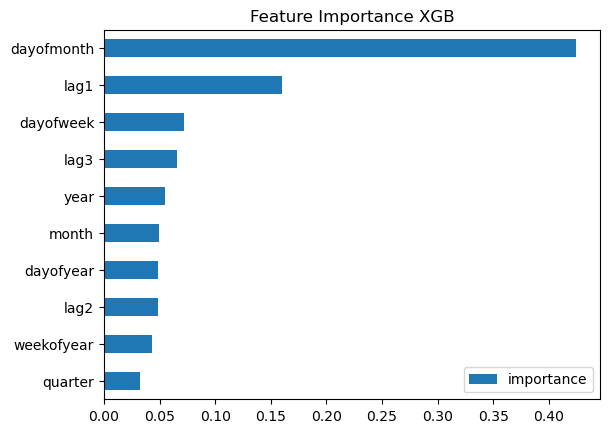

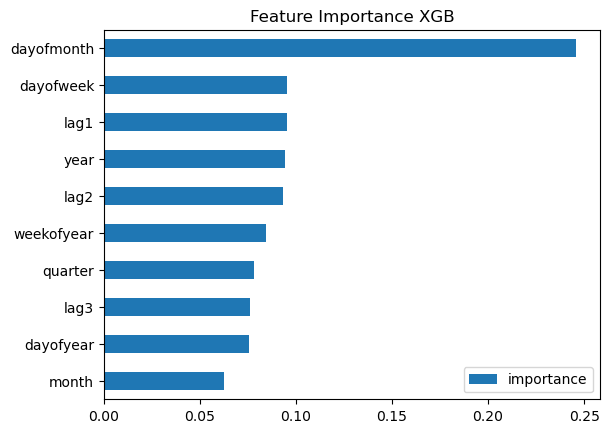

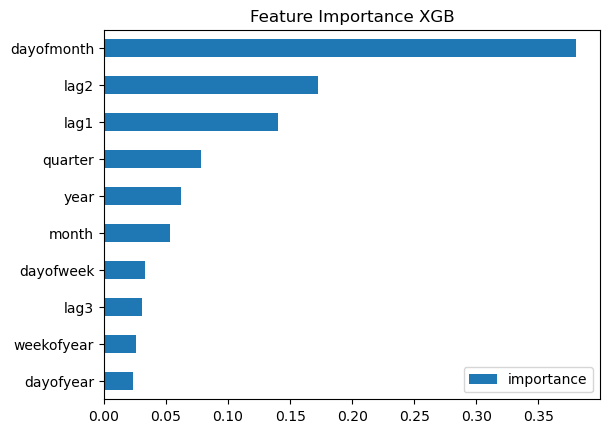

In [20]:
models = [xgb_copa, xgb_rec_propios, xgb_regalias]
i = 0
for model in models:
    
    fi = pd.DataFrame(data=model.feature_importances_,
             index=model.feature_names_in_,
             columns=['importance'])
    fi.sort_values('importance').plot(kind='barh', title='Feature Importance XGB')
    plt.show()


In [21]:
def plotear_predicciones(df_aux, model, X_test):
    df = df_aux.copy()
    test = df.copy()
    test['predictionLGBM'] = model.predict(X_test)
    df = df.merge(test[['predictionLGBM']], how='left', left_index=True, right_index=True)
    ax = df[df.columns[0]].plot(figsize=(15, 5))
    df['predictionLGBM'].plot(ax=ax)
    plt.legend(['Truth Data', 'predictionLGBM'])
    ax.set_title('Raw Dat and predictionLGBM')
    plt.show()

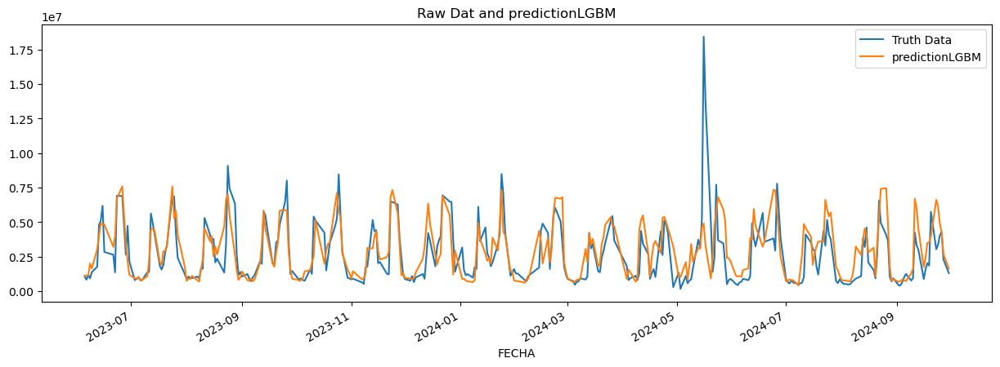

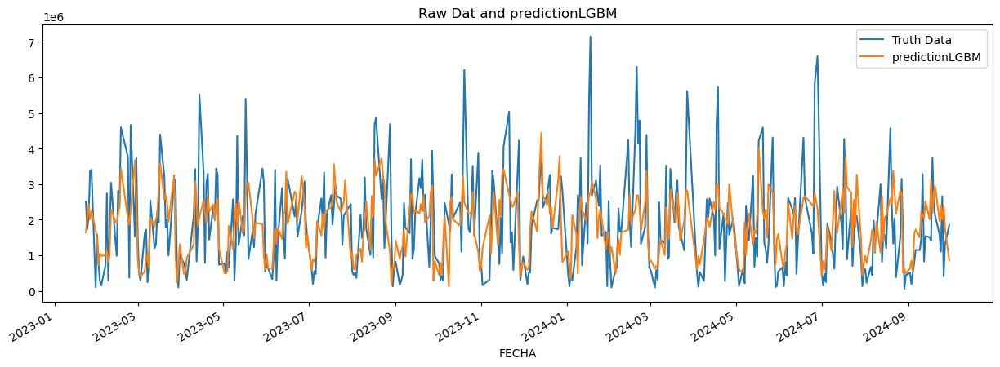

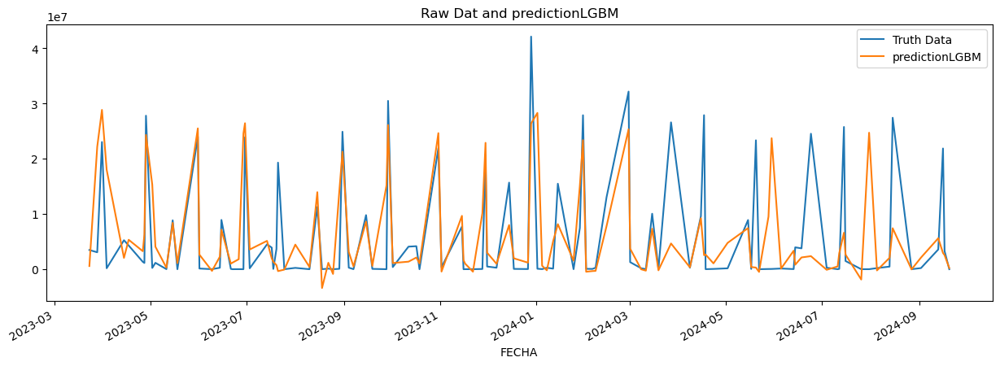

In [22]:
models = [xgb_copa, xgb_rec_propios, xgb_regalias]
X_test = [X_test_COPA, X_test_REC_PROPIOS, X_test_REGALIAS]

for i in range(len(dataframes)):
    plotear_predicciones(dataframes_test[i], models[i], X_test[i])

In [ ]:
import seaborn as sns

def plot_train_test_predictions(dataframes_train, dataframes_test, predictions_test, series_names, start_date=None):
  
    num_series = len(dataframes_train)
    fig, axes = plt.subplots(1, num_series, figsize=(20, 6), sharey=True)
    sns.set(style="whitegrid")

    for i in range(num_series):
        ax = axes[i]

        # Filtrar datos desde la fecha indicada (si se especifica)
        train = dataframes_train[i][start_date:] if start_date else dataframes_train[i]
        test = dataframes_test[i][start_date:] if start_date else dataframes_test[i]
        pred = predictions_test[i][start_date:] if start_date else predictions_test[i]
        # Graficar series
        #sns.lineplot(data=train, label='Train', ax=ax, color='#3477eb')
        #sns.lineplot(data=test, label='Test', ax=ax, color='green')
        #sns.lineplot(data=pred, ax=ax, color='#f72525', linestyle='--')
        ax.plot(train, label='Train', color='#3477eb')
        ax.plot(test, label='Test', color='green')
        ax.plot(pred, label='Predicciones', color='red', linestyle='--')
        
        # Configuración del gráfico
        ax.set_title(series_names[i], fontsize=14)
        ax.set_xlabel('Fecha')
        ax.set_ylabel('Valor')
        ax.legend(loc='best')
        ax.grid(True)

    plt.tight_layout()
    plt.show()

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_train_test_predictions(dataframes_train, dataframes_test, predictions_test, series_names, target_column, start_date=None):
    """
    Grafica las series de entrenamiento, prueba y predicciones.
    
    Parámetros:
    - dataframes_train: Lista de dataframes con los datos de entrenamiento.
    - dataframes_test: Lista de dataframes con los datos de prueba.
    - predictions_test: Lista de arreglos con las predicciones.
    - series_names: Lista de nombres para las series (uno por gráfico).
    - target_column: Nombre de la columna objetivo a graficar.
    - start_date: Fecha de inicio para filtrar las series (opcional).
    """
    sns.set(style="whitegrid")
    num_series = len(dataframes_train)
    fig, axes = plt.subplots(1, num_series, figsize=(20, 6), sharey=True)

    for i in range(num_series):
        ax = axes[i]

        # Filtrar datos desde la fecha indicada
        train = dataframes_train[i][titulos[i]][start_date:] if start_date else dataframes_train[i][titulos[i]]
        test = dataframes_test[i][titulos[i]][start_date:] if start_date else dataframes_test[i][titulos[i]]
        pred = predictions_test[i]  # Asumimos que ya tiene las predicciones alineadas con el índice de prueba
        
        # Graficar series
        ax.plot(train.index, train.values, label='Train', color='#3477eb')
        ax.plot(test.index, test.values, label='Test', color='green')
        ax.plot(test.index, pred, label='Predicciones', color='red', linestyle='--')

        # Configuración del gráfico
        ax.set_title(series_names[i], fontsize=14)
        ax.set_xlabel('Fecha')
        ax.set_ylabel('Valor')
        ax.legend(loc='best')
        ax.grid(True)

    plt.tight_layout()
    plt.show()


In [42]:
# models = [lgb_copa, lgb_rec_propios, lgb_regalias]
# X_test = [X_test_COPA, X_test_REC_PROPIOS, X_test_REGALIAS]
# X_train = [X_train_COPA, X_train_REC_PROPIOS, X_train_REGALIAS]
# y_pred_copa = lgb_copa.predict(X_test_COPA)
# y_pred_rec_propios = lgb_rec_propios.predict(X_test_REC_PROPIOS)
# y_pred_regalias = lgb_regalias.predict(X_test_REGALIAS)
# y_pred = [y_pred_copa, y_pred_rec_propios, y_pred_regalias]


# plot_train_test_predictions(
#     dataframes_train,       # Lista de dataframes de entrenamiento
#     dataframes_test,        # Lista de dataframes de prueba
#     y_pred,        # Lista de arreglos con las predicciones
#     titulos,       # Lista de nombres para los gráficos
#     target_column='hola',  # Nombre de la columna objetivo
#     start_date='2023-10-01'          # Fecha de inicio opcional
# )
    

In [23]:
from sklearn.metrics import mean_absolute_error as mae

models = [xgb_copa, xgb_rec_propios, xgb_regalias]
X_test = [X_test_COPA, X_test_REC_PROPIOS, X_test_REGALIAS]
y_test = [y_test_COPA, y_test_REC_PROPIOS, y_test_REGALIAS]

for i in range(len(models)):       
    rmse_score = np.sqrt(mean_squared_error(y_test[i], model.predict(X_test[i])))
    mae_score = mae(y_test[i], model.predict(X_test[i]))
    print(f'RMSE en conjunto de Test Modelo XGB: {rmse_score:0.2f}')
    print(f'MAE en conjunto de Test Modelo XGB: {mae_score:0.2f}')
    print('--------------')

RMSE en conjunto de Test Modelo XGB: 6190399.85
MAE en conjunto de Test Modelo XGB: 3598181.03
--------------
RMSE en conjunto de Test Modelo XGB: 6773735.25
MAE en conjunto de Test Modelo XGB: 4069939.65
--------------
RMSE en conjunto de Test Modelo XGB: 8688363.20
MAE en conjunto de Test Modelo XGB: 5021455.02
--------------


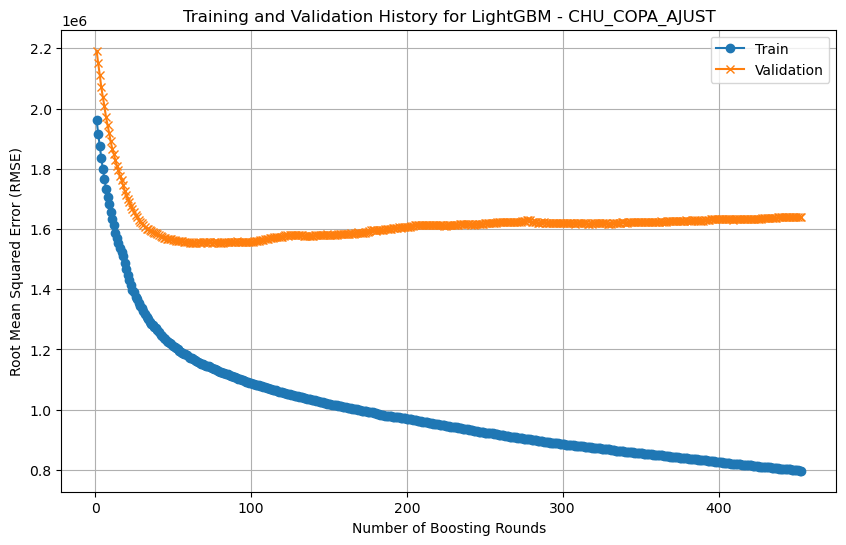

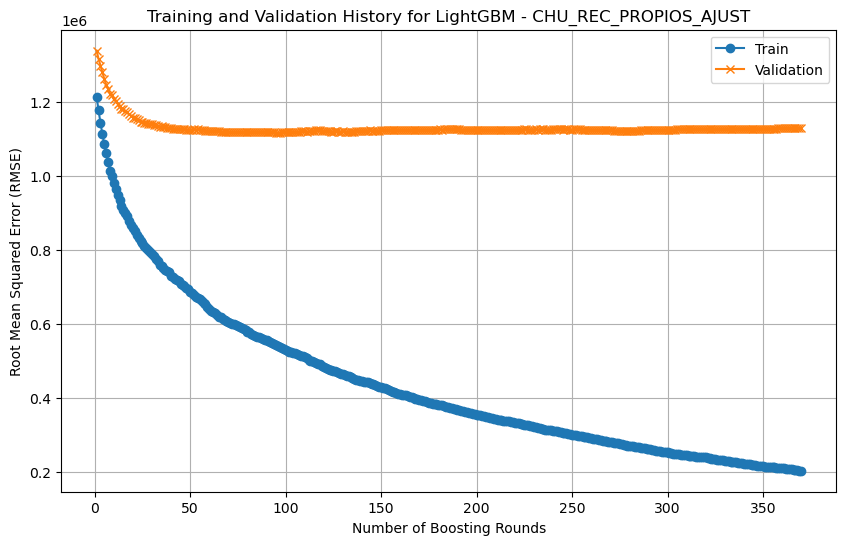

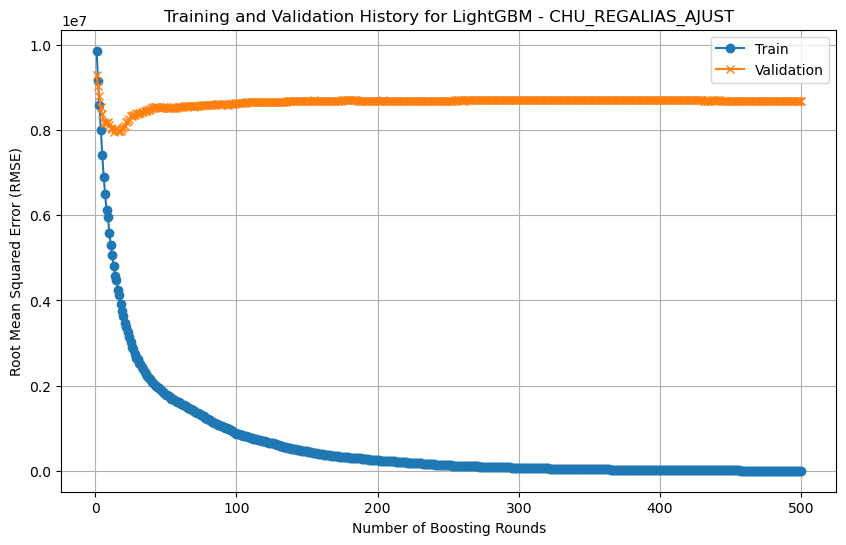

In [24]:
models = [xgb_copa, xgb_rec_propios, xgb_regalias]

for i in range(len(models)):

    resultsXGB = models[i].evals_result()
    train_error = resultsXGB['validation_0']['rmse']
    val_error = resultsXGB['validation_1']['rmse']

    # Número de rondas de boosting
    epoch = range(1, len(train_error) + 1)

    # Crear el gráfico
    plt.figure(figsize=(10, 6))
    plt.plot(epoch, train_error, label='Train', marker='o')
    plt.plot(epoch, val_error, label='Validation', marker='x')
    plt.xlabel('Number of Boosting Rounds')
    plt.ylabel('Root Mean Squared Error (RMSE)')
    plt.title(f'Training and Validation History for LightGBM - {titulos[i]}')
    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
dataframes[2].index.max()

Timestamp('2024-09-20 00:00:00')

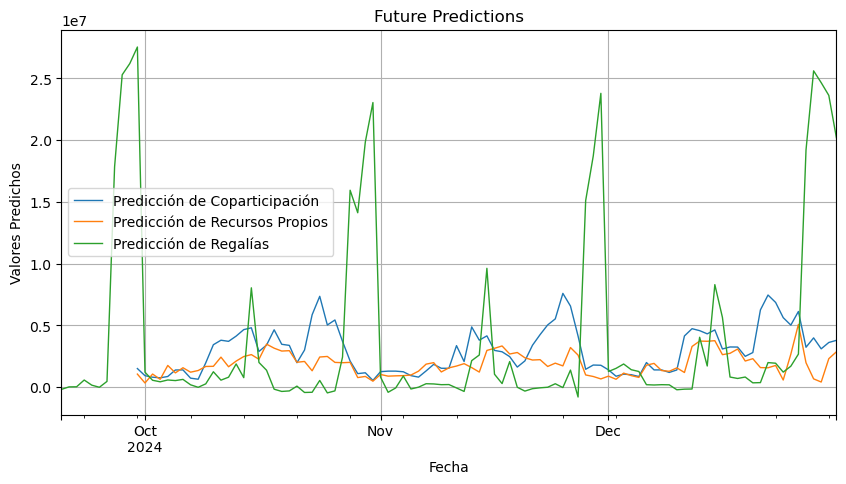

In [38]:
import matplotlib.pyplot as plt

models = [xgb_copa, xgb_rec_propios, xgb_regalias]
titles = ["Predicción de Coparticipación", "Predicción de Recursos Propios", "Predicción de Regalías"]

plt.figure(figsize=(10, 5))  # Crear una figura para graficar

for i in range(len(models)):
    df_aux = dataframes[i].copy()
    df_aux.drop(columns=['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 
                         'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3'], inplace=True)
    
    # Generar datos futuros
    future = pd.date_range(dataframes[i].index.max(), '2024-12-31', freq='1d')
    future_df = pd.DataFrame(index=future)
    future_df['isFuture'] = True
    df_aux['isFuture'] = False
    df_and_future = pd.concat([df_aux, future_df])
    
    # Agregar características de tiempo y lags
    time_features = df_and_future.index.to_series().apply(extract_time_features)
    df_and_future = pd.concat([df_and_future, time_features], axis=1)
    df_and_future = add_lags(df_and_future, titulos[i]) 
    
    # Predicciones futuras
    future_w_features = df_and_future.query('isFuture').copy()
    future_w_features['pred'] = models[i].predict(future_w_features[FEATURES])
    
    # Graficar las predicciones
    future_w_features['pred'].plot(
        ms=1,
        lw=1,
        label=titles[i]  # Etiqueta para la leyenda
    )

# Personalizar el gráfico
plt.title("Future Predictions")
plt.xlabel("Fecha")
plt.ylabel("Valores Predichos")
plt.legend()  # Mostrar leyenda
plt.grid(True)
plt.show()


In [4]:
!pip install skforecast

In [5]:
import skforecast
dir(skforecast)


['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'name']

In [2]:
#import skforecast as sk
# from skforecast import ForecasterAutoreg
from skforecast.ForecasterAutoreg import ForecasterAutoreg

ModuleNotFoundError: No module named 'skforecast.ForecasterAutoreg'

In [19]:
forecaster = sk.ForecasterAutoreg(
                 regressor = xgb.XGBRegressor(random_state=123),
                 lags = 24
             )

AttributeError: module 'skforecast' has no attribute 'ForecasterAutoreg'

In [ ]:
param_grid = {
    'n_estimators': [100, 500], # Numero de arboles a incluir en el modelo
    'max_depth': [3, 5, 10],   # Profundidad maxima de cada arbol
    'learning_rate': [0.01, 0.1]
}

# Lags used as predictors
lags_grid = [48, 72]

results_grid = grid_search_forecaster(
                   forecaster         = forecaster,    # Se pasa el objeto ForecasterAutoreg que se configuró anteriormente.
                   y                  = data.loc[:end_validation, 'users'], #  se pasa la serie temporal que se va a utilizar para entrenar y validar el modelo
                   param_grid         = param_grid,
                   lags_grid          = lags_grid,
                   steps              = 36,  # numero de pasos en el futuro que se desean predecir
                   refit              = False, # no se ajustara el modelo con los mejores hiperparametros encontrados
                   metric             = 'mean_squared_error',
                   initial_train_size = len(data_train), # se utilizara todos los datos de entrenamiento
                   fixed_train_size   = False, # en cada iteracion de la busqueda el modelo se ajustara a los datos disponibles hasta ese momento
                   return_best        = True, # la función devolvera el mejor modelo encontrado.
                   verbose            = False
               )